<span style="color: blue;font-weight: bold; font-size: 40px;">PyCaret: ISBSG-SDV Data Analysis & Regression </span>


In [1]:
# <span style="color: blue;">ISBSG Data Analysis & Regression</span>


In [2]:
import sys

print(sys.executable)

C:\Users\jdche\.conda\envs\pycaret311\python.exe


In [3]:
# # ISBSG Data Analysis and Regression Modeling
# 
# This notebook performs data cleaning, preprocessing, and regression modeling on the ISBSG dataset.

# ## Setup and Environment Configuration

# Install required packages (uncomment if needed)
#!pip install -r "../requirements.txt" --only-binary=all

In [4]:
# Import basic libraries
import joblib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pycaret
from datetime import datetime
import re
import seaborn as sns
import sklearn
import shap
import glob
import os

In [5]:
# Define the foler path
#models_folder = '../models'
#config_folder = '../config'
#skeleton_models_folder = '../skeleton_models'
#plots_folder = '../plots'
#temp_folder = '../temp'
#data_folder = '../data'
#logs_folder = '../logs'
#sample_file = 'sample_clean_a_agile_only_cleaned_no_add.csv'
#data_file = 'synthetic_isbsg2016r1_1_finance_sdv_generated.csv'

models_folder = '../seed'
config_folder = '../seed'
skeleton_models_folder = '../seed'
plots_folder = '../seed'
temp_folder = '../seed'
data_folder = '../seed'
logs_folder = '../seed'
#sample_file = 'sample_clean_a_agile_only_cleaned_no_add.csv'
#data_file = 'synthetic_isbsg2016r1_1_finance_sdv_generated.csv'


# Identify target column
TARGET_COL = 'project_prf_normalised_work_effort'
print(f"\nTarget variable: '{TARGET_COL}'")


Target variable: 'project_prf_normalised_work_effort'


<a id = 'Index:'></a>

# Table of Content

In this notebook you will apply xxxxxxx


- [Part 1](#part1)- Data Loading and Initial Exploration
- [Part 2](#part2)- Data Cleaning and Preprocessing
- [Part 3](#part3)- Data Profiling
- [Part 4](#part4)- Module Building with PyCaret
- [Part 5](#part5)- Model Preparation
- [Part 6](#part6)- Baseline Modeling and Evaluation
- [Part 7](#part7)- Advanced Modeling and Hyperparameter Tuning
- [Part 8](#part8)- Model Comparison and Selection
- [Part 9](#part9)- End


In [6]:
# Configure timestamp callback for Jupyter cells
from IPython import get_ipython

def setup_timestamp_callback():
    """Setup a timestamp callback for Jupyter cells without clearing existing callbacks."""
    ip = get_ipython()
    if ip is not None:
        # Define timestamp function
        def print_timestamp(*args, **kwargs):
            """Print timestamp after cell execution."""
            print(f"Cell executed at: {datetime.now()}")
        
        # Check if our callback is already registered
        callbacks = ip.events.callbacks.get('post_run_cell', [])
        for cb in callbacks:
            if hasattr(cb, '__name__') and cb.__name__ == 'print_timestamp':
                # Already registered
                return
                
        # Register new callback if not already present
        ip.events.register('post_run_cell', print_timestamp)
        print("Timestamp printing activated.")
    else:
        print("Not running in IPython/Jupyter environment.")

# Setup timestamp callback
setup_timestamp_callback()

# Set visualization style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

Timestamp printing activated.
Cell executed at: 2025-07-09 16:14:34.414795


[Back to top](#Index:)

<a id='part1'></a>

# Part 1 -Data Loading and Initial Exploration

This section is dedicated to loading the dataset, performing initial data exploration such as viewing the first few rows, and summarizing the dataset's characteristics, including missing values and basic statistical measures.

In [7]:
# Load the data

from pathlib import Path

print("Loading data...")

#file_path = f"{data_folder}/{data_file}"  #should use data_file
#file_name_no_ext = Path(file_path).stem                
#print(file_name_no_ext)


#df = pd.read_csv(file_path)

csv_files = glob.glob(f"../seed/*.csv")
dataframes = {}

for data_file_path in csv_files:
    data_file = os.path.basename(data_file_path)
    file_prefix = Path(data_file_path).stem
    print(file_prefix)

    # Store with prefix as key
    dataframes[file_prefix] = pd.read_csv(data_file_path)
    print(f"{file_prefix}: {dataframes[file_prefix].shape}")

# Process each dataframe
for file_prefix, df in dataframes.items():
    print(f"Processing {file_prefix}...")
    # Your processing code here

Loading data...
synthetic_cleaned_communication
synthetic_cleaned_communication: (10000, 86)
synthetic_cleaned_financial
synthetic_cleaned_financial: (10000, 88)
synthetic_cleaned_government
synthetic_cleaned_government: (10000, 92)
synthetic_cleaned_insurance
synthetic_cleaned_insurance: (10000, 82)
synthetic_cleaned_medical
synthetic_cleaned_medical: (10000, 88)
synthetic_cleaned_serviceindustry
synthetic_cleaned_serviceindustry: (10000, 107)
Processing synthetic_cleaned_communication...
Processing synthetic_cleaned_financial...
Processing synthetic_cleaned_government...
Processing synthetic_cleaned_insurance...
Processing synthetic_cleaned_medical...
Processing synthetic_cleaned_serviceindustry...
Cell executed at: 2025-07-09 16:14:35.098605


Processing synthetic_cleaned_communication...


# Exploratory Data Analysis

## Data Overview

Dataset shape: (10000, 86)
First 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,project_prf_team_size_group_Missing,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Missing,tech_tf_client_server_No,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_No,tech_tf_dbms_used_Yes
0,30903,2012,missing,PERIPHONICS,159.178590,4132,4491,29.795160,29.478502,30.897938,...,False,False,False,False,False,False,False,False,False,False
1,19368,2015,customer billing,C++,33.572376,2665,2710,28.867180,28.013252,8.176883,...,False,False,False,False,False,False,False,True,False,False
2,30020,2014,telecom & network management,DRIFT,150.654970,280,295,3.818757,3.966187,65.029205,...,False,False,False,False,False,False,False,False,False,False
3,24104,2014,integration,PERIPHONICS,312.397400,7722,7833,11.115693,11.283243,89.350700,...,False,False,False,False,False,False,False,False,False,False
4,25004,2015,integration,Doc1 Designer (Entorno visual),60.371437,2675,2669,20.621098,19.943085,25.096842,...,False,False,False,False,False,False,False,False,False,False


Last 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,project_prf_team_size_group_Missing,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Missing,tech_tf_client_server_No,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_No,tech_tf_dbms_used_Yes
9995,31411,2013,broadband application,C,56.976326,2293,2348,23.142176,22.963356,14.995863,...,False,False,False,False,False,False,False,False,False,False
9996,14715,2015,customer relationship management,Java,88.629166,930,930,6.068853,6.243379,87.700460,...,False,False,False,False,False,False,False,False,False,False
9997,14701,2002,workflow support & management,ASAP,109.458824,1324,1241,17.928658,18.041525,17.354155,...,False,False,False,False,False,False,False,False,False,False
9998,30561,2015,financial transaction processing & accounting,C++,81.919410,1941,1841,6.172868,6.176760,18.792055,...,False,False,False,False,False,False,False,False,False,False
9999,30875,2014,logistic or supply planning & control,C,45.746883,847,871,48.371610,47.440292,4.176493,...,False,False,False,False,False,False,False,False,False,False


## Duplicate Rows

Number of duplicate rows: 0


## Data Types and Memory Usage

,Data Type,Memory Usage (MB)
Index,NaN,0.000126
external_eef_industry_sector_Communication,bool,0.009537
external_eef_organisation_type_communications,int64,0.076294
external_eef_organisation_type_general_public_mobile_phone_end_user,int64,0.076294
external_eef_organisation_type_media,int64,0.076294
...,...,...
tech_tf_language_type_3GL,bool,0.009537
tech_tf_language_type_4GL,bool,0.009537
tech_tf_language_type_Missing,bool,0.009537
tech_tf_primary_programming_language,object,0.597673


## Unique Values Per Column

isbsg_project_id: 620 unique values
project_prf_year_of_project: 18 unique values
project_prf_application_type: 44 unique values
tech_tf_primary_programming_language: 28 unique values
project_prf_functional_size: 9999 unique values
project_prf_normalised_work_effort_level_1: 4775 unique values
project_prf_normalised_work_effort: 4770 unique values
project_prf_normalised_level_1_pdr_ufp: 9995 unique values
project_prf_normalised_pdr_ufp: 9991 unique values
project_prf_speed_of_delivery: 9998 unique values
project_prf_project_elapsed_time: 9997 unique values
process_pmf_docs: 15 unique values
tech_tf_tools_used: 6 unique values
project_prf_max_team_size: 8 unique values
external_eef_organisation_type_communications: 2 unique values
external_eef_organisation_type_general_public_mobile_phone_end_user: 2 unique values
external_eef_organisation_type_media: 2 unique values
external_eef_organisation_type_telecom: 2 unique values
external_eef_organisation_type_telecom_and_networking: 2 unique v

## Type Conversion Suggestions

Consider converting to 'category' dtype for memory/performance:
['project_prf_application_type', 'tech_tf_primary_programming_language']


## Summary Statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
isbsg_project_id,10000.000000,nan,nan,nan,21224.688000,6813.497943,10003.000000,14993.000000,21030.000000,27071.500000,32762.000000
project_prf_year_of_project,10000.000000,nan,nan,nan,2012.724600,3.289899,1998.000000,2012.000000,2014.000000,2015.000000,2015.000000
project_prf_application_type,10000,44,customer relationship management,3396,nan,nan,nan,nan,nan,nan,nan
tech_tf_primary_programming_language,10000,28,Java,2306,nan,nan,nan,nan,nan,nan,nan
project_prf_functional_size,10000.000000,nan,nan,nan,144.605905,105.081102,23.000000,68.464756,116.612932,187.874865,907.604300
project_prf_normalised_work_effort_level_1,10000.000000,nan,nan,nan,2522.774800,2351.995612,171.000000,827.000000,1804.500000,3465.000000,21018.000000
project_prf_normalised_work_effort,10000.000000,nan,nan,nan,2525.210600,2364.528644,171.000000,831.750000,1800.000000,3451.250000,21453.000000
project_prf_normalised_level_1_pdr_ufp,10000.000000,nan,nan,nan,18.265127,12.354895,1.000000,9.235174,15.423022,24.386979,109.984100
project_prf_normalised_pdr_ufp,10000.000000,nan,nan,nan,18.109562,12.002943,1.000000,9.323298,15.428718,24.134640,106.065735
project_prf_speed_of_delivery,10000.000000,nan,nan,nan,32.304827,24.397252,1.600000,14.382228,26.012790,43.467973,200.027390


## Missing Values

,Missing Values,Percentage (%)
project_prf_max_team_size,9738,97.380000


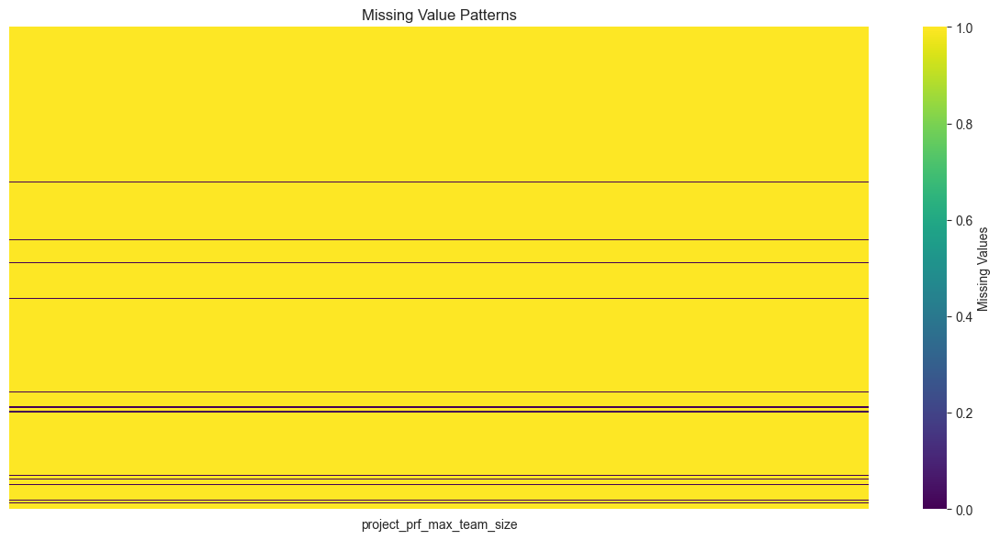

## Distribution of Numerical Features

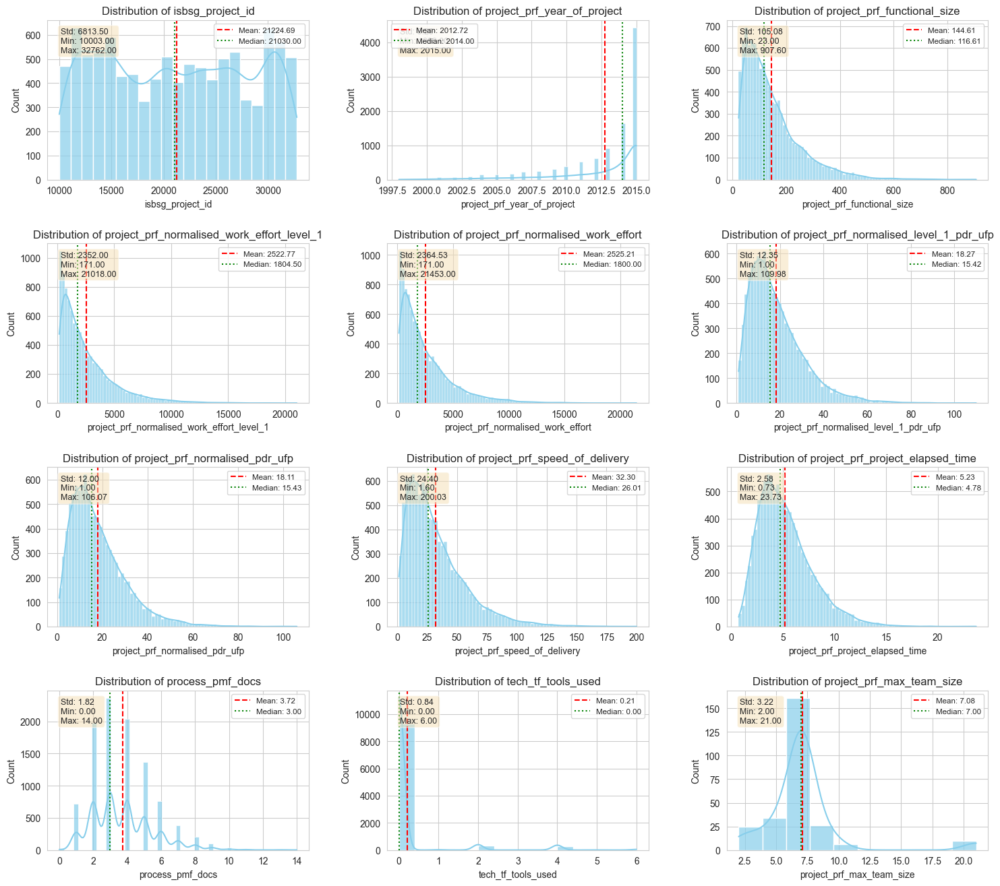

## Correlation Matrix

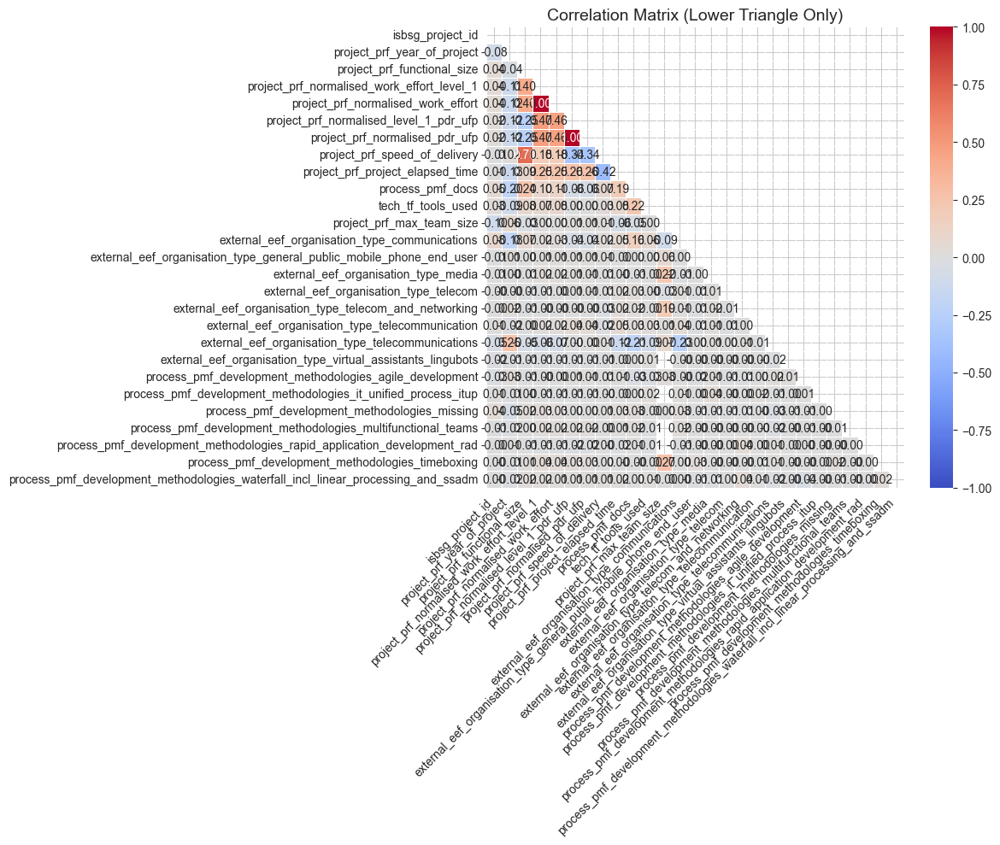

## Top Correlations

project_prf_functional_size — project_prf_speed_of_delivery: 0.70
project_prf_speed_of_delivery — project_prf_functional_size: 0.70
project_prf_normalised_work_effort_level_1 — project_prf_normalised_pdr_ufp: 0.47
project_prf_normalised_work_effort_level_1 — project_prf_normalised_level_1_pdr_ufp: 0.47
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_work_effort_level_1: 0.47
project_prf_normalised_pdr_ufp — project_prf_normalised_work_effort_level_1: 0.47
project_prf_normalised_work_effort — project_prf_normalised_level_1_pdr_ufp: 0.46
project_prf_normalised_work_effort — project_prf_normalised_pdr_ufp: 0.46
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_work_effort: 0.46
project_prf_normalised_pdr_ufp — project_prf_normalised_work_effort: 0.46
project_prf_speed_of_delivery — project_prf_project_elapsed_time: -0.42
project_prf_project_elapsed_time — project_prf_speed_of_delivery: -0.42
project_prf_normalised_work_effort_level_1 — project_prf_functional_

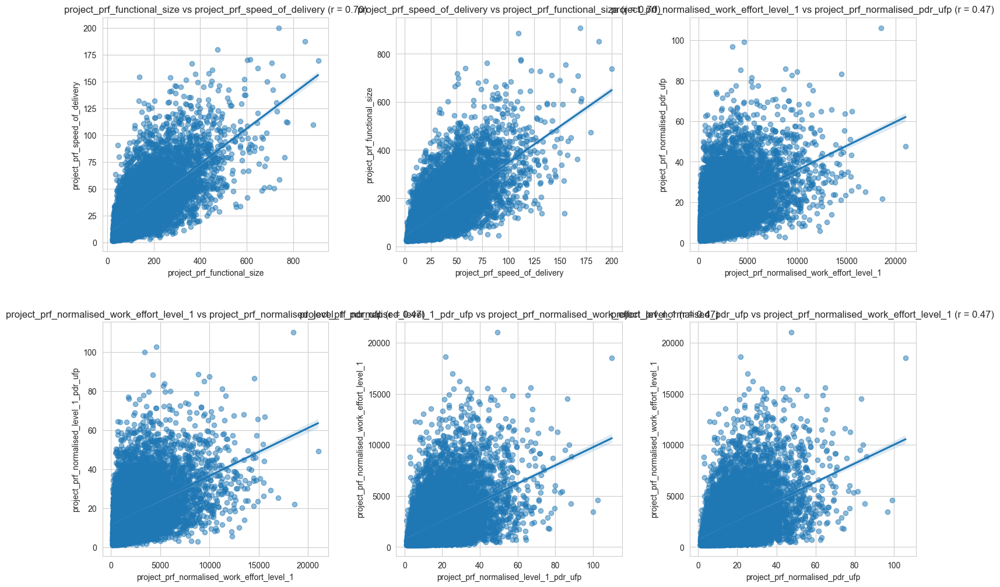

## Categorical Features

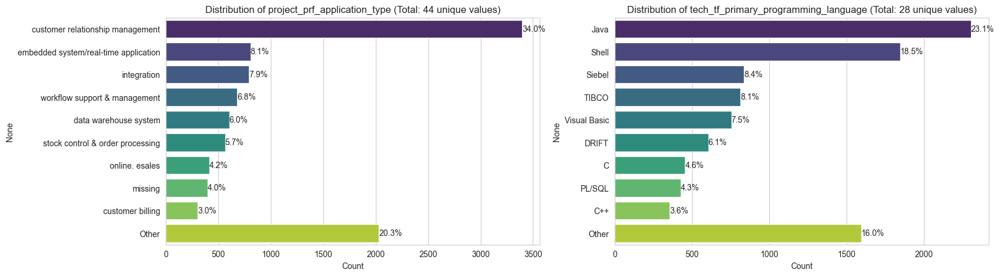

## Categorical-Numerical Relationships

Processing synthetic_cleaned_financial...


# Exploratory Data Analysis

## Data Overview

Dataset shape: (10000, 88)
First 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,tech_tf_architecture_Multi_tier_with_web_public_interface,tech_tf_architecture_Stand_alone,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_Yes
0,27958,2014,operating system or software utility,COBOL,1034,10726,10081,11.696281,12.948257,163.020780,...,False,False,False,False,False,False,True,False,False,False
1,22302,2014,financial transaction process/accounting,C#,165,4734,4888,98.707490,99.065094,93.180780,...,False,True,False,False,False,False,False,False,False,True
2,27537,2014,financial transaction process/accounting,COBOL,338,5326,5049,12.050821,12.654269,8.260489,...,False,False,True,True,False,False,False,False,False,False
3,24248,2014,financial transaction process/accounting,iOS,1224,26923,25188,48.256607,56.333763,88.034250,...,False,False,False,False,False,False,False,False,False,False
4,15464,2014,financial transaction process/accounting; work...,Java,12,20,19,2.716181,3.251176,0.719434,...,False,False,False,False,False,False,False,False,False,False


Last 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,tech_tf_architecture_Multi_tier_with_web_public_interface,tech_tf_architecture_Stand_alone,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_Yes
9995,30345,2014,missing,COBOL,178,6529,6572,26.030525,30.745388,24.786749,...,False,True,False,False,False,False,False,False,False,False
9996,28393,2014,business application,COBOL,32,1067,924,9.481010,8.895204,4.305357,...,False,True,False,True,False,False,False,False,False,False
9997,12425,2014,financial transaction process/accounting,C#,11,203,228,7.713402,11.957859,1.750848,...,False,False,False,False,False,False,False,False,True,False
9998,15589,2014,financial transaction process/accounting,Java,572,3839,3939,9.742521,10.630406,50.756820,...,False,False,False,False,True,False,False,False,False,False
9999,20995,2014,business application,C#,602,2723,3054,1.717346,2.226834,6.329076,...,False,False,False,False,False,False,False,False,False,False


## Duplicate Rows

Number of duplicate rows: 0


## Data Types and Memory Usage

,Data Type,Memory Usage (MB)
Index,NaN,0.000126
external_eef_industry_sector_Banking,bool,0.009537
external_eef_industry_sector_Financial,bool,0.009537
external_eef_organisation_type_banking,int64,0.076294
external_eef_organisation_type_banking_insurance_stock,int64,0.076294
...,...,...
tech_tf_language_type_4GL,bool,0.009537
tech_tf_language_type_5GL,bool,0.009537
tech_tf_language_type_Missing,bool,0.009537
tech_tf_primary_programming_language,object,0.590341


## Unique Values Per Column

isbsg_project_id: 185 unique values
project_prf_year_of_project: 1 unique values
project_prf_application_type: 15 unique values
tech_tf_primary_programming_language: 29 unique values
project_prf_functional_size: 1552 unique values
project_prf_normalised_work_effort_level_1: 6242 unique values
project_prf_normalised_work_effort: 6131 unique values
project_prf_normalised_level_1_pdr_ufp: 10000 unique values
project_prf_normalised_pdr_ufp: 10000 unique values
project_prf_speed_of_delivery: 10000 unique values
project_prf_manpower_delivery_rate: 8660 unique values
project_prf_project_elapsed_time: 9999 unique values
project_prf_max_team_size: 29 unique values
process_pmf_docs: 15 unique values
tech_tf_tools_used: 6 unique values
external_eef_organisation_type_banking_insurance_stock: 2 unique values
external_eef_organisation_type_banking: 2 unique values
external_eef_organisation_type_communications: 2 unique values
external_eef_organisation_type_education_institution: 2 unique values
exte

## Type Conversion Suggestions

Consider converting to 'category' dtype for memory/performance:
['project_prf_application_type', 'tech_tf_primary_programming_language']


## Summary Statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
isbsg_project_id,10000.000000,nan,nan,nan,22037.489700,6580.498141,10066.000000,16143.000000,22265.000000,27765.000000,32725.000000
project_prf_year_of_project,10000.000000,nan,nan,nan,2014.000000,0.000000,2014.000000,2014.000000,2014.000000,2014.000000,2014.000000
project_prf_application_type,10000,15,financial transaction process/accounting,5970,nan,nan,nan,nan,nan,nan,nan
tech_tf_primary_programming_language,10000,29,COBOL,2592,nan,nan,nan,nan,nan,nan,nan
project_prf_functional_size,10000.000000,nan,nan,nan,348.444000,454.616489,3.000000,45.000000,178.000000,474.000000,4481.000000
project_prf_normalised_work_effort_level_1,10000.000000,nan,nan,nan,4964.031600,6136.538347,9.000000,715.000000,2736.500000,6910.250000,50446.000000
project_prf_normalised_work_effort,10000.000000,nan,nan,nan,4660.012200,5505.023175,9.000000,740.000000,2709.000000,6646.000000,41929.000000
project_prf_normalised_level_1_pdr_ufp,10000.000000,nan,nan,nan,25.471366,28.213107,1.400034,5.778440,15.411262,35.250446,252.555220
project_prf_normalised_pdr_ufp,10000.000000,nan,nan,nan,27.329007,29.395220,1.400102,6.575956,17.277785,37.681299,252.893000
project_prf_speed_of_delivery,10000.000000,nan,nan,nan,38.673084,50.183717,0.300000,5.250520,19.564753,52.888933,553.097200


## Missing Values

,Missing Values,Percentage (%)
project_prf_manpower_delivery_rate,1339,13.390000


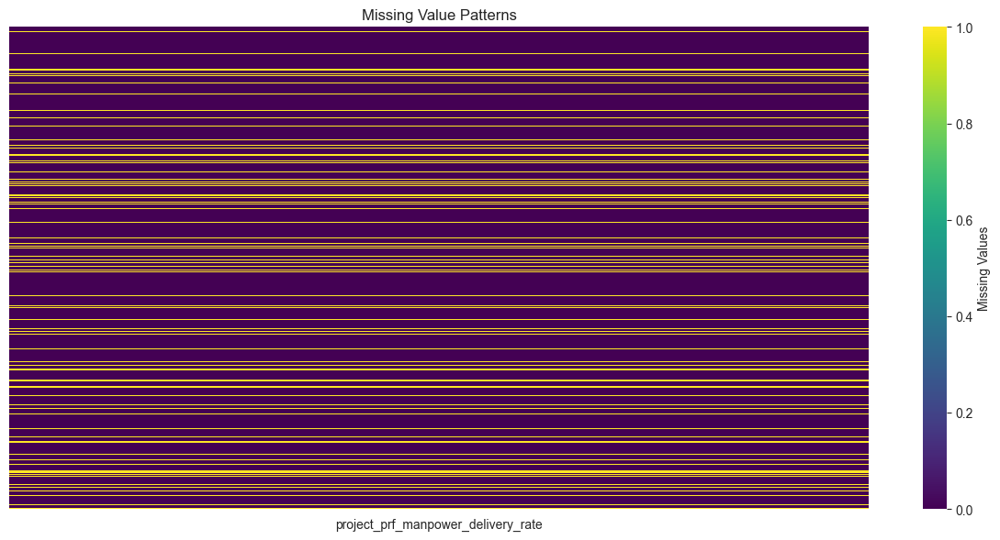

## Distribution of Numerical Features

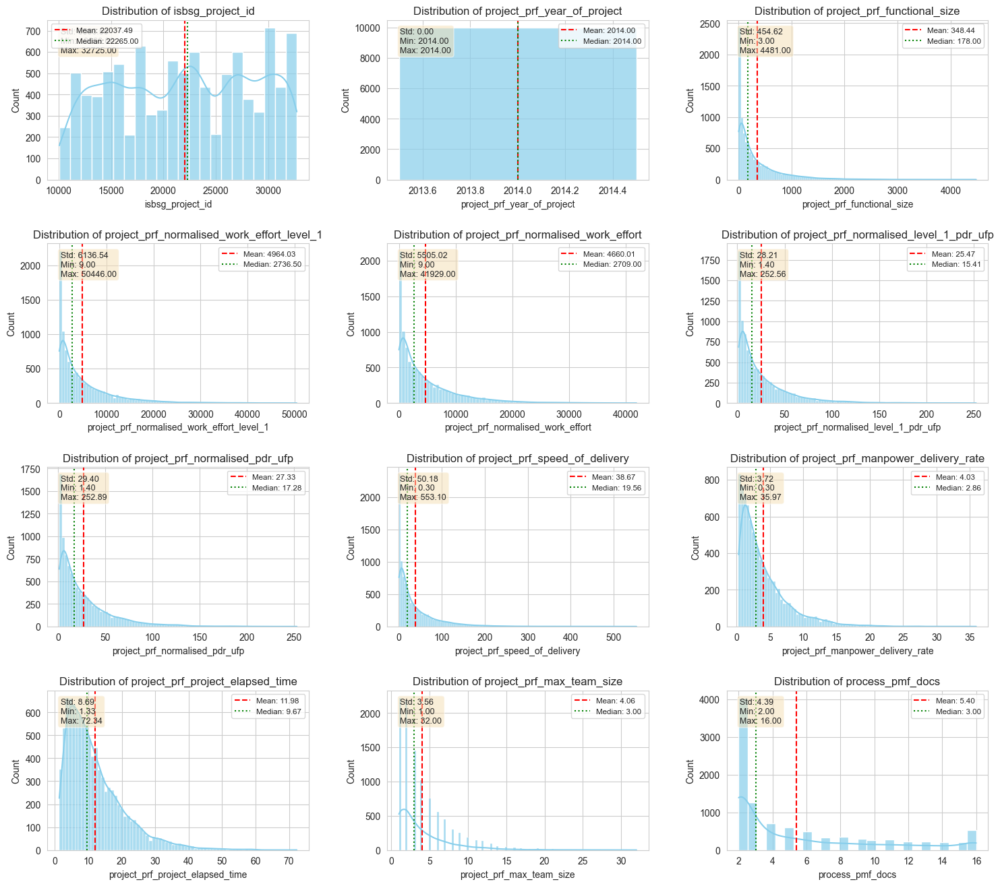

## Correlation Matrix

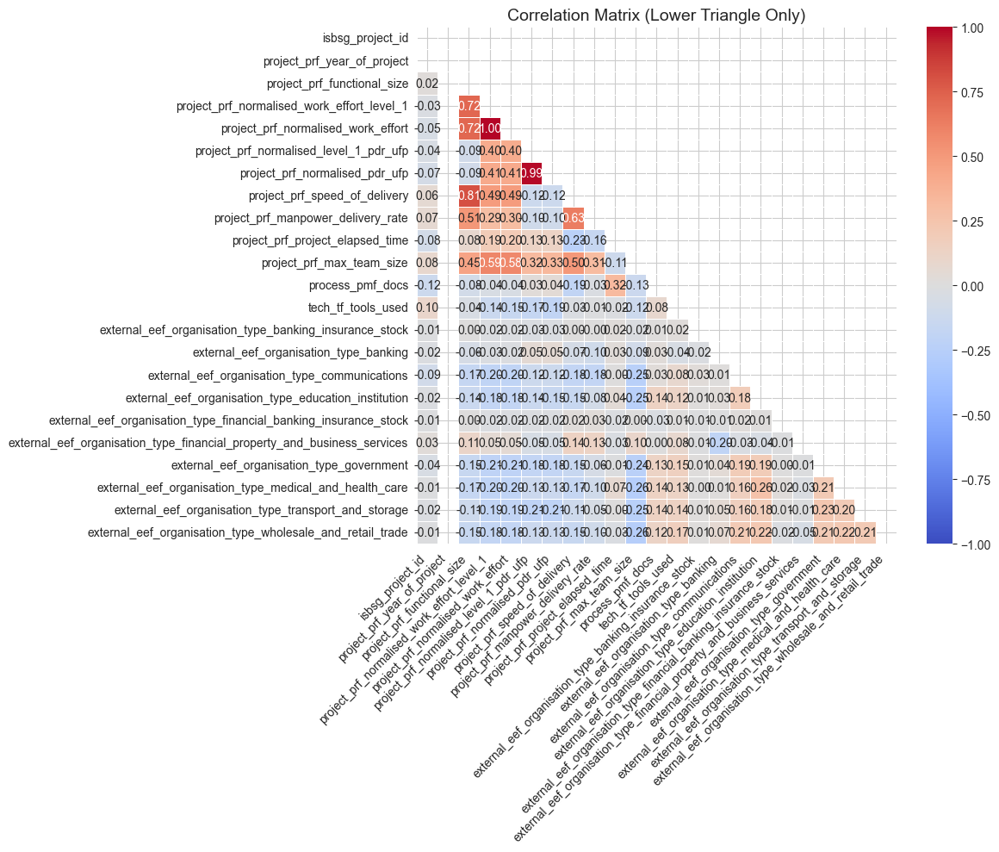

## Top Correlations

project_prf_normalised_pdr_ufp — project_prf_normalised_level_1_pdr_ufp: 0.99
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_pdr_ufp: 0.99
project_prf_speed_of_delivery — project_prf_functional_size: 0.81
project_prf_functional_size — project_prf_speed_of_delivery: 0.81
project_prf_functional_size — project_prf_normalised_work_effort_level_1: 0.72
project_prf_normalised_work_effort_level_1 — project_prf_functional_size: 0.72
project_prf_normalised_work_effort — project_prf_functional_size: 0.72
project_prf_functional_size — project_prf_normalised_work_effort: 0.72
project_prf_manpower_delivery_rate — project_prf_speed_of_delivery: 0.63
project_prf_speed_of_delivery — project_prf_manpower_delivery_rate: 0.63
project_prf_max_team_size — project_prf_normalised_work_effort_level_1: 0.59
project_prf_normalised_work_effort_level_1 — project_prf_max_team_size: 0.59
project_prf_normalised_work_effort — project_prf_max_team_size: 0.58
project_prf_max_team_size — project_prf_nor

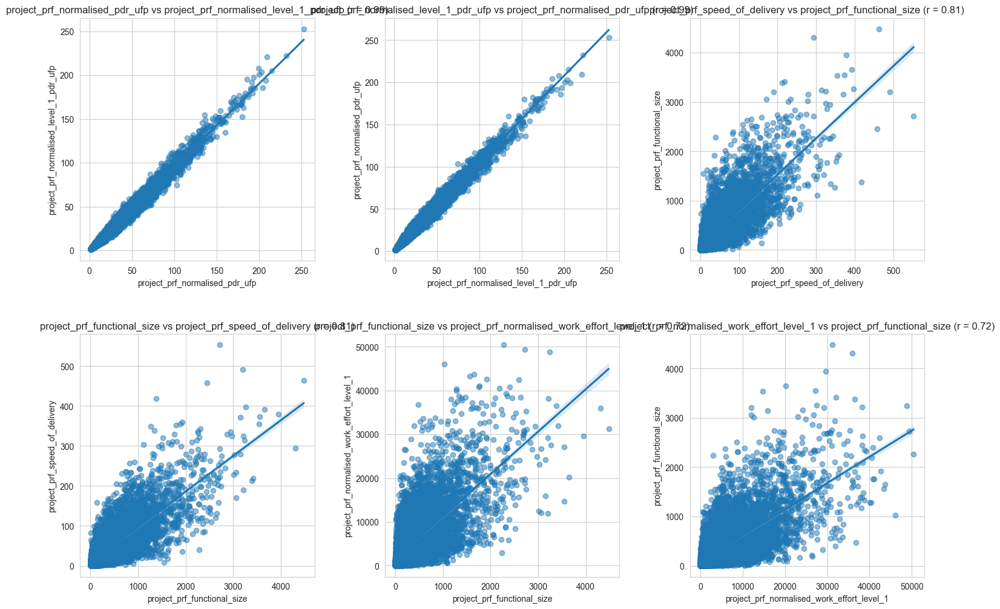

## Categorical Features

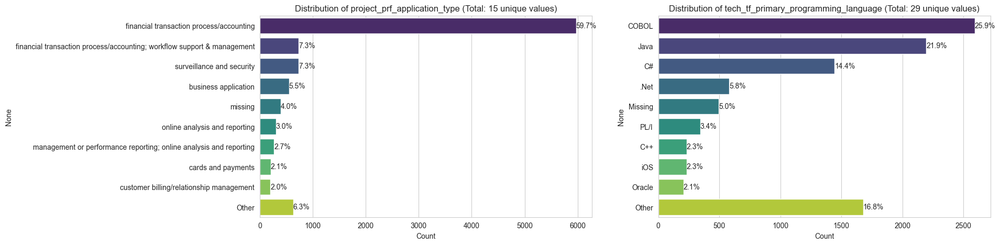

## Categorical-Numerical Relationships

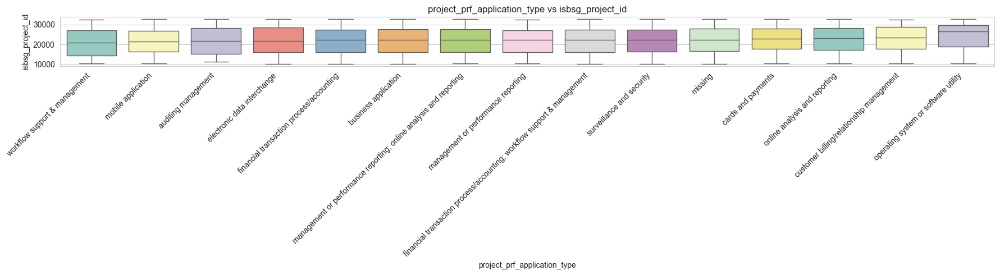

Processing synthetic_cleaned_government...


# Exploratory Data Analysis

## Data Overview

Dataset shape: (10000, 92)
First 5 rows:


,isbsg_project_id,project_prf_year_of_project,external_eef_organisation_type,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,...,project_prf_cost_currency_Missing,project_prf_cost_currency_New_Zealand_dollar,project_prf_cost_currency_United_Kingdom_pound_sterling,project_prf_cost_currency_United_States_dollar,project_prf_currency_multiple_Missing,project_prf_currency_multiple_No,project_prf_currency_multiple_Yes_10_000,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes
0,29396,2007,defence; government,financial transaction process/accounting,COBOL,218,10067,10376,37.202732,37.985497,...,True,False,False,False,True,False,False,False,False,False
1,14130,2008,government,business application,COOL:Gen,350,1147,654,9.469624,7.202708,...,True,False,False,False,False,False,False,False,False,False
2,29821,2008,government,missing,Oracle,175,1829,1280,12.038140,10.454736,...,False,False,False,False,True,False,False,False,False,False
3,18361,2008,government,missing,Oracle,27,2575,2196,19.293343,18.629545,...,True,False,False,False,True,False,False,False,False,False
4,25816,2011,government,missing,Java,30,2076,1582,31.583110,29.354956,...,False,False,False,False,True,False,False,False,False,False


Last 5 rows:


,isbsg_project_id,project_prf_year_of_project,external_eef_organisation_type,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,...,project_prf_cost_currency_Missing,project_prf_cost_currency_New_Zealand_dollar,project_prf_cost_currency_United_Kingdom_pound_sterling,project_prf_cost_currency_United_States_dollar,project_prf_currency_multiple_Missing,project_prf_currency_multiple_No,project_prf_currency_multiple_Yes_10_000,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes
9995,25160,2007,government,customer billing/relationship management,PHP,201,1901,1423,9.200465,8.805442,...,True,False,False,True,True,False,False,False,False,False
9996,23080,2009,government,business application,PHP,271,9172,8478,37.361492,33.294804,...,False,False,False,False,True,False,False,False,False,False
9997,13099,2009,government,reporting,COBOL,609,11907,11648,34.073470,34.674010,...,True,False,False,False,False,False,False,False,False,False
9998,11536,2011,government,business application,Java,96,2767,2273,21.025484,20.091845,...,True,False,False,False,False,False,False,False,False,False
9999,21491,2008,government,business application,COBOL,76,570,404,7.285457,7.303969,...,True,False,False,False,False,True,False,False,False,False


## Duplicate Rows

Number of duplicate rows: 0


## Data Types and Memory Usage

,Data Type,Memory Usage (MB)
Index,NaN,0.000126
external_eef_industry_sector_Government,bool,0.009537
external_eef_organisation_type,object,0.680342
functional_size_group_L_1000_2999,bool,0.009537
functional_size_group_M_100_999,bool,0.009537
...,...,...
tech_tf_language_type_5GL,bool,0.009537
tech_tf_language_type_ApG,bool,0.009537
tech_tf_language_type_Missing,bool,0.009537
tech_tf_primary_programming_language,object,0.595334


## Unique Values Per Column

isbsg_project_id: 315 unique values
project_prf_year_of_project: 18 unique values
external_eef_organisation_type: 14 unique values
project_prf_application_type: 62 unique values
tech_tf_primary_programming_language: 29 unique values
project_prf_functional_size: 1153 unique values
project_prf_normalised_work_effort_level_1: 6308 unique values
project_prf_normalised_work_effort: 6068 unique values
project_prf_normalised_level_1_pdr_ufp: 9998 unique values
project_prf_normalised_pdr_ufp: 9999 unique values
project_prf_defect_density: 9759 unique values
project_prf_speed_of_delivery: 9999 unique values
project_prf_manpower_delivery_rate: 9776 unique values
project_prf_project_elapsed_time: 3150 unique values
project_prf_max_team_size: 9998 unique values
process_pmf_docs: 17 unique values
tech_tf_tools_used: 9 unique values
project_prf_total_project_cost: 9797 unique values
process_pmf_development_methodologies_agile_development: 2 unique values
process_pmf_development_methodologies_iterati

## Type Conversion Suggestions

Consider converting to 'category' dtype for memory/performance:
['external_eef_organisation_type', 'project_prf_application_type', 'tech_tf_primary_programming_language']


## Summary Statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
isbsg_project_id,10000.000000,nan,nan,nan,21371.037600,6380.759438,10249.000000,15720.000000,21726.000000,26209.000000,32756.000000
project_prf_year_of_project,10000.000000,nan,nan,nan,2008.159600,2.669727,1998.000000,2006.000000,2008.000000,2010.000000,2015.000000
external_eef_organisation_type,10000,14,government,7297,nan,nan,nan,nan,nan,nan,nan
project_prf_application_type,10000,62,financial transaction process/accounting,3416,nan,nan,nan,nan,nan,nan,nan
tech_tf_primary_programming_language,10000,29,COBOL,2113,nan,nan,nan,nan,nan,nan,nan
project_prf_functional_size,10000.000000,nan,nan,nan,262.111900,283.475504,5.000000,62.000000,166.000000,365.000000,2501.000000
project_prf_normalised_work_effort_level_1,10000.000000,nan,nan,nan,4843.303500,5572.225399,26.000000,1017.000000,2908.000000,6718.250000,62142.000000
project_prf_normalised_work_effort,10000.000000,nan,nan,nan,4684.380800,5980.268074,26.000000,701.750000,2448.500000,6410.500000,67293.000000
project_prf_normalised_level_1_pdr_ufp,10000.000000,nan,nan,nan,20.009982,17.106285,1.067457,7.576786,15.253787,27.289383,190.500000
project_prf_normalised_pdr_ufp,10000.000000,nan,nan,nan,20.248371,17.574222,1.078654,7.495273,15.150156,27.830056,190.500000


## Missing Values

,Missing Values,Percentage (%)
project_prf_defect_density,238,2.380000
project_prf_manpower_delivery_rate,221,2.210000
project_prf_total_project_cost,202,2.020000


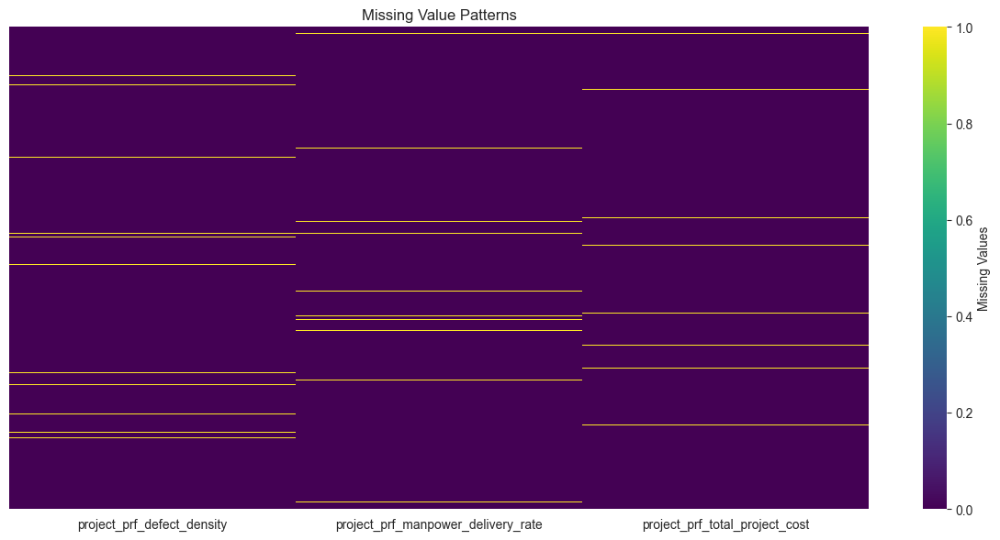

## Distribution of Numerical Features

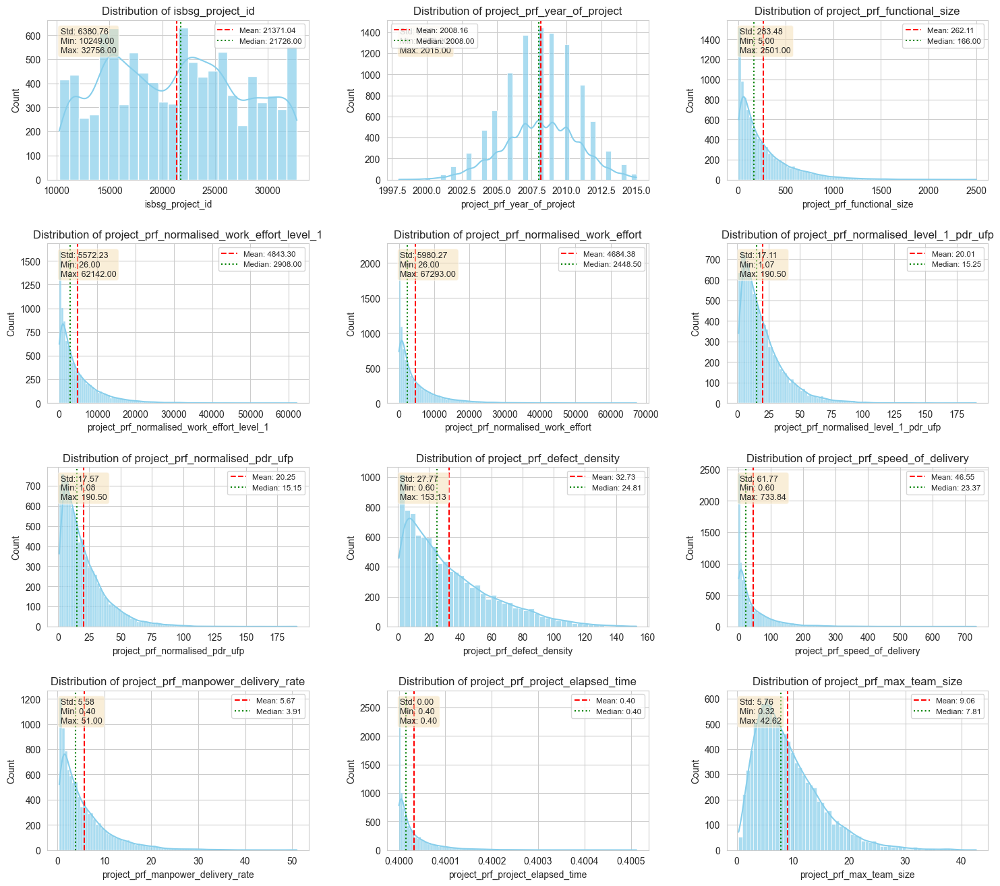

## Correlation Matrix

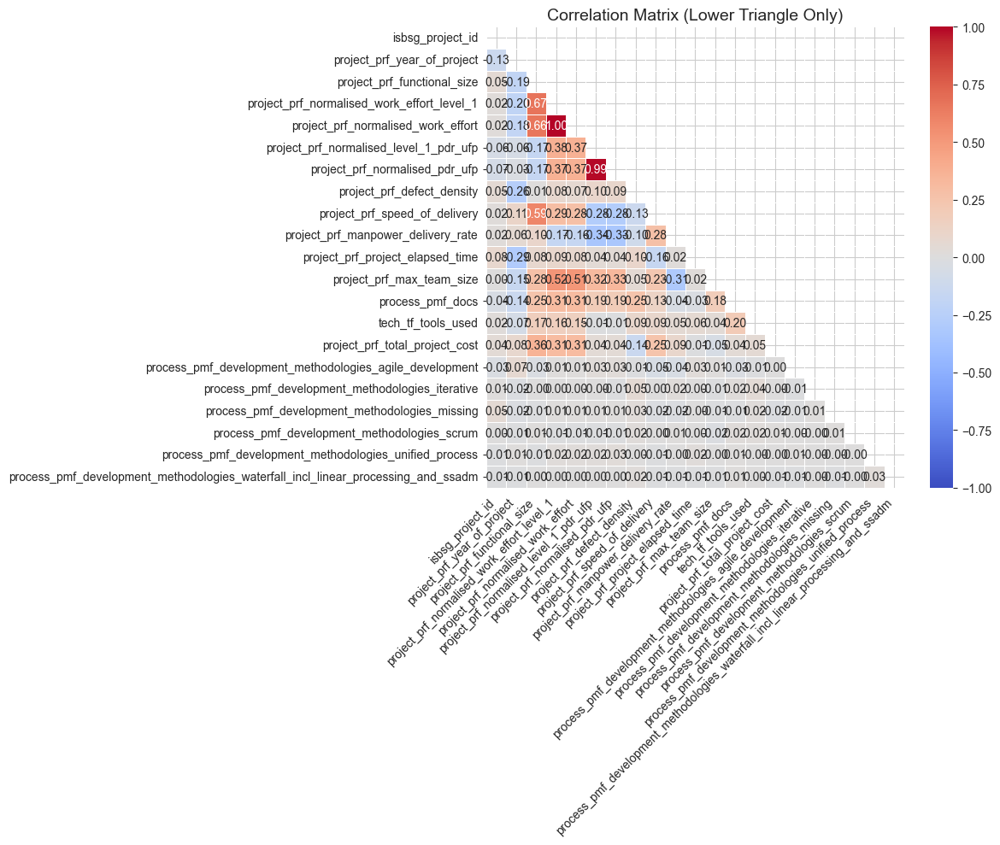

## Top Correlations

project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_pdr_ufp: 0.99
project_prf_normalised_pdr_ufp — project_prf_normalised_level_1_pdr_ufp: 0.99
project_prf_functional_size — project_prf_normalised_work_effort_level_1: 0.67
project_prf_normalised_work_effort_level_1 — project_prf_functional_size: 0.67
project_prf_functional_size — project_prf_normalised_work_effort: 0.66
project_prf_normalised_work_effort — project_prf_functional_size: 0.66
project_prf_speed_of_delivery — project_prf_functional_size: 0.59
project_prf_functional_size — project_prf_speed_of_delivery: 0.59
project_prf_max_team_size — project_prf_normalised_work_effort_level_1: 0.52
project_prf_normalised_work_effort_level_1 — project_prf_max_team_size: 0.52
project_prf_normalised_work_effort — project_prf_max_team_size: 0.51
project_prf_max_team_size — project_prf_normalised_work_effort: 0.51
project_prf_normalised_work_effort_level_1 — project_prf_normalised_level_1_pdr_ufp: 0.38
project_prf_normalised_level_1

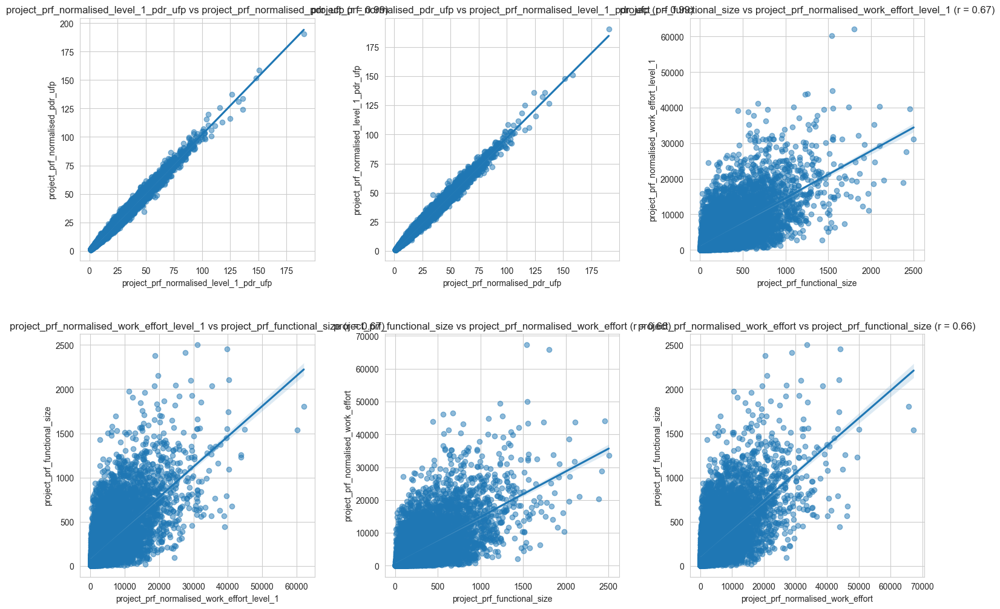

## Categorical Features

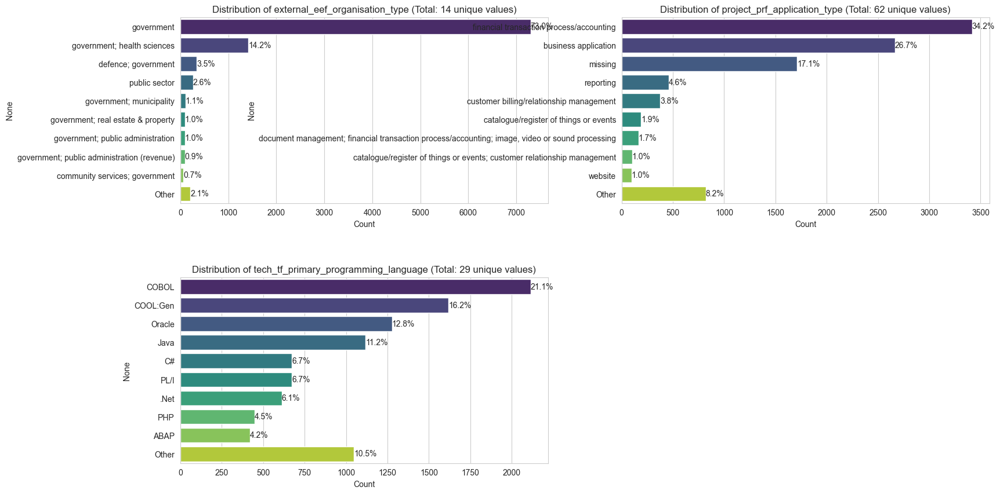

## Categorical-Numerical Relationships

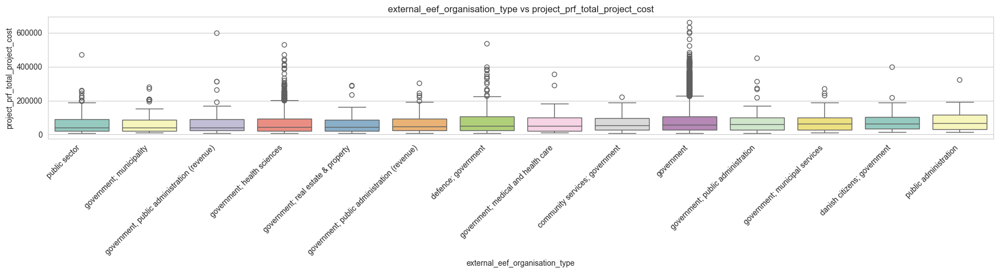

Processing synthetic_cleaned_insurance...


# Exploratory Data Analysis

## Data Overview

Dataset shape: (10000, 82)
First 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,project_prf_case_tool_used_Don_t_Know,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_No,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_Yes
0,14590,2014,unknown,Missing,173.563500,4138.851000,5160,33.164528,26.418716,124.15977,...,False,False,False,False,False,False,False,False,False,False
1,21403,2013,unknown,iOS,725.307400,5015.459500,4668,12.838118,16.251102,79.53446,...,False,False,False,False,False,False,False,False,False,False
2,27708,2015,unknown,Missing,232.324970,2606.669200,2708,5.747184,7.056626,83.39991,...,False,False,False,False,False,False,False,False,False,False
3,14252,2006,missing,Missing,50.663864,393.715120,431,2.138826,2.194448,41.94489,...,False,False,False,False,False,False,False,False,False,False
4,31296,2015,unknown,Java,22.435682,31.693611,44,1.459626,1.620420,34.77488,...,False,False,False,False,False,False,False,False,False,False


Last 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,project_prf_case_tool_used_Don_t_Know,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_No,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_Yes
9995,32570,2011,unknown,Java,478.764980,3897.401400,3646,21.508783,14.814177,13.563476,...,False,False,False,False,False,False,False,False,False,False
9996,28859,2012,electronic data interchange,Java,12.824794,24.101053,33,0.578722,0.523555,10.323228,...,False,False,False,False,False,False,False,False,False,False
9997,18231,2015,unknown,Missing,72.082924,160.013500,135,2.986059,3.747132,93.070750,...,False,False,False,False,False,False,False,False,False,False
9998,23969,2014,unknown,Oracle,1583.360500,19585.312000,21324,18.971300,17.035458,66.579970,...,False,False,False,False,False,False,False,False,False,False
9999,16552,2015,unknown,COBOL,35.309910,2655.723600,1971,23.692207,23.961256,5.871255,...,False,False,True,False,False,False,False,False,False,False


## Duplicate Rows

Number of duplicate rows: 0


## Data Types and Memory Usage

,Data Type,Memory Usage (MB)
Index,NaN,0.000126
external_eef_industry_sector_Insurance,bool,0.009537
external_eef_industry_sector_Utilities,bool,0.009537
external_eef_organisation_type_electricity_gas_water,int64,0.076294
external_eef_organisation_type_energy,int64,0.076294
...,...,...
tech_tf_language_type_5GL,bool,0.009537
tech_tf_language_type_ApG,bool,0.009537
tech_tf_language_type_Missing,bool,0.009537
tech_tf_primary_programming_language,object,0.600221


## Unique Values Per Column

isbsg_project_id: 503 unique values
project_prf_year_of_project: 17 unique values
project_prf_application_type: 27 unique values
tech_tf_primary_programming_language: 27 unique values
project_prf_functional_size: 9999 unique values
project_prf_normalised_work_effort_level_1: 10000 unique values
project_prf_normalised_work_effort: 4568 unique values
project_prf_normalised_level_1_pdr_ufp: 10000 unique values
project_prf_normalised_pdr_ufp: 9999 unique values
project_prf_speed_of_delivery: 9999 unique values
project_prf_project_elapsed_time: 9971 unique values
process_pmf_docs: 15 unique values
tech_tf_tools_used: 9 unique values
project_prf_max_team_size: 6 unique values
external_eef_organisation_type_electricity_gas_water: 2 unique values
external_eef_organisation_type_energy: 2 unique values
external_eef_organisation_type_government: 2 unique values
external_eef_organisation_type_insurance: 2 unique values
external_eef_organisation_type_utilities: 2 unique values
project_prf_applicati

## Type Conversion Suggestions

Consider converting to 'category' dtype for memory/performance:
['project_prf_application_type', 'tech_tf_primary_programming_language']


## Summary Statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
isbsg_project_id,10000.000000,nan,nan,nan,21593.630500,6477.847553,10062.000000,16044.000000,21621.000000,27274.000000,32706.000000
project_prf_year_of_project,10000.000000,nan,nan,nan,2012.826200,2.241806,1998.000000,2012.000000,2014.000000,2014.000000,2015.000000
project_prf_application_type,10000,27,unknown,7157,nan,nan,nan,nan,nan,nan,nan
tech_tf_primary_programming_language,10000,27,Missing,3139,nan,nan,nan,nan,nan,nan,nan
project_prf_functional_size,10000.000000,nan,nan,nan,261.999831,294.298080,4.000814,56.240882,163.883810,363.389958,3158.999300
project_prf_normalised_work_effort_level_1,10000.000000,nan,nan,nan,2292.825817,2945.569992,24.000238,327.494363,1203.504450,3123.678150,26653.234000
project_prf_normalised_work_effort,10000.000000,nan,nan,nan,2299.242900,2945.848930,33.000000,332.000000,1191.000000,3161.500000,28352.000000
project_prf_normalised_level_1_pdr_ufp,10000.000000,nan,nan,nan,10.168725,8.829191,0.497030,3.708096,7.586406,14.071423,89.116066
project_prf_normalised_pdr_ufp,10000.000000,nan,nan,nan,10.190485,8.858063,0.394880,3.720445,7.685888,14.118581,89.146670
project_prf_speed_of_delivery,10000.000000,nan,nan,nan,49.927856,46.009966,2.402399,17.285988,35.993381,68.439003,445.519070


## Missing Values

,Missing Values,Percentage (%)
project_prf_max_team_size,9622,96.220000


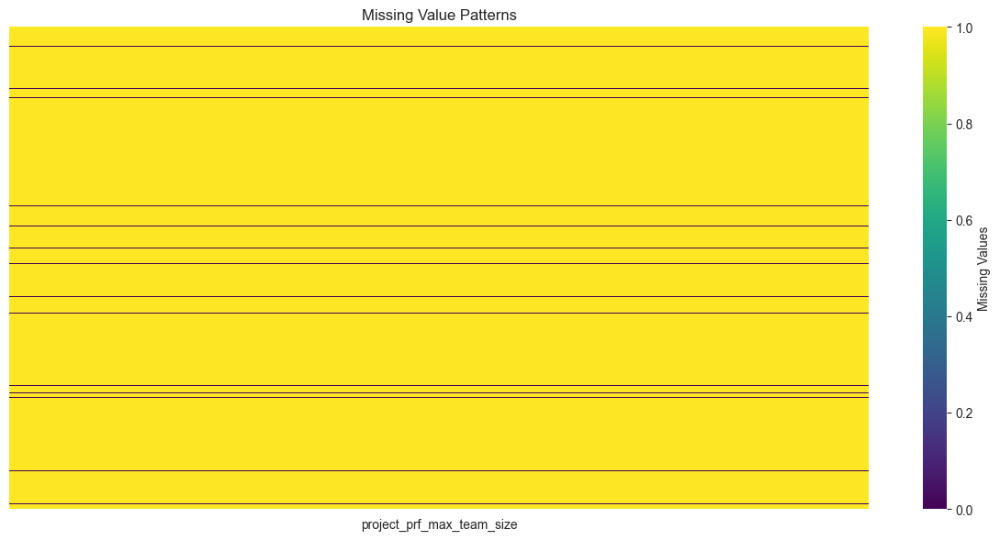

## Distribution of Numerical Features

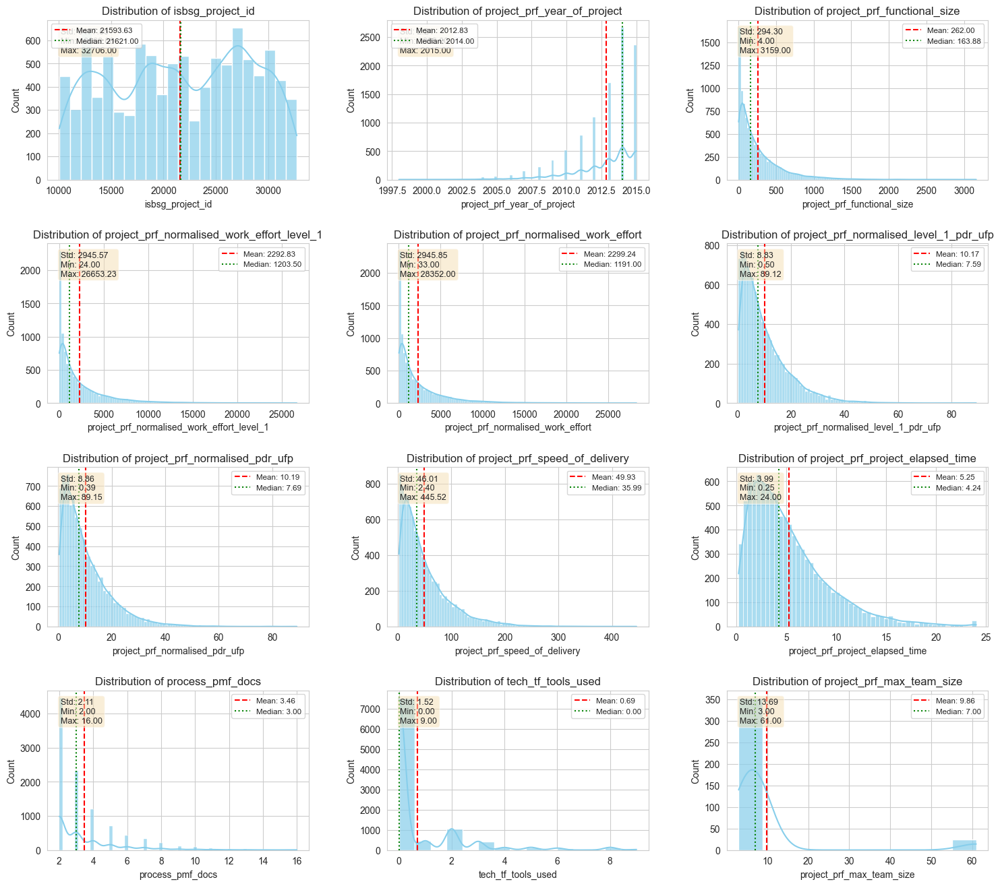

## Correlation Matrix

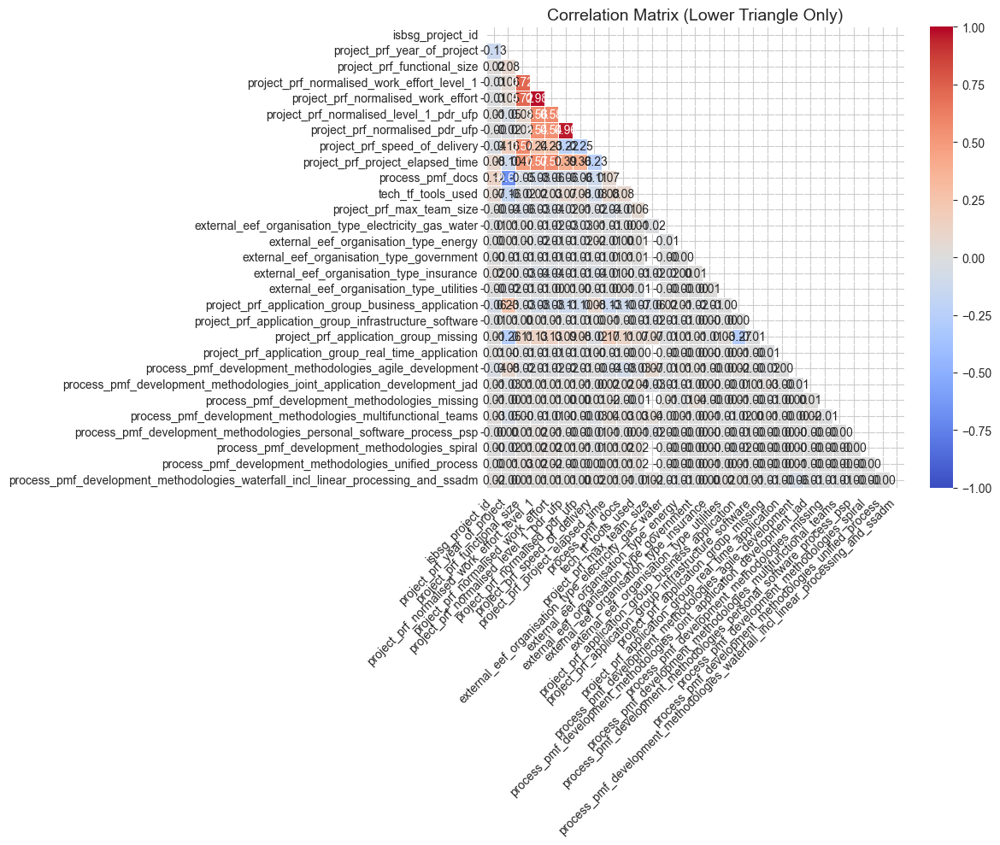

## Top Correlations

project_prf_normalised_work_effort_level_1 — project_prf_normalised_work_effort: 0.98
project_prf_normalised_work_effort — project_prf_normalised_work_effort_level_1: 0.98
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_pdr_ufp: 0.96
project_prf_normalised_pdr_ufp — project_prf_normalised_level_1_pdr_ufp: 0.96
project_prf_normalised_work_effort_level_1 — project_prf_functional_size: 0.72
project_prf_normalised_work_effort — project_prf_functional_size: 0.72
project_prf_functional_size — project_prf_normalised_work_effort: 0.72
project_prf_functional_size — project_prf_normalised_work_effort_level_1: 0.72
process_pmf_docs — project_prf_year_of_project: -0.67
project_prf_year_of_project — process_pmf_docs: -0.67
project_prf_normalised_work_effort — project_prf_normalised_level_1_pdr_ufp: 0.58
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_work_effort: 0.58
project_prf_project_elapsed_time — project_prf_normalised_work_effort: 0.57
project_prf_project_elap

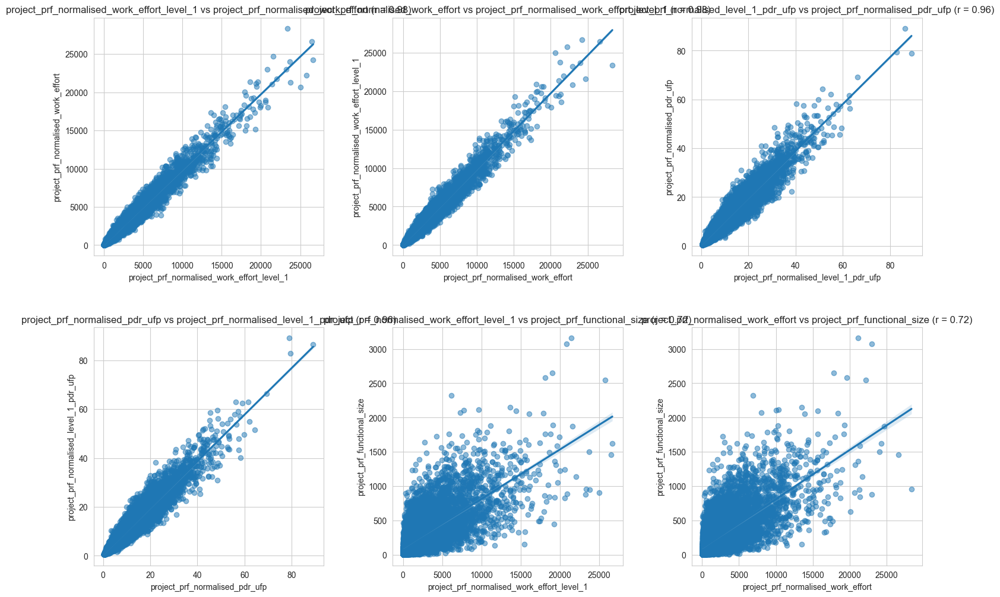

## Categorical Features

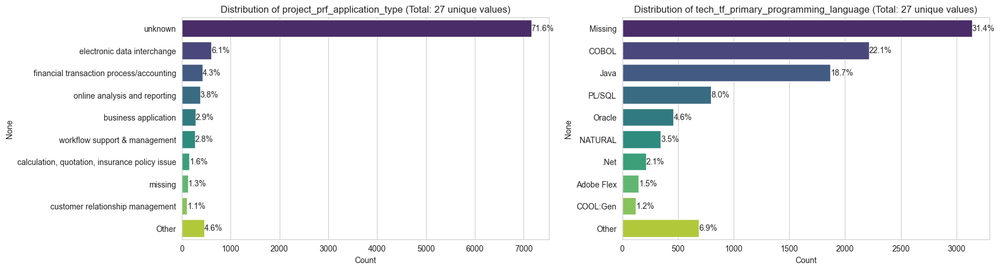

## Categorical-Numerical Relationships

Processing synthetic_cleaned_medical...


# Exploratory Data Analysis

## Data Overview

Dataset shape: (10000, 88)
First 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,tech_tf_architecture_Multi_tier_with_web_public_interface,tech_tf_architecture_Stand_alone,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_Yes
0,27958,2014,operating system or software utility,COBOL,1034,10726,10081,11.696281,12.948257,163.020780,...,False,False,False,False,False,False,True,False,False,False
1,22302,2014,financial transaction process/accounting,C#,165,4734,4888,98.707490,99.065094,93.180780,...,False,True,False,False,False,False,False,False,False,True
2,27537,2014,financial transaction process/accounting,COBOL,338,5326,5049,12.050821,12.654269,8.260489,...,False,False,True,True,False,False,False,False,False,False
3,24248,2014,financial transaction process/accounting,iOS,1224,26923,25188,48.256607,56.333763,88.034250,...,False,False,False,False,False,False,False,False,False,False
4,15464,2014,financial transaction process/accounting; work...,Java,12,20,19,2.716181,3.251176,0.719434,...,False,False,False,False,False,False,False,False,False,False


Last 5 rows:


,isbsg_project_id,project_prf_year_of_project,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,project_prf_speed_of_delivery,...,tech_tf_architecture_Multi_tier_with_web_public_interface,tech_tf_architecture_Stand_alone,project_prf_case_tool_used_Missing,project_prf_case_tool_used_No,project_prf_case_tool_used_Yes,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_Yes
9995,30345,2014,missing,COBOL,178,6529,6572,26.030525,30.745388,24.786749,...,False,True,False,False,False,False,False,False,False,False
9996,28393,2014,business application,COBOL,32,1067,924,9.481010,8.895204,4.305357,...,False,True,False,True,False,False,False,False,False,False
9997,12425,2014,financial transaction process/accounting,C#,11,203,228,7.713402,11.957859,1.750848,...,False,False,False,False,False,False,False,False,True,False
9998,15589,2014,financial transaction process/accounting,Java,572,3839,3939,9.742521,10.630406,50.756820,...,False,False,False,False,True,False,False,False,False,False
9999,20995,2014,business application,C#,602,2723,3054,1.717346,2.226834,6.329076,...,False,False,False,False,False,False,False,False,False,False


## Duplicate Rows

Number of duplicate rows: 0


## Data Types and Memory Usage

,Data Type,Memory Usage (MB)
Index,NaN,0.000126
external_eef_industry_sector_Banking,bool,0.009537
external_eef_industry_sector_Financial,bool,0.009537
external_eef_organisation_type_banking,int64,0.076294
external_eef_organisation_type_banking_insurance_stock,int64,0.076294
...,...,...
tech_tf_language_type_4GL,bool,0.009537
tech_tf_language_type_5GL,bool,0.009537
tech_tf_language_type_Missing,bool,0.009537
tech_tf_primary_programming_language,object,0.590341


## Unique Values Per Column

isbsg_project_id: 185 unique values
project_prf_year_of_project: 1 unique values
project_prf_application_type: 15 unique values
tech_tf_primary_programming_language: 29 unique values
project_prf_functional_size: 1552 unique values
project_prf_normalised_work_effort_level_1: 6242 unique values
project_prf_normalised_work_effort: 6131 unique values
project_prf_normalised_level_1_pdr_ufp: 10000 unique values
project_prf_normalised_pdr_ufp: 10000 unique values
project_prf_speed_of_delivery: 10000 unique values
project_prf_manpower_delivery_rate: 8660 unique values
project_prf_project_elapsed_time: 9999 unique values
project_prf_max_team_size: 29 unique values
process_pmf_docs: 15 unique values
tech_tf_tools_used: 6 unique values
external_eef_organisation_type_banking_insurance_stock: 2 unique values
external_eef_organisation_type_banking: 2 unique values
external_eef_organisation_type_communications: 2 unique values
external_eef_organisation_type_education_institution: 2 unique values
exte

## Type Conversion Suggestions

Consider converting to 'category' dtype for memory/performance:
['project_prf_application_type', 'tech_tf_primary_programming_language']


## Summary Statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
isbsg_project_id,10000.000000,nan,nan,nan,22037.489700,6580.498141,10066.000000,16143.000000,22265.000000,27765.000000,32725.000000
project_prf_year_of_project,10000.000000,nan,nan,nan,2014.000000,0.000000,2014.000000,2014.000000,2014.000000,2014.000000,2014.000000
project_prf_application_type,10000,15,financial transaction process/accounting,5970,nan,nan,nan,nan,nan,nan,nan
tech_tf_primary_programming_language,10000,29,COBOL,2592,nan,nan,nan,nan,nan,nan,nan
project_prf_functional_size,10000.000000,nan,nan,nan,348.444000,454.616489,3.000000,45.000000,178.000000,474.000000,4481.000000
project_prf_normalised_work_effort_level_1,10000.000000,nan,nan,nan,4964.031600,6136.538347,9.000000,715.000000,2736.500000,6910.250000,50446.000000
project_prf_normalised_work_effort,10000.000000,nan,nan,nan,4660.012200,5505.023175,9.000000,740.000000,2709.000000,6646.000000,41929.000000
project_prf_normalised_level_1_pdr_ufp,10000.000000,nan,nan,nan,25.471366,28.213107,1.400034,5.778440,15.411262,35.250446,252.555220
project_prf_normalised_pdr_ufp,10000.000000,nan,nan,nan,27.329007,29.395220,1.400102,6.575956,17.277785,37.681299,252.893000
project_prf_speed_of_delivery,10000.000000,nan,nan,nan,38.673084,50.183717,0.300000,5.250520,19.564753,52.888933,553.097200


## Missing Values

,Missing Values,Percentage (%)
project_prf_manpower_delivery_rate,1339,13.390000


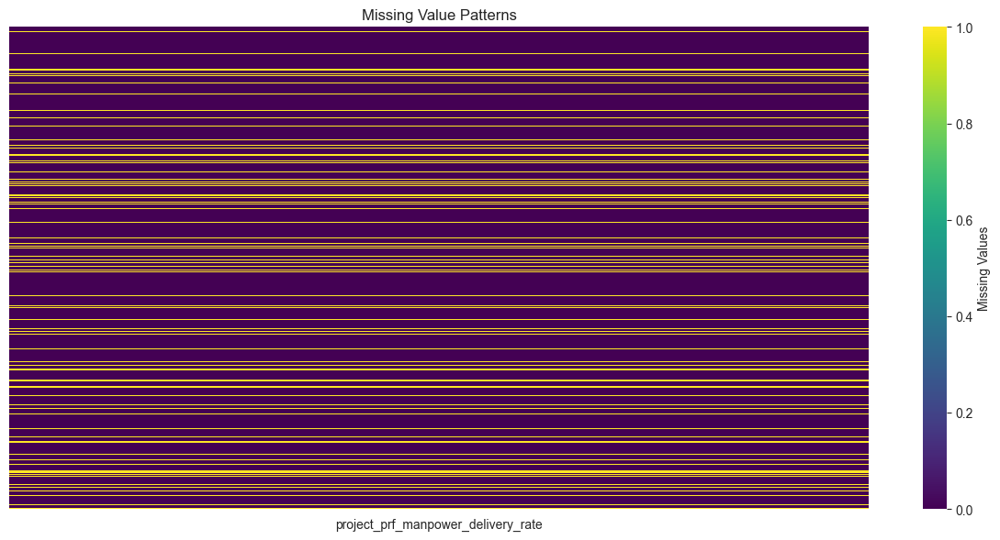

## Distribution of Numerical Features

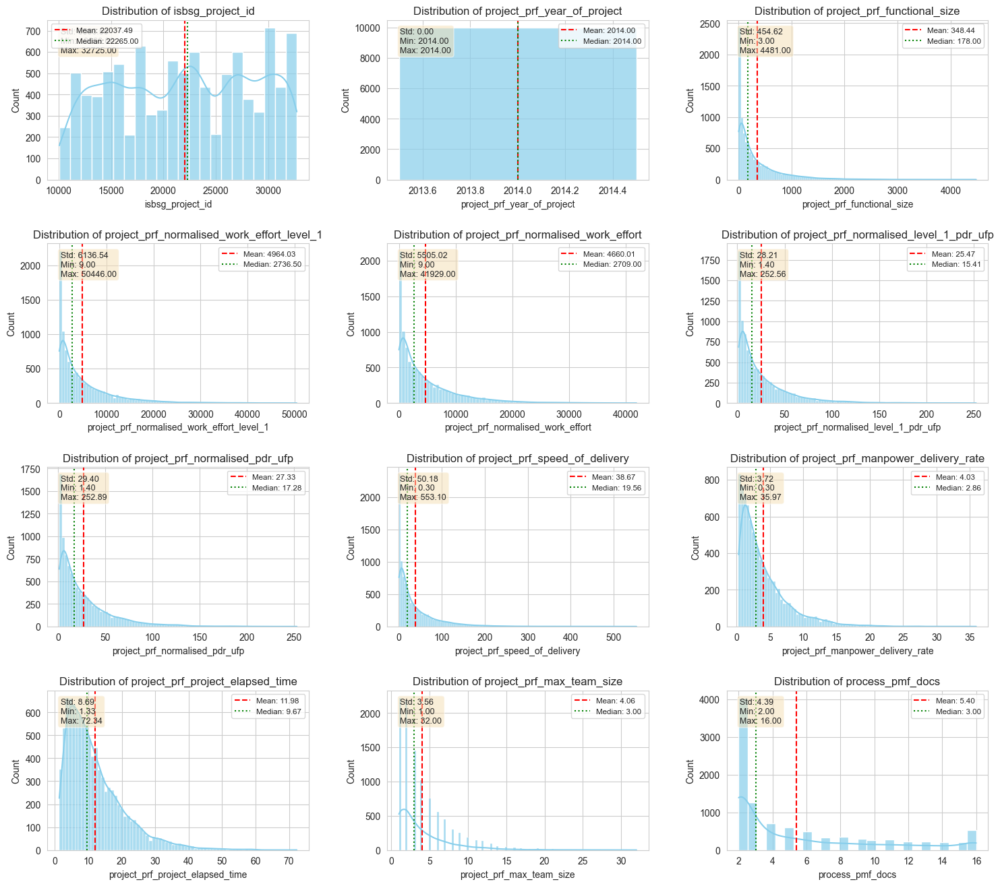

## Correlation Matrix

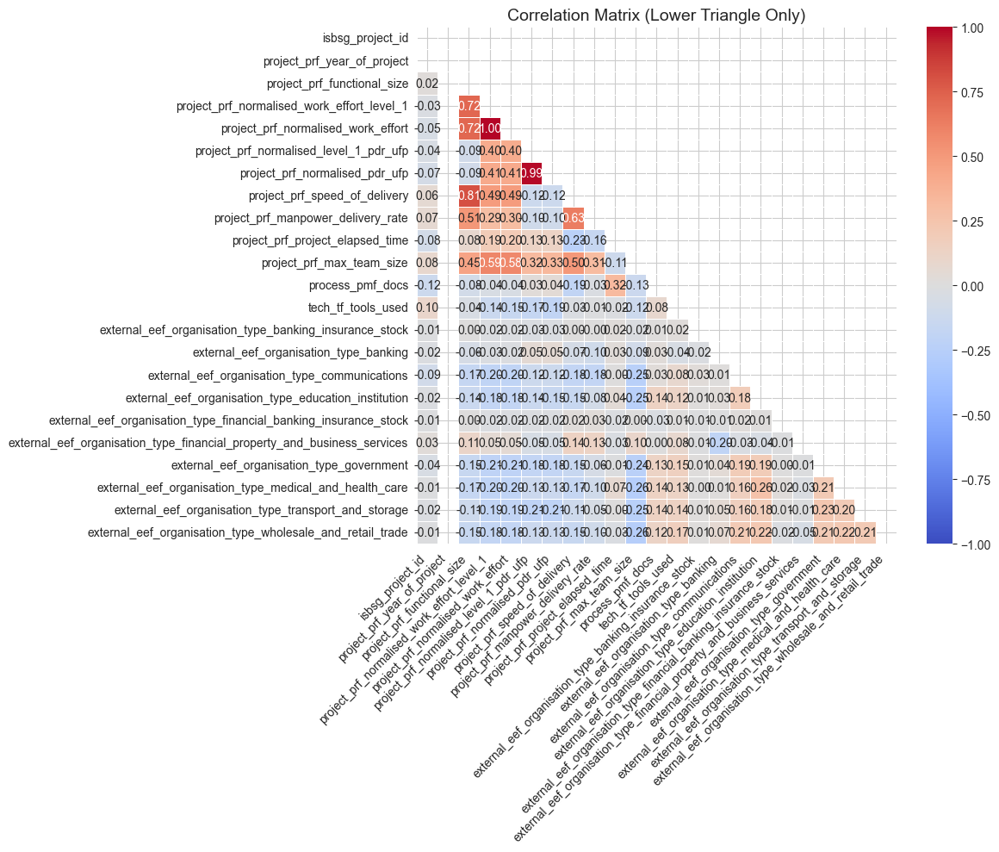

## Top Correlations

project_prf_normalised_pdr_ufp — project_prf_normalised_level_1_pdr_ufp: 0.99
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_pdr_ufp: 0.99
project_prf_speed_of_delivery — project_prf_functional_size: 0.81
project_prf_functional_size — project_prf_speed_of_delivery: 0.81
project_prf_functional_size — project_prf_normalised_work_effort_level_1: 0.72
project_prf_normalised_work_effort_level_1 — project_prf_functional_size: 0.72
project_prf_normalised_work_effort — project_prf_functional_size: 0.72
project_prf_functional_size — project_prf_normalised_work_effort: 0.72
project_prf_manpower_delivery_rate — project_prf_speed_of_delivery: 0.63
project_prf_speed_of_delivery — project_prf_manpower_delivery_rate: 0.63
project_prf_max_team_size — project_prf_normalised_work_effort_level_1: 0.59
project_prf_normalised_work_effort_level_1 — project_prf_max_team_size: 0.59
project_prf_normalised_work_effort — project_prf_max_team_size: 0.58
project_prf_max_team_size — project_prf_nor

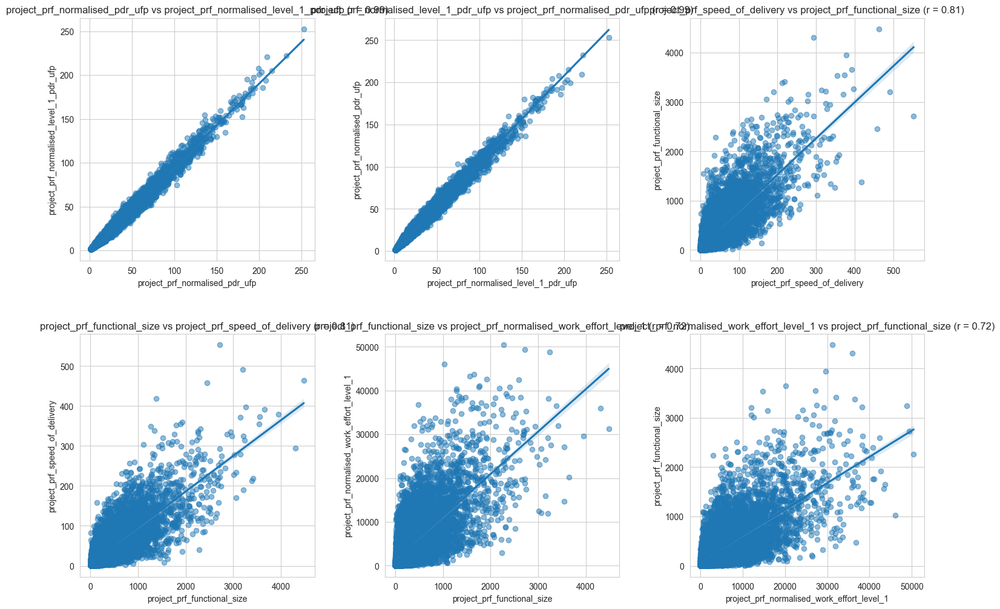

## Categorical Features

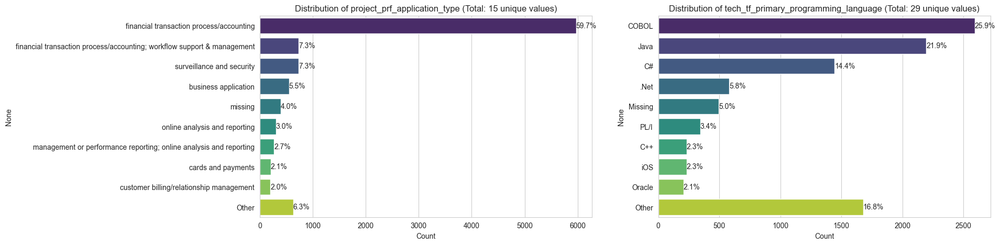

## Categorical-Numerical Relationships

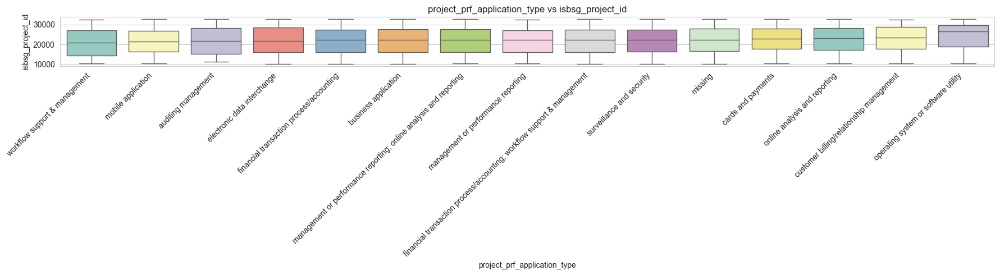

Processing synthetic_cleaned_serviceindustry...


# Exploratory Data Analysis

## Data Overview

Dataset shape: (10000, 107)
First 5 rows:


,isbsg_project_id,project_prf_year_of_project,external_eef_organisation_type,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,...,tech_tf_architecture_Stand_alone,tech_tf_architecture_Stand_alone_1,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_No,tech_tf_client_server_Not_Applicable,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_No,tech_tf_dbms_used_Yes
0,32308,2008,community services,logistic or supply planning & control,.Net,41,3656,1305,33.683310,26.838564,...,False,False,False,False,False,False,True,True,False,True
1,17867,2007,"art , events , ticketing",customer billing,APPS,210,12189,14331,24.311802,21.778887,...,False,False,False,False,False,False,False,False,False,True
2,10426,2014,transport & storage; wholesale & retail trade,electronic data interchange,Java,66,321,1015,3.259127,10.319147,...,False,False,False,False,False,False,True,False,False,True
3,13597,2007,transport & storage,financial transaction process/accounting,Assembler,582,841,1241,1.322975,1.636051,...,False,False,True,False,False,False,False,False,False,True
4,32308,2002,community services; institutions eg. kindergar...,financial transaction process/accounting,RPG,122,11576,7572,28.431938,29.501219,...,False,False,False,False,False,False,False,False,False,True


Last 5 rows:


,isbsg_project_id,project_prf_year_of_project,external_eef_organisation_type,project_prf_application_type,tech_tf_primary_programming_language,project_prf_functional_size,project_prf_normalised_work_effort_level_1,project_prf_normalised_work_effort,project_prf_normalised_level_1_pdr_ufp,project_prf_normalised_pdr_ufp,...,tech_tf_architecture_Stand_alone,tech_tf_architecture_Stand_alone_1,tech_tf_client_server_Don_t_Know,tech_tf_client_server_Missing,tech_tf_client_server_No,tech_tf_client_server_Not_Applicable,tech_tf_client_server_Yes,tech_tf_dbms_used_Missing,tech_tf_dbms_used_No,tech_tf_dbms_used_Yes
9995,16624,2005,community services,customer relationship management,Missing,287,8164,4409,26.668987,34.735260,...,False,False,False,False,False,False,False,True,False,False
9996,30367,2006,community services; institutions eg. kindergar...,workflow support & management,PL/I,220,558,617,4.012014,7.968377,...,True,False,False,False,False,True,True,True,False,True
9997,29462,2006,food processing,catalogue/register of things or events; workfl...,SQL,251,7409,4591,24.911367,15.328900,...,True,False,False,False,True,True,False,False,False,True
9998,25559,2009,community services; government; public adminis...,missing,PL/I,115,253,168,7.716888,10.566032,...,False,False,False,False,True,False,False,True,False,False
9999,25546,2007,community services,missing,Visual Basic,104,716,1131,5.299674,11.408211,...,True,False,True,False,False,False,True,False,False,True


## Duplicate Rows

Number of duplicate rows: 0


## Data Types and Memory Usage

,Data Type,Memory Usage (MB)
Index,NaN,0.000126
external_eef_industry_sector_Service_Industry,bool,0.009537
external_eef_organisation_type,object,0.767928
functional_size_group_L_1000_2999,bool,0.009537
functional_size_group_M_100_999,bool,0.009537
...,...,...
tech_tf_server_roles_missing,int64,0.076294
tech_tf_server_roles_multi_user_legacy_application,int64,0.076294
tech_tf_server_roles_object_component_server,int64,0.076294
tech_tf_server_roles_security_authentication,int64,0.076294


## Unique Values Per Column

isbsg_project_id: 66 unique values
project_prf_year_of_project: 18 unique values
external_eef_organisation_type: 19 unique values
project_prf_application_type: 31 unique values
tech_tf_primary_programming_language: 16 unique values
project_prf_functional_size: 1130 unique values
project_prf_normalised_work_effort_level_1: 6298 unique values
project_prf_normalised_work_effort: 6054 unique values
project_prf_normalised_level_1_pdr_ufp: 9916 unique values
project_prf_normalised_pdr_ufp: 9982 unique values
project_prf_defect_density: 8544 unique values
project_prf_speed_of_delivery: 9128 unique values
project_prf_manpower_delivery_rate: 8479 unique values
project_prf_project_elapsed_time: 9995 unique values
project_prf_max_team_size: 9997 unique values
process_pmf_docs: 17 unique values
tech_tf_tools_used: 5 unique values
people_prf_ba_team_experience_less_than_1_yr: 8519 unique values
people_prf_ba_team_experience_1_to_3_yr: 10 unique values
people_prf_ba_team_experience_great_than_3_yr: 

## Type Conversion Suggestions

Consider converting to 'category' dtype for memory/performance:
['external_eef_organisation_type', 'project_prf_application_type', 'tech_tf_primary_programming_language']


## Summary Statistics

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
isbsg_project_id,10000.000000,nan,nan,nan,20267.301700,6418.924638,10059.000000,14621.000000,19858.000000,25559.000000,32308.000000
project_prf_year_of_project,10000.000000,nan,nan,nan,2008.046900,2.932944,1998.000000,2006.000000,2008.000000,2010.000000,2015.000000
external_eef_organisation_type,10000,19,community services,2339,nan,nan,nan,nan,nan,nan,nan
project_prf_application_type,10000,31,financial transaction process/accounting,1808,nan,nan,nan,nan,nan,nan,nan
tech_tf_primary_programming_language,10000,16,Java,1848,nan,nan,nan,nan,nan,nan,nan
project_prf_functional_size,10000.000000,nan,nan,nan,289.285100,273.633300,23.000000,89.000000,202.000000,398.000000,1958.000000
project_prf_normalised_work_effort_level_1,10000.000000,nan,nan,nan,5275.916600,6276.110579,81.000000,766.750000,2862.000000,7446.500000,44788.000000
project_prf_normalised_work_effort,10000.000000,nan,nan,nan,5439.387200,7377.191194,81.000000,547.000000,2456.000000,7326.250000,62514.000000
project_prf_normalised_level_1_pdr_ufp,10000.000000,nan,nan,nan,15.090034,13.337165,0.400024,4.677884,11.126515,21.950699,60.300000
project_prf_normalised_pdr_ufp,10000.000000,nan,nan,nan,15.610920,14.667404,0.600625,4.675579,11.071407,22.059605,86.400000


## Missing Values

,Missing Values,Percentage (%)
people_prf_project_manage_changes,1910,19.100000
people_prf_personnel_changes,1729,17.290000
project_prf_manpower_delivery_rate,1490,14.900000
project_prf_defect_density,1454,14.540000
people_prf_ba_team_experience_1_to_3_yr,1435,14.350000
people_prf_ba_team_experience_less_than_1_yr,1425,14.250000
people_prf_it_experience_3_to_9_yr,1418,14.180000
people_prf_it_experience_great_than_9_yr,1417,14.170000
people_prf_ba_team_experience_great_than_3_yr,1409,14.090000
people_prf_project_manage_experience,1405,14.050000


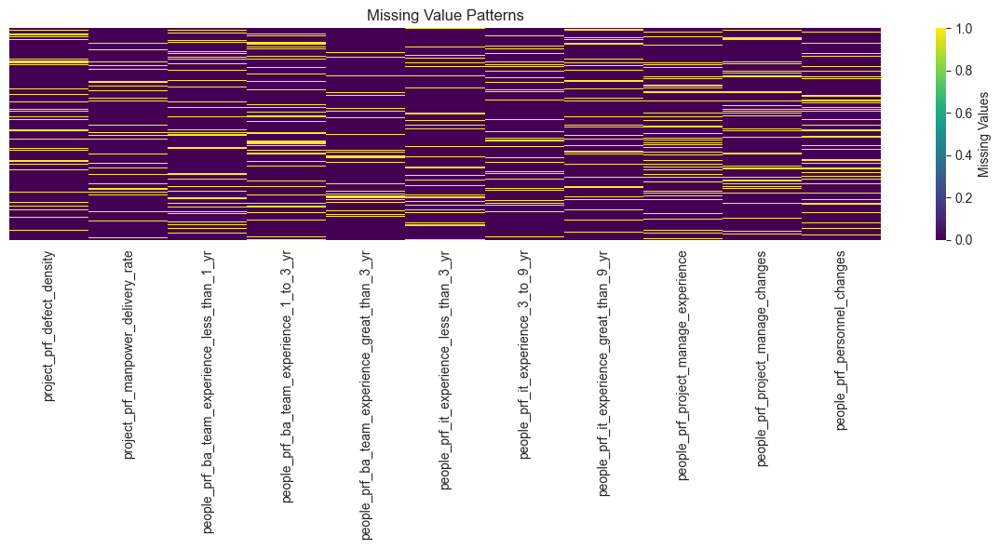

## Distribution of Numerical Features

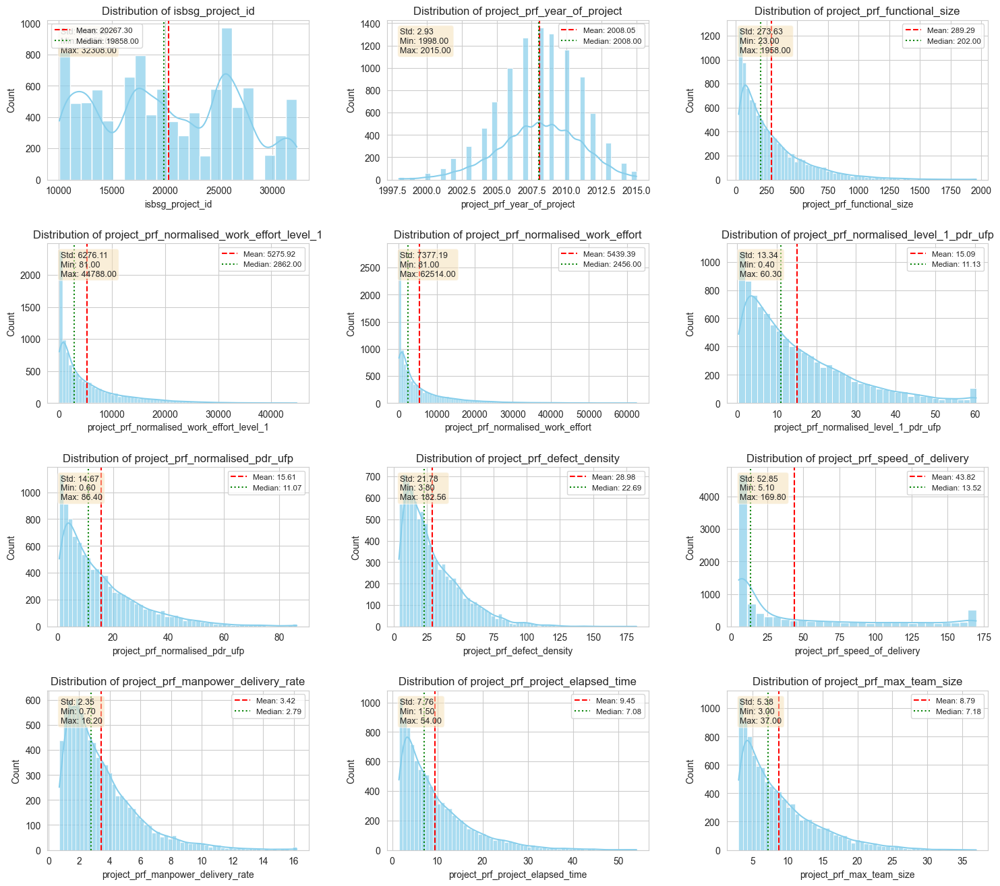

## Correlation Matrix

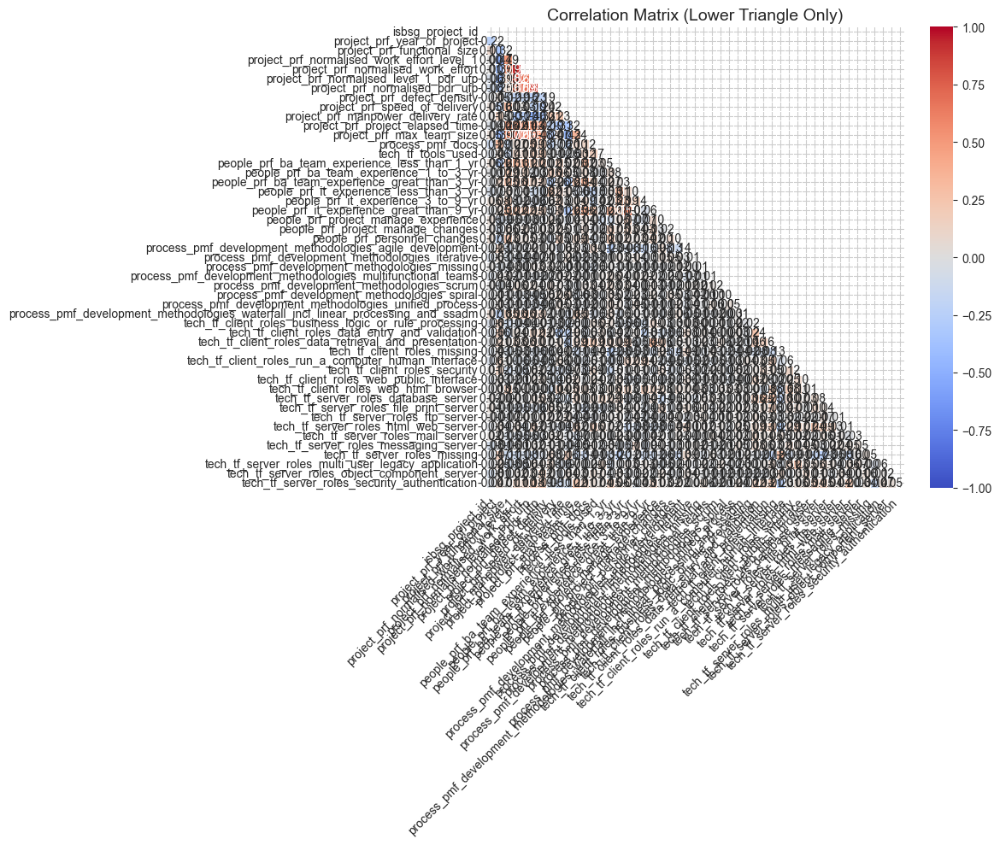

## Top Correlations

project_prf_normalised_work_effort_level_1 — project_prf_normalised_work_effort: 0.91
project_prf_normalised_work_effort — project_prf_normalised_work_effort_level_1: 0.91
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_pdr_ufp: 0.85
project_prf_normalised_pdr_ufp — project_prf_normalised_level_1_pdr_ufp: 0.85
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_work_effort_level_1: 0.82
project_prf_normalised_work_effort_level_1 — project_prf_normalised_level_1_pdr_ufp: 0.82
project_prf_normalised_work_effort_level_1 — project_prf_max_team_size: 0.72
project_prf_max_team_size — project_prf_normalised_work_effort_level_1: 0.72
project_prf_normalised_pdr_ufp — project_prf_normalised_work_effort: 0.69
project_prf_normalised_work_effort — project_prf_normalised_pdr_ufp: 0.69
project_prf_normalised_level_1_pdr_ufp — project_prf_normalised_work_effort: 0.67
project_prf_normalised_pdr_ufp — project_prf_normalised_work_effort_level_1: 0.67
project_prf_normalised_wor

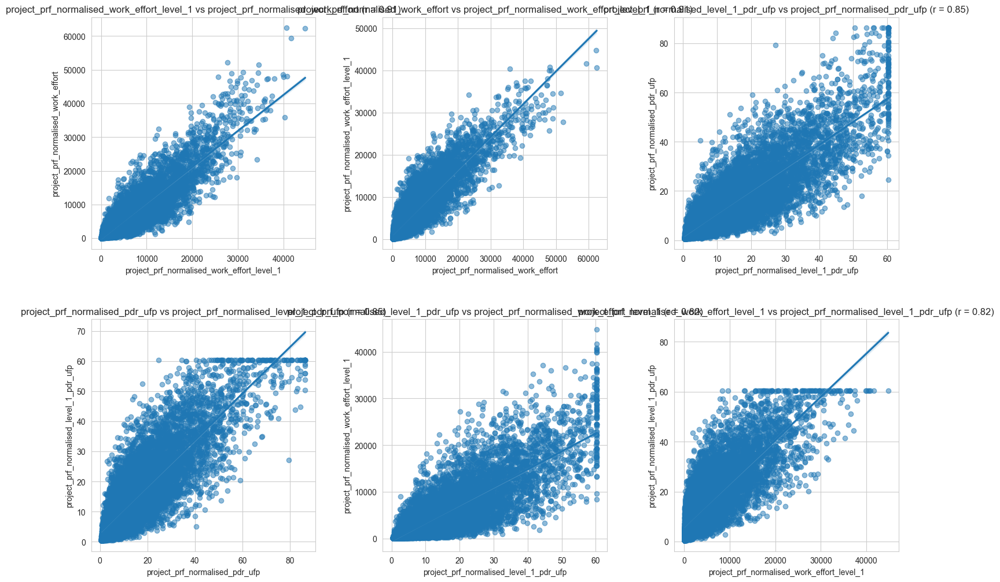

## Categorical Features

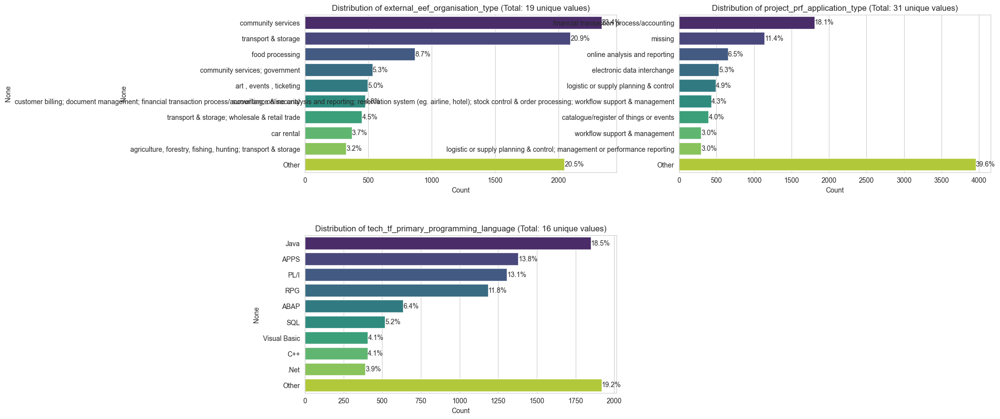

## Categorical-Numerical Relationships

Cell executed at: 2025-07-09 16:15:49.814158


In [8]:
def display_header(text):
    try:
        from IPython.display import display, Markdown
        display(Markdown(f"# {text}"))
    except ImportError:
        print(f"\n=== {text} ===\n")

def display_subheader(text):
    try:
        from IPython.display import display, Markdown
        display(Markdown(f"## {text}"))
    except ImportError:
        print(f"\n-- {text} --\n")

def explore_data(df: pd.DataFrame) -> None:
    """
    Perform exploratory data analysis on the input DataFrame with nicely aligned plots.
    Args:
        df: Input DataFrame
    """
    from IPython.display import display

    display_header("Exploratory Data Analysis")
    
    # Data Overview
    display_subheader("Data Overview")
    print(f"Dataset shape: {df.shape}")
    if df.shape[0] > 20:
        print("First 5 rows:")
        display(df.head())
        print("Last 5 rows:")
        display(df.tail())
    else:
        display(df)
    
    # Duplicate Row Checking
    display_subheader("Duplicate Rows")
    num_duplicates = df.duplicated().sum()
    print(f"Number of duplicate rows: {num_duplicates}")

    # Data Types and Memory Usage
    display_subheader("Data Types and Memory Usage")
    dtype_info = pd.DataFrame({
        'Data Type': df.dtypes,
        'Memory Usage (MB)': df.memory_usage(deep=True) / 1024 / 1024
    })
    display(dtype_info)
    
    # Unique Values Per Column
    display_subheader("Unique Values Per Column")
    for col in df.columns:
        print(f"{col}: {df[col].nunique()} unique values")
    
    # Type Conversion Suggestions
    display_subheader("Type Conversion Suggestions")
    potential_cat = [
        col for col in df.select_dtypes(include=['object']).columns
        if df[col].nunique() < max(30, 0.05*df.shape[0])
    ]
    if potential_cat:
        print("Consider converting to 'category' dtype for memory/performance:")
        print(potential_cat)
    else:
        print("No obvious candidates for 'category' dtype conversion.")
    
    # Summary Statistics
    display_subheader("Summary Statistics")
    try:
        display(df.describe(include='all').T.style.background_gradient(cmap='Blues', axis=1))
    except Exception:
        display(df.describe(include='all').T)
    
    # Missing Values
    display_subheader("Missing Values")
    missing = df.isnull().sum()
    missing_percent = (missing / len(df)) * 100
    missing_info = pd.DataFrame({
        'Missing Values': missing,
        'Percentage (%)': missing_percent.round(2)
    })
    if missing.sum() > 0:
        display(missing_info[missing_info['Missing Values'] > 0]
                .sort_values('Missing Values', ascending=False)
                .style.background_gradient(cmap='Reds'))
        # Visualize missing values
        plt.figure(figsize=(12, 6))
        cols_with_missing = missing_info[missing_info['Missing Values'] > 0].index
        if len(cols_with_missing) > 0:
            sns.heatmap(df[cols_with_missing].isnull(), 
                        cmap='viridis', 
                        yticklabels=False, 
                        cbar_kws={'label': 'Missing Values'})
            plt.title('Missing Value Patterns')
            plt.tight_layout()
            plt.show()
    else:
        print("No missing values in the dataset.")
    
    # Numerical Distributions
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    if len(numerical_cols) > 0:
        display_subheader("Distribution of Numerical Features")
        sample_cols = numerical_cols[:min(12, len(numerical_cols))]
        num_cols = len(sample_cols)
        num_rows = (num_cols + 2) // 3  # 3 plots per row, rounded up
        fig = plt.figure(figsize=(18, num_rows * 4))
        grid = plt.GridSpec(num_rows, 3, figure=fig, hspace=0.4, wspace=0.3)
        for i, col in enumerate(sample_cols):
            row, col_pos = divmod(i, 3)
            ax = fig.add_subplot(grid[row, col_pos])
            sns.histplot(df[col].dropna(), kde=True, ax=ax, color='skyblue', alpha=0.7)
            mean_val = df[col].mean()
            median_val = df[col].median()
            ax.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
            ax.axvline(median_val, color='green', linestyle=':', label=f'Median: {median_val:.2f}')
            stats_text = (f"Std: {df[col].std():.2f}\n"
                          f"Min: {df[col].min():.2f}\n"
                          f"Max: {df[col].max():.2f}")
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=9,
                    verticalalignment='top', bbox=props)
            ax.set_title(f'Distribution of {col}')
            ax.legend(fontsize='small')
        plt.tight_layout()
        plt.show()
        # Correlation matrix and top correlations
        if len(numerical_cols) > 1:
            display_subheader("Correlation Matrix")
            corr = df[numerical_cols].corr().round(2)
            mask = np.triu(np.ones_like(corr, dtype=bool))
            plt.figure(figsize=(12, 10))
            sns.heatmap(corr, mask=mask, annot=True, cmap='coolwarm', 
                        fmt=".2f", linewidths=0.5, vmin=-1, vmax=1, 
                        annot_kws={"size": 10})
            plt.title('Correlation Matrix (Lower Triangle Only)', fontsize=14)
            plt.xticks(rotation=45, ha='right', fontsize=10)
            plt.yticks(fontsize=10)
            plt.tight_layout()
            plt.show()
            # Top correlations
            if len(numerical_cols) > 5:
                corr_unstack = corr.unstack()
                corr_abs = corr_unstack.apply(abs)
                corr_abs = corr_abs[corr_abs < 1.0]
                highest_corrs = corr_abs.sort_values(ascending=False).head(15)
                display_subheader("Top Correlations")
                for (col1, col2), corr_val in highest_corrs.items():
                    actual_val = corr.loc[col1, col2]
                    print(f"{col1} — {col2}: {actual_val:.2f}")
                pairs_to_plot = [(idx[0], idx[1]) for idx in highest_corrs.index][:6]
                if pairs_to_plot:
                    fig = plt.figure(figsize=(18, 12))
                    grid = plt.GridSpec(2, 3, figure=fig, hspace=0.3, wspace=0.3)
                    for i, (col1, col2) in enumerate(pairs_to_plot):
                        row, col_pos = divmod(i, 3)
                        ax = fig.add_subplot(grid[row, col_pos])
                        sns.regplot(x=df[col1], y=df[col2], ax=ax, scatter_kws={'alpha':0.5})
                        r_value = df[col1].corr(df[col2])
                        ax.set_title(f'{col1} vs {col2} (r = {r_value:.2f})')
                    plt.tight_layout()
                    plt.show()
    # Categorical columns
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    if len(categorical_cols) > 0:
        display_subheader("Categorical Features")
        sample_cat_cols = categorical_cols[:min(6, len(categorical_cols))]
        num_cat_cols = len(sample_cat_cols)
        num_cat_rows = (num_cat_cols + 1) // 2
        fig = plt.figure(figsize=(18, num_cat_rows * 5))
        grid = plt.GridSpec(num_cat_rows, 2, figure=fig, hspace=0.4, wspace=0.2)
        for i, col in enumerate(sample_cat_cols):
            row, col_pos = divmod(i, 2)
            ax = fig.add_subplot(grid[row, col_pos])
            value_counts = df[col].value_counts().sort_values(ascending=False)
            top_n = min(10, len(value_counts))
            if len(value_counts) > top_n:
                top_values = value_counts.head(top_n-1)
                other_count = value_counts.iloc[top_n-1:].sum()
                plot_data = pd.concat([top_values, pd.Series({'Other': other_count})])
            else:
                plot_data = value_counts
            sns.barplot(x=plot_data.values, y=plot_data.index, ax=ax, palette='viridis')
            ax.set_title(f'Distribution of {col} (Total: {len(value_counts)} unique values)')
            ax.set_xlabel('Count')
            total = plot_data.sum()
            for j, v in enumerate(plot_data.values):
                percentage = v / total * 100
                ax.text(v + 0.1, j, f'{percentage:.1f}%', va='center')
        plt.tight_layout()
        plt.show()
        # Categorical-numerical boxplots
        if numerical_cols and len(categorical_cols) > 0:
            display_subheader("Categorical-Numerical Relationships")
            numerical_variances = df[numerical_cols].var()
            target_numerical = numerical_variances.idxmax()
            sample_cat_for_box = [col for col in categorical_cols 
                                  if df[col].nunique() <= 15][:4]
            if sample_cat_for_box:
                fig = plt.figure(figsize=(18, 5 * len(sample_cat_for_box)))
                for i, cat_col in enumerate(sample_cat_for_box):
                    ax = fig.add_subplot(len(sample_cat_for_box), 1, i+1)
                    order = df.groupby(cat_col)[target_numerical].median().sort_values().index
                    sns.boxplot(x=cat_col, y=target_numerical, data=df, ax=ax, 
                                order=order, palette='Set3')
                    ax.set_title(f'{cat_col} vs {target_numerical}')
                    ax.set_xlabel(cat_col)
                    ax.set_ylabel(target_numerical)
                    plt.xticks(rotation=45, ha='right')
                plt.tight_layout()
                plt.show()

# Exploratory Data Analysis


# Process each dataframe
for file_prefix, df in dataframes.items():
    print(f"Processing {file_prefix}...")
    explore_data(df)


In [9]:
df_func_relative_size_midpoints = pd.DataFrame([
    {"code": "XXS",  "name": "Extra-extra-small",        "midpoint": 5},
    {"code": "XS",   "name": "Extra-small",              "midpoint": 20},
    {"code": "S",    "name": "Small",                    "midpoint": 65},
    {"code": "M1",   "name": "Medium1",                  "midpoint": 200},
    {"code": "M2",   "name": "Medium2",                  "midpoint": 650},
    {"code": "L",    "name": "Large",                    "midpoint": 2000},
    {"code": "XL",   "name": "Extra-large",              "midpoint": 6000},
    {"code": "XXL",  "name": "Extra-extra-large",        "midpoint": 13500},
    {"code": "XXXL", "name": "Extra-extra-extra-large",  "midpoint": 18000} # or None
])


Cell executed at: 2025-07-09 16:15:49.827594


[Back to top](#Index:)

<a id='#part2'></a>

# Part 2 - Data Cleaning and Preprocessing

Here, data cleaning tasks like handling missing values and providing a detailed summary of each feature, including its type, number of unique values, and a preview of unique values, are performed.

In [10]:
# Analyse missing values

missing_pct = {}
missing_sorted = {}
# Process each dataframe
for file_prefix, df in dataframes.items():
    print(f"\nProcessing {file_prefix}...")

    print("\nAnalysing missing values...")
    missing_pct[file_prefix] = df.isnull().mean() * 100
    missing_sorted[file_prefix] = missing_pct[file_prefix].sort_values(ascending=False)
    print("Top 10 columns with highest missing percentages:")
    print(missing_sorted[file_prefix])


Processing synthetic_cleaned_communication...

Analysing missing values...
Top 10 columns with highest missing percentages:
project_prf_max_team_size                                                           97.38
isbsg_project_id                                                                     0.00
tech_tf_architecture_Client_server                                                   0.00
process_pmf_prototyping_used_Missing                                                 0.00
project_prf_relative_size_XXS                                                        0.00
                                                                                    ...  
process_pmf_development_methodologies_waterfall_incl_linear_processing_and_ssadm     0.00
process_pmf_development_methodologies_timeboxing                                     0.00
process_pmf_development_methodologies_rapid_application_development_rad              0.00
process_pmf_development_methodologies_multifunctional_teams      

In [11]:
# Identify columns with high missing values (>70%)

print (f"\nIdentify columns with high missing values (>70%)")

high_missing_cols = {}
# Process each dataframe
for file_prefix, pct_series in missing_pct.items():
    print(f"\nProcessing {file_prefix}...")

    # Find columns with >70% missing
    cols = pct_series[pct_series > 70].index.tolist()
    high_missing_cols[file_prefix] = cols

    print(f"\nColumns with >70% missing values ({len(cols)} columns):")
    for col in cols[:]:  # Show first 5
        print(f"  - {col}: {pct_series[col]:.2f}% missing")
    if len(cols) > 5:
        print(f"  - ... and {len(cols) - 5} more columns")

    # If you want to show all columns, uncomment:
    print(f"Columns are: {list(pct_series.index)}")



Identify columns with high missing values (>70%)

Processing synthetic_cleaned_communication...

Columns with >70% missing values (1 columns):
  - project_prf_max_team_size: 97.38% missing
Columns are: ['isbsg_project_id', 'project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_normalised_work_effort_level_1', 'project_prf_normalised_work_effort', 'project_prf_normalised_level_1_pdr_ufp', 'project_prf_normalised_pdr_ufp', 'project_prf_speed_of_delivery', 'project_prf_project_elapsed_time', 'process_pmf_docs', 'tech_tf_tools_used', 'project_prf_max_team_size', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_general_public_mobile_phone_end_user', 'external_eef_organisation_type_media', 'external_eef_organisation_type_telecom', 'external_eef_organisation_type_telecom_and_networking', 'external_eef_organisation_type_telecommunication', 'external_eef_organisation_type

In [12]:
# Create a clean dataframe by dropping high-missing columns

cols_to_keep = ['project_prf_year_of_project', 'external_eef_industry_sector', 'tech_tf_primary_programming_language', 
                'project_prf_functional_size', 'project_prf_normalised_work_effort', 'project_prf_team_size_group', 
                'project_prf_max_team_size', 'process_pmf_development_methodologies', 'process_pmf_docs', 'tech_tf_client_roles', 
                'tech_tf_server_roles', 'tech_tf_tools_used', 'project_prf_application_group_business_application', 
                'project_prf_application_group_infrastructure_software', 'project_prf_application_group_mathematically_intensive_application', 
                'project_prf_application_group_nan', 'project_prf_application_group_real_time_application', 
                'tech_tf_clientserver_description_browser_server_architecture', 'tech_tf_clientserver_description_client_server', 
                'tech_tf_clientserver_description_client_presentation', 'tech_tf_clientserver_description_client_presentation_processing', 
                'tech_tf_clientserver_description_client_server_architecture', 'tech_tf_clientserver_description_client_server_architecture_p2p', 
                'tech_tf_clientserver_description_nan', 'tech_tf_clientserver_description_server_processing', 
                'tech_tf_clientserver_description_stand_alone', 'tech_tf_clientserver_description_web', 'project_prf_development_type_enhancement', 
                'project_prf_development_type_new_development', 'project_prf_development_type_other', 'project_prf_development_type_poc', 
                'project_prf_development_type_porting', 'project_prf_development_type_re_development', 'tech_tf_development_platform_mf', 
                'tech_tf_development_platform_mr', 'tech_tf_development_platform_multi', 'tech_tf_development_platform_nan', 
                'tech_tf_development_platform_pc', 'tech_tf_development_platform_proprietary', 'tech_tf_language_type_2gl', 
                'tech_tf_language_type_3gl', 'tech_tf_language_type_4gl', 'tech_tf_language_type_5gl', 'tech_tf_language_type_apg', 
                'tech_tf_language_type_nan', 'project_prf_relative_size_l', 'project_prf_relative_size_m1', 'project_prf_relative_size_m2', 
                'project_prf_relative_size_nan', 'project_prf_relative_size_s', 'project_prf_relative_size_xl', 'project_prf_relative_size_xs', 
                'project_prf_relative_size_xxl', 'project_prf_relative_size_xxs', 'project_prf_case_tool_used_don_t_know', 
                'project_prf_case_tool_used_nan', 'project_prf_case_tool_used_no', 'project_prf_case_tool_used_yes', 
                'process_pmf_prototyping_used_nan', 'process_pmf_prototyping_used_yes', 'tech_tf_architecture_client_server', 
                'tech_tf_architecture_multi_tier', 'tech_tf_architecture_multi_tier_with_web_interface', 
                'tech_tf_architecture_multi_tier_with_web_public_interface', 'tech_tf_architecture_nan', 'tech_tf_architecture_stand_alone', 
                'tech_tf_architecture_standalone', 'tech_tf_client_server_don_t_know', 'tech_tf_client_server_nan', 'tech_tf_client_server_no', 
                'tech_tf_client_server_yes', 'tech_tf_type_of_server_back_end', 'tech_tf_type_of_server_client_server', 
                'tech_tf_type_of_server_lan_based', 'tech_tf_type_of_server_mainframe', 
                'tech_tf_type_of_server_multi_tier_with_web_public_interface', 'tech_tf_type_of_server_nan', 'tech_tf_type_of_server_standalone', 
                'tech_tf_type_of_server_unix', 'tech_tf_type_of_server_webserver', 'tech_tf_web_development_nan', 'tech_tf_web_development_web', 
                'tech_tf_dbms_used_nan', 'tech_tf_dbms_used_no', 'tech_tf_dbms_used_yes', 'people_prf_project_user_involvement_best', 
                'people_prf_project_user_involvement_don_t_know', 'people_prf_project_user_involvement_low', 
                'people_prf_project_user_involvement_nan', 'people_prf_project_user_involvement_no', 'people_prf_project_user_involvement_yes', 
                'external_eef_organisation_type_top_insurance', 'external_eef_organisation_type_top_medical and health care', 
                'external_eef_organisation_type_top_manufacturing', 'external_eef_organisation_type_top_telecommunications', 
                'external_eef_organisation_type_top_government', 'external_eef_organisation_type_top_nan', 
                'external_eef_organisation_type_top_communications', 'external_eef_organisation_type_top_banking', 
                'external_eef_organisation_type_top_computers & software', 'external_eef_organisation_type_top_defence', 
                'external_eef_organisation_type_top_public administration', 'external_eef_organisation_type_top_aerospace / automotive', 
                'external_eef_organisation_type_top_transport & storage', 
                'external_eef_organisation_type_top_financial, property & business services', 
                'external_eef_organisation_type_top_education institution', 'external_eef_organisation_type_top_community services', 
                'external_eef_organisation_type_top_electricity, gas, water', 'external_eef_organisation_type_top_logistics', 
                'external_eef_organisation_type_top_wholesale & retail trade', 'external_eef_organisation_type_top_telecommunication', 
                'external_eef_organisation_type_other', 'project_prf_application_type_top_financial transaction process/accounting', 
                'project_prf_application_type_top_not recorded', 'project_prf_application_type_top_nan', 'project_prf_application_type_top_unknown', 
                'project_prf_application_type_top_customer relationship management', 'project_prf_application_type_top_relatively complex application',
                'project_prf_application_type_top_workflow support & management', 'project_prf_application_type_top_business application', 
                'project_prf_application_type_top_embedded system/real_time application', 'project_prf_application_type_top_online. esales', 
                'project_prf_application_type_top_management of licences and permits', 
                'project_prf_application_type_top_online analysis and reporting', 
                'project_prf_application_type_top_catalogue/register of things or events', 
                'project_prf_application_type_top_software for machine control', 'project_prf_application_type_top_document management', 
                'project_prf_application_type_top_electronic data interchange', 'project_prf_application_type_top_management information system', 
                'project_prf_application_type_top_data warehouse system', 'project_prf_application_type_top_stock control & order processing', 
                'project_prf_application_type_top_management or performance reporting', 'project_prf_application_type_other', 
                'tech_tf_clientserver_description', 'project_prf_development_type_not_defined', 'tech_tf_development_platform_hand_held', 
                'project_prf_relative_size_xxxl', 'tech_tf_architecture_multi_tier_client_server', 'tech_tf_client_server_not_applicable', 
                'tech_tf_type_of_server_proprietary_midrange', 'project_prf_application_type_top_transaction/production system', 
                'project_prf_application_type_top_financial application area', 'project_prf_application_type_top_client-server', 
                'project_prf_application_type_top_customer billing/relationship management', 'people_prf_personnel_changes']



dfs_clean = {}

for file_prefix, df in dataframes.items():  # <-- FIX: loop over your DataFrames
    print(f"\nProcessing {file_prefix}...")

    # Get high-missing columns for this file (list)
    high_cols = high_missing_cols.get(file_prefix, [])

    # Only drop columns NOT in your keep-list
    final_high_missing_cols = [col for col in high_cols if col not in cols_to_keep]

    # Drop columns from the DataFrame
    dfs_clean[file_prefix] = df.drop(columns=final_high_missing_cols)
    print(f"Data shape after dropping high-missing columns: {dfs_clean[file_prefix].shape}")
    print(f"High missing columns dropped: {final_high_missing_cols}")

    # Numerical columns
    num_cols = dfs_clean[file_prefix].select_dtypes(include=['number']).columns.tolist()
    print("Numerical columns:")
    print(num_cols)

    # Categorical columns
    cat_cols = dfs_clean[file_prefix].select_dtypes(include=['object', 'category']).columns.tolist()
    print("Categorical columns:")
    print(cat_cols)




Processing synthetic_cleaned_communication...
Data shape after dropping high-missing columns: (10000, 86)
High missing columns dropped: []
Numerical columns:
['isbsg_project_id', 'project_prf_year_of_project', 'project_prf_functional_size', 'project_prf_normalised_work_effort_level_1', 'project_prf_normalised_work_effort', 'project_prf_normalised_level_1_pdr_ufp', 'project_prf_normalised_pdr_ufp', 'project_prf_speed_of_delivery', 'project_prf_project_elapsed_time', 'process_pmf_docs', 'tech_tf_tools_used', 'project_prf_max_team_size', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_general_public_mobile_phone_end_user', 'external_eef_organisation_type_media', 'external_eef_organisation_type_telecom', 'external_eef_organisation_type_telecom_and_networking', 'external_eef_organisation_type_telecommunication', 'external_eef_organisation_type_telecommunications', 'external_eef_organisation_type_virtual_assistants_lingubots', 'process_pmf_development_method

In [13]:
# Convert the column to numeric (invalid values become NaN)
#df_clean['tech_tf_development_platform_hand_held'] = pd.to_numeric(
#    df_clean['tech_tf_development_platform_hand_held'],
#    errors='coerce'  # This replaces invalid parsing with NaN
#)

Cell executed at: 2025-07-09 16:15:49.932070


In [14]:
# Handle remaining missing values
print("\nHandling remaining missing values...")


Handling remaining missing values...
Cell executed at: 2025-07-09 16:15:49.941600


In [15]:
# Fill missing values in categorical columns with "Missing"

print(f"Fill missing values in categorical columns with 'Missing'")

for file_prefix, df_clean in dfs_clean.items():
    cat_cols = df_clean.select_dtypes(include=['object', 'category']).columns
    for col in cat_cols:
        df_clean[col].fillna('Missing', inplace=True)
    print(f"\nFilled missing values in categorical columns for {file_prefix}:")
    print(cat_cols)


Fill missing values in categorical columns with 'Missing'

Filled missing values in categorical columns for synthetic_cleaned_communication:
Index(['project_prf_application_type', 'tech_tf_primary_programming_language'], dtype='object')

Filled missing values in categorical columns for synthetic_cleaned_financial:
Index(['project_prf_application_type', 'tech_tf_primary_programming_language'], dtype='object')

Filled missing values in categorical columns for synthetic_cleaned_government:
Index(['external_eef_organisation_type', 'project_prf_application_type',
       'tech_tf_primary_programming_language'],
      dtype='object')

Filled missing values in categorical columns for synthetic_cleaned_insurance:
Index(['project_prf_application_type', 'tech_tf_primary_programming_language'], dtype='object')

Filled missing values in categorical columns for synthetic_cleaned_medical:
Index(['project_prf_application_type', 'tech_tf_primary_programming_language'], dtype='object')

Filled missing v

In [16]:
# Check remaining missing values

print(f"Check remaining missing values")
for file_prefix, df_clean in dfs_clean.items():
    remaining_missing = df_clean.isnull().sum()
    remaining_missing_count = sum(remaining_missing > 0)
    print(f"\n[{file_prefix}] Columns with remaining missing values: {remaining_missing_count}")
    if remaining_missing_count > 0:
        print("Top columns with missing values:")
        print(remaining_missing[remaining_missing > 0].sort_values(ascending=False))


Check remaining missing values

[synthetic_cleaned_communication] Columns with remaining missing values: 1
Top columns with missing values:
project_prf_max_team_size    9738
dtype: int64

[synthetic_cleaned_financial] Columns with remaining missing values: 1
Top columns with missing values:
project_prf_manpower_delivery_rate    1339
dtype: int64

[synthetic_cleaned_government] Columns with remaining missing values: 3
Top columns with missing values:
project_prf_defect_density            238
project_prf_manpower_delivery_rate    221
project_prf_total_project_cost        202
dtype: int64

[synthetic_cleaned_insurance] Columns with remaining missing values: 1
Top columns with missing values:
project_prf_max_team_size    9622
dtype: int64

[synthetic_cleaned_medical] Columns with remaining missing values: 1
Top columns with missing values:
project_prf_manpower_delivery_rate    1339
dtype: int64

[synthetic_cleaned_serviceindustry] Columns with remaining missing values: 11
Top columns with 

In [17]:
for file_prefix, df_clean in dfs_clean.items():
    print(f"\nColumns in {file_prefix}:")
    print(df_clean.columns.tolist())




Columns in synthetic_cleaned_communication:
['isbsg_project_id', 'project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_normalised_work_effort_level_1', 'project_prf_normalised_work_effort', 'project_prf_normalised_level_1_pdr_ufp', 'project_prf_normalised_pdr_ufp', 'project_prf_speed_of_delivery', 'project_prf_project_elapsed_time', 'process_pmf_docs', 'tech_tf_tools_used', 'project_prf_max_team_size', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_general_public_mobile_phone_end_user', 'external_eef_organisation_type_media', 'external_eef_organisation_type_telecom', 'external_eef_organisation_type_telecom_and_networking', 'external_eef_organisation_type_telecommunication', 'external_eef_organisation_type_telecommunications', 'external_eef_organisation_type_virtual_assistants_lingubots', 'process_pmf_development_methodologies_agile_development', 'process_pmf_d

In [18]:
# Verify target variable
for file_prefix, df_clean in dfs_clean.items():
    print(f"\n[{file_prefix}] Target variable '{TARGET_COL}' summary:")
    if TARGET_COL in df_clean.columns:
        print(f"Unique values: {df_clean[TARGET_COL].nunique()}")
        print(f"Missing values: {df_clean[TARGET_COL].isnull().sum()}")
        print("Top value counts:")
        print(df_clean[TARGET_COL].value_counts().head())
    else:
        print(f"Column '{TARGET_COL}' not found in {file_prefix}.")



[synthetic_cleaned_communication] Target variable 'project_prf_normalised_work_effort' summary:
Unique values: 4770
Missing values: 0
Top value counts:
project_prf_normalised_work_effort
192    11
229    11
628    11
293    10
315    10
Name: count, dtype: int64

[synthetic_cleaned_financial] Target variable 'project_prf_normalised_work_effort' summary:
Unique values: 6131
Missing values: 0
Top value counts:
project_prf_normalised_work_effort
10    44
12    30
9     28
14    18
13    18
Name: count, dtype: int64

[synthetic_cleaned_government] Target variable 'project_prf_normalised_work_effort' summary:
Unique values: 6068
Missing values: 0
Top value counts:
project_prf_normalised_work_effort
26    45
27    37
29    24
28    24
32    21
Name: count, dtype: int64

[synthetic_cleaned_insurance] Target variable 'project_prf_normalised_work_effort' summary:
Unique values: 4568
Missing values: 0
Top value counts:
project_prf_normalised_work_effort
33    70
34    56
35    43
38    39
43   

In [19]:
# Check for infinite values
for file_prefix, df_clean in dfs_clean.items():
    inf_count = np.isinf(df_clean.select_dtypes(include=[np.number])).sum().sum()
    print(f"\n[{file_prefix}] Number of infinite values: {inf_count}")


[synthetic_cleaned_communication] Number of infinite values: 0

[synthetic_cleaned_financial] Number of infinite values: 0

[synthetic_cleaned_government] Number of infinite values: 0

[synthetic_cleaned_insurance] Number of infinite values: 0

[synthetic_cleaned_medical] Number of infinite values: 0

[synthetic_cleaned_serviceindustry] Number of infinite values: 0
Cell executed at: 2025-07-09 16:15:50.051222


In [20]:
# Save cleaned data

# Ensure data_folder exists
os.makedirs(data_folder, exist_ok=True)

for file_prefix, df_clean in dfs_clean.items():
    file_name_no_ext = file_prefix  # Adjust if needed
    output_path = f"{data_folder}/{file_name_no_ext}_droppedcols.csv"
    df_clean.to_csv(output_path, index=False)
    print(output_path)

../seed/synthetic_cleaned_communication_droppedcols.csv
../seed/synthetic_cleaned_financial_droppedcols.csv
../seed/synthetic_cleaned_government_droppedcols.csv
../seed/synthetic_cleaned_insurance_droppedcols.csv
../seed/synthetic_cleaned_medical_droppedcols.csv
../seed/synthetic_cleaned_serviceindustry_droppedcols.csv
Cell executed at: 2025-07-09 16:15:51.628831


[Back to top](#Index:)

<a id='part3'></a>

# Part 3 - Feature Engineering and Selection

Involves creating or selecting specific features for the model based on insights from EDA, including handling categorical variables and reducing dimensionality if necessary.

In [21]:
print("\nCategorical columns and their cardinality:")

for file_prefix, df_clean in dfs_clean.items():
    cat_cols = df_clean.select_dtypes(include=['object', 'category']).columns.tolist()
    print(f"\n[{file_prefix}] First 5 categorical columns and their cardinality:")
    for col in cat_cols[:5]:  # Show first 5
        print(f"  {col}: {df_clean[col].nunique()} unique values")
    if len(cat_cols) > 5:
        print(f"  ... and {len(cat_cols) - 5} more columns")



Categorical columns and their cardinality:

[synthetic_cleaned_communication] First 5 categorical columns and their cardinality:
  project_prf_application_type: 44 unique values
  tech_tf_primary_programming_language: 28 unique values

[synthetic_cleaned_financial] First 5 categorical columns and their cardinality:
  project_prf_application_type: 15 unique values
  tech_tf_primary_programming_language: 29 unique values

[synthetic_cleaned_government] First 5 categorical columns and their cardinality:
  external_eef_organisation_type: 14 unique values
  project_prf_application_type: 62 unique values
  tech_tf_primary_programming_language: 29 unique values

[synthetic_cleaned_insurance] First 5 categorical columns and their cardinality:
  project_prf_application_type: 27 unique values
  tech_tf_primary_programming_language: 27 unique values

[synthetic_cleaned_medical] First 5 categorical columns and their cardinality:
  project_prf_application_type: 15 unique values
  tech_tf_primary_p

In [22]:
# ================================
# Identify columns with semicolons
# ================================

for file_prefix, df_clean in dfs_clean.items():
    semicolon_cols = [
        col for col in df_clean.columns
        if df_clean[col].dropna().astype(str).str.contains(';').any()
    ]
    print(f"\n[{file_prefix}] Columns with semicolons: {semicolon_cols}")




[synthetic_cleaned_communication] Columns with semicolons: ['project_prf_application_type']

[synthetic_cleaned_financial] Columns with semicolons: ['project_prf_application_type']

[synthetic_cleaned_government] Columns with semicolons: ['external_eef_organisation_type', 'project_prf_application_type']

[synthetic_cleaned_insurance] Columns with semicolons: ['project_prf_application_type']

[synthetic_cleaned_medical] Columns with semicolons: ['project_prf_application_type']

[synthetic_cleaned_serviceindustry] Columns with semicolons: ['external_eef_organisation_type', 'project_prf_application_type']
Cell executed at: 2025-07-09 16:15:55.868311


In [23]:
for file_prefix, df_clean in dfs_clean.items():
    cat_cols = df_clean.select_dtypes(include=['object', 'category']).columns.tolist()
    low_card_cols = [col for col in cat_cols if df_clean[col].nunique() < 10]
    
    print(f"\n[{file_prefix}] Will apply one-hot encoding to {len(low_card_cols)} low-cardinality columns:")
    for col in low_card_cols[:5]:  # Show first 5
        print(f"  - {col}")
    if len(low_card_cols) > 5:
        print(f"  - ... and {len(low_card_cols) - 5} more columns")



[synthetic_cleaned_communication] Will apply one-hot encoding to 0 low-cardinality columns:

[synthetic_cleaned_financial] Will apply one-hot encoding to 0 low-cardinality columns:

[synthetic_cleaned_government] Will apply one-hot encoding to 0 low-cardinality columns:

[synthetic_cleaned_insurance] Will apply one-hot encoding to 0 low-cardinality columns:

[synthetic_cleaned_medical] Will apply one-hot encoding to 0 low-cardinality columns:

[synthetic_cleaned_serviceindustry] Will apply one-hot encoding to 0 low-cardinality columns:
Cell executed at: 2025-07-09 16:15:55.888681


In [24]:
dfs_fixed = {}
for file_prefix, df_clean in dfs_clean.items():
    df_fixed = df_clean.copy()
    # Example "fix": lowercase and replace spaces with underscores
    df_fixed.columns = [col.lower().replace(' ', '_') for col in df_fixed.columns]
    dfs_fixed[file_prefix] = df_fixed


Cell executed at: 2025-07-09 16:15:55.913169



Analyzing feature correlations...

----- synthetic_cleaned_communication -----
Rows after dropping all-NaN columns: 10000
Columns after dropping all-NaN columns: 27
Any column with all NaNs? False
Missing value count per column after cleaning:
isbsg_project_id                                                                    0
project_prf_year_of_project                                                         0
project_prf_functional_size                                                         0
project_prf_normalised_work_effort_level_1                                          0
project_prf_normalised_work_effort                                                  0
project_prf_normalised_level_1_pdr_ufp                                              0
project_prf_normalised_pdr_ufp                                                      0
project_prf_speed_of_delivery                                                       0
project_prf_project_elapsed_time                                   

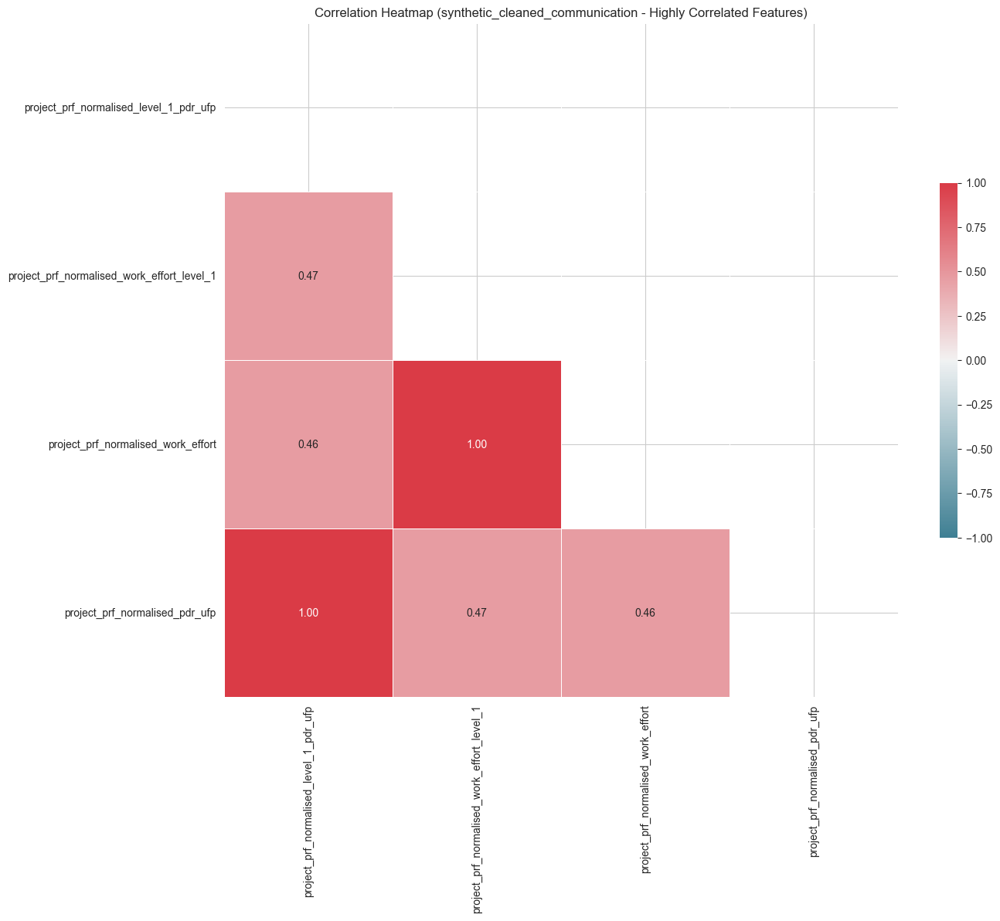

Correlation heatmap saved as ../seed/synthetic_cleaned_communication_correlation_heatmap.png
Number of samples (rows): 10000
Number of features (columns): 27
Minimum number of rows needed to calculate VIF: 28


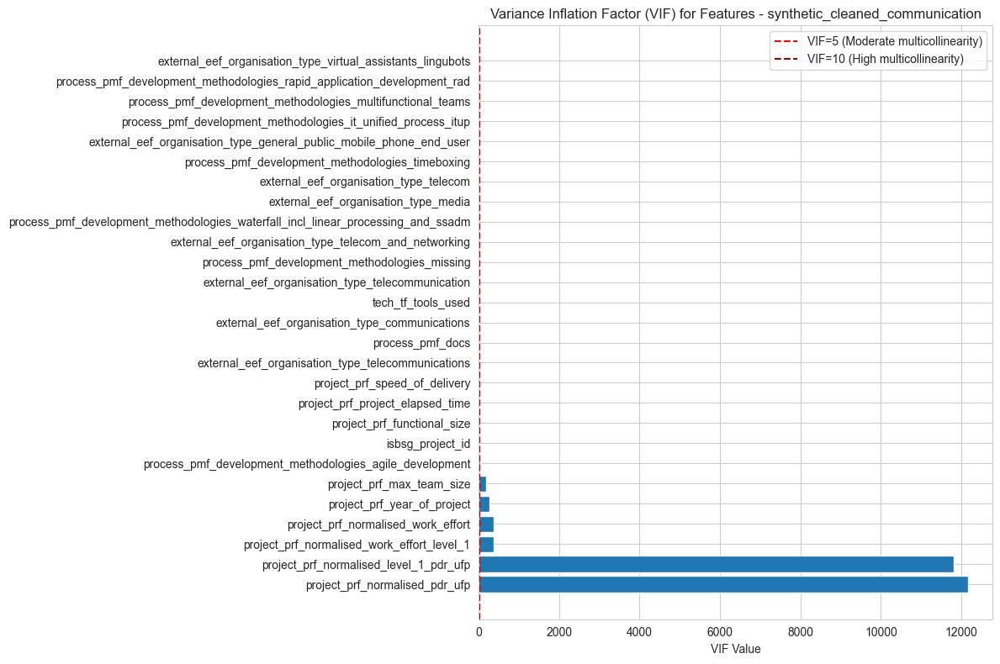

VIF values plot saved as ../seed/synthetic_cleaned_communication_vif_values.png

Found 2 feature pairs with correlation > 0.7:
  • project_prf_normalised_level_1_pdr_ufp and project_prf_normalised_pdr_ufp: 0.9999
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_work_effort: 0.9970

Features with high VIF (> 10):
  • project_prf_normalised_pdr_ufp: 12162.35
  • project_prf_normalised_level_1_pdr_ufp: 11801.95
  • project_prf_normalised_work_effort_level_1: 374.41
  • project_prf_normalised_work_effort: 366.27
  • project_prf_year_of_project: 259.53
  • project_prf_max_team_size: 187.99
  • process_pmf_development_methodologies_agile_development: 31.65
  • isbsg_project_id: 10.89
  • project_prf_functional_size: 10.68
  • project_prf_project_elapsed_time: 10.26
  • project_prf_speed_of_delivery: 10.10

--- Multicollinearity Analysis Recommendations ---
Consider addressing multicollinearity by:
1. Removing one feature from each highly correlated pair
2. Creating n

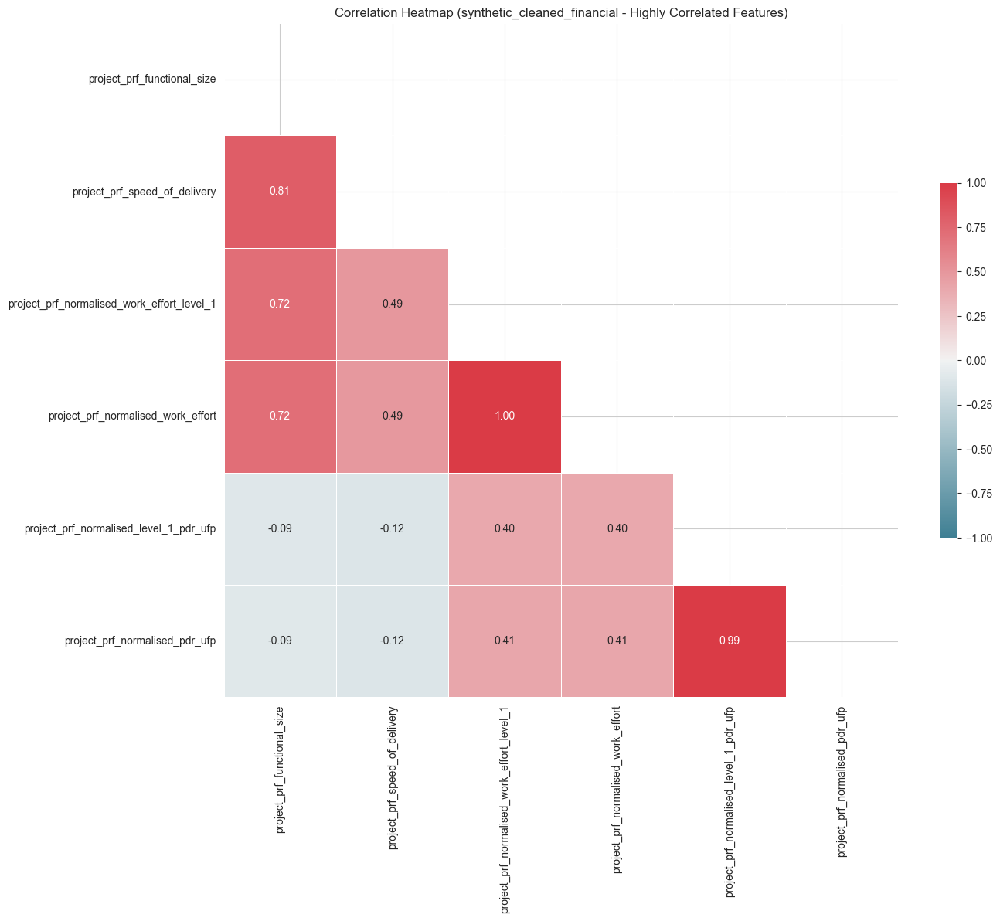

Correlation heatmap saved as ../seed/synthetic_cleaned_financial_correlation_heatmap.png
Number of samples (rows): 10000
Number of features (columns): 23
Minimum number of rows needed to calculate VIF: 24


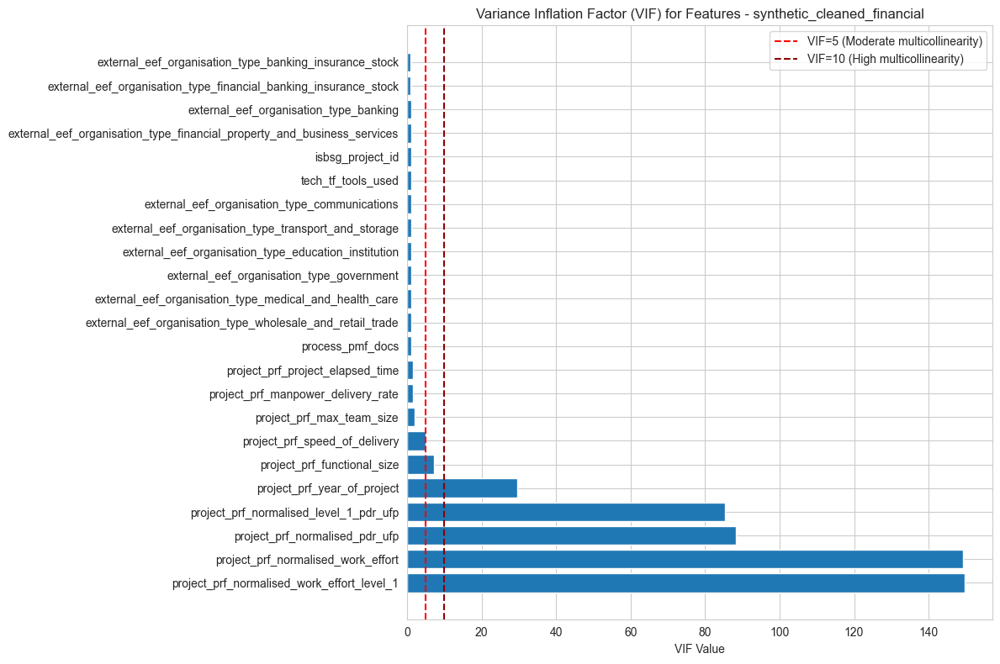

VIF values plot saved as ../seed/synthetic_cleaned_financial_vif_values.png

Found 5 feature pairs with correlation > 0.7:
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_work_effort: 0.9959
  • project_prf_normalised_level_1_pdr_ufp and project_prf_normalised_pdr_ufp: 0.9927
  • project_prf_functional_size and project_prf_speed_of_delivery: 0.8078
  • project_prf_functional_size and project_prf_normalised_work_effort: 0.7179
  • project_prf_functional_size and project_prf_normalised_work_effort_level_1: 0.7171

Features with high VIF (> 10):
  • project_prf_normalised_work_effort_level_1: 149.64
  • project_prf_normalised_work_effort: 149.20
  • project_prf_normalised_pdr_ufp: 88.19
  • project_prf_normalised_level_1_pdr_ufp: 85.26
  • project_prf_year_of_project: 29.47

--- Multicollinearity Analysis Recommendations ---
Consider addressing multicollinearity by:
1. Removing one feature from each highly correlated pair
2. Creating new features by combining cor

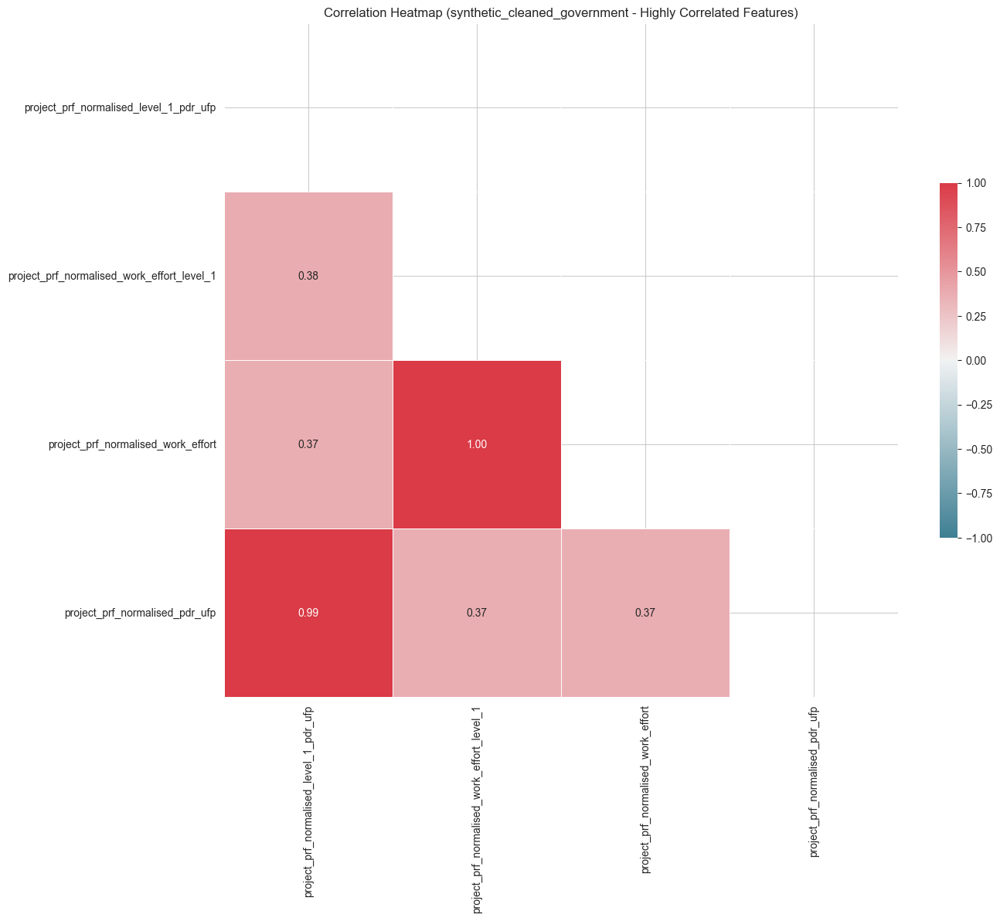

Correlation heatmap saved as ../seed/synthetic_cleaned_government_correlation_heatmap.png
Number of samples (rows): 10000
Number of features (columns): 21
Minimum number of rows needed to calculate VIF: 22


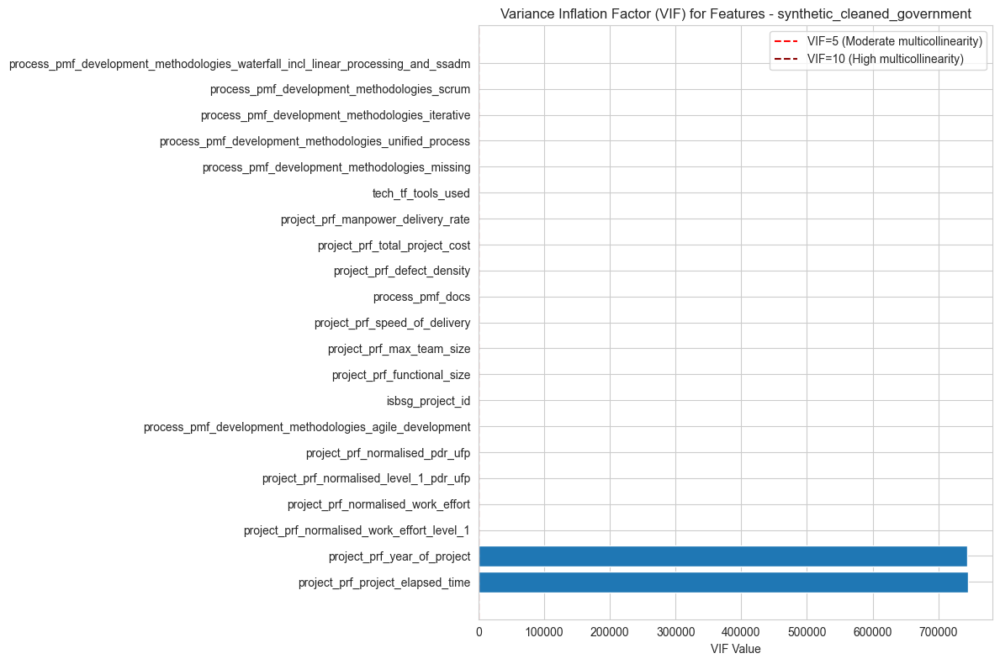

VIF values plot saved as ../seed/synthetic_cleaned_government_vif_values.png

Found 2 feature pairs with correlation > 0.7:
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_work_effort: 0.9970
  • project_prf_normalised_level_1_pdr_ufp and project_prf_normalised_pdr_ufp: 0.9932

Features with high VIF (> 10):
  • project_prf_project_elapsed_time: 745234.52
  • project_prf_year_of_project: 743925.04
  • project_prf_normalised_work_effort_level_1: 510.34
  • project_prf_normalised_work_effort: 421.56
  • project_prf_normalised_level_1_pdr_ufp: 254.48
  • project_prf_normalised_pdr_ufp: 244.15
  • process_pmf_development_methodologies_agile_development: 39.49
  • isbsg_project_id: 12.68

--- Multicollinearity Analysis Recommendations ---
Consider addressing multicollinearity by:
1. Removing one feature from each highly correlated pair
2. Creating new features by combining correlated features
3. Applying dimensionality reduction techniques like PCA

Potential candi

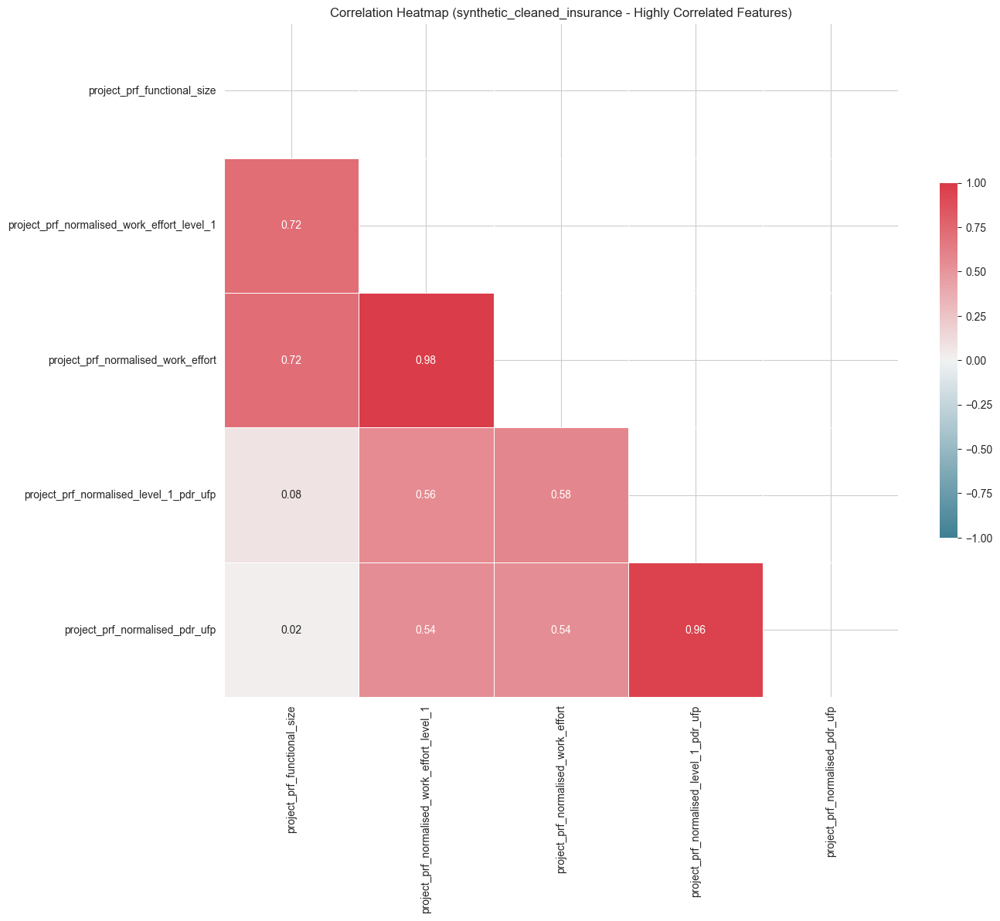

Correlation heatmap saved as ../seed/synthetic_cleaned_insurance_correlation_heatmap.png
Number of samples (rows): 10000
Number of features (columns): 29
Minimum number of rows needed to calculate VIF: 30


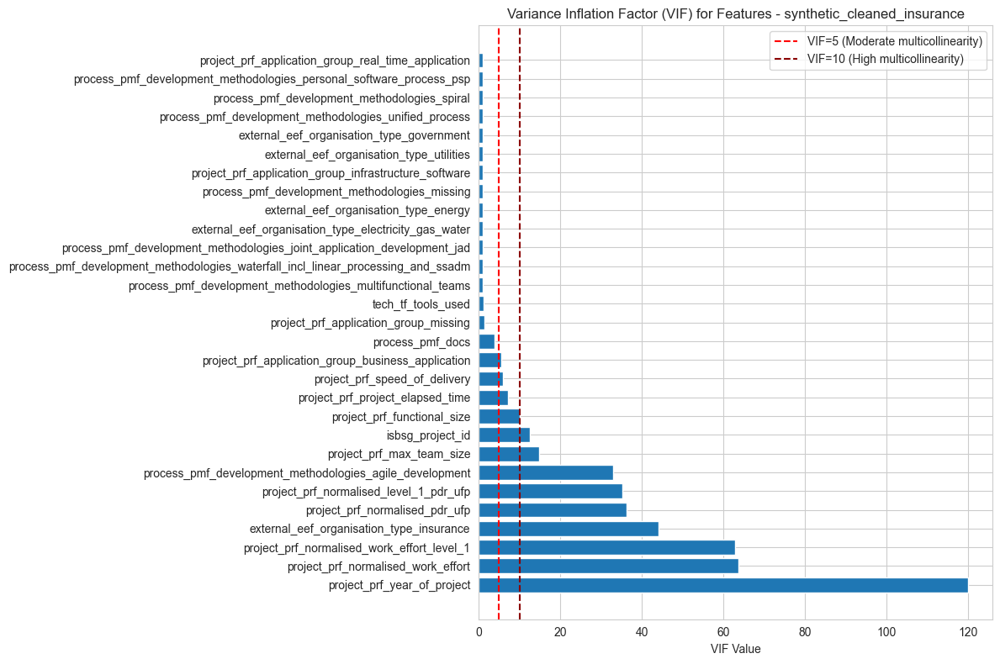

VIF values plot saved as ../seed/synthetic_cleaned_insurance_vif_values.png

Found 4 feature pairs with correlation > 0.7:
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_work_effort: 0.9843
  • project_prf_normalised_level_1_pdr_ufp and project_prf_normalised_pdr_ufp: 0.9579
  • project_prf_functional_size and project_prf_normalised_work_effort_level_1: 0.7201
  • project_prf_functional_size and project_prf_normalised_work_effort: 0.7163

Features with high VIF (> 10):
  • project_prf_year_of_project: 119.92
  • project_prf_normalised_work_effort: 63.61
  • project_prf_normalised_work_effort_level_1: 62.92
  • external_eef_organisation_type_insurance: 44.10
  • project_prf_normalised_pdr_ufp: 36.19
  • project_prf_normalised_level_1_pdr_ufp: 35.20
  • process_pmf_development_methodologies_agile_development: 32.86
  • project_prf_max_team_size: 14.79
  • isbsg_project_id: 12.53
  • project_prf_functional_size: 10.14

--- Multicollinearity Analysis Recommendati

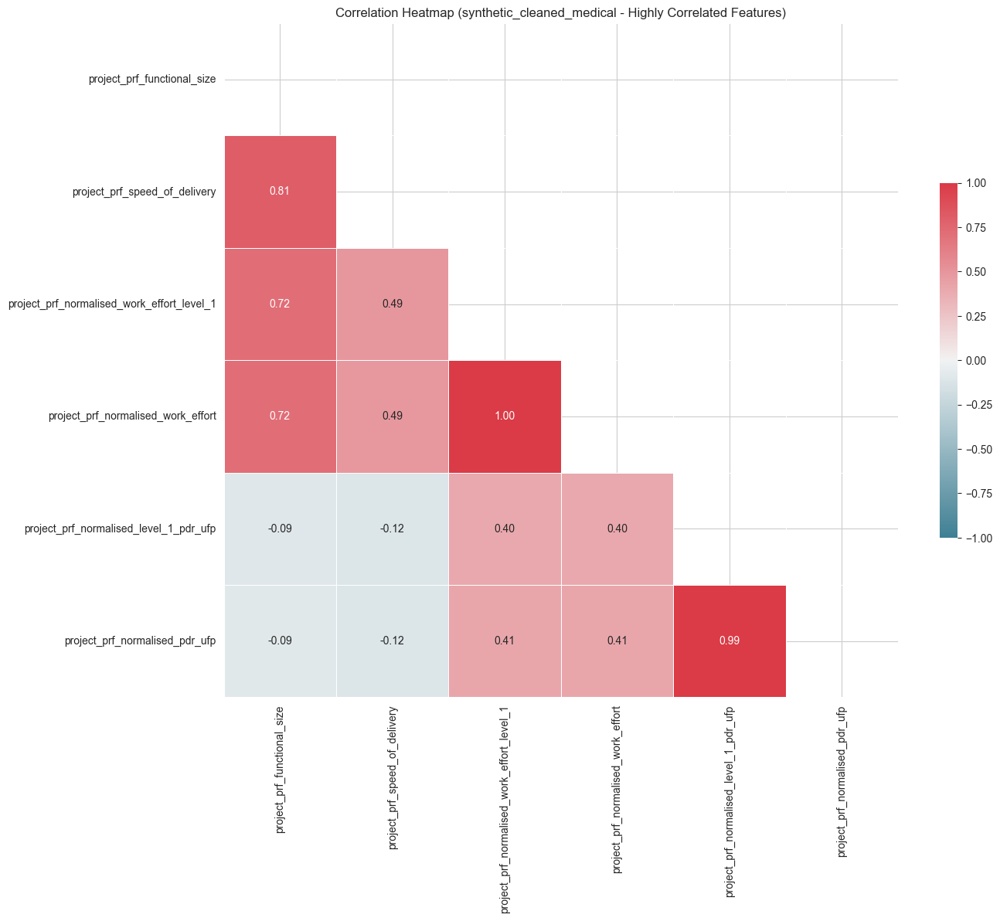

Correlation heatmap saved as ../seed/synthetic_cleaned_medical_correlation_heatmap.png
Number of samples (rows): 10000
Number of features (columns): 23
Minimum number of rows needed to calculate VIF: 24


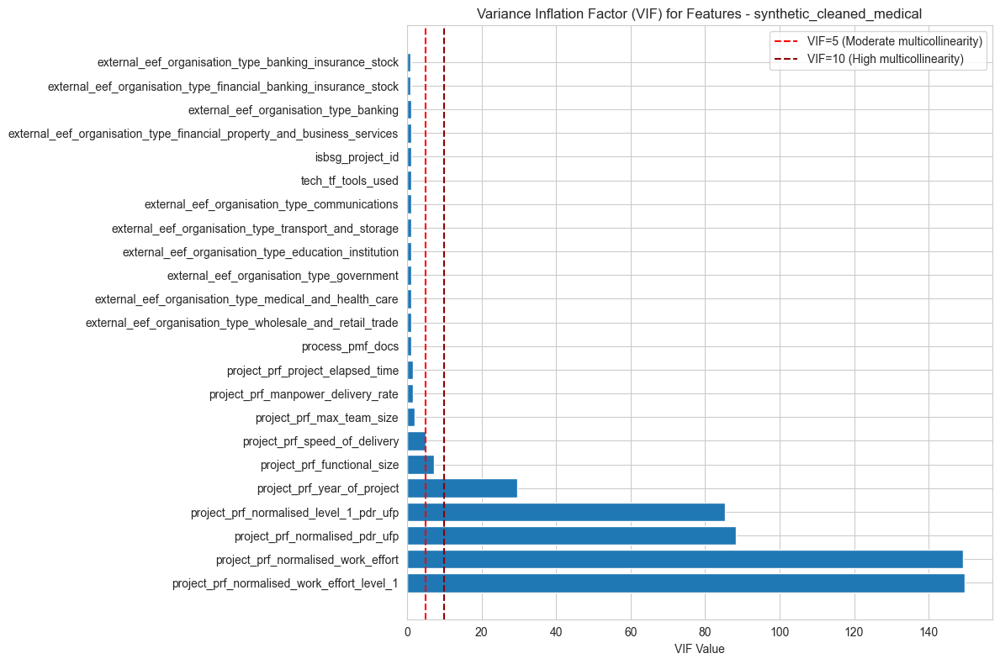

VIF values plot saved as ../seed/synthetic_cleaned_medical_vif_values.png

Found 5 feature pairs with correlation > 0.7:
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_work_effort: 0.9959
  • project_prf_normalised_level_1_pdr_ufp and project_prf_normalised_pdr_ufp: 0.9927
  • project_prf_functional_size and project_prf_speed_of_delivery: 0.8078
  • project_prf_functional_size and project_prf_normalised_work_effort: 0.7179
  • project_prf_functional_size and project_prf_normalised_work_effort_level_1: 0.7171

Features with high VIF (> 10):
  • project_prf_normalised_work_effort_level_1: 149.64
  • project_prf_normalised_work_effort: 149.20
  • project_prf_normalised_pdr_ufp: 88.19
  • project_prf_normalised_level_1_pdr_ufp: 85.26
  • project_prf_year_of_project: 29.47

--- Multicollinearity Analysis Recommendations ---
Consider addressing multicollinearity by:
1. Removing one feature from each highly correlated pair
2. Creating new features by combining corre

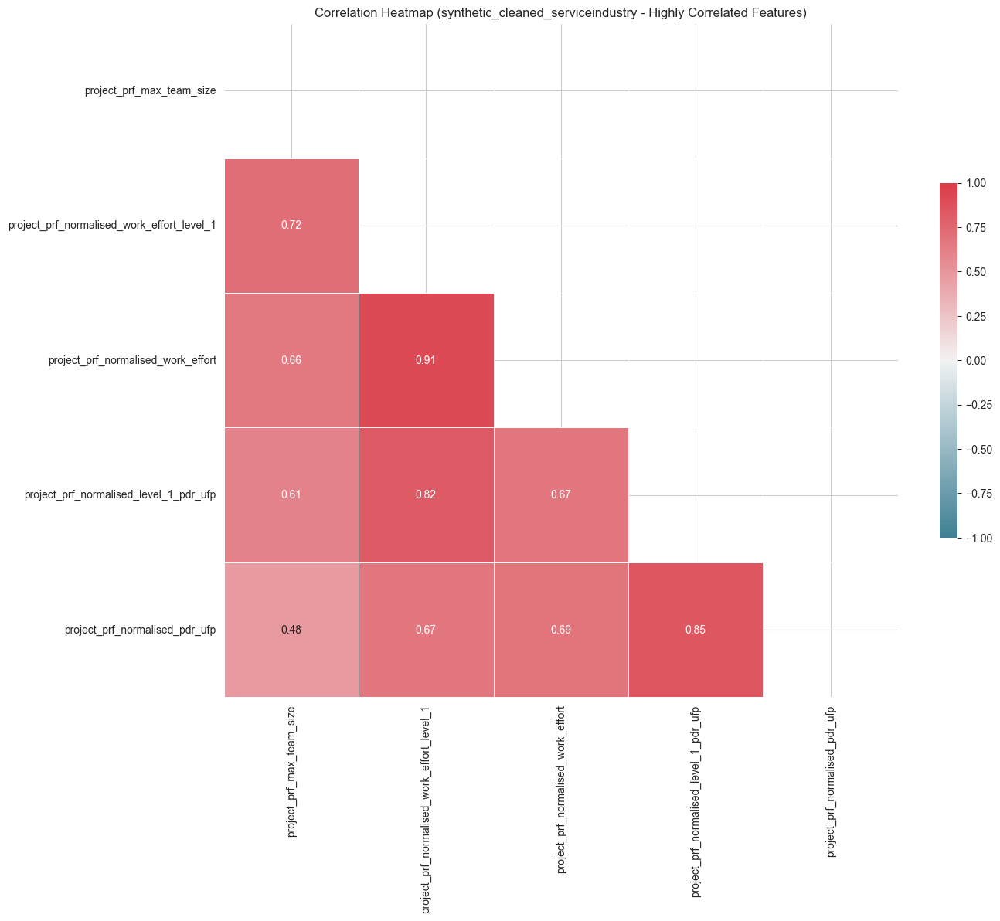

Correlation heatmap saved as ../seed/synthetic_cleaned_serviceindustry_correlation_heatmap.png
Number of samples (rows): 10000
Number of features (columns): 49
Minimum number of rows needed to calculate VIF: 50


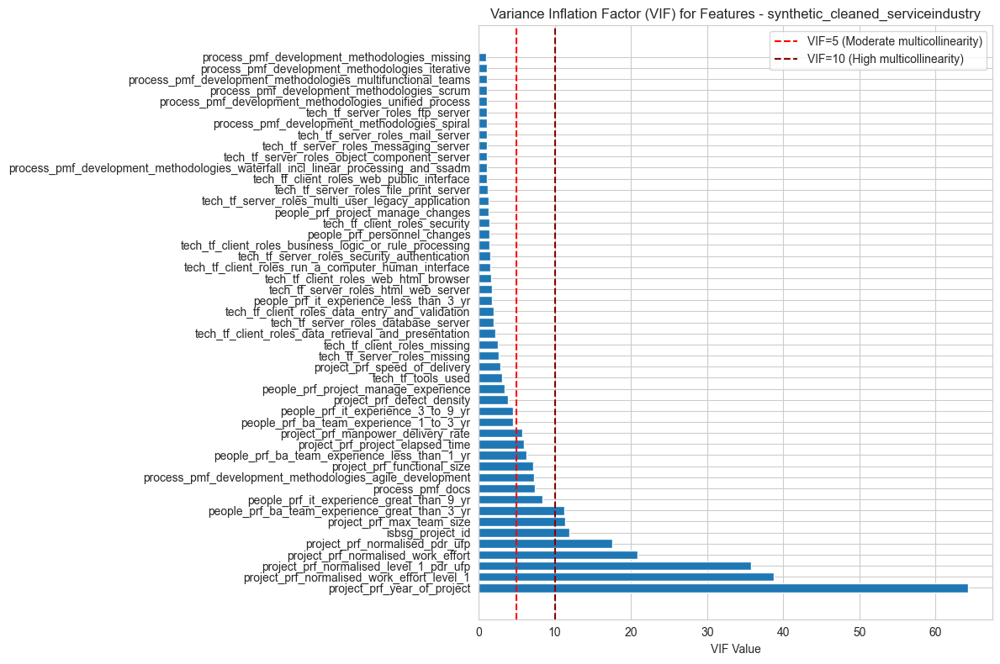

VIF values plot saved as ../seed/synthetic_cleaned_serviceindustry_vif_values.png

Found 4 feature pairs with correlation > 0.7:
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_work_effort: 0.9084
  • project_prf_normalised_level_1_pdr_ufp and project_prf_normalised_pdr_ufp: 0.8469
  • project_prf_normalised_work_effort_level_1 and project_prf_normalised_level_1_pdr_ufp: 0.8159
  • project_prf_normalised_work_effort_level_1 and project_prf_max_team_size: 0.7183

Features with high VIF (> 10):
  • project_prf_year_of_project: 64.27
  • project_prf_normalised_work_effort_level_1: 38.81
  • project_prf_normalised_level_1_pdr_ufp: 35.76
  • project_prf_normalised_work_effort: 20.89
  • project_prf_normalised_pdr_ufp: 17.59
  • isbsg_project_id: 11.90
  • project_prf_max_team_size: 11.36
  • people_prf_ba_team_experience_great_than_3_yr: 11.31

--- Multicollinearity Analysis Recommendations ---
Consider addressing multicollinearity by:
1. Removing one feature from 

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

print("\nAnalyzing feature correlations...")

for file_prefix, df_clean in dfs_clean.items():
    print(f"\n----- {file_prefix} -----")

    # Optionally drop columns you want to ignore here
    # ignore_cols = [...]  # If you have any to ignore
    # df_clean = df_clean.drop(columns=ignore_cols, errors='ignore')

    # Create directory for plots
    os.makedirs(plots_folder, exist_ok=True)

    # Only numeric columns for analysis
    X_numeric = df_clean.select_dtypes(include=[np.number])

    # Drop columns that are all NaN
    X_numeric = X_numeric.dropna(axis=1, how='all')

    # Replace inf/-inf with NaN and impute missing values with mean
    X_numeric_clean = X_numeric.replace([np.inf, -np.inf], np.nan)
    X_numeric_clean = X_numeric_clean.fillna(X_numeric_clean.mean())

    print(f"Rows after dropping all-NaN columns: {X_numeric_clean.shape[0]}")
    print(f"Columns after dropping all-NaN columns: {X_numeric_clean.shape[1]}")
    print("Any column with all NaNs?", X_numeric_clean.isnull().all().any())
    print("Missing value count per column after cleaning:")
    print(X_numeric_clean.isnull().sum())

    n_features = X_numeric_clean.shape[1]
    print(f"Analysing correlations among {n_features} numeric features")

    # Calculate correlation matrix
    corr_matrix = X_numeric_clean.corr()

    # Find highly correlated feature pairs
    correlation_threshold = 0.7
    high_corr_pairs = []
    for i in range(n_features):
        for j in range(i+1, n_features):
            if abs(corr_matrix.iloc[i, j]) > correlation_threshold:
                high_corr_pairs.append((
                    X_numeric_clean.columns[i],
                    X_numeric_clean.columns[j],
                    corr_matrix.iloc[i, j]
                ))

    # Plot correlation heatmap
    plt.figure(figsize=(14, 12))
    mask = np.triu(corr_matrix)
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    if n_features > 20:
        print(f"Large number of features detected ({n_features}). Creating filtered correlation matrix.")
        high_corr_features = set()
        for feat1, feat2, _ in high_corr_pairs:
            high_corr_features.add(feat1)
            high_corr_features.add(feat2)
        if high_corr_features:
            high_corr_features = list(high_corr_features)
            filtered_corr = corr_matrix.loc[high_corr_features, high_corr_features]
            sns.heatmap(filtered_corr, mask=np.triu(filtered_corr),
                        cmap=cmap, vmax=1, vmin=-1, center=0,
                        square=True, linewidths=.5, cbar_kws={"shrink": .5},
                        annot=True, fmt=".2f")
            plt.title(f'Correlation Heatmap ({file_prefix} - Highly Correlated Features)')
        else:
            sns.heatmap(corr_matrix, mask=mask,
                        cmap=cmap, vmax=1, vmin=-1, center=0,
                        square=True, linewidths=.5, cbar_kws={"shrink": .5})
            plt.title(f'Correlation Heatmap ({file_prefix} - All Features)')
    else:
        sns.heatmap(corr_matrix, mask=mask,
                    cmap=cmap, vmax=1, vmin=-1, center=0,
                    square=True, linewidths=.5, cbar_kws={"shrink": .5},
                    annot=True, fmt=".2f")
        plt.title(f'Correlation Heatmap ({file_prefix})')

    plt.tight_layout()
    plt.savefig(f"{plots_folder}/{file_prefix}_correlation_heatmap.png")
    plt.show()
    plt.close()
    print(f"Correlation heatmap saved as {plots_folder}/{file_prefix}_correlation_heatmap.png")

    # --- VIF calculation ---
    n_rows = X_numeric_clean.shape[0]
    n_features = X_numeric_clean.shape[1]
    min_rows_needed = n_features + 1
    print(f"Number of samples (rows): {n_rows}")
    print(f"Number of features (columns): {n_features}")
    print(f"Minimum number of rows needed to calculate VIF: {min_rows_needed}")

    vif_data = None
    if n_rows > n_features:
        try:
            from statsmodels.stats.outliers_influence import variance_inflation_factor

            vif_data = pd.DataFrame()
            vif_data["Feature"] = X_numeric_clean.columns
            vif_data["VIF"] = [variance_inflation_factor(X_numeric_clean.values, i)
                               for i in range(X_numeric_clean.shape[1])]

            vif_data = vif_data.sort_values("VIF", ascending=False)

            plt.figure(figsize=(12, 8))
            plt.barh(vif_data["Feature"], vif_data["VIF"])
            plt.axvline(x=5, color='r', linestyle='--', label='VIF=5 (Moderate multicollinearity)')
            plt.axvline(x=10, color='darkred', linestyle='--', label='VIF=10 (High multicollinearity)')
            plt.xlabel('VIF Value')
            plt.title(f'Variance Inflation Factor (VIF) for Features - {file_prefix}')
            plt.legend()
            plt.tight_layout()
            plt.savefig(f"{plots_folder}/{file_prefix}_vif_values.png")
            plt.show()
            plt.close()
            print(f"VIF values plot saved as {plots_folder}/{file_prefix}_vif_values.png")
        except Exception as vif_err:
            print(f"Could not calculate VIF: {vif_err}")
    else:
        print("Not enough samples to calculate VIF (need more samples than features)")

    # Print results
    print(f"\nFound {len(high_corr_pairs)} feature pairs with correlation > {correlation_threshold}:")
    for feat1, feat2, corr in sorted(high_corr_pairs, key=lambda x: abs(x[2]), reverse=True):
        print(f"  • {feat1} and {feat2}: {corr:.4f}")

    if vif_data is not None:
        high_vif_threshold = 10
        high_vif_features = vif_data[vif_data["VIF"] > high_vif_threshold]
        if not high_vif_features.empty:
            print(f"\nFeatures with high VIF (> {high_vif_threshold}):")
            for _, row in high_vif_features.iterrows():
                print(f"  • {row['Feature']}: {row['VIF']:.2f}")
        else:
            print(f"\nNo features have VIF > {high_vif_threshold}")

    print("\n--- Multicollinearity Analysis Recommendations ---")
    if high_corr_pairs:
        print("Consider addressing multicollinearity by:")
        print("1. Removing one feature from each highly correlated pair")
        print("2. Creating new features by combining correlated features")
        print("3. Applying dimensionality reduction techniques like PCA")
        if len(high_corr_pairs) > 0:
            print("\nPotential candidates for removal:")
            freq = {}
            for feat1, feat2, _ in high_corr_pairs:
                freq[feat1] = freq.get(feat1, 0) + 1
                freq[feat2] = freq.get(feat2, 0) + 1
            freq_df = pd.DataFrame({'Feature': list(freq.keys()),
                                    'Frequency in high corr pairs': list(freq.values())})
            freq_df = freq_df.sort_values('Frequency in high corr pairs', ascending=False)
            for _, row in freq_df.head(5).iterrows():
                print(f"  • {row['Feature']} (appears in {row['Frequency in high corr pairs']} high correlation pairs)")
    else:
        print("No significant multicollinearity detected based on correlation analysis.")

    if vif_data is not None and not high_vif_features.empty:
        print("\nBased on VIF analysis, consider removing or transforming these features with high VIF values.")

print("\nDone analyzing feature correlations for all files.")



In [26]:
for file_prefix, df_fixed in dfs_fixed.items():
    output_path = f'{data_folder}/{file_prefix}_fixed_columns_data.csv'
    df_fixed.to_csv(output_path, index=False)
    print(f"Saved data with fixed column names to '{output_path}'")


Saved data with fixed column names to '../seed/synthetic_cleaned_communication_fixed_columns_data.csv'
Saved data with fixed column names to '../seed/synthetic_cleaned_financial_fixed_columns_data.csv'
Saved data with fixed column names to '../seed/synthetic_cleaned_government_fixed_columns_data.csv'
Saved data with fixed column names to '../seed/synthetic_cleaned_insurance_fixed_columns_data.csv'
Saved data with fixed column names to '../seed/synthetic_cleaned_medical_fixed_columns_data.csv'
Saved data with fixed column names to '../seed/synthetic_cleaned_serviceindustry_fixed_columns_data.csv'
Cell executed at: 2025-07-09 16:16:15.721520


[Back to top](#Index:)

<a id='part4'></a>

# Part 4 - Data Profiling

xxx

In [27]:
try:
    from ydata_profiling import ProfileReport
    
    for file_prefix, df_fixed in dfs_fixed.items():
        print(f"\nGenerating data profile report for {file_prefix}...")
        profile = ProfileReport(df_fixed, title=f"{file_prefix} Dataset Profiling Report", minimal=True)
        profile_path = f"{data_folder}/{file_prefix}_data_profile_sdv.html"
        profile.to_file(profile_path)
        print(f"Data profile report saved to '{profile_path}'")
except ImportError:
    print("\nSkipping data profiling (ydata_profiling not installed)")
    print("To install: pip install ydata-profiling")



Generating data profile report for synthetic_cleaned_communication...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/86 [00:00<?, ?it/s]
%|██▍       | 21/86 [00:00<00:00, 165.49it/s]
%|██████▏   | 53/86 [00:00<00:00, 246.63it/s]
100%|██████████| 86/86 [00:00<00:00, 248.85it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Data profile report saved to '../seed/synthetic_cleaned_communication_data_profile_sdv.html'

Generating data profile report for synthetic_cleaned_financial...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/88 [00:00<?, ?it/s]
%|█▎        | 11/88 [00:00<00:01, 75.79it/s]
100%|██████████| 88/88 [00:00<00:00, 267.95it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Data profile report saved to '../seed/synthetic_cleaned_financial_data_profile_sdv.html'

Generating data profile report for synthetic_cleaned_government...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/92 [00:00<?, ?it/s]
%|▎         | 3/92 [00:00<00:08, 10.44it/s]
%|██████▏   | 57/92 [00:00<00:00, 185.70it/s]
100%|██████████| 92/92 [00:00<00:00, 159.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Data profile report saved to '../seed/synthetic_cleaned_government_data_profile_sdv.html'

Generating data profile report for synthetic_cleaned_insurance...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/82 [00:00<?, ?it/s]
%|█▎        | 11/82 [00:00<00:00, 81.87it/s]
100%|██████████| 82/82 [00:00<00:00, 262.20it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Data profile report saved to '../seed/synthetic_cleaned_insurance_data_profile_sdv.html'

Generating data profile report for synthetic_cleaned_medical...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/88 [00:00<?, ?it/s]
%|█▎        | 11/88 [00:00<00:00, 87.02it/s]
%|█████▋    | 50/88 [00:00<00:00, 243.62it/s]
100%|██████████| 88/88 [00:00<00:00, 231.42it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Data profile report saved to '../seed/synthetic_cleaned_medical_data_profile_sdv.html'

Generating data profile report for synthetic_cleaned_serviceindustry...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/107 [00:00<?, ?it/s]
%|▎         | 4/107 [00:00<00:03, 31.46it/s]
%|█▉        | 21/107 [00:00<00:01, 85.48it/s]
%|████▎     | 46/107 [00:00<00:00, 134.64it/s]
100%|██████████| 107/107 [00:00<00:00, 176.31it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Data profile report saved to '../seed/synthetic_cleaned_serviceindustry_data_profile_sdv.html'
Cell executed at: 2025-07-09 16:18:18.230252


[Back to top](#Index:)

<a id='part5'></a>

# Part 5 - PyCaret setup

xxx

In [28]:
print(sklearn.__version__)
print(pycaret.__version__)  

1.4.2
3.3.2
Cell executed at: 2025-07-09 16:18:18.238862


In [29]:
#Identify any dupliate columns

for file_prefix, df_fixed in dfs_fixed.items():
    dupes = df_fixed.columns[df_fixed.columns.duplicated()].tolist()
    print(f"[{file_prefix}] Duplicate columns: {dupes}")


[synthetic_cleaned_communication] Duplicate columns: ['project_prf_application_group_mathematically_intensive_application', 'project_prf_application_group_business_application', 'project_prf_application_group_mathematically_intensive_application', 'project_prf_application_group_missing', 'project_prf_application_group_real_time_application']
[synthetic_cleaned_financial] Duplicate columns: ['project_prf_application_group_business_application', 'project_prf_application_group_missing']
[synthetic_cleaned_government] Duplicate columns: ['project_prf_application_group_business_application', 'project_prf_application_group_missing']
[synthetic_cleaned_insurance] Duplicate columns: []
[synthetic_cleaned_medical] Duplicate columns: ['project_prf_application_group_business_application', 'project_prf_application_group_missing']
[synthetic_cleaned_serviceindustry] Duplicate columns: ['project_prf_application_group_business_application', 'project_prf_application_group_missing']
Cell executed at: 2

In [30]:
# Remove leading/trailing whitespace and unify columns
for file_prefix, df_fixed in dfs_fixed.items():
    df_fixed.columns = [col.strip().lower() for col in df_fixed.columns]
    print(f"[{file_prefix}] Columns after cleaning:")
    print(df_fixed.columns.tolist())


[synthetic_cleaned_communication] Columns after cleaning:
['isbsg_project_id', 'project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_normalised_work_effort_level_1', 'project_prf_normalised_work_effort', 'project_prf_normalised_level_1_pdr_ufp', 'project_prf_normalised_pdr_ufp', 'project_prf_speed_of_delivery', 'project_prf_project_elapsed_time', 'process_pmf_docs', 'tech_tf_tools_used', 'project_prf_max_team_size', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_general_public_mobile_phone_end_user', 'external_eef_organisation_type_media', 'external_eef_organisation_type_telecom', 'external_eef_organisation_type_telecom_and_networking', 'external_eef_organisation_type_telecommunication', 'external_eef_organisation_type_telecommunications', 'external_eef_organisation_type_virtual_assistants_lingubots', 'process_pmf_development_methodologies_agile_development', '

In [31]:
# Check for duplicate columns, might require to run multiple times until no duplicate columns found.

for file_prefix, df_fixed in dfs_fixed.items():
    dupes = df_fixed.columns[df_fixed.columns.duplicated()].tolist()
    while dupes:
        print(f"[{file_prefix}] Duplicate columns found: {dupes}")
        # Drop duplicates, keep first occurrence
        df_fixed = df_fixed.loc[:, ~df_fixed.columns.duplicated()]
        # Update in the dictionary
        dfs_fixed[file_prefix] = df_fixed
        # Check again
        dupes = df_fixed.columns[df_fixed.columns.duplicated()].tolist()
    print(f"[{file_prefix}] No duplicate columns remaining.")


[synthetic_cleaned_communication] Duplicate columns found: ['project_prf_application_group_mathematically_intensive_application', 'project_prf_application_group_business_application', 'project_prf_application_group_mathematically_intensive_application', 'project_prf_application_group_missing', 'project_prf_application_group_real_time_application']
[synthetic_cleaned_communication] No duplicate columns remaining.
[synthetic_cleaned_financial] Duplicate columns found: ['project_prf_application_group_business_application', 'project_prf_application_group_missing']
[synthetic_cleaned_financial] No duplicate columns remaining.
[synthetic_cleaned_government] Duplicate columns found: ['project_prf_application_group_business_application', 'project_prf_application_group_missing']
[synthetic_cleaned_government] No duplicate columns remaining.
[synthetic_cleaned_insurance] No duplicate columns remaining.
[synthetic_cleaned_medical] Duplicate columns found: ['project_prf_application_group_business_

[Back to top](#Index:)

<a id='part6'></a>

# Part 6 - Model Building with PyCaret

xxx

In [32]:
import pandas as pd
import numpy as np
from pycaret.regression import setup, compare_models, tune_model, finalize_model, save_model, load_model, get_config, pull
from sklearn.preprocessing import StandardScaler
import joblib, json, os, time

# ======== User definitions (update these as needed) ========
# Example:
# dfs_fixed = {"communication": df1, "government": df2, ...}
# TARGET_COL = "project_prf_normalised_work_effort"
# ignore_cols = ["isbsg_project_id", ...]
# Set folder paths
#data_folder = 'data_folder'
#models_folder = 'models_folder'
#skeleton_models_folder = 'skeleton_models_folder'
#logs_folder = 'logs_folder'

ignore_cols = [
    'isbsg_project_id', 'external_eef_data_quality_rating', 'external_eef_data_quality_rating_b', 
    'project_prf_normalised_work_effort_level_1', 'project_prf_normalised_level_1_pdr_ufp', 
    'project_prf_normalised_pdr_ufp', 'project_prf_project_elapsed_time', 
    'people_prf_ba_team_experience_less_than_1_yr', 'people_prf_ba_team_experience_1_to_3_yr', 
    'people_prf_ba_team_experience_great_than_3_yr', 'people_prf_it_experience_less_than_1_yr', 
    'people_prf_it_experience_1_to_3_yr', 'people_prf_it_experience_great_than_3_yr', 
    'people_prf_it_experience_less_than_3_yr', 'people_prf_it_experience_3_to_9_yr', 
    'people_prf_it_experience_great_than_9_yr', 'people_prf_project_manage_experience', 
    'project_prf_total_project_cost', 'project_prf_cost_currency', 'project_prf_currency_multiple', 
    'project_prf_speed_of_delivery', 'people_prf_project_manage_changes', 
    'project_prf_defect_density', 'project_prf_manpower_delivery_rate'
]
ignore_cols = [col.lower() for col in ignore_cols]

# ========= Helper function =========
def fix_mixed_type_columns_simple(df):
    """Fix mixed type columns before PyCaret setup"""
    df_copy = df.copy()
    mixed_type_cols = [
        'external_eef_industry_sector',
        'tech_tf_client_roles', 
        'tech_tf_clientserver_description',
        'tech_tf_development_platform_hand_held'
    ]
    for col in mixed_type_cols:
        if col in df_copy.columns:
            if col == 'tech_tf_development_platform_hand_held':
                df_copy[col] = df_copy[col].fillna(False).astype(bool)
            else:
                df_copy[col] = df_copy[col].astype(str)
                df_copy[col] = df_copy[col].replace('nan', np.nan)
    return df_copy

# ======= Directory creation =======
os.makedirs(data_folder, exist_ok=True)
os.makedirs(models_folder, exist_ok=True)
os.makedirs(skeleton_models_folder, exist_ok=True)
os.makedirs(logs_folder, exist_ok=True)

# ======= Batch workflow =======
for dataset_name, df in dfs_fixed.items():
    print(f"\n=== Processing dataset: {dataset_name} ===")
    start_time = time.time()
    # Step 1: Clean data
    df_fixed_types = fix_mixed_type_columns_simple(df)
    df_fixed_types.columns = [col.lower() for col in df_fixed_types.columns]
    target_col = TARGET_COL.lower()

    # Step 2: PyCaret setup
    setup_results = setup(
        data=df_fixed_types,
        target=target_col,
        ignore_features=ignore_cols,
        session_id=123,
        preprocess=True,
        normalize=True,
        normalize_method='zscore',
        imputation_type='simple',
        numeric_imputation='mean',
        categorical_imputation='mode',
        verbose=True
    )

    # Step 3: Save preprocessed data
    X = get_config("X")
    y = get_config("y")
    X.to_csv(f"{data_folder}/{dataset_name}_pycaret_processed_features.csv", index=False)
    y.to_csv(f"{data_folder}/{dataset_name}_pycaret_processed_target.csv", index=False)
    print(f"All preprocessed feature names (as list): {X.columns.tolist()}")
    print(f"Preprocessed data shape: {X.shape}")

    # Step 4: Model comparison and tuning
    print("\nComparing regression models and selecting top 3...")
    top_models = compare_models(n_select=3)
    model_results = pull()
    model_results.to_csv(f"{logs_folder}/{dataset_name}_model_comparison_results.csv")
    print("\nModel comparison results:")
    print(model_results)

    tuned_models = []
    scores = []
    for i, model in enumerate(top_models, 1):
        model_name = type(model).__name__
        print(f"\nModel {i}: {model_name}")
        # Tune
        print("  Tuning...")
        tuned = tune_model(model, n_iter=10)
        tuned_models.append(tuned)
        tuned_results = pull()
        try:
            tuned_mae = tuned_results.iloc[-2]['MAE']
            tuned_rmse = tuned_results.iloc[-2]['RMSE']
            tuned_r2 = tuned_results.iloc[-2]['R2']
        except Exception as e:
            print(f"Error extracting mean metrics: {e}")
            tuned_mae = tuned_rmse = tuned_r2 = None

        tuned_results.to_csv(f'{logs_folder}/{dataset_name}_tuned_results_model_{i}_{model_name}.csv')
        scores.append({
            'Model': model_name,
            'MAE': tuned_mae,
            'RMSE': tuned_rmse,
            'R2': tuned_r2
        })

        # Save full pipeline
        save_model(tuned, f"{models_folder}/{dataset_name}_top_model_{i}_{model_name}")
        print(f"  Saved as {models_folder}/{dataset_name}_top_model_{i}_{model_name}.pkl")

        # Save skeleton model (sklearn only)
        final_model = finalize_model(tuned)
        try:
            sklearn_model = final_model[-1]  # If pipeline
        except Exception:
            sklearn_model = final_model  # If direct estimator

        if hasattr(final_model, 'feature_names_in_'):
            model_feature_names = list(final_model.feature_names_in_)
        elif hasattr(sklearn_model, 'feature_names_in_'):
            model_feature_names = list(sklearn_model.feature_names_in_)
        else:
            model_feature_names = None

        model_path = f"{skeleton_models_folder}/{dataset_name}_top_model_skeleton_{i}_{model_name}.pkl"
        joblib.dump(sklearn_model, model_path)
        print(f"  Saved skeleton model as {model_path}")

        if model_feature_names is not None:
            features_path = model_path.replace('.pkl', '_features.json')
            with open(features_path, 'w') as f:
                json.dump(model_feature_names, f)
            print(f"  Saved feature names as {features_path}")

    # Step 5: Save summary
    score_df = pd.DataFrame(scores)
    score_df.to_csv(f"{logs_folder}/{dataset_name}_tuned_model_scores.csv", index=False)
    print("\nTuned models summary for {}:\n".format(dataset_name), score_df)
    print(f"\nAll top 3 models have been tuned, evaluated, and saved for {dataset_name}.")
    print(f"Time elapsed for {dataset_name}: {time.time() - start_time:.1f} seconds")

print("\n=== All datasets processed ===")





=== Processing dataset: synthetic_cleaned_communication ===


,Description,Value
0,Session id,123
1,Target,project_prf_normalised_work_effort
2,Target type,Regression
3,Original data shape,"(10000, 81)"
4,Transformed data shape,"(10000, 75)"
5,Transformed train set shape,"(7000, 75)"
6,Transformed test set shape,"(3000, 75)"
7,Ignore features,24
8,Numeric features,20
9,Categorical features,2


All preprocessed feature names (as list): ['project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'process_pmf_docs', 'tech_tf_tools_used', 'project_prf_max_team_size', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_general_public_mobile_phone_end_user', 'external_eef_organisation_type_media', 'external_eef_organisation_type_telecom', 'external_eef_organisation_type_telecom_and_networking', 'external_eef_organisation_type_telecommunication', 'external_eef_organisation_type_telecommunications', 'external_eef_organisation_type_virtual_assistants_lingubots', 'process_pmf_development_methodologies_agile_development', 'process_pmf_development_methodologies_it_unified_process_itup', 'process_pmf_development_methodologies_missing', 'process_pmf_development_methodologies_multifunctional_teams', 'process_pmf_development_methodologies_rapid_application_development_rad', 'process_pmf_d

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
br,Bayesian Ridge,1554.2478,4588367.3290,2139.9842,0.1857,0.9438,1.3727,0.0850
lasso,Lasso Regression,1553.8541,4591788.5160,2140.8754,0.1849,0.9405,1.3607,0.0700
llar,Lasso Least Angle Regression,1553.8535,4591787.5457,2140.8751,0.1849,0.9405,1.3607,0.0560
ridge,Ridge Regression,1554.2575,4593395.5882,2141.2581,0.1846,0.9413,1.3601,0.0600
lar,Least Angle Regression,1554.2590,4593423.9214,2141.2651,0.1846,0.9413,1.3600,0.0620
lr,Linear Regression,1554.5420,4593776.1121,2141.3536,0.1845,0.9420,1.3608,1.3220
gbr,Gradient Boosting Regressor,1554.5564,4650026.8871,2153.9228,0.1752,0.9351,1.3618,0.5470
en,Elastic Net,1570.3808,4654271.7359,2154.8278,0.1751,0.9615,1.4538,0.0540
omp,Orthogonal Matching Pursuit,1567.8200,4684128.0675,2162.2823,0.1687,0.9507,1.4078,0.0520
huber,Huber Regressor,1484.3782,4752468.8600,2177.5900,0.1573,0.8861,1.1037,0.0950



Model comparison results:
                                    Model        MAE           MSE       RMSE  \
br                         Bayesian Ridge  1554.2478  4.588367e+06  2139.9842   
lasso                    Lasso Regression  1553.8541  4.591789e+06  2140.8754   
llar         Lasso Least Angle Regression  1553.8535  4.591788e+06  2140.8751   
ridge                    Ridge Regression  1554.2575  4.593396e+06  2141.2581   
lar                Least Angle Regression  1554.2590  4.593424e+06  2141.2651   
lr                      Linear Regression  1554.5420  4.593776e+06  2141.3536   
gbr           Gradient Boosting Regressor  1554.5564  4.650027e+06  2153.9228   
en                            Elastic Net  1570.3808  4.654272e+06  2154.8278   
omp           Orthogonal Matching Pursuit  1567.8200  4.684128e+06  2162.2823   
huber                     Huber Regressor  1484.3782  4.752469e+06  2177.5900   
lightgbm  Light Gradient Boosting Machine  1565.6148  4.753703e+06  2178.1003   
r

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1625.8153,5175541.6092,2274.9817,0.2026,0.9549,1.3953
1,1535.8172,4612284.1455,2147.6229,0.1658,0.9410,1.3883
2,1526.0145,4581559.0558,2140.4577,0.2271,0.9505,1.3398
3,1503.8980,4487247.0147,2118.3123,0.1573,0.9133,1.2868
4,1570.4564,4661834.0686,2159.1281,0.2316,0.9586,1.4498
5,1523.2278,4087923.0472,2021.8613,0.1894,0.9433,1.3673
6,1553.4336,4755405.9933,2180.6893,0.2121,0.9235,1.3408
7,1643.1003,4840240.3446,2200.0546,0.1490,0.9773,1.4606
8,1444.5483,3735156.3273,1932.6553,0.1493,0.9068,1.2879


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_communication_top_model_1_BayesianRidge.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_communication_top_model_skeleton_1_BayesianRidge.pkl
  Saved feature names as ../seed/synthetic_cleaned_communication_top_model_skeleton_1_BayesianRidge_features.json

Model 2: Lasso
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1621.4162,5173746.8246,2274.5872,0.2029,0.9522,1.3897
1,1534.6321,4616019.8254,2148.4925,0.1651,0.9389,1.3816
2,1522.2322,4571169.0229,2138.0292,0.2288,0.9488,1.3322
3,1504.0900,4498375.5353,2120.9374,0.1552,0.9117,1.2822
4,1566.1183,4651542.6328,2156.7435,0.2333,0.9563,1.4424
5,1525.0617,4090570.5932,2022.5159,0.1888,0.9383,1.3635
6,1550.5508,4750741.9570,2179.6197,0.2128,0.9205,1.3322
7,1638.5527,4821767.8144,2195.8524,0.1522,0.9746,1.4545
8,1442.0354,3731316.2108,1931.6615,0.1502,0.9049,1.2823


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_communication_top_model_2_Lasso.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_communication_top_model_skeleton_2_Lasso.pkl
  Saved feature names as ../seed/synthetic_cleaned_communication_top_model_skeleton_2_Lasso_features.json

Model 3: LassoLars
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1622.2161,5161993.8177,2272.0022,0.2047,0.9527,1.3820
1,1538.4094,4631068.1717,2151.9917,0.1624,0.9407,1.3786
2,1521.8044,4565004.3089,2136.5871,0.2299,0.9304,1.3214
3,1504.0283,4508004.4537,2123.2062,0.1534,0.9101,1.2708
4,1566.6219,4642996.8511,2154.7614,0.2347,0.9550,1.4374
5,1523.9235,4104457.1054,2025.9460,0.1861,0.9442,1.3525
6,1554.2119,4757240.7034,2181.1100,0.2118,0.9236,1.3321
7,1644.9688,4847242.6447,2201.6454,0.1477,0.9765,1.4523
8,1445.7445,3757349.3816,1938.3883,0.1442,0.9055,1.2758


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_communication_top_model_3_LassoLars.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_communication_top_model_skeleton_3_LassoLars.pkl
  Saved feature names as ../seed/synthetic_cleaned_communication_top_model_skeleton_3_LassoLars_features.json

Tuned models summary for synthetic_cleaned_communication:
            Model        MAE       RMSE      R2
0  BayesianRidge  1554.2514  2139.9794  0.1857
1          Lasso  1551.5546  2138.8828  0.1865
2      LassoLars  1553.9732  2140.9893  0.1848

All top 3 models have been tuned, evaluated, and saved for synthetic_cleaned_communication.
Time elapsed for synthetic_cleaned_communication: 110.8 seconds

=== Processing dataset: synthetic_cleaned

,Description,Value
0,Session id,123
1,Target,project_prf_normalised_work_effort
2,Target type,Regression
3,Original data shape,"(10000, 86)"
4,Transformed data shape,"(10000, 93)"
5,Transformed train set shape,"(7000, 93)"
6,Transformed test set shape,"(3000, 93)"
7,Ignore features,24
8,Numeric features,15
9,Categorical features,2


All preprocessed feature names (as list): ['project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_max_team_size', 'process_pmf_docs', 'tech_tf_tools_used', 'external_eef_organisation_type_banking_insurance_stock', 'external_eef_organisation_type_banking', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_education_institution', 'external_eef_organisation_type_financial_banking_insurance_stock', 'external_eef_organisation_type_financial_property_and_business_services', 'external_eef_organisation_type_government', 'external_eef_organisation_type_medical_and_health_care', 'external_eef_organisation_type_transport_and_storage', 'external_eef_organisation_type_wholesale_and_retail_trade', 'external_eef_industry_sector_banking', 'external_eef_industry_sector_financial', 'project_prf_application_group_business_application', 'project_prf_application_group_infrastructure_so

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2131.6595,10348246.0397,3211.1903,0.6657,1.1137,2.5049,0.5570
lightgbm,Light Gradient Boosting Machine,2122.8321,10454448.5341,3227.9467,0.6621,1.0573,2.0919,0.2880
br,Bayesian Ridge,2258.6116,10675336.5700,3263.0191,0.6545,1.3030,4.6652,0.1120
lasso,Lasso Regression,2257.9695,10675365.8585,3263.0740,0.6544,1.3006,4.6661,0.0770
ridge,Ridge Regression,2259.0767,10677481.8014,3263.4130,0.6544,1.3027,4.6803,0.0650
lar,Least Angle Regression,2259.0866,10677542.6532,3263.4233,0.6544,1.3028,4.6806,0.0650
llar,Lasso Least Angle Regression,2257.9819,10675454.7772,3263.0883,0.6544,1.3006,4.6661,0.0650
lr,Linear Regression,2259.5864,10678268.4007,3263.5344,0.6543,1.3045,4.6967,0.0730
huber,Huber Regressor,2168.4245,10991043.2155,3309.2573,0.6449,1.1988,3.3349,0.1190
omp,Orthogonal Matching Pursuit,2290.6193,11149593.4278,3333.6545,0.6395,1.2968,4.2955,0.0610



Model comparison results:
                                    Model        MAE           MSE       RMSE  \
gbr           Gradient Boosting Regressor  2131.6595  1.034825e+07  3211.1903   
lightgbm  Light Gradient Boosting Machine  2122.8321  1.045445e+07  3227.9467   
br                         Bayesian Ridge  2258.6116  1.067534e+07  3263.0191   
lasso                    Lasso Regression  2257.9695  1.067537e+07  3263.0740   
ridge                    Ridge Regression  2259.0767  1.067748e+07  3263.4130   
lar                Least Angle Regression  2259.0866  1.067754e+07  3263.4233   
llar         Lasso Least Angle Regression  2257.9819  1.067545e+07  3263.0883   
lr                      Linear Regression  2259.5864  1.067827e+07  3263.5344   
huber                     Huber Regressor  2168.4245  1.099104e+07  3309.2573   
omp           Orthogonal Matching Pursuit  2290.6193  1.114959e+07  3333.6545   
par          Passive Aggressive Regressor  2168.5947  1.129765e+07  3354.6052   
e

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2370.3043,12745107.3567,3570.0290,0.6141,1.1136,2.1974
1,2340.2576,12358066.5741,3515.4042,0.6234,1.1296,2.1394
2,2370.9156,12859586.2711,3586.0265,0.6018,1.0970,2.4236
3,2382.0064,13126267.8896,3623.0192,0.6176,1.0679,2.0104
4,2127.6852,10041752.7698,3168.8725,0.6434,1.1597,2.4012
5,2249.8249,11713806.4653,3422.5439,0.6142,1.1249,2.5275
6,2302.2354,12612626.0238,3551.4259,0.6160,1.2306,2.9304
7,2279.3575,11449657.6797,3383.7343,0.6478,1.1386,2.4868
8,2048.1513,8866858.4030,2977.7271,0.6241,1.1280,2.3461


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_financial_top_model_1_GradientBoostingRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_financial_top_model_skeleton_1_GradientBoostingRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_financial_top_model_skeleton_1_GradientBoostingRegressor_features.json

Model 2: LGBMRegressor
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2216.0542,11409924.4987,3377.8580,0.6545,1.0589,2.0168
1,2159.3967,10744364.2869,3277.8597,0.6726,1.1149,2.2396
2,2094.1241,10508825.2687,3241.7318,0.6746,1.0156,2.0155
3,2164.8787,11155094.0703,3339.9243,0.6750,1.0328,1.9612
4,1987.2888,9041616.3684,3006.9281,0.6789,1.1004,2.2499
5,2094.2737,9940162.5361,3152.8023,0.6726,1.0688,2.1968
6,2138.0318,11092727.1439,3330.5746,0.6623,1.1528,2.8713
7,2134.9179,10457810.8284,3233.8539,0.6783,1.1005,2.3299
8,1903.7408,7645391.2714,2765.0301,0.6759,1.0855,2.4291


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_financial_top_model_2_LGBMRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_financial_top_model_skeleton_2_LGBMRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_financial_top_model_skeleton_2_LGBMRegressor_features.json

Model 3: BayesianRidge
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2344.5305,12239625.6835,3498.5176,0.6294,1.2525,4.2188
1,2327.8965,11119151.3545,3334.5392,0.6611,1.3001,3.8556
2,2230.6522,10929038.7527,3305.9097,0.6616,1.2674,5.0759
3,2323.7101,11601996.1668,3406.1703,0.6620,1.2248,3.4656
4,2131.0006,9374092.6648,3061.7140,0.6671,1.2612,3.7951
5,2268.1606,10651453.6736,3263.6565,0.6492,1.3328,4.8411
6,2292.1057,11278451.1152,3358.3405,0.6566,1.4356,6.0433
7,2318.6724,10903308.1641,3302.0158,0.6646,1.3190,4.9094
8,2140.4539,8313183.2982,2883.2591,0.6476,1.3610,5.4933


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_financial_top_model_3_BayesianRidge.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_financial_top_model_skeleton_3_BayesianRidge.pkl
  Saved feature names as ../seed/synthetic_cleaned_financial_top_model_skeleton_3_BayesianRidge_features.json

Tuned models summary for synthetic_cleaned_financial:
                        Model        MAE       RMSE      R2
0  GradientBoostingRegressor  2268.2776  3420.9839  0.6204
1              LGBMRegressor  2095.8716  3192.3234  0.6695
2              BayesianRidge  2258.6094  3263.0182  0.6545

All top 3 models have been tuned, evaluated, and saved for synthetic_cleaned_financial.
Time elapsed for synthetic_cleaned_financial: 243.8 seconds

=== P

,Description,Value
0,Session id,123
1,Target,project_prf_normalised_work_effort
2,Target type,Regression
3,Original data shape,"(10000, 90)"
4,Transformed data shape,"(10000, 94)"
5,Transformed train set shape,"(7000, 94)"
6,Transformed test set shape,"(3000, 94)"
7,Ignore features,24
8,Numeric features,11
9,Categorical features,3


All preprocessed feature names (as list): ['project_prf_year_of_project', 'external_eef_organisation_type', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_max_team_size', 'process_pmf_docs', 'tech_tf_tools_used', 'process_pmf_development_methodologies_agile_development', 'process_pmf_development_methodologies_iterative', 'process_pmf_development_methodologies_missing', 'process_pmf_development_methodologies_scrum', 'process_pmf_development_methodologies_unified_process', 'process_pmf_development_methodologies_waterfall_incl_linear_processing_and_ssadm', 'external_eef_industry_sector_government', 'project_prf_application_group_business_application', 'project_prf_application_group_infrastructure_software', 'project_prf_application_group_mathematically_intensive_application', 'project_prf_application_group_missing', 'project_prf_application_group_real_time_application', 'project_prf_development_type_enhancement', 'projec

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2433.4577,14076595.3293,3746.3186,0.6049,1.1385,2.2454,0.6350
et,Extra Trees Regressor,2501.9525,15008457.1567,3866.8262,0.5804,1.1299,2.3057,2.9680
rf,Random Forest Regressor,2492.5529,15001146.9766,3864.6895,0.5800,1.1129,2.2130,2.4270
br,Bayesian Ridge,2614.3338,15050412.7157,3873.6543,0.5799,1.3239,3.6538,0.1200
lasso,Lasso Regression,2618.7366,15048303.9263,3873.4818,0.5798,1.3260,3.6765,0.0640
llar,Lasso Least Angle Regression,2618.7390,15048344.3463,3873.4865,0.5798,1.3260,3.6765,0.0850
ridge,Ridge Regression,2619.9826,15052295.8570,3874.0075,0.5797,1.3225,3.6855,0.0660
lr,Linear Regression,2622.0394,15065343.0526,3875.6211,0.5794,1.3279,3.6924,0.0790
omp,Orthogonal Matching Pursuit,2608.8384,15226180.5949,3895.5737,0.5751,1.3004,3.3354,0.0740
lar,Least Angle Regression,2632.1678,15269167.1280,3901.4661,0.5734,1.3270,3.7239,0.0800



Model comparison results:
                              Model        MAE           MSE       RMSE  \
gbr     Gradient Boosting Regressor  2433.4577  1.407660e+07  3746.3186   
et            Extra Trees Regressor  2501.9525  1.500846e+07  3866.8262   
rf          Random Forest Regressor  2492.5529  1.500115e+07  3864.6895   
br                   Bayesian Ridge  2614.3338  1.505041e+07  3873.6543   
lasso              Lasso Regression  2618.7366  1.504830e+07  3873.4818   
llar   Lasso Least Angle Regression  2618.7390  1.504834e+07  3873.4865   
ridge              Ridge Regression  2619.9826  1.505230e+07  3874.0075   
lr                Linear Regression  2622.0394  1.506534e+07  3875.6211   
omp     Orthogonal Matching Pursuit  2608.8384  1.522618e+07  3895.5737   
lar          Least Angle Regression  2632.1678  1.526917e+07  3901.4661   
huber               Huber Regressor  2491.2680  1.588527e+07  3977.6802   
par    Passive Aggressive Regressor  2492.1165  1.625250e+07  4022.8536  

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2553.8843,15524540.8750,3940.1194,0.5792,1.1526,2.1356
1,2521.3555,14908545.7613,3861.1586,0.5642,1.1150,1.9983
2,2615.1617,15991042.5375,3998.8802,0.5257,1.1743,2.3390
3,2533.1476,14928604.5253,3863.7552,0.6382,1.2362,2.4644
4,2348.5198,12662118.8434,3558.3871,0.5711,1.2046,2.4144
5,2624.1250,18540013.7297,4305.8116,0.5856,1.1984,2.3422
6,2604.5448,17641951.9368,4200.2324,0.4071,1.2186,2.2843
7,2492.1711,14970581.9315,3869.1836,0.5584,1.1502,2.2033
8,2760.8362,17463882.2375,4178.9810,0.5230,1.1939,2.3374


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_government_top_model_1_GradientBoostingRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_government_top_model_skeleton_1_GradientBoostingRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_government_top_model_skeleton_1_GradientBoostingRegressor_features.json

Model 2: ExtraTreesRegressor
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2397.9050,13349827.8670,3653.7416,0.6382,1.1239,2.3675
1,2440.5257,13591216.0350,3686.6266,0.6027,1.1130,2.1828
2,2566.5671,15088617.0088,3884.4069,0.5524,1.1636,2.5494
3,2471.0976,15096641.1685,3885.4396,0.6341,1.1973,2.6532
4,2242.6568,11041982.0637,3322.9478,0.6260,1.2325,2.9340
5,2549.1768,18225106.8075,4269.0874,0.5927,1.1832,2.5330
6,2422.3629,14149710.9491,3761.6102,0.5244,1.1603,2.4078
7,2474.9741,14593731.1591,3820.1742,0.5695,1.1507,2.4215
8,2547.5384,15620987.0105,3952.3394,0.5734,1.1887,2.5877


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_government_top_model_2_ExtraTreesRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_government_top_model_skeleton_2_ExtraTreesRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_government_top_model_skeleton_2_ExtraTreesRegressor_features.json

Model 3: RandomForestRegressor
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2366.5161,13348945.7907,3653.6209,0.6382,1.0565,2.0265
1,2423.3493,13901611.8314,3728.4865,0.5937,1.0616,1.8887
2,2526.8422,14787119.4790,3845.4024,0.5614,1.1084,2.3016
3,2414.2987,14137991.1738,3760.0520,0.6573,1.1148,2.2044
4,2210.9235,10902874.7297,3301.9501,0.6307,1.1514,2.4826
5,2533.8677,18179828.9137,4263.7811,0.5937,1.1332,2.2591
6,2493.1201,16348620.0369,4043.3427,0.4505,1.1058,2.1169
7,2425.7102,13843091.6957,3720.6306,0.5917,1.0915,2.1124
8,2537.0820,16085062.4672,4010.6187,0.5607,1.1267,2.2603


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_government_top_model_3_RandomForestRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_government_top_model_skeleton_3_RandomForestRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_government_top_model_skeleton_3_RandomForestRegressor_features.json

Tuned models summary for synthetic_cleaned_government:
                        Model        MAE       RMSE      R2
0  GradientBoostingRegressor  2575.6417  3998.9320  0.5498
1        ExtraTreesRegressor  2466.5943  3819.1752  0.5913
2      RandomForestRegressor  2449.3173  3832.7834  0.5868

All top 3 models have been tuned, evaluated, and saved for synthetic_cleaned_government.
Time elapsed for synthetic_cleaned_government: 948.0 seconds

=== Processing dataset: synthetic_cleaned_insurance ===


,Description,Value
0,Session id,123
1,Target,project_prf_normalised_work_effort
2,Target type,Regression
3,Original data shape,"(10000, 82)"
4,Transformed data shape,"(10000, 76)"
5,Transformed train set shape,"(7000, 76)"
6,Transformed test set shape,"(3000, 76)"
7,Ignore features,24
8,Numeric features,22
9,Categorical features,2


All preprocessed feature names (as list): ['project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'process_pmf_docs', 'tech_tf_tools_used', 'project_prf_max_team_size', 'external_eef_organisation_type_electricity_gas_water', 'external_eef_organisation_type_energy', 'external_eef_organisation_type_government', 'external_eef_organisation_type_insurance', 'external_eef_organisation_type_utilities', 'project_prf_application_group_business_application', 'project_prf_application_group_infrastructure_software', 'project_prf_application_group_missing', 'project_prf_application_group_real_time_application', 'process_pmf_development_methodologies_agile_development', 'process_pmf_development_methodologies_joint_application_development_jad', 'process_pmf_development_methodologies_missing', 'process_pmf_development_methodologies_multifunctional_teams', 'process_pmf_development_methodologies_personal_software_process_psp'

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,1270.6403,3846587.4565,1959.5684,0.5596,1.1002,1.9761,0.5150
lasso,Lasso Regression,1312.6516,3871788.2552,1965.9623,0.5568,1.2056,2.3957,0.0680
llar,Lasso Least Angle Regression,1312.6533,3871787.7539,1965.9622,0.5568,1.2055,2.3958,0.0630
br,Bayesian Ridge,1313.9486,3873788.3477,1966.4736,0.5566,1.2060,2.4159,0.0740
lr,Linear Regression,1313.6829,3873953.7738,1966.5105,0.5565,1.2060,2.4023,0.0730
ridge,Ridge Regression,1313.6855,3873941.7840,1966.5075,0.5565,1.2061,2.4025,0.0640
lar,Least Angle Regression,1313.6829,3873953.7738,1966.5105,0.5565,1.2060,2.4023,0.0690
omp,Orthogonal Matching Pursuit,1308.6762,3927719.9200,1980.1937,0.5505,1.1887,2.2946,0.0520
lightgbm,Light Gradient Boosting Machine,1286.5581,3991158.6019,1996.5935,0.5423,1.0900,1.9288,0.2640
huber,Huber Regressor,1253.3553,4024350.8293,2004.1724,0.5398,1.1217,1.8154,0.0870



Model comparison results:
                                    Model        MAE           MSE       RMSE  \
gbr           Gradient Boosting Regressor  1270.6403  3.846587e+06  1959.5684   
lasso                    Lasso Regression  1312.6516  3.871788e+06  1965.9623   
llar         Lasso Least Angle Regression  1312.6533  3.871788e+06  1965.9622   
br                         Bayesian Ridge  1313.9486  3.873788e+06  1966.4736   
lr                      Linear Regression  1313.6829  3.873954e+06  1966.5105   
ridge                    Ridge Regression  1313.6855  3.873942e+06  1966.5075   
lar                Least Angle Regression  1313.6829  3.873954e+06  1966.5105   
omp           Orthogonal Matching Pursuit  1308.6762  3.927720e+06  1980.1937   
lightgbm  Light Gradient Boosting Machine  1286.5581  3.991159e+06  1996.5935   
huber                     Huber Regressor  1253.3553  4.024351e+06  2004.1724   
rf                Random Forest Regressor  1312.1459  4.035945e+06  2007.5762   
p

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1270.9374,3772410.9541,1942.2695,0.4913,1.1251,1.9362
1,1357.7500,4263375.3055,2064.7943,0.5448,1.1094,1.8977
2,1341.5812,4219038.1184,2054.0297,0.4865,1.1320,2.0122
3,1434.1431,4667118.7203,2160.3515,0.4455,1.1346,2.0590
4,1415.6659,4802903.7989,2191.5528,0.4900,1.1691,2.1421
5,1329.6299,4147819.6881,2036.6197,0.4385,1.1884,2.1780
6,1348.8487,4548307.1190,2132.6760,0.4899,1.1274,1.9714
7,1330.3182,4518099.5695,2125.5822,0.4996,1.0972,1.8923
8,1357.4695,4638087.9772,2153.6221,0.5228,1.1858,2.2292


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_insurance_top_model_1_GradientBoostingRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_insurance_top_model_skeleton_1_GradientBoostingRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_insurance_top_model_skeleton_1_GradientBoostingRegressor_features.json

Model 2: Lasso
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1193.4630,3147980.8324,1774.2550,0.5755,1.1713,2.2439
1,1328.3602,3843675.4545,1960.5294,0.5896,1.1928,2.3497
2,1309.6847,3751569.0763,1936.8968,0.5434,1.1844,2.4489
3,1305.5113,3908983.0257,1977.1148,0.5356,1.1352,2.1226
4,1373.1966,4139536.1176,2034.5850,0.5605,1.2402,2.6267
5,1288.7083,3504832.5898,1872.1198,0.5256,1.2267,2.3916
6,1331.4283,4212180.3701,2052.3597,0.5276,1.2155,2.4614
7,1308.2673,4115249.7699,2028.6078,0.5442,1.2132,2.3547
8,1315.6057,4125339.7228,2031.0932,0.5756,1.1718,2.3013


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_insurance_top_model_2_Lasso.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_insurance_top_model_skeleton_2_Lasso.pkl
  Saved feature names as ../seed/synthetic_cleaned_insurance_top_model_skeleton_2_Lasso_features.json

Model 3: LassoLars
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1200.2689,3157837.1043,1777.0304,0.5742,1.1598,2.2587
1,1332.5789,3838337.6166,1959.1676,0.5901,1.1983,2.3942
2,1314.9954,3757240.4117,1938.3602,0.5427,1.2106,2.4905
3,1316.0063,3934385.2357,1983.5285,0.5326,1.1476,2.1706
4,1382.7639,4156858.7034,2038.8376,0.5586,1.2704,2.6950
5,1293.3020,3513408.8383,1874.4089,0.5244,1.2735,2.4349
6,1340.9464,4241554.6058,2059.5035,0.5243,1.2120,2.5418
7,1316.8125,4128418.4749,2031.8510,0.5427,1.2174,2.4251
8,1320.5318,4125298.7589,2031.0831,0.5756,1.1770,2.3202


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_insurance_top_model_3_LassoLars.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_insurance_top_model_skeleton_3_LassoLars.pkl
  Saved feature names as ../seed/synthetic_cleaned_insurance_top_model_skeleton_3_LassoLars_features.json

Tuned models summary for synthetic_cleaned_insurance:
                        Model        MAE       RMSE      R2
0  GradientBoostingRegressor  1356.1558  2096.0377  0.4956
1                      Lasso  1305.9830  1963.1722  0.5581
2                  LassoLars  1312.9596  1966.1210  0.5567

All top 3 models have been tuned, evaluated, and saved for synthetic_cleaned_insurance.
Time elapsed for synthetic_cleaned_insurance: 169.7 seconds

=== Processing da

,Description,Value
0,Session id,123
1,Target,project_prf_normalised_work_effort
2,Target type,Regression
3,Original data shape,"(10000, 86)"
4,Transformed data shape,"(10000, 93)"
5,Transformed train set shape,"(7000, 93)"
6,Transformed test set shape,"(3000, 93)"
7,Ignore features,24
8,Numeric features,15
9,Categorical features,2


All preprocessed feature names (as list): ['project_prf_year_of_project', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_max_team_size', 'process_pmf_docs', 'tech_tf_tools_used', 'external_eef_organisation_type_banking_insurance_stock', 'external_eef_organisation_type_banking', 'external_eef_organisation_type_communications', 'external_eef_organisation_type_education_institution', 'external_eef_organisation_type_financial_banking_insurance_stock', 'external_eef_organisation_type_financial_property_and_business_services', 'external_eef_organisation_type_government', 'external_eef_organisation_type_medical_and_health_care', 'external_eef_organisation_type_transport_and_storage', 'external_eef_organisation_type_wholesale_and_retail_trade', 'external_eef_industry_sector_banking', 'external_eef_industry_sector_financial', 'project_prf_application_group_business_application', 'project_prf_application_group_infrastructure_so

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2131.6595,10348246.0397,3211.1903,0.6657,1.1137,2.5049,0.5870
lightgbm,Light Gradient Boosting Machine,2122.8321,10454448.5341,3227.9467,0.6621,1.0573,2.0919,0.3280
br,Bayesian Ridge,2258.6116,10675336.5700,3263.0191,0.6545,1.3030,4.6652,0.1040
lasso,Lasso Regression,2257.9695,10675365.8585,3263.0740,0.6544,1.3006,4.6661,0.0810
ridge,Ridge Regression,2259.0767,10677481.8014,3263.4130,0.6544,1.3027,4.6803,0.0620
lar,Least Angle Regression,2259.0866,10677542.6532,3263.4233,0.6544,1.3028,4.6806,0.0650
llar,Lasso Least Angle Regression,2257.9819,10675454.7772,3263.0883,0.6544,1.3006,4.6661,0.0660
lr,Linear Regression,2259.5864,10678268.4007,3263.5344,0.6543,1.3045,4.6967,0.0750
huber,Huber Regressor,2168.4245,10991043.2155,3309.2573,0.6449,1.1988,3.3349,0.1180
omp,Orthogonal Matching Pursuit,2290.6193,11149593.4278,3333.6545,0.6395,1.2968,4.2955,0.0600



Model comparison results:
                                    Model        MAE           MSE       RMSE  \
gbr           Gradient Boosting Regressor  2131.6595  1.034825e+07  3211.1903   
lightgbm  Light Gradient Boosting Machine  2122.8321  1.045445e+07  3227.9467   
br                         Bayesian Ridge  2258.6116  1.067534e+07  3263.0191   
lasso                    Lasso Regression  2257.9695  1.067537e+07  3263.0740   
ridge                    Ridge Regression  2259.0767  1.067748e+07  3263.4130   
lar                Least Angle Regression  2259.0866  1.067754e+07  3263.4233   
llar         Lasso Least Angle Regression  2257.9819  1.067545e+07  3263.0883   
lr                      Linear Regression  2259.5864  1.067827e+07  3263.5344   
huber                     Huber Regressor  2168.4245  1.099104e+07  3309.2573   
omp           Orthogonal Matching Pursuit  2290.6193  1.114959e+07  3333.6545   
par          Passive Aggressive Regressor  2168.5947  1.129765e+07  3354.6052   
e

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2370.3043,12745107.3567,3570.0290,0.6141,1.1136,2.1974
1,2340.2576,12358066.5741,3515.4042,0.6234,1.1296,2.1394
2,2370.9156,12859586.2711,3586.0265,0.6018,1.0970,2.4236
3,2382.0064,13126267.8896,3623.0192,0.6176,1.0679,2.0104
4,2127.6852,10041752.7698,3168.8725,0.6434,1.1597,2.4012
5,2249.8249,11713806.4653,3422.5439,0.6142,1.1249,2.5275
6,2302.2354,12612626.0238,3551.4259,0.6160,1.2306,2.9304
7,2279.3575,11449657.6797,3383.7343,0.6478,1.1386,2.4868
8,2048.1513,8866858.4030,2977.7271,0.6241,1.1280,2.3461


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_medical_top_model_1_GradientBoostingRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_medical_top_model_skeleton_1_GradientBoostingRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_medical_top_model_skeleton_1_GradientBoostingRegressor_features.json

Model 2: LGBMRegressor
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2216.0542,11409924.4987,3377.8580,0.6545,1.0589,2.0168
1,2159.3967,10744364.2869,3277.8597,0.6726,1.1149,2.2396
2,2094.1241,10508825.2687,3241.7318,0.6746,1.0156,2.0155
3,2164.8787,11155094.0703,3339.9243,0.6750,1.0328,1.9612
4,1987.2888,9041616.3684,3006.9281,0.6789,1.1004,2.2499
5,2094.2737,9940162.5361,3152.8023,0.6726,1.0688,2.1968
6,2138.0318,11092727.1439,3330.5746,0.6623,1.1528,2.8713
7,2134.9179,10457810.8284,3233.8539,0.6783,1.1005,2.3299
8,1903.7408,7645391.2714,2765.0301,0.6759,1.0855,2.4291


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_medical_top_model_2_LGBMRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_medical_top_model_skeleton_2_LGBMRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_medical_top_model_skeleton_2_LGBMRegressor_features.json

Model 3: BayesianRidge
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2344.5305,12239625.6835,3498.5176,0.6294,1.2525,4.2188
1,2327.8965,11119151.3545,3334.5392,0.6611,1.3001,3.8556
2,2230.6522,10929038.7527,3305.9097,0.6616,1.2674,5.0759
3,2323.7101,11601996.1668,3406.1703,0.6620,1.2248,3.4656
4,2131.0006,9374092.6648,3061.7140,0.6671,1.2612,3.7951
5,2268.1606,10651453.6736,3263.6565,0.6492,1.3328,4.8411
6,2292.1057,11278451.1152,3358.3405,0.6566,1.4356,6.0433
7,2318.6724,10903308.1641,3302.0158,0.6646,1.3190,4.9094
8,2140.4539,8313183.2982,2883.2591,0.6476,1.3610,5.4933


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_medical_top_model_3_BayesianRidge.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_medical_top_model_skeleton_3_BayesianRidge.pkl
  Saved feature names as ../seed/synthetic_cleaned_medical_top_model_skeleton_3_BayesianRidge_features.json

Tuned models summary for synthetic_cleaned_medical:
                        Model        MAE       RMSE      R2
0  GradientBoostingRegressor  2268.2776  3420.9839  0.6204
1              LGBMRegressor  2095.8716  3192.3234  0.6695
2              BayesianRidge  2258.6094  3263.0182  0.6545

All top 3 models have been tuned, evaluated, and saved for synthetic_cleaned_medical.
Time elapsed for synthetic_cleaned_medical: 253.7 seconds

=== Processing da

,Description,Value
0,Session id,123
1,Target,project_prf_normalised_work_effort
2,Target type,Regression
3,Original data shape,"(10000, 105)"
4,Transformed data shape,"(10000, 122)"
5,Transformed train set shape,"(7000, 122)"
6,Transformed test set shape,"(3000, 122)"
7,Ignore features,24
8,Numeric features,32
9,Categorical features,3


All preprocessed feature names (as list): ['project_prf_year_of_project', 'external_eef_organisation_type', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_max_team_size', 'process_pmf_docs', 'tech_tf_tools_used', 'people_prf_personnel_changes', 'process_pmf_development_methodologies_agile_development', 'process_pmf_development_methodologies_iterative', 'process_pmf_development_methodologies_missing', 'process_pmf_development_methodologies_multifunctional_teams', 'process_pmf_development_methodologies_scrum', 'process_pmf_development_methodologies_spiral', 'process_pmf_development_methodologies_unified_process', 'process_pmf_development_methodologies_waterfall_incl_linear_processing_and_ssadm', 'tech_tf_client_roles_business_logic_or_rule_processing', 'tech_tf_client_roles_data_entry_and_validation', 'tech_tf_client_roles_data_retrieval_and_presentation', 'tech_tf_client_roles_missing', 'tech_tf_client_roles_run_a_comp

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2973.1429,21657477.3991,4651.5856,0.5992,1.1912,2.4121,0.8700
br,Bayesian Ridge,3260.8910,21914782.9576,4678.7675,0.5948,1.4297,4.3910,0.1880
lr,Linear Regression,3273.4632,21922003.3422,4679.5672,0.5947,1.4423,4.4733,0.1220
lasso,Lasso Regression,3271.5035,21921024.6957,4679.4764,0.5947,1.4381,4.4582,0.2990
llar,Lasso Least Angle Regression,3271.5029,21921017.8299,4679.4757,0.5947,1.4382,4.4582,0.1090
ridge,Ridge Regression,3273.1176,21923566.6884,4679.7440,0.5946,1.4393,4.4685,0.0870
huber,Huber Regressor,3066.0644,23731317.0693,4867.5119,0.5619,1.3035,3.1997,0.1800
en,Elastic Net,3253.2044,23958716.6020,4891.3337,0.5576,1.3442,3.5122,0.0980
rf,Random Forest Regressor,3172.5655,23970791.4257,4893.9570,0.5567,1.2325,2.6819,3.8930
et,Extra Trees Regressor,3187.3445,24007962.0654,4898.2821,0.5557,1.2319,2.6821,5.0550



Model comparison results:
                              Model           MAE           MSE          RMSE  \
gbr     Gradient Boosting Regressor  2.973143e+03  2.165748e+07  4.651586e+03   
br                   Bayesian Ridge  3.260891e+03  2.191478e+07  4.678767e+03   
lr                Linear Regression  3.273463e+03  2.192200e+07  4.679567e+03   
lasso              Lasso Regression  3.271503e+03  2.192102e+07  4.679476e+03   
llar   Lasso Least Angle Regression  3.271503e+03  2.192102e+07  4.679476e+03   
ridge              Ridge Regression  3.273118e+03  2.192357e+07  4.679744e+03   
huber               Huber Regressor  3.066064e+03  2.373132e+07  4.867512e+03   
en                      Elastic Net  3.253204e+03  2.395872e+07  4.891334e+03   
rf          Random Forest Regressor  3.172566e+03  2.397079e+07  4.893957e+03   
et            Extra Trees Regressor  3.187345e+03  2.400796e+07  4.898282e+03   
omp     Orthogonal Matching Pursuit  3.400356e+03  2.461321e+07  4.958718e+03   
p

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2921.1515,19520962.1115,4418.2533,0.6352,1.1565,2.1008
1,2991.7948,21586712.3689,4646.1503,0.5542,1.1879,2.2772
2,2966.4376,20991711.1782,4581.6712,0.6259,1.2235,2.4170
3,2984.1143,20786063.2006,4559.1735,0.6003,1.2125,2.2695
4,3057.4648,21792779.9795,4668.2738,0.6191,1.1821,2.4211
5,2875.2194,19452611.8805,4410.5115,0.6422,1.2144,2.2807
6,3101.8102,22865990.3768,4781.8396,0.6107,1.1528,2.1890
7,2995.4657,21561763.5756,4643.4646,0.6329,1.2062,2.4165
8,2864.6122,21342903.3482,4619.8380,0.5719,1.1938,2.3732


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_serviceindustry_top_model_1_GradientBoostingRegressor.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_serviceindustry_top_model_skeleton_1_GradientBoostingRegressor.pkl
  Saved feature names as ../seed/synthetic_cleaned_serviceindustry_top_model_skeleton_1_GradientBoostingRegressor_features.json

Model 2: BayesianRidge
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3315.2357,22088083.0585,4699.7961,0.5872,1.4028,4.0948
1,3183.7910,20545338.0709,4532.6966,0.5757,1.4056,4.1853
2,3319.0398,22498896.1522,4743.3001,0.5991,1.4444,4.1792
3,3162.3961,19919974.6669,4463.1799,0.6169,1.4153,4.3467
4,3377.1913,23070535.8565,4803.1798,0.5967,1.4220,4.3334
5,3234.4499,21534054.0352,4640.4799,0.6039,1.4919,4.8559
6,3415.4891,25142811.3618,5014.2608,0.5719,1.3942,4.2084
7,3278.9545,21417282.1633,4627.8810,0.6353,1.4384,4.4772
8,3090.6998,20327037.2053,4508.5516,0.5923,1.4853,4.9967


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_serviceindustry_top_model_2_BayesianRidge.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_serviceindustry_top_model_skeleton_2_BayesianRidge.pkl
  Saved feature names as ../seed/synthetic_cleaned_serviceindustry_top_model_skeleton_2_BayesianRidge_features.json

Model 3: LinearRegression
  Tuning...


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3329.3293,22105079.0320,4701.6039,0.5869,1.4229,4.1685
1,3200.6485,20631649.9939,4542.2076,0.5739,1.4230,4.2844
2,3333.8863,22487330.5775,4742.0808,0.5993,1.4236,4.2318
3,3171.3550,19885079.9304,4459.2690,0.6176,1.4501,4.4734
4,3393.4818,23117076.3375,4808.0221,0.5959,1.4107,4.4041
5,3241.2494,21506152.2692,4637.4726,0.6044,1.5083,4.9288
6,3426.3653,25106594.5687,5010.6481,0.5726,1.4118,4.2737
7,3284.4435,21322131.9181,4617.5894,0.6369,1.4481,4.5461
8,3108.6849,20400425.6775,4516.6830,0.5909,1.5031,5.1222


Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved
  Saved as ../seed/synthetic_cleaned_serviceindustry_top_model_3_LinearRegression.pkl
  Saved skeleton model as ../seed/synthetic_cleaned_serviceindustry_top_model_skeleton_3_LinearRegression.pkl
  Saved feature names as ../seed/synthetic_cleaned_serviceindustry_top_model_skeleton_3_LinearRegression_features.json

Tuned models summary for synthetic_cleaned_serviceindustry:
                        Model        MAE       RMSE      R2
0  GradientBoostingRegressor  2964.1137  4595.2140  0.6085
1              BayesianRidge  3260.8329  4678.7671  0.5948
2           LinearRegression  3273.4632  4679.5672  0.5947

All top 3 models have been tuned, evaluated, and saved for synthetic_cleaned_serviceindustry.
Time elapsed for synthetic_cl

In [33]:
# Model Verification and Testing Scripts with Feature Lists

import joblib
import pandas as pd
import numpy as np
import os
import json
from pycaret.regression import load_model, predict_model

# Configuration
CONFIG_FOLDER = config_folder  # Change this to your desired config folder path

def comprehensive_model_test(models_folder, skeleton_models_folder, test_data_path=None):
    """
    Comprehensive testing of all saved models with feature lists
    """
    print("="*70)
    print("COMPREHENSIVE MODEL TESTING")
    print("="*70)
    
    # Load test data if provided
    if test_data_path and os.path.exists(test_data_path):
        test_data = pd.read_csv(test_data_path)
        print(f"✓ Test data loaded: {test_data.shape}")
    else:
        test_data = None
        print("⚠ No test data provided - using dummy data for predictions")
    
    results = []
    
    # Find all model files
    pycaret_models = [f for f in os.listdir(models_folder) if f.endswith('.pkl')]
    sklearn_models = [f for f in os.listdir(skeleton_models_folder) if f.endswith('.pkl')]
    
    print(f"\nFound {len(pycaret_models)} PyCaret models and {len(sklearn_models)} sklearn models")
    
    # Test PyCaret Models
    print("\n" + "="*50)
    print("TESTING PYCARET MODELS")
    print("="*50)
    
    for model_file in pycaret_models:
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(models_folder, model_file)
        
        try:
            print(f"\nTesting: {model_name}")
            
            # Load model
            model = load_model(model_path.replace('.pkl', ''))
            
            # Extract features from the model
            features = extract_features_from_pycaret_model(model, model_path)
            
            # Check metadata if exists
            metadata_path = model_path.replace('.pkl', '_metadata.json')
            if os.path.exists(metadata_path):
                with open(metadata_path, 'r') as f:
                    metadata = json.load(f)
                print(f"  Features expected: {len(metadata['features'])}")
                print(f"  Saved on: {metadata['save_timestamp']}")
                
                # Compare with extracted features
                if features and len(features) != len(metadata['features']):
                    print(f"  ⚠ Feature count mismatch: extracted {len(features)} vs metadata {len(metadata['features'])}")
            
            # Print feature information
            if features:
                print(f"  ✓ Features found: {len(features)}")
                print(f"  Feature list: {features[:10]}{'...' if len(features) > 10 else ''}")
                
                # Save full feature list to CSV file in CONFIG_FOLDER
                save_feature_list_to_csv(features, model_name)
                print(f"  ✓ Full feature list saved to {CONFIG_FOLDER}/{model_name}_feature_list.csv")
            else:
                print(f"  ⚠ Could not extract features")
            
            # Test prediction
            if test_data is not None:
                predictions = predict_model(model, data=test_data.head(5))
                print(f"  ✓ Prediction successful: {predictions.shape}")
                
                # Check if prediction column exists
                pred_cols = [col for col in predictions.columns if 'prediction' in col.lower()]
                if pred_cols:
                    pred_values = predictions[pred_cols[0]].values
                    print(f"  Sample predictions: {pred_values[:3]}")
                else:
                    print("  ⚠ Could not find prediction column")
            else:
                print("  ⚠ Skipped prediction test (no test data)")
            
            # File size
            size_mb = os.path.getsize(model_path) / (1024 * 1024)
            
            results.append({
                'model_name': model_name,
                'model_type': 'PyCaret',
                'status': 'SUCCESS',
                'size_mb': round(size_mb, 2),
                'num_features': len(features) if features else 0,
                'features': features[:5] if features else [],  # Store first 5 features
                'error': None
            })
            
            print(f"  ✓ SUCCESS - Size: {size_mb:.2f} MB")
            
        except Exception as e:
            print(f"  ✗ FAILED: {e}")
            results.append({
                'model_name': model_name,
                'model_type': 'PyCaret',
                'status': 'FAILED',
                'size_mb': 0,
                'num_features': 0,
                'features': [],
                'error': str(e)
            })
    
    # Test Sklearn Models
    print("\n" + "="*50)
    print("TESTING SKLEARN MODELS")
    print("="*50)
    
    for model_file in sklearn_models:
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(skeleton_models_folder, model_file)
        
        try:
            print(f"\nTesting: {model_name}")
            
            # Load model
            model = joblib.load(model_path)
            print(f"  Model type: {type(model)}")
            
            # Extract and display features
            features = extract_features_from_sklearn_model(model)
            
            if features:
                print(f"  ✓ Features found: {len(features)}")
                print(f"  Feature list: {features[:10]}{'...' if len(features) > 10 else ''}")
                
                # Save full feature list to CSV file in CONFIG_FOLDER
                save_feature_list_to_csv(features, model_name)
                print(f"  ✓ Full feature list saved to {CONFIG_FOLDER}/{model_name}_feature_list.csv")
                
                n_features = len(features)
            else:
                print("  ⚠ No features found - using default assumption")
                if test_data is not None:
                    n_features = test_data.shape[1]
                else:
                    n_features = 10  # Default assumption
            
            # Test prediction with dummy data
            dummy_data = np.random.random((3, n_features))
            predictions = model.predict(dummy_data)
            print(f"  ✓ Prediction successful: {predictions.shape}")
            print(f"  Sample predictions: {predictions[:3]}")
            
            # File size
            size_mb = os.path.getsize(model_path) / (1024 * 1024)
            
            results.append({
                'model_name': model_name,
                'model_type': 'Sklearn',
                'status': 'SUCCESS',
                'size_mb': round(size_mb, 2),
                'num_features': len(features) if features else n_features,
                'features': features[:5] if features else [],
                'error': None
            })
            
            print(f"  ✓ SUCCESS - Size: {size_mb:.2f} MB")
            
        except Exception as e:
            print(f"  ✗ FAILED: {e}")
            results.append({
                'model_name': model_name,
                'model_type': 'Sklearn',
                'status': 'FAILED',
                'size_mb': 0,
                'num_features': 0,
                'features': [],
                'error': str(e)
            })
    
    # Summary
    print("\n" + "="*70)
    print("TESTING SUMMARY")
    print("="*70)
    
    results_df = pd.DataFrame(results)
    print(results_df[['model_name', 'model_type', 'status', 'size_mb', 'num_features']])
    
    # Success rate
    success_count = len(results_df[results_df['status'] == 'SUCCESS'])
    total_count = len(results_df)
    print(f"\nSuccess Rate: {success_count}/{total_count} ({100*success_count/total_count:.1f}%)")
    
    # Feature summary
    successful_models = results_df[results_df['status'] == 'SUCCESS']
    if len(successful_models) > 0:
        print(f"\nFeature Summary:")
        print(f"  Average features per model: {successful_models['num_features'].mean():.1f}")
        print(f"  Min features: {successful_models['num_features'].min()}")
        print(f"  Max features: {successful_models['num_features'].max()}")
    
    # Save results
    results_df.to_csv('model_testing_results.csv', index=False)
    print("✓ Results saved to model_testing_results.csv")
    
    return results_df

def extract_features_from_pycaret_model(model, model_path):
    """
    Extract feature names from PyCaret model
    """
    features = []
    
    try:
        # Method 1: Check if model has feature_names_in_
        if hasattr(model, 'feature_names_in_'):
            features = list(model.feature_names_in_)
        
        # Method 2: Try to get from the underlying estimator
        elif hasattr(model, 'named_steps'):
            # Pipeline case
            for step_name, step in model.named_steps.items():
                if hasattr(step, 'feature_names_in_'):
                    features = list(step.feature_names_in_)
                    break
        
        # Method 3: Check metadata file
        if not features:
            metadata_path = model_path.replace('.pkl', '_metadata.json')
            if os.path.exists(metadata_path):
                with open(metadata_path, 'r') as f:
                    metadata = json.load(f)
                    if 'features' in metadata:
                        features = metadata['features']
        
        # Method 4: Try to access the final estimator if it's a pipeline
        if not features and hasattr(model, 'steps'):
            final_estimator = model.steps[-1][1]
            if hasattr(final_estimator, 'feature_names_in_'):
                features = list(final_estimator.feature_names_in_)
        
        # Method 5: Look for feature_names attribute (some models)
        if not features and hasattr(model, 'feature_names_'):
            features = list(model.feature_names_)
            
    except Exception as e:
        print(f"    Warning: Could not extract features - {e}")
    
    return features

def save_feature_list_to_csv(features, model_name):
    """
    Save feature list to CSV file in CONFIG_FOLDER
    """
    # Ensure CONFIG_FOLDER exists
    os.makedirs(CONFIG_FOLDER, exist_ok=True)
    
    # Create DataFrame with features
    feature_df = pd.DataFrame({
        'feature_index': range(1, len(features) + 1),
        'feature_name': features,
        'model_name': model_name
    })
    
    # Save to CSV
    csv_path = os.path.join(CONFIG_FOLDER, f"{model_name}_feature_list.csv")
    feature_df.to_csv(csv_path, index=False)
    
    return csv_path

def extract_features_from_sklearn_model(model):
    """
    Extract feature names from sklearn model
    """
    features = []
    
    try:
        # Method 1: Direct feature_names_in_ attribute (sklearn 1.0+)
        if hasattr(model, 'feature_names_in_'):
            features = list(model.feature_names_in_)
        
        # Method 2: For pipelines, check each step
        elif hasattr(model, 'named_steps'):
            for step_name, step in model.named_steps.items():
                if hasattr(step, 'feature_names_in_'):
                    features = list(step.feature_names_in_)
                    break
                elif hasattr(step, 'get_feature_names_out'):
                    try:
                        features = list(step.get_feature_names_out())
                        break
                    except:
                        continue
        
        # Method 3: For pipelines with steps attribute
        elif hasattr(model, 'steps'):
            for step_name, step in model.steps:
                if hasattr(step, 'feature_names_in_'):
                    features = list(step.feature_names_in_)
                    break
        
        # Method 4: Some models have feature_names_ attribute
        elif hasattr(model, 'feature_names_'):
            features = list(model.feature_names_)
        
        # Method 5: For ensemble models, try to get from base estimator
        elif hasattr(model, 'estimators_') and len(model.estimators_) > 0:
            first_estimator = model.estimators_[0]
            if hasattr(first_estimator, 'feature_names_in_'):
                features = list(first_estimator.feature_names_in_)
        
    except Exception as e:
        print(f"    Warning: Could not extract features - {e}")
    
    return features

def quick_model_check(model_path, model_type='auto'):
    """
    Quick check of a single model with feature display
    """
    print(f"Checking model: {model_path}")
    
    try:
        if model_type == 'pycaret' or (model_type == 'auto' and 'skeleton' not in model_path):
            # PyCaret model
            model = load_model(model_path.replace('.pkl', ''))
            print(f"✓ PyCaret model loaded successfully")
            print(f"  Type: {type(model)}")
            
            # Extract and display features
            features = extract_features_from_pycaret_model(model, model_path)
            if features:
                print(f"  ✓ Features ({len(features)}): {features[:10]}{'...' if len(features) > 10 else ''}")
                # Save feature list to CSV
                model_name = os.path.basename(model_path).replace('.pkl', '')
                save_feature_list_to_csv(features, model_name)
                print(f"  ✓ Feature list saved to {CONFIG_FOLDER}/{model_name}_feature_list.csv")
            else:
                print(f"  ⚠ Could not extract features")
            
        else:
            # Sklearn model
            model = joblib.load(model_path)
            print(f"✓ Sklearn model loaded successfully")
            print(f"  Type: {type(model)}")
            
            # Extract and display features
            features = extract_features_from_sklearn_model(model)
            if features:
                print(f"  ✓ Features ({len(features)}): {features[:10]}{'...' if len(features) > 10 else ''}")
                
                # Save feature list to CSV
                model_name = os.path.basename(model_path).replace('.pkl', '')
                save_feature_list_to_csv(features, model_name)
                print(f"  ✓ Feature list saved to {CONFIG_FOLDER}/{model_name}_feature_list.csv")
                
                # Quick prediction test with correct number of features
                dummy_input = np.random.random((1, len(features)))
                try:
                    pred = model.predict(dummy_input)
                    print(f"  ✓ Prediction test passed: {pred}")
                except Exception as pred_error:
                    print(f"  ⚠ Prediction test failed: {pred_error}")
            else:
                print(f"  ⚠ Could not extract features")
                # Try default prediction test
                if hasattr(model, 'predict'):
                    dummy_input = np.random.random((1, 10))
                    try:
                        pred = model.predict(dummy_input)
                        print(f"  ✓ Prediction test passed (assumed 10 features)")
                    except:
                        print(f"  ⚠ Prediction test failed (possibly wrong input shape)")
        
        # File info
        size_mb = os.path.getsize(model_path) / (1024 * 1024)
        print(f"  File size: {size_mb:.2f} MB")
        
        return True
        
    except Exception as e:
        print(f"✗ Model check failed: {e}")
        return False

def print_all_model_features(models_folder, skeleton_models_folder):
    """
    Print feature lists for all models in a formatted way and save to CSV files
    """
    print("="*70)
    print("MODEL FEATURE LISTS")
    print("="*70)
    
    # Ensure CONFIG_FOLDER exists
    os.makedirs(CONFIG_FOLDER, exist_ok=True)
    
    # PyCaret models
    pycaret_models = [f for f in os.listdir(models_folder) if f.endswith('.pkl')]
    
    print("\nPYCARET MODELS:")
    print("-" * 40)
    
    for model_file in pycaret_models:
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(models_folder, model_file)
        
        try:
            model = load_model(model_path.replace('.pkl', ''))
            features = extract_features_from_pycaret_model(model, model_path)
            
            print(f"\n{model_name}:")
            if features:
                for i, feature in enumerate(features, 1):
                    print(f"  {i:2d}. {feature}")
                # Save to CSV
                save_feature_list_to_csv(features, model_name)
                print(f"  ✓ Saved to {CONFIG_FOLDER}/{model_name}_feature_list.csv")
            else:
                print("  No features found")
                
        except Exception as e:
            print(f"\n{model_name}: ERROR - {e}")
    
    # Sklearn models
    sklearn_models = [f for f in os.listdir(skeleton_models_folder) if f.endswith('.pkl')]
    
    print("\n\nSKLEARN MODELS:")
    print("-" * 40)
    
    for model_file in sklearn_models:
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(skeleton_models_folder, model_file)
        
        try:
            model = joblib.load(model_path)
            features = extract_features_from_sklearn_model(model)
            
            print(f"\n{model_name}:")
            if features:
                for i, feature in enumerate(features, 1):
                    print(f"  {i:2d}. {feature}")
                # Save to CSV
                save_feature_list_to_csv(features, model_name)
                print(f"  ✓ Saved to {CONFIG_FOLDER}/{model_name}_feature_list.csv")
            else:
                print("  No features found")
                
        except Exception as e:
            print(f"\n{model_name}: ERROR - {e}")

def save_all_features_to_master_csv(models_folder, skeleton_models_folder):
    """
    Save all model features to a single master CSV file
    """
    print("Creating master feature list CSV...")
    
    # Ensure CONFIG_FOLDER exists
    os.makedirs(CONFIG_FOLDER, exist_ok=True)
    
    all_features = []
    
    # Process PyCaret models
    pycaret_models = [f for f in os.listdir(models_folder) if f.endswith('.pkl')]
    
    for model_file in pycaret_models:
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(models_folder, model_file)
        
        try:
            model = load_model(model_path.replace('.pkl', ''))
            features = extract_features_from_pycaret_model(model, model_path)
            
            if features:
                for i, feature in enumerate(features, 1):
                    all_features.append({
                        'model_name': model_name,
                        'model_type': 'PyCaret',
                        'feature_index': i,
                        'feature_name': feature
                    })
        except Exception as e:
            print(f"Error processing {model_name}: {e}")
    
    # Process Sklearn models
    sklearn_models = [f for f in os.listdir(skeleton_models_folder) if f.endswith('.pkl')]
    
    for model_file in sklearn_models:
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(skeleton_models_folder, model_file)
        
        try:
            model = joblib.load(model_path)
            features = extract_features_from_sklearn_model(model)
            
            if features:
                for i, feature in enumerate(features, 1):
                    all_features.append({
                        'model_name': model_name,
                        'model_type': 'Sklearn',
                        'feature_index': i,
                        'feature_name': feature
                    })
        except Exception as e:
            print(f"Error processing {model_name}: {e}")
    
    # Create master DataFrame and save
    if all_features:
        master_df = pd.DataFrame(all_features)
        master_csv_path = os.path.join(CONFIG_FOLDER, 'master_feature_list.csv')
        master_df.to_csv(master_csv_path, index=False)
        
        print(f"✓ Master feature list saved to {master_csv_path}")
        print(f"  Total features across all models: {len(all_features)}")
        print(f"  Unique models: {master_df['model_name'].nunique()}")
        print(f"  Unique features: {master_df['feature_name'].nunique()}")
        
        return master_df
    else:
        print("No features found in any models")
        return None

def compare_model_formats(base_name, models_folder, skeleton_models_folder):
    """
    Compare PyCaret vs Sklearn versions of the same model including features
    """
    print(f"Comparing model formats for: {base_name}")
    
    pycaret_path = os.path.join(models_folder, f"{base_name}.pkl")
    sklearn_path = os.path.join(skeleton_models_folder, f"{base_name.replace('top_model_', 'top_model_skeleton_')}.pkl")
    
    results = {}
    
    # Test PyCaret version
    try:
        pycaret_model = load_model(pycaret_path.replace('.pkl', ''))
        pycaret_size = os.path.getsize(pycaret_path) / (1024 * 1024)
        pycaret_features = extract_features_from_pycaret_model(pycaret_model, pycaret_path)
        
        results['pycaret'] = {
            'status': 'SUCCESS', 
            'size_mb': pycaret_size,
            'features': pycaret_features,
            'num_features': len(pycaret_features) if pycaret_features else 0
        }
        print(f"  PyCaret: ✓ ({pycaret_size:.2f} MB, {len(pycaret_features) if pycaret_features else 0} features)")
        
    except Exception as e:
        results['pycaret'] = {'status': 'FAILED', 'error': str(e)}
        print(f"  PyCaret: ✗ ({e})")
    
    # Test Sklearn version
    try:
        sklearn_model = joblib.load(sklearn_path)
        sklearn_size = os.path.getsize(sklearn_path) / (1024 * 1024)
        sklearn_features = extract_features_from_sklearn_model(sklearn_model)
        
        results['sklearn'] = {
            'status': 'SUCCESS', 
            'size_mb': sklearn_size,
            'features': sklearn_features,
            'num_features': len(sklearn_features) if sklearn_features else 0
        }
        print(f"  Sklearn: ✓ ({sklearn_size:.2f} MB, {len(sklearn_features) if sklearn_features else 0} features)")
        
        # Compare features if both successful
        if results['pycaret']['status'] == 'SUCCESS' and results['sklearn']['status'] == 'SUCCESS':
            pycaret_feat = results['pycaret']['features']
            sklearn_feat = results['sklearn']['features']
            
            if pycaret_feat and sklearn_feat:
                if set(pycaret_feat) == set(sklearn_feat):
                    print(f"  ✓ Features match perfectly ({len(pycaret_feat)} features)")
                else:
                    print(f"  ⚠ Feature mismatch:")
                    print(f"    PyCaret: {len(pycaret_feat)} features")
                    print(f"    Sklearn: {len(sklearn_feat)} features")
                    
                    # Show differences
                    pycaret_set = set(pycaret_feat)
                    sklearn_set = set(sklearn_feat)
                    
                    only_pycaret = pycaret_set - sklearn_set
                    only_sklearn = sklearn_set - pycaret_set
                    
                    if only_pycaret:
                        print(f"    Only in PyCaret: {list(only_pycaret)[:5]}")
                    if only_sklearn:
                        print(f"    Only in Sklearn: {list(only_sklearn)[:5]}")
        
    except Exception as e:
        results['sklearn'] = {'status': 'FAILED', 'error': str(e)}
        print(f"  Sklearn: ✗ ({e})")
    
    return results

# Example usage:
if __name__ == "__main__":
    # Run comprehensive test with features
    # comprehensive_model_test('models', 'skeleton_models', 'data/test_data.csv')
    
    # Print all model features
    # print_all_model_features('models', 'skeleton_models')
    
    # Quick check single model with features
    # quick_model_check('models/top_model_1_RandomForestRegressor.pkl')
    
    # Compare formats with feature comparison
    # compare_model_formats('top_model_1_RandomForestRegressor', 'models', 'skeleton_models')
    
    print("Enhanced model verification scripts ready to use!")
    print("\nNew features:")
    print("- Feature extraction and display for all models")
    print("- Feature comparison between PyCaret and Sklearn versions")
    print("- Individual feature list CSV files saved in CONFIG_FOLDER")
    print("- Master feature list CSV with all models")
    print(f"\nCONFIG_FOLDER is set to: '{CONFIG_FOLDER}'")
    print("\nUsage examples:")
    print("1. comprehensive_model_test('models', 'skeleton_models')")
    print("2. print_all_model_features('models', 'skeleton_models')")
    print("3. save_all_features_to_master_csv('models', 'skeleton_models')")
    print("4. quick_model_check('path/to/model.pkl')")
    print("5. compare_model_formats('model_name', 'models', 'skeleton_models')")

    # Quick check single model with features
    print("\n" + "="*50)
    print("RUNNING QUICK CHECKS AND SAVING FEATURE LISTS")
    print("="*50)
    quick_model_check('../models/top_model_3_RandomForestRegressor.pkl')
    quick_model_check('../models/top_model_2_ExtraTreesRegressor.pkl')
    quick_model_check('../models/top_model_1_GradientBoostingRegressor.pkl')
    
    # Also create a master feature list
    print("\n" + "="*50)
    print("CREATING MASTER FEATURE LIST")
    print("="*50)
    # Uncomment the line below to create master CSV with all features
    # save_all_features_to_master_csv('../models', '../skeleton_models')
    
    print(f"\n✓ Feature CSV files should be saved in: {os.path.abspath(CONFIG_FOLDER)}")
    print("✓ Run save_all_features_to_master_csv('../models', '../skeleton_models') for master list")

Enhanced model verification scripts ready to use!

New features:
- Feature extraction and display for all models
- Feature comparison between PyCaret and Sklearn versions
- Individual feature list CSV files saved in CONFIG_FOLDER
- Master feature list CSV with all models

CONFIG_FOLDER is set to: '../seed'

Usage examples:
1. comprehensive_model_test('models', 'skeleton_models')
2. print_all_model_features('models', 'skeleton_models')
3. save_all_features_to_master_csv('models', 'skeleton_models')
4. quick_model_check('path/to/model.pkl')
5. compare_model_formats('model_name', 'models', 'skeleton_models')

RUNNING QUICK CHECKS AND SAVING FEATURE LISTS
Checking model: ../models/top_model_3_RandomForestRegressor.pkl
✗ Model check failed: [Errno 2] No such file or directory: '../models/top_model_3_RandomForestRegressor.pkl'
Checking model: ../models/top_model_2_ExtraTreesRegressor.pkl
✗ Model check failed: [Errno 2] No such file or directory: '../models/top_model_2_ExtraTreesRegressor.pkl

[Back to top](#Index:)

<a id='part8'></a>

# Part 8 - Feature Importance

xxx

In [34]:
# Only some models (e.g., tree-based models like Random Forest, XGBoost, LightGBM) have feature_importances_.
# Many linear models (like LinearRegression, Lasso), KNN, and some ensemble models do not.

# print(type(tuned_model))

for i, m in enumerate(tuned_models, 1):
    print(f"Model {i} type: {type(m)}")



Model 1 type: <class 'sklearn.ensemble._gb.GradientBoostingRegressor'>
Model 2 type: <class 'sklearn.linear_model._bayes.BayesianRidge'>
Model 3 type: <class 'sklearn.linear_model._base.LinearRegression'>
Cell executed at: 2025-07-09 16:52:27.382865


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
import pandas as pd

def plot_linear_feature_importance(model, X, y, feature_names=None, method='coefficients'):
    """
    Plot feature importance for Linear models
    
    Parameters:
    -----------
    model : trained linear model
    X : feature matrix
    y : target vector
    feature_names : list of feature names (optional)
    method : 'coefficients' or 'permutation'
    """
    
    # Create directory for plots if it doesn't exist
    import os
    os.makedirs(plots_folder, exist_ok=True)
    
    # Get feature names if not provided
    if feature_names is None:
        if hasattr(X, 'columns'):  # If X is a DataFrame
            feature_names = X.columns.tolist()
        else:
            feature_names = [f'Feature {i}' for i in range(X.shape[1])]
    
    plt.figure(figsize=(10, 6))
    
    if method == 'coefficients':
        # Use absolute coefficient values as feature importance
        importances = np.abs(model.coef_)
        indices = np.argsort(importances)
        
        plt.title('Feature Importance Based on Coefficient Magnitude')
        plt.barh(range(len(indices)), importances[indices], align='center')
        plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
        plt.xlabel('Absolute Coefficient Magnitude')
        
    elif method == 'permutation':
        # Calculate permutation importance
        result = permutation_importance(
            model, X, y, n_repeats=10, random_state=42, n_jobs=-1
        )
        
        importances = result.importances_mean
        std = result.importances_std
        indices = np.argsort(importances)
        
        plt.title('Feature Importance Based on Permutation Importance')
        plt.barh(range(len(indices)), importances[indices], xerr=std[indices], align='center')
        plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
        plt.xlabel('Permutation Importance')
    
    plt.tight_layout()
    plt.savefig(f'{plots_folder}/{plots_folder}/{file_name_no_ext}_linear_feature_importance_{method}.png')
    print(f'Feature importance plot saved to {plots_folder}/{plots_folder}/{file_name_no_ext}_linear_feature_importance_{method}.png')
    
    # Return the importances for potential further analysis
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)
    
    return importance_df

# Example usage:
# plot_linear_feature_importance(linear_model, X, y, feature_names=X.columns, method='coefficients')
# plot_linear_feature_importance(linear_model, X, y, feature_names=X.columns, method='permutation')

Cell executed at: 2025-07-09 16:52:27.420659


All features: ['project_prf_year_of_project', 'external_eef_organisation_type', 'project_prf_application_type', 'tech_tf_primary_programming_language', 'project_prf_functional_size', 'project_prf_max_team_size', 'process_pmf_docs', 'tech_tf_tools_used', 'people_prf_personnel_changes', 'process_pmf_development_methodologies_agile_development', 'process_pmf_development_methodologies_iterative', 'process_pmf_development_methodologies_missing', 'process_pmf_development_methodologies_multifunctional_teams', 'process_pmf_development_methodologies_scrum', 'process_pmf_development_methodologies_spiral', 'process_pmf_development_methodologies_unified_process', 'process_pmf_development_methodologies_waterfall_incl_linear_processing_and_ssadm', 'tech_tf_client_roles_business_logic_or_rule_processing', 'tech_tf_client_roles_data_entry_and_validation', 'tech_tf_client_roles_data_retrieval_and_presentation', 'tech_tf_client_roles_missing', 'tech_tf_client_roles_run_a_computer_human_interface', 'tech

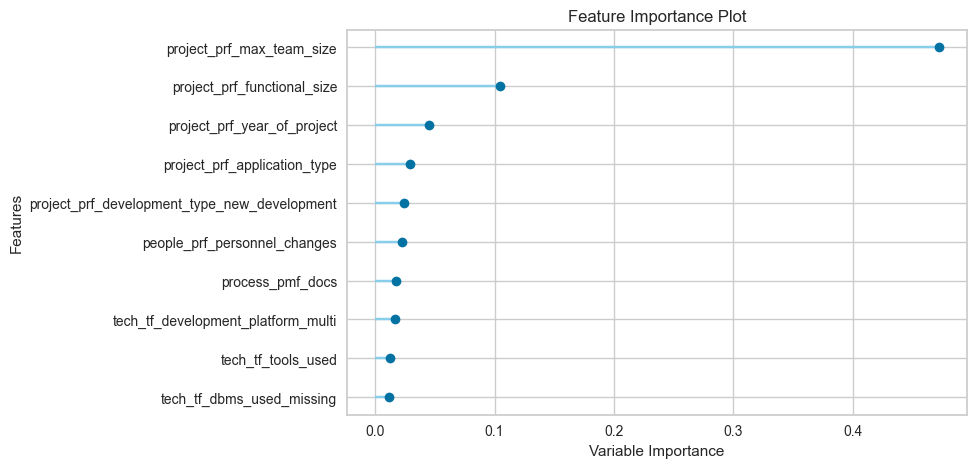

<Figure size 800x550 with 0 Axes>

  PyCaret feature importance plot saved to ../seed/synthetic_cleaned_serviceindustry_feature_importance_model_1_GradientBoostingRegressor.png

Model 2: BayesianRidge


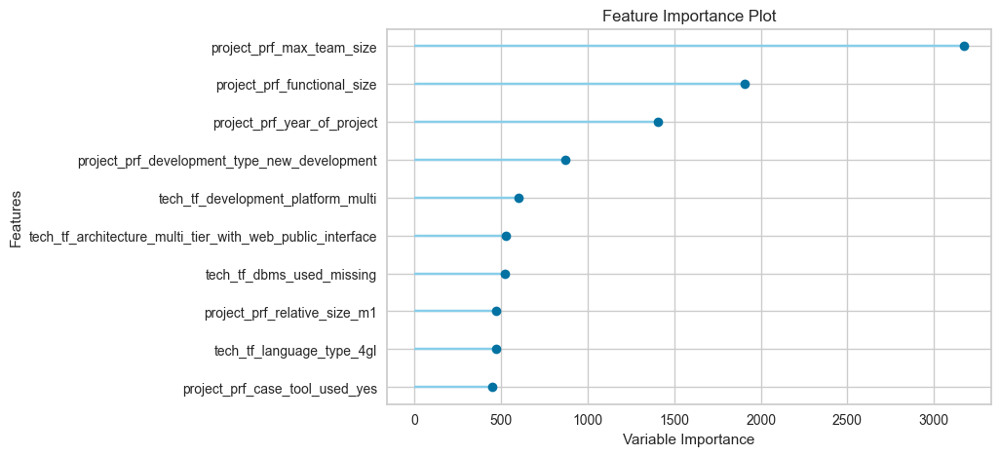

<Figure size 800x550 with 0 Axes>

  PyCaret feature importance plot saved to ../seed/synthetic_cleaned_serviceindustry_feature_importance_model_2_BayesianRidge.png

  Generating permutation-based feature importance plot...
  Could not generate permutation feature plot: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- external_eef_organisation_type
- tech_tf_primary_programming_language
Feature names seen at fit time, yet now missing:
- external_eef_organisation_type_agriculture, forestry, fishing, hunting
- external_eef_organisation_type_agriculture, forestry, fishing, hunting; transport & storage
- external_eef_organisation_type_air traffic management
- external_eef_organisation_type_airport
- external_eef_organisation_type_art , events , ticketing
- ...


Model 3: LinearRegression


<Figure size 1000x600 with 0 Axes>

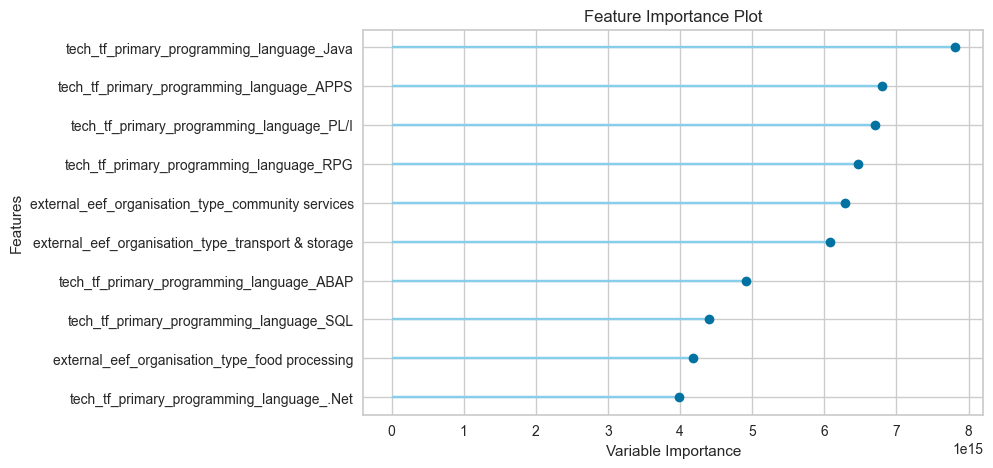

<Figure size 800x550 with 0 Axes>

  PyCaret feature importance plot saved to ../seed/synthetic_cleaned_serviceindustry_feature_importance_model_3_LinearRegression.png

  Generating permutation-based feature importance plot...
  Could not generate permutation feature plot: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- external_eef_organisation_type
- tech_tf_primary_programming_language
Feature names seen at fit time, yet now missing:
- external_eef_organisation_type_agriculture, forestry, fishing, hunting
- external_eef_organisation_type_agriculture, forestry, fishing, hunting; transport & storage
- external_eef_organisation_type_air traffic management
- external_eef_organisation_type_airport
- external_eef_organisation_type_art , events , ticketing
- ...



<Figure size 1000x600 with 0 Axes>

Cell executed at: 2025-07-09 16:52:29.384747


In [36]:
# code modified for top 3 models

from pycaret.regression import plot_model
import os
import matplotlib.pyplot as plt

pycaret_X=X
pycaret_y = y

os.makedirs(plots_folder, exist_ok=True)
feature_names = pycaret_X.columns.tolist()  # Make sure to use the same data as in training
print(f"All features: {feature_names}")


for i, tuned_model in enumerate(tuned_models, 1):
    model_name = type(tuned_model).__name__
    print(f"\nModel {i}: {model_name}")

    # First try PyCaret's plot_model
    try:
        plot_model(tuned_model, plot='feature', save=False)
        plt.savefig(f'{plots_folder}/{file_name_no_ext}_feature_importance_model_{i}_{model_name}.png')
        plt.show()
        plt.close()
        print(f"  PyCaret feature importance plot saved to {plots_folder}/{file_name_no_ext}_feature_importance_model_{i}_{model_name}.png")
    except Exception as e:
        print(f"  PyCaret plot_model failed: {e}")
        # Fallback for linear models with coefficients
        try:
            # If it's a linear model (like HuberRegressor, LinearRegression, etc.)
            if hasattr(tuned_model, 'coef_'):
                importance_df = plot_linear_feature_importance(
                    tuned_model, pycaret_X, pycaret_y, 
                    feature_names=feature_names, 
                    method='coefficients'
                )
                print("  Custom coefficient-based feature importance plot saved.")
                print("  All important features:")
                print(importance_df)
            else:
                print("  This model does not support .coef_ or is not a linear model.")
        except Exception as e2:
            print(f"  Could not generate feature plot for linear model: {e2}")

    # Optionally: also plot permutation-based feature importance for all linear models
    if hasattr(tuned_model, 'coef_'):
        print("\n  Generating permutation-based feature importance plot...")
        try:
            importance_df_perm = plot_linear_feature_importance(
                tuned_model, pycaret_X, pycaret_y, 
                feature_names=feature_names, 
                method='permutation'
            )
            print("  Allimportant features (permutation):")
            print(importance_df_perm)
        except Exception as e:
            print(f"  Could not generate permutation feature plot: {e}")


Found 18 PyCaret model files.
Processing 1/18: synthetic_cleaned_communication_top_model_1_BayesianRidge
Transformation Pipeline and Model Successfully Loaded


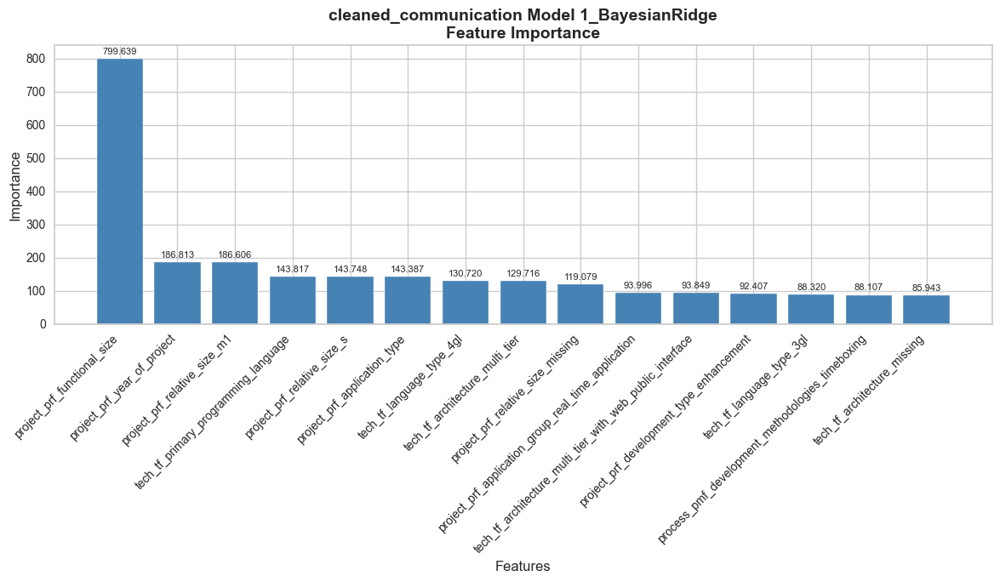

✓ Saved and displayed: synthetic_cleaned_communication_top_model_1_BayesianRidge_feature_importance.png
Processing 2/18: synthetic_cleaned_communication_top_model_2_Lasso
Transformation Pipeline and Model Successfully Loaded


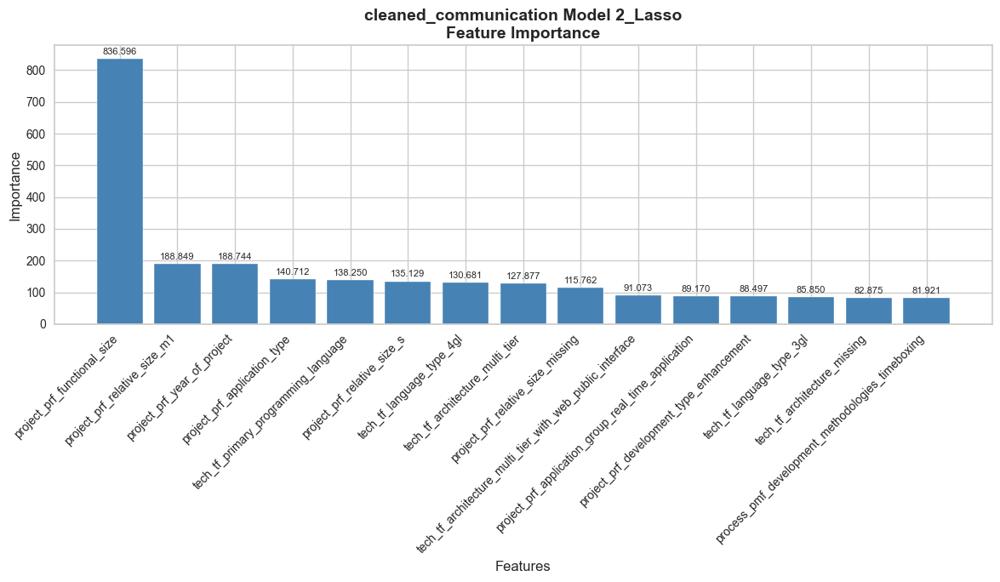

✓ Saved and displayed: synthetic_cleaned_communication_top_model_2_Lasso_feature_importance.png
Processing 3/18: synthetic_cleaned_communication_top_model_3_LassoLars
Transformation Pipeline and Model Successfully Loaded


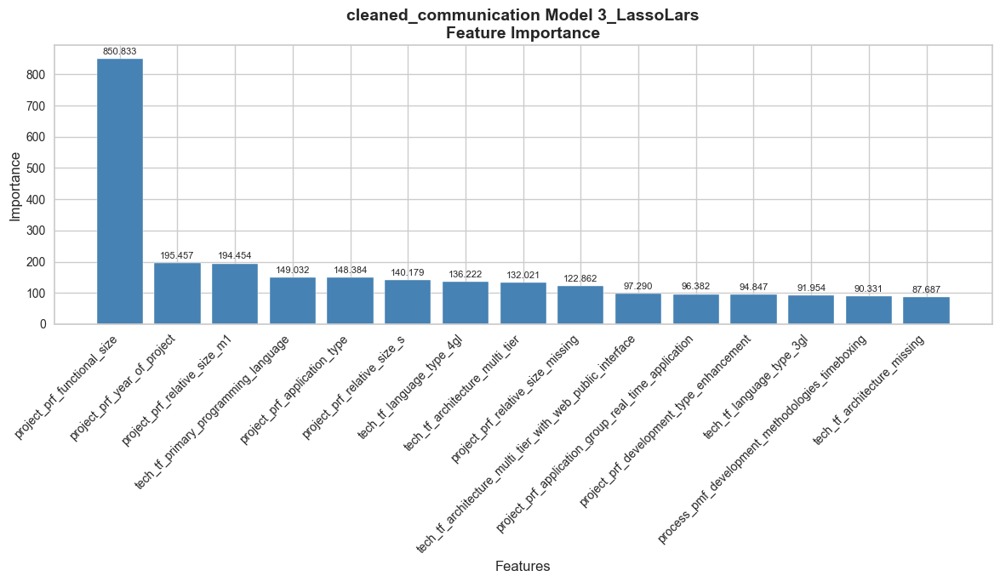

✓ Saved and displayed: synthetic_cleaned_communication_top_model_3_LassoLars_feature_importance.png
Processing 4/18: synthetic_cleaned_financial_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded


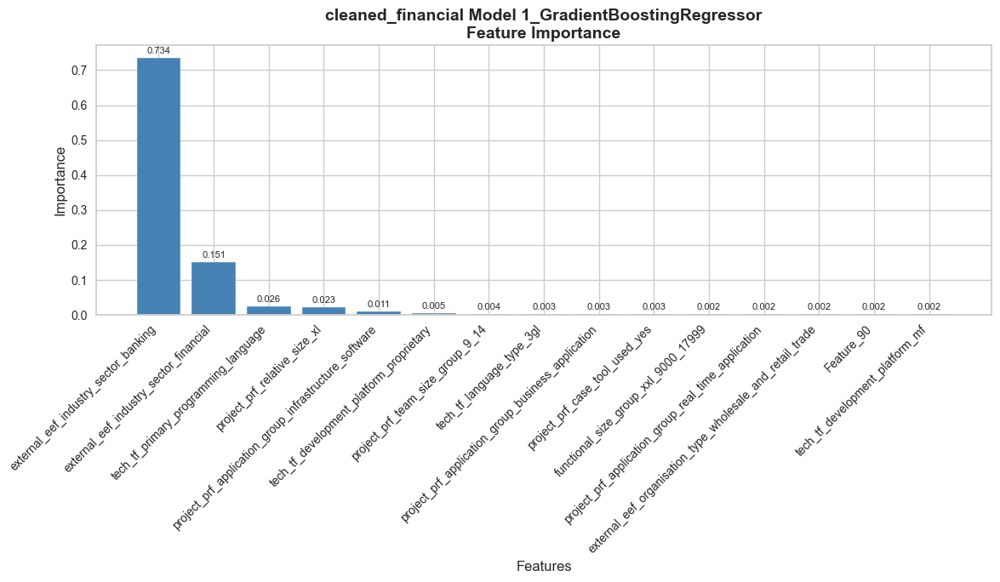

✓ Saved and displayed: synthetic_cleaned_financial_top_model_1_GradientBoostingRegressor_feature_importance.png
Processing 5/18: synthetic_cleaned_financial_top_model_2_LGBMRegressor
Transformation Pipeline and Model Successfully Loaded


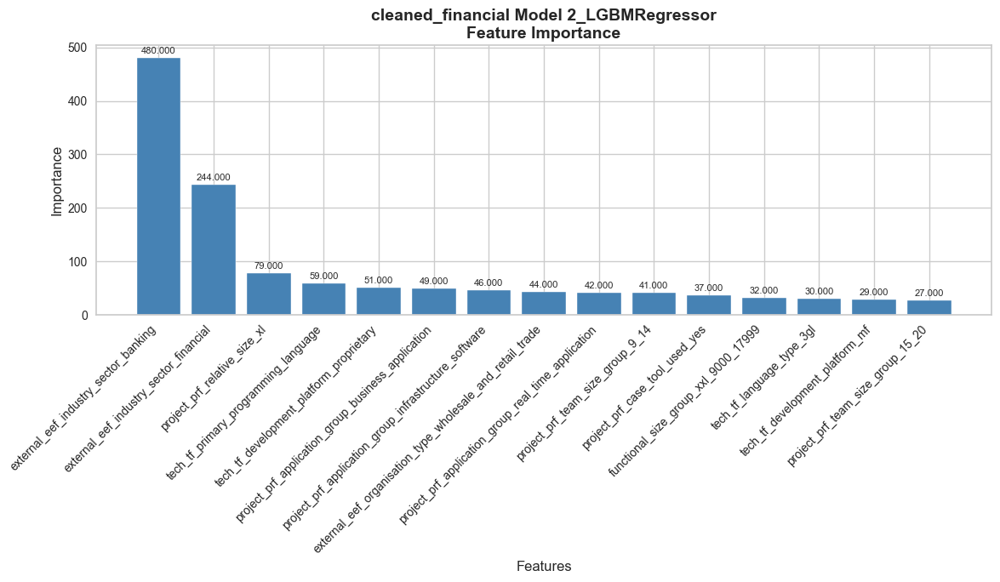

✓ Saved and displayed: synthetic_cleaned_financial_top_model_2_LGBMRegressor_feature_importance.png
Processing 6/18: synthetic_cleaned_financial_top_model_3_BayesianRidge
Transformation Pipeline and Model Successfully Loaded


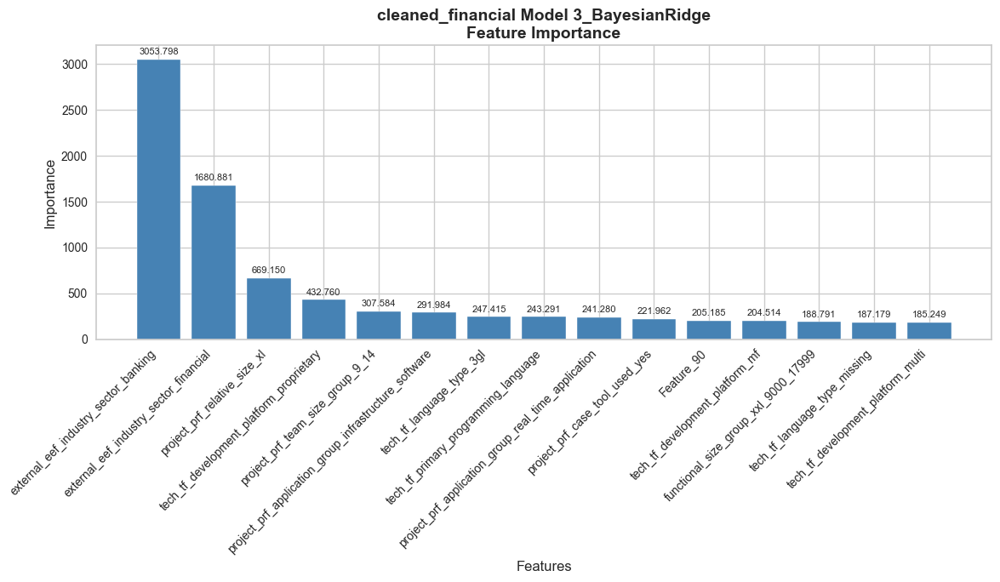

✓ Saved and displayed: synthetic_cleaned_financial_top_model_3_BayesianRidge_feature_importance.png
Processing 7/18: synthetic_cleaned_government_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded


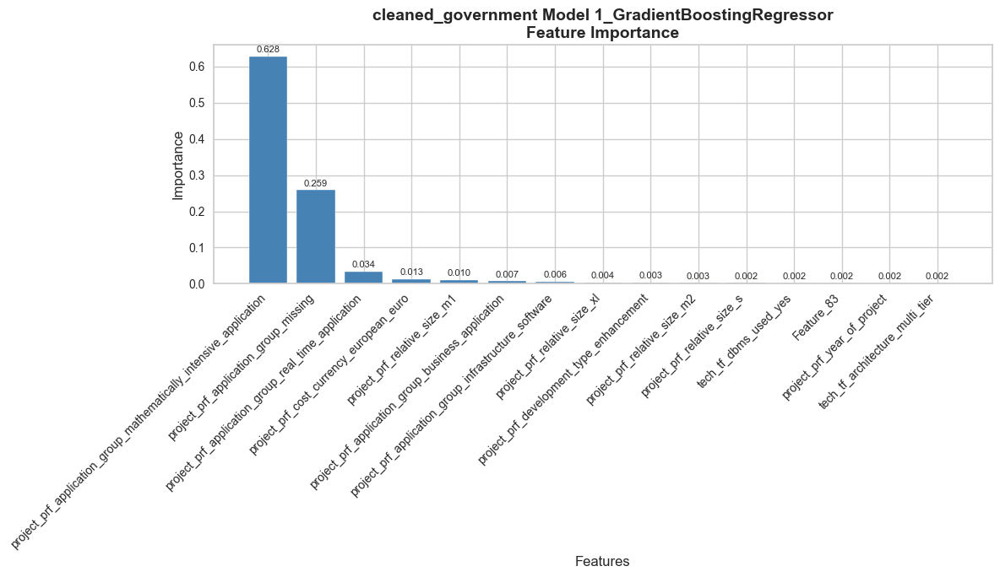

✓ Saved and displayed: synthetic_cleaned_government_top_model_1_GradientBoostingRegressor_feature_importance.png
Processing 8/18: synthetic_cleaned_government_top_model_2_ExtraTreesRegressor
Transformation Pipeline and Model Successfully Loaded


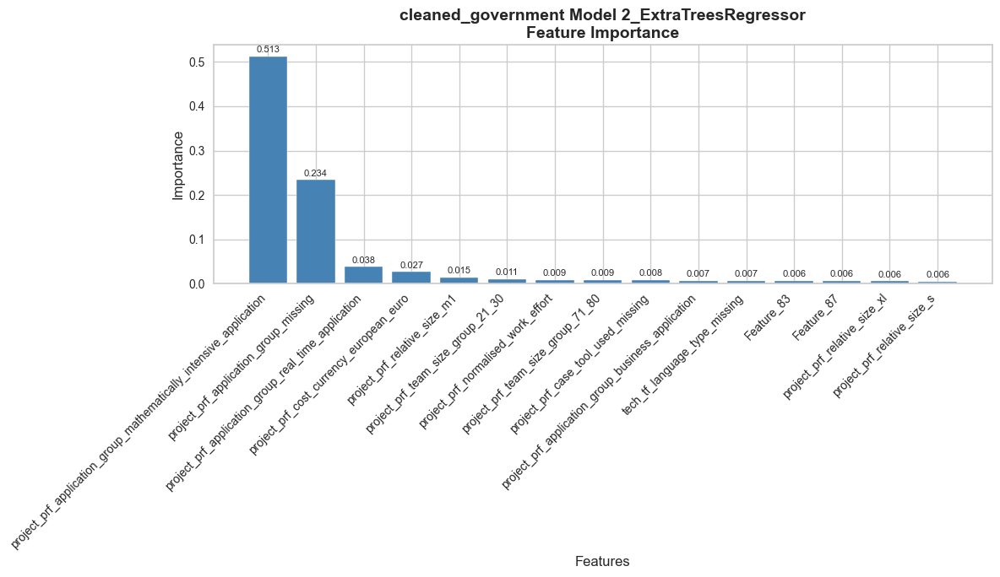

✓ Saved and displayed: synthetic_cleaned_government_top_model_2_ExtraTreesRegressor_feature_importance.png
Processing 9/18: synthetic_cleaned_government_top_model_3_RandomForestRegressor
Transformation Pipeline and Model Successfully Loaded


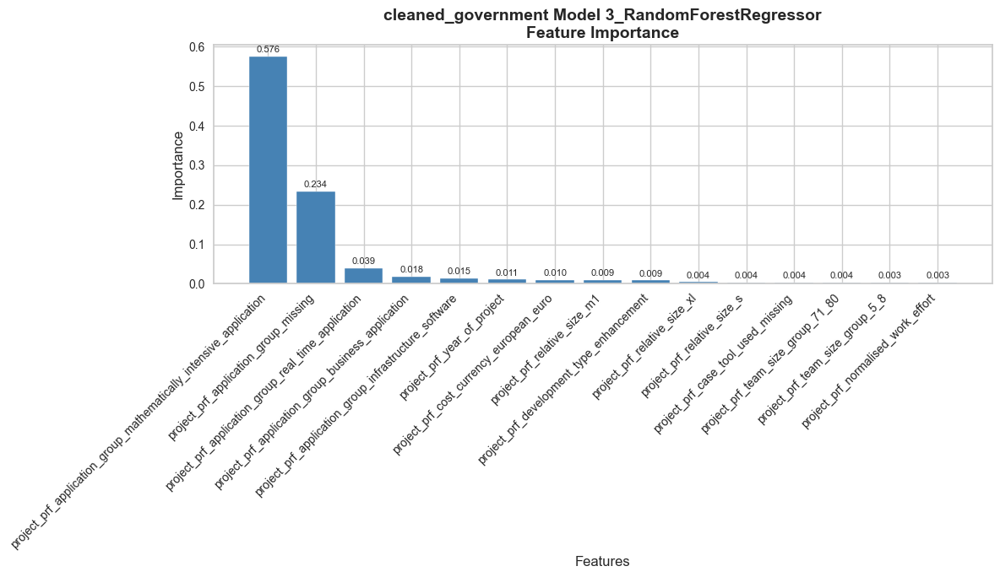

✓ Saved and displayed: synthetic_cleaned_government_top_model_3_RandomForestRegressor_feature_importance.png
Processing 10/18: synthetic_cleaned_insurance_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded


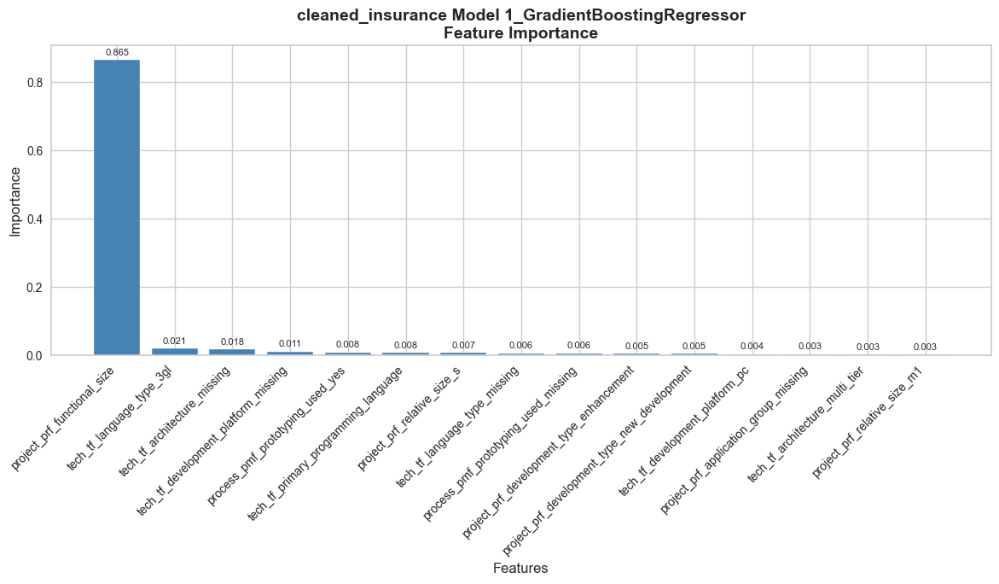

✓ Saved and displayed: synthetic_cleaned_insurance_top_model_1_GradientBoostingRegressor_feature_importance.png
Processing 11/18: synthetic_cleaned_insurance_top_model_2_Lasso
Transformation Pipeline and Model Successfully Loaded


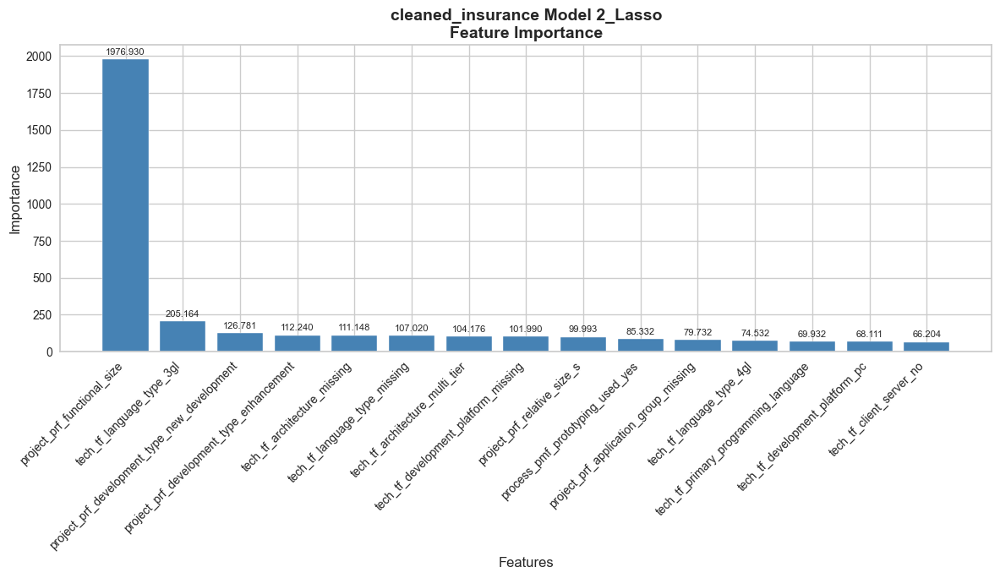

✓ Saved and displayed: synthetic_cleaned_insurance_top_model_2_Lasso_feature_importance.png
Processing 12/18: synthetic_cleaned_insurance_top_model_3_LassoLars
Transformation Pipeline and Model Successfully Loaded


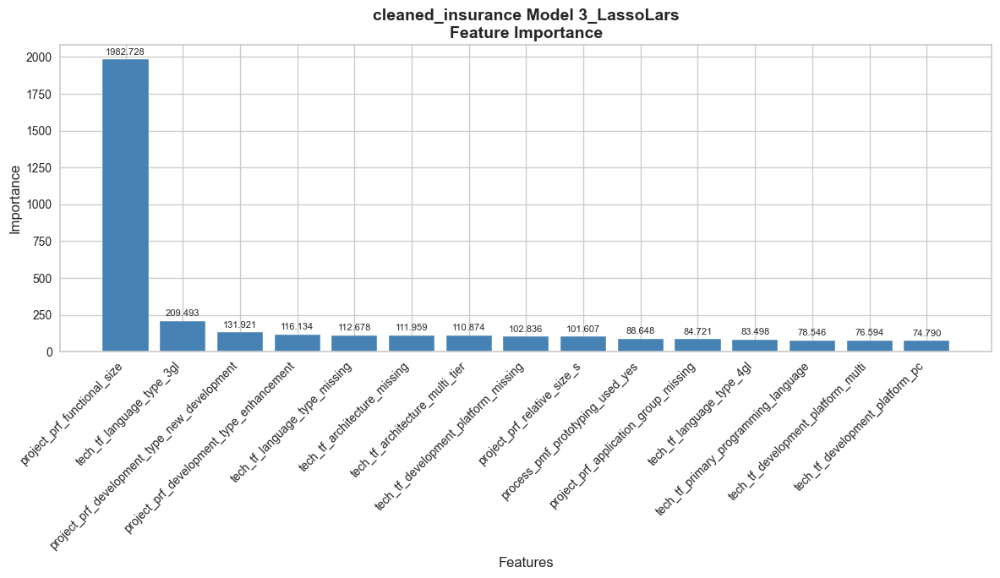

✓ Saved and displayed: synthetic_cleaned_insurance_top_model_3_LassoLars_feature_importance.png
Processing 13/18: synthetic_cleaned_medical_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded


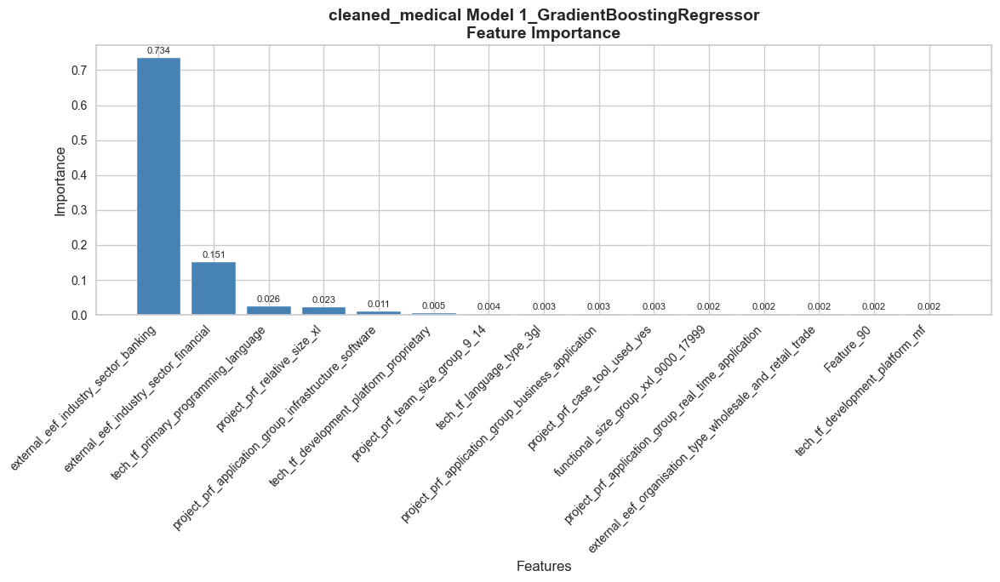

✓ Saved and displayed: synthetic_cleaned_medical_top_model_1_GradientBoostingRegressor_feature_importance.png
Processing 14/18: synthetic_cleaned_medical_top_model_2_LGBMRegressor
Transformation Pipeline and Model Successfully Loaded


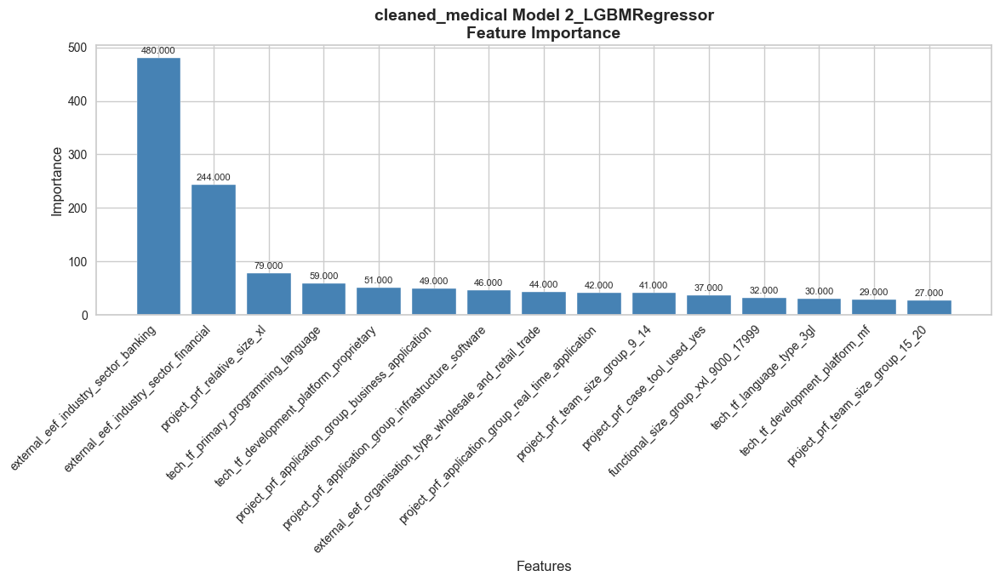

✓ Saved and displayed: synthetic_cleaned_medical_top_model_2_LGBMRegressor_feature_importance.png
Processing 15/18: synthetic_cleaned_medical_top_model_3_BayesianRidge
Transformation Pipeline and Model Successfully Loaded


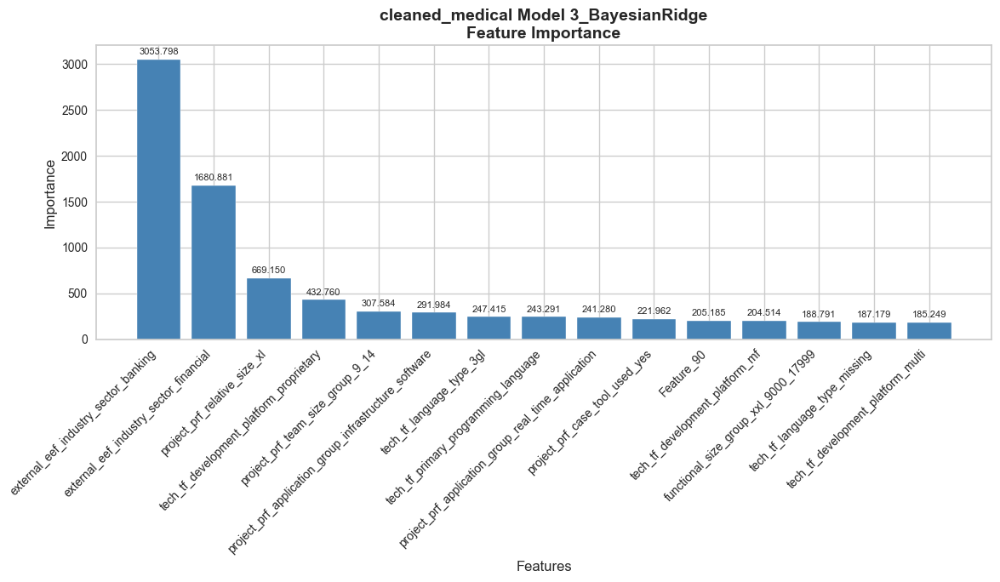

✓ Saved and displayed: synthetic_cleaned_medical_top_model_3_BayesianRidge_feature_importance.png
Processing 16/18: synthetic_cleaned_serviceindustry_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded


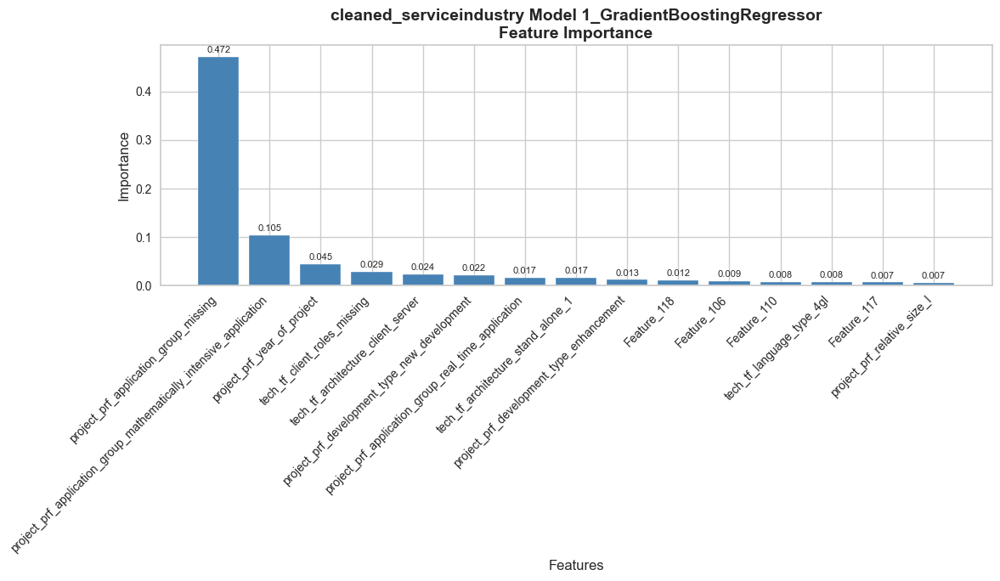

✓ Saved and displayed: synthetic_cleaned_serviceindustry_top_model_1_GradientBoostingRegressor_feature_importance.png
Processing 17/18: synthetic_cleaned_serviceindustry_top_model_2_BayesianRidge
Transformation Pipeline and Model Successfully Loaded


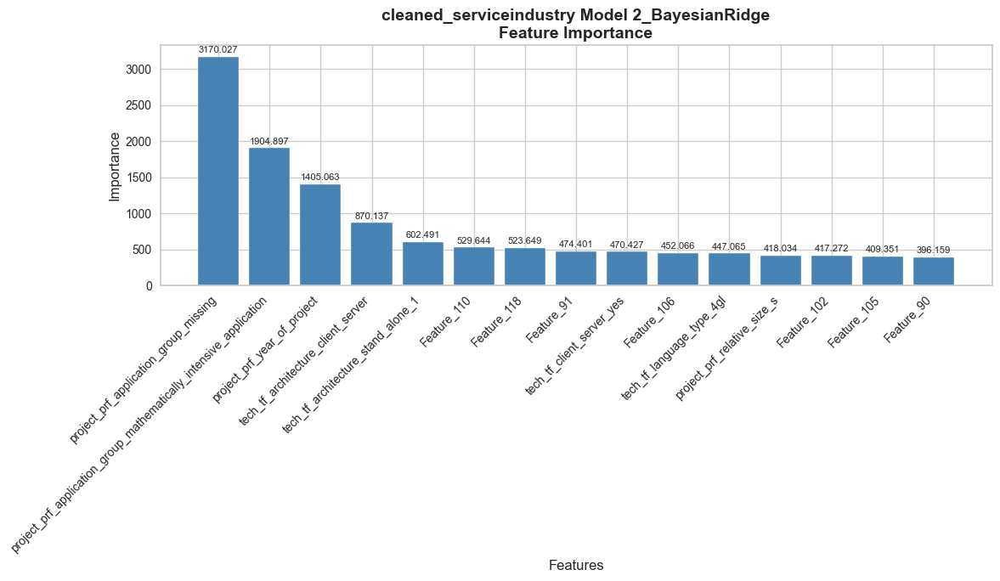

✓ Saved and displayed: synthetic_cleaned_serviceindustry_top_model_2_BayesianRidge_feature_importance.png
Processing 18/18: synthetic_cleaned_serviceindustry_top_model_3_LinearRegression
Transformation Pipeline and Model Successfully Loaded


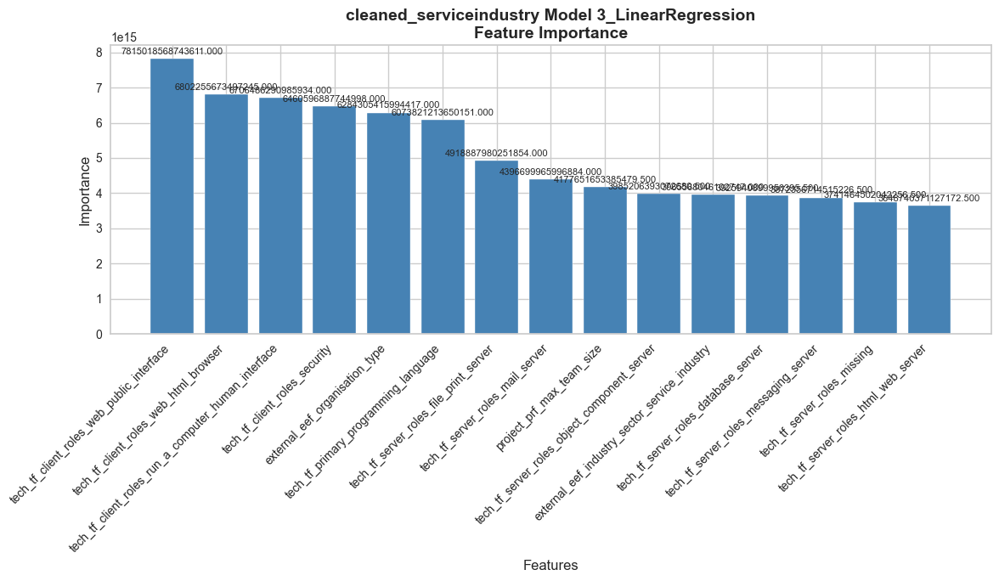

✓ Saved and displayed: synthetic_cleaned_serviceindustry_top_model_3_LinearRegression_feature_importance.png

Successfully created 18 individual plots


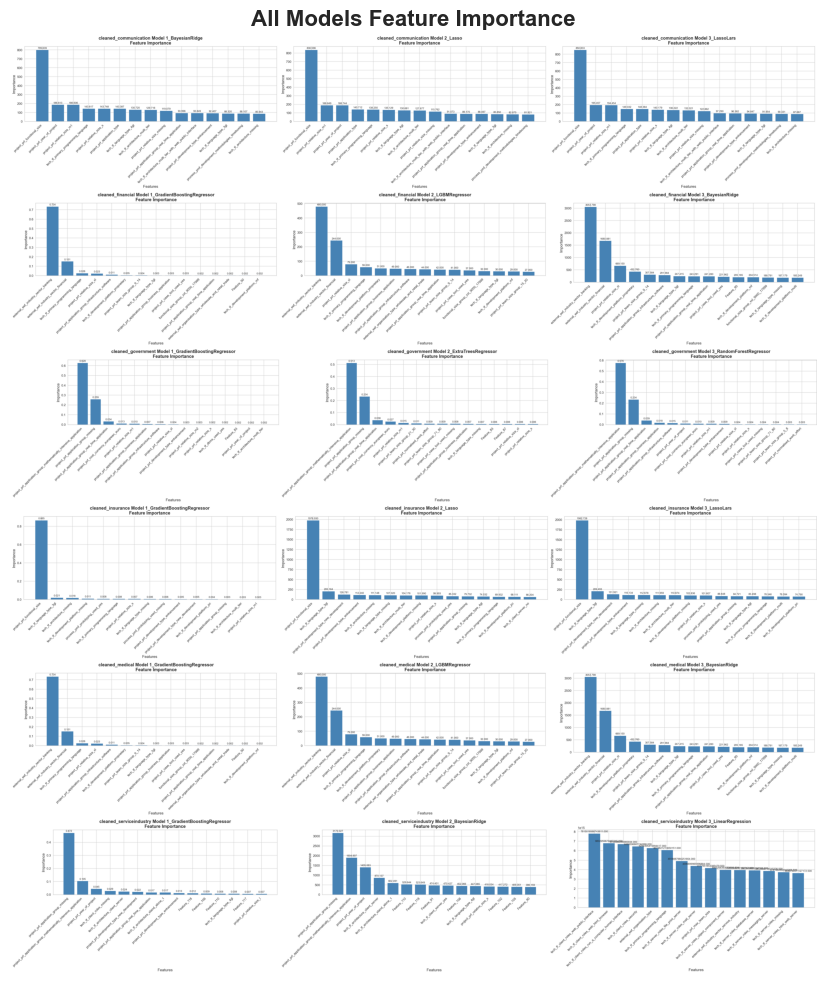


✓ Combined grid saved: ../seed\all_models_feature_importance.png
Grid dimensions: 6 rows × 3 columns

Summary:
- Total models: 18
- Successful plots: 18
- Failed models: 0
- Combined grid: all_models_feature_importance.png
Cell executed at: 2025-07-09 16:52:52.376846


In [37]:
# this part is independent of above as it will reload modesls from its residing folder

import os
import matplotlib.pyplot as plt
from pycaret.regression import load_model
import math
import numpy as np
from PIL import Image

# Configuration
models_folder = "../seed"
plots_folder = "../seed"

# Find all .pkl files (exclude skeleton models)
all_files = os.listdir(models_folder)
all_models = [f for f in all_files if f.endswith(".pkl") and "skeleton" not in f]

print(f"Found {len(all_models)} PyCaret model files.")

# Create individual plots
individual_plots = []
successful_models = []

def get_feature_importance_and_names(model):
    """Extract feature importance and names from model"""
    try:
        # Try to get feature names from the model pipeline
        feature_names = None
        
        # Check if model has feature names
        if hasattr(model, 'feature_names_in_'):
            feature_names = list(model.feature_names_in_)
        elif hasattr(model, 'get_feature_names_out'):
            try:
                feature_names = list(model.get_feature_names_out())
            except:
                pass
        
        # Get importance values
        importances = None
        
        # Method 1: Direct feature importance (tree-based models)
        if hasattr(model, 'feature_importances_'):
            importances = model.feature_importances_
        
        # Method 2: Coefficients (linear models)
        elif hasattr(model, 'coef_'):
            importances = np.abs(model.coef_)
        
        # Method 3: Try to get from named_steps if it's a pipeline
        elif hasattr(model, 'named_steps'):
            for step_name, step in model.named_steps.items():
                if hasattr(step, 'feature_importances_'):
                    importances = step.feature_importances_
                    break
                elif hasattr(step, 'coef_'):
                    importances = np.abs(step.coef_)
                    break
        
        # Method 4: Try final estimator if it's a pipeline
        elif hasattr(model, 'steps'):
            final_estimator = model.steps[-1][1]
            if hasattr(final_estimator, 'feature_importances_'):
                importances = final_estimator.feature_importances_
            elif hasattr(final_estimator, 'coef_'):
                importances = np.abs(final_estimator.coef_)
        
        # If no feature names found, create generic ones
        if feature_names is None and importances is not None:
            feature_names = [f"Feature_{i}" for i in range(len(importances))]
        
        return importances, feature_names
    except:
        return None, None

for i, model_file in enumerate(all_models):
    model_name = model_file.replace('.pkl', '')
    model_path = os.path.join(models_folder, model_name)
    
    print(f"Processing {i+1}/{len(all_models)}: {model_name}")
    
    try:
        # Load model
        model = load_model(model_path)
        
        # Get feature importance and names directly
        importances, feature_names = get_feature_importance_and_names(model)
        
        if importances is not None and len(importances) > 0:
            # Create plot manually
            plt.figure(figsize=(12, 7))
            
            # Sort features by importance
            sorted_idx = np.argsort(importances)[::-1][:15]  # Top 15 features
            sorted_importances = importances[sorted_idx]
            sorted_names = [feature_names[idx] if idx < len(feature_names) else f"Feature_{idx}" for idx in sorted_idx]
            
            # Create bar plot
            bars = plt.bar(range(len(sorted_importances)), sorted_importances, color='steelblue')
            
            # Formatting
            clean_name = model_name.replace('synthetic_', '').replace('_top_model_', ' Model ')
            plt.title(f'{clean_name}\nFeature Importance', fontsize=14, fontweight='bold')
            plt.xlabel('Features', fontsize=12)
            plt.ylabel('Importance', fontsize=12)
            plt.xticks(range(len(sorted_names)), sorted_names, rotation=45, ha='right', fontsize=10)
            
            # Add value labels on bars
            for bar, importance in zip(bars, sorted_importances):
                plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01*max(sorted_importances),
                        f'{importance:.3f}', ha='center', va='bottom', fontsize=8)
            
            plt.tight_layout()
            
            # Save plot
            plot_filename = f"{model_name}_feature_importance.png"
            plot_path = os.path.join(plots_folder, plot_filename)
            plt.savefig(plot_path, dpi=150, bbox_inches='tight')
            
            # SHOW the plot on screen
            plt.show()
            
            individual_plots.append(plot_path)
            successful_models.append(clean_name)
            
            print(f"✓ Saved and displayed: {plot_filename}")
            
        else:
            # Try PyCaret's plot_model as fallback
            try:
                plt.figure(figsize=(10, 6))
                plot_model(model, plot='feature', save=False)
                
                clean_name = model_name.replace('synthetic_', '').replace('_top_model_', ' Model ')
                plt.title(clean_name, fontsize=14, fontweight='bold')
                
                plot_filename = f"{model_name}_feature_importance.png"
                plot_path = os.path.join(plots_folder, plot_filename)
                plt.savefig(plot_path, dpi=150, bbox_inches='tight')
                plt.close()
                
                individual_plots.append(plot_path)
                successful_models.append(clean_name)
                
                print(f"✓ Saved (PyCaret): {plot_filename}")
                
            except Exception as fallback_error:
                print(f"✗ No feature importance available for {model_name}")
                plt.close('all')
        
    except Exception as e:
        print(f"✗ Error loading {model_name}: {e}")
        plt.close('all')

print(f"\nSuccessfully created {len(individual_plots)} individual plots")

# Create combined grid image
if len(individual_plots) > 0:
    try:
        # Load all images
        images = []
        for plot_path in individual_plots:
            if os.path.exists(plot_path):
                img = Image.open(plot_path)
                images.append(img)
        
        if images:
            # Calculate grid dimensions
            n_images = len(images)
            n_cols = min(3, n_images)
            n_rows = math.ceil(n_images / n_cols)
            
            # Get image dimensions
            img_width, img_height = images[0].size
            
            # Create combined image
            combined_width = n_cols * img_width
            combined_height = n_rows * img_height
            combined_image = Image.new('RGB', (combined_width, combined_height), 'white')
            
            # Paste individual images
            for i, img in enumerate(images):
                row = i // n_cols
                col = i % n_cols
                x = col * img_width
                y = row * img_height
                combined_image.paste(img, (x, y))
            
            # Save combined image
            combined_path = os.path.join(plots_folder, "all_models_feature_importance.png")
            combined_image.save(combined_path)
            
            # Display the combined image
            plt.figure(figsize=(15, 10))
            plt.imshow(combined_image)
            plt.axis('off')
            plt.title('All Models Feature Importance', fontsize=16, fontweight='bold')
            plt.tight_layout()
            plt.show()
            
            print(f"\n✓ Combined grid saved: {combined_path}")
            print(f"Grid dimensions: {n_rows} rows × {n_cols} columns")
            
    except Exception as e:
        print(f"Error creating combined image: {e}")

print(f"\nSummary:")
print(f"- Total models: {len(all_models)}")
print(f"- Successful plots: {len(individual_plots)}")
print(f"- Failed models: {len(all_models) - len(individual_plots)}")
if len(individual_plots) > 0:
    print(f"- Combined grid: all_models_feature_importance.png")

In [38]:
import os
import pandas as pd
import numpy as np
from pycaret.regression import load_model

# Configuration
models_folder = "../seed"

# Find all .pkl files (exclude skeleton models)
all_files = os.listdir(models_folder)
all_models = [f for f in all_files if f.endswith(".pkl") and "skeleton" not in f]

def get_feature_importance_and_names(model):
    """Extract feature importance and names from model"""
    try:
        feature_names = None
        if hasattr(model, 'feature_names_in_'):
            feature_names = list(model.feature_names_in_)
        
        importances = None
        if hasattr(model, 'feature_importances_'):
            importances = model.feature_importances_
        elif hasattr(model, 'coef_'):
            importances = np.abs(model.coef_)
        elif hasattr(model, 'named_steps'):
            for step_name, step in model.named_steps.items():
                if hasattr(step, 'feature_importances_'):
                    importances = step.feature_importances_
                    break
                elif hasattr(step, 'coef_'):
                    importances = np.abs(step.coef_)
                    break
        
        if feature_names is None and importances is not None:
            feature_names = [f"Feature_{i}" for i in range(len(importances))]
        
        return importances, feature_names
    except:
        return None, None

# Collect all feature importance data
all_features_data = []

for model_file in all_models:
    model_name = model_file.replace('.pkl', '')
    model_path = os.path.join(models_folder, model_name)
    
    try:
        model = load_model(model_path)
        importances, feature_names = get_feature_importance_and_names(model)
        
        if importances is not None:
            # Clean model name
            clean_name = model_name.replace('synthetic_', '').replace('_top_model_', ' ')
            
            # Create feature-importance pairs
            for feature, importance in zip(feature_names, importances):
                all_features_data.append({
                    'Model': clean_name,
                    'Feature': feature,
                    'Importance': importance
                })
        
        print(f"✓ Processed: {clean_name}")
        
    except Exception as e:
        print(f"✗ Error with {model_name}: {e}")

# Create DataFrame
df = pd.DataFrame(all_features_data)

if not df.empty:
    # Sort by importance descending
    df = df.sort_values('Importance', ascending=False)
    
    # Display top features across all models
    print("\n=== TOP 20 FEATURES ACROSS ALL MODELS ===")
    print(df.head(20).to_string(index=False))
    
    # Create pivot table for better comparison
    pivot_df = df.pivot_table(
        index='Feature', 
        columns='Model', 
        values='Importance', 
        fill_value=0
    )
    
    # Sort by average importance
    pivot_df['Average_Importance'] = pivot_df.mean(axis=1)
    pivot_df = pivot_df.sort_values('Average_Importance', ascending=False)
    pivot_df = pivot_df.drop('Average_Importance', axis=1)
    
    print("\n=== FEATURE IMPORTANCE BY MODEL (TOP 15 FEATURES) ===")
    print(pivot_df.head(15).round(4).to_string())
    
    # Save to CSV
    csv_path = os.path.join(models_folder, "all_models_feature_importance.csv")
    df.to_csv(csv_path, index=False)
    
    pivot_csv_path = os.path.join(models_folder, "feature_importance_comparison.csv")
    pivot_df.to_csv(pivot_csv_path)
    
    print(f"\n✓ Detailed table saved: {csv_path}")
    print(f"✓ Comparison table saved: {pivot_csv_path}")
    
    # Show summary statistics
    print(f"\nSUMMARY:")
    print(f"- Total models processed: {df['Model'].nunique()}")
    print(f"- Total unique features: {df['Feature'].nunique()}")
    print(f"- Most important feature overall: {df.iloc[0]['Feature']} ({df.iloc[0]['Importance']:.4f})")
    
else:
    print("No feature importance data found")

Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_communication 1_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_communication 2_Lasso
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_communication 3_LassoLars
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_financial 1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_financial 2_LGBMRegressor
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_financial 3_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_government 1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_government 2_ExtraTreesRegressor
Transformation Pipeline and Model Successfully Loaded
✓ Processed: cleaned_government 3_RandomForestRegressor
Transformation Pipeline and Model Successfully Loa

[Back to top](#Index:)

<a id='part9'></a>

# Part 9 - SHAP Analysis

xxx

In [39]:
# Shap Analysis Step 1: Get Real Feature Names

import os
import pandas as pd
from pycaret.regression import load_model

# Configuration
models_folder = "../seed"

# Find one model to extract feature names
all_files = os.listdir(models_folder)
model_files = [f for f in all_files if f.endswith(".pkl") and "skeleton" not in f]

if model_files:
    # Load first model
    model_file = model_files[0]
    model_name = model_file.replace('.pkl', '')
    model_path = os.path.join(models_folder, model_name)
    
    print(f"Loading model: {model_name}")
    model = load_model(model_path)
    
    # Try different ways to get feature names
    feature_names = None
    
    # Method 1: Check if model has feature_names_in_
    if hasattr(model, 'feature_names_in_'):
        feature_names = list(model.feature_names_in_)
        print(f"✓ Found {len(feature_names)} features from feature_names_in_")
    
    # Method 2: Try to get from pipeline steps
    elif hasattr(model, 'named_steps'):
        print("Checking pipeline steps...")
        for step_name, step in model.named_steps.items():
            print(f"  Step: {step_name} - {type(step).__name__}")
            
            if hasattr(step, 'get_feature_names_out'):
                try:
                    feature_names = list(step.get_feature_names_out())
                    print(f"✓ Found {len(feature_names)} features from {step_name}")
                    break
                except Exception as e:
                    print(f"    get_feature_names_out failed: {e}")
            
            if hasattr(step, 'feature_names_'):
                feature_names = list(step.feature_names_)
                print(f"✓ Found {len(feature_names)} features from {step_name}")
                break
    
    # Method 3: Create sample data and transform it to see the feature names
    if feature_names is None:
        print("Trying to transform sample data to get feature names...")
        try:
            # Load sample CSV data
            csv_files = [f for f in os.listdir(models_folder) if f.endswith("_pycaret_processed_features.csv")]
            if csv_files:
                sample_df = pd.read_csv(os.path.join(models_folder, csv_files[0]))
                print(f"Original CSV columns: {list(sample_df.columns)}")
                
                # Since we can't easily reverse-engineer the preprocessing,
                # let's just show what we have vs what the model expects
                print(f"CSV has {len(sample_df.columns)} columns")
                
                # Get model feature count
                if hasattr(model, 'named_steps') and 'trained_model' in model.named_steps:
                    final_model = model.named_steps['trained_model']
                    if hasattr(final_model, 'n_features_in_'):
                        print(f"Model expects {final_model.n_features_in_} features")
                    elif hasattr(final_model, 'feature_importances_'):
                        print(f"Model has {len(final_model.feature_importances_)} features")
        except Exception as e:
            print(f"Sample data method failed: {e}")
    
    # Show results
    if feature_names:
        print(f"\n{'='*50}")
        print(f"REAL FEATURE NAMES ({len(feature_names)} total):")
        print(f"{'='*50}")
        
        # Show first 30 feature names
        for i, name in enumerate(feature_names[:30]):
            print(f"{i:2d}: {name}")
        
        if len(feature_names) > 30:
            print(f"... and {len(feature_names) - 30} more features")
        
        # Save to file for use in other scripts
        feature_names_file = os.path.join(models_folder, 'real_feature_names.txt')
        with open(feature_names_file, 'w') as f:
            for i, name in enumerate(feature_names):
                f.write(f"{i}: {name}\n")
        
        # Also save as pickle for easy loading
        import pickle
        pickle_file = os.path.join(models_folder, 'real_feature_names.pkl')
        with open(pickle_file, 'wb') as f:
            pickle.dump(feature_names, f)
        
        print(f"\n✓ Feature names saved to: {feature_names_file}")
        print(f"✓ Feature names saved to: {pickle_file}")
        
        # Show some analysis
        print(f"\nFEATURE ANALYSIS:")
        original_features = [name for name in feature_names if not any(x in name.lower() for x in ['_', 'encoded', 'onehot'])]
        encoded_features = [name for name in feature_names if any(x in name.lower() for x in ['_', 'encoded', 'onehot'])]
        
        print(f"- Original-like features: {len(original_features)}")
        print(f"- Encoded/transformed features: {len(encoded_features)}")
        
        if encoded_features:
            print(f"\nSample encoded features:")
            for name in encoded_features[:10]:
                print(f"  • {name}")
                
        print(f"\n✓ Ready for SHAP analysis with real feature names!")
    
    else:
        print("\n❌ Could not extract feature names from the model")
        print("This might be due to PyCaret version or model structure")
        
        # Alternative: Show what we can about the model
        print(f"\nModel structure:")
        if hasattr(model, 'named_steps'):
            for step_name, step in model.named_steps.items():
                print(f"  {step_name}: {type(step).__name__}")

else:
    print("No model files found!")

Loading model: synthetic_cleaned_communication_top_model_1_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
✓ Found 75 features from feature_names_in_

REAL FEATURE NAMES (75 total):
 0: project_prf_year_of_project
 1: project_prf_application_type
 2: tech_tf_primary_programming_language
 3: project_prf_functional_size
 4: process_pmf_docs
 5: tech_tf_tools_used
 6: project_prf_max_team_size
 7: external_eef_organisation_type_communications
 8: external_eef_organisation_type_general_public_mobile_phone_end_user
 9: external_eef_organisation_type_media
10: external_eef_organisation_type_telecom
11: external_eef_organisation_type_telecom_and_networking
12: external_eef_organisation_type_telecommunication
13: external_eef_organisation_type_telecommunications
14: external_eef_organisation_type_virtual_assistants_lingubots
15: process_pmf_development_methodologies_agile_development
16: process_pmf_development_methodologies_it_unified_process_itup
17: process_pmf_developme

In [ ]:
# Need to be tested
# Step 2: SHAP Analysis with Real Names

# SHAP analysis with proper data type handling and debugging
# This part is independent of set up above as it browse through the models folder for SHAP analysis.
"""
Global Perspective:
- Summary Plot: Provides a global overview of feature importance and their 
  positive or negative impact on the model output across the entire dataset.
- Dependence Plot: Illustrates the relationship between a single feature's 
  value and its SHAP value across all instances to understand its general 
  effect on the prediction.
- Bar Chart: Shows the global importance of each feature based on the average 
  magnitude of their SHAP values across the entire dataset.

Single Instance Perspective:
- Force Plot: Explains the prediction for a single instance by showing how each 
  feature contributes to moving the prediction from the base value for that specific case.
- Waterfall Plot: Explains the prediction for a single instance by visualizing the sequential, 
  additive contribution of each feature's SHAP value for that specific prediction.
"""


import os
import pandas as pd
from pycaret.regression import load_model

# ========== CONFIGURATION ==========
models_folder = "models"
data_folder = "data"
plots_root_folder = "shap_plots"
os.makedirs(plots_root_folder, exist_ok=True)

# ========== BATCH SHAP ANALYSIS ==========
model_files = [f for f in os.listdir(models_folder) if f.endswith(".pkl")]

for model_file in model_files:
    try:
        # Extract industry and model name from file
        # E.g. "Financial_LGBMRegressor.pkl" -> "Financial", "LGBMRegressor"
        name = model_file.replace('.pkl', '')
        parts = name.split('_', 1)
        if len(parts) != 2:
            print(f"Skipping {model_file}: unexpected name format.")
            continue
        industry, model_name = parts
        
        # Load the model
        model_path = os.path.join(models_folder, model_file)
        model = load_model(model_path)
        
        # Load matching feature data
        data_file = f"{industry}_X.csv"
        data_path = os.path.join(data_folder, data_file)
        if not os.path.exists(data_path):
            print(f"Feature data not found for {industry} ({data_path}), skipping...")
            continue
        X_data = pd.read_csv(data_path)
        
        # Save plots in "shap_plots/Industry_ModelName/"
        save_folder = os.path.join(plots_root_folder, f"{industry}_{model_name}")
        os.makedirs(save_folder, exist_ok=True)
        
        print(f"\n=== Running SHAP for {industry} - {model_name} ===")
        # Import your previously defined function, or paste it above
        shap_analysis(
            model,
            X_data,
            sample_size=100,
            save_plots=True,
            plots_folder=save_folder
        )
    except Exception as e:
        print(f"Error processing {model_file}: {e}")


Feature Importance Analysis with Better Names
Found original data: synthetic_cleaned_communication.csv
Original columns (86):
  isbsg_project_id (numerical)
  project_prf_year_of_project (numerical)
  project_prf_application_type (categorical): ['missing' 'customer billing' 'telecom & network management' 'integration'
 'data warehouse system']
  tech_tf_primary_programming_language (categorical): ['PERIPHONICS' 'C++' 'DRIFT' 'Doc1 Designer (Entorno visual)'
 'Visual Basic']
  project_prf_functional_size (numerical)
  project_prf_normalised_work_effort_level_1 (numerical)
  project_prf_normalised_work_effort (numerical)
  project_prf_normalised_level_1_pdr_ufp (numerical)
  project_prf_normalised_pdr_ufp (numerical)
  project_prf_speed_of_delivery (numerical)
  project_prf_project_elapsed_time (numerical)
  process_pmf_docs (numerical)
  tech_tf_tools_used (categorical): [0 6 2 4 1]
  project_prf_max_team_size (categorical): [nan  8.  7.  3.  5.]
  external_eef_organisation_type_communi

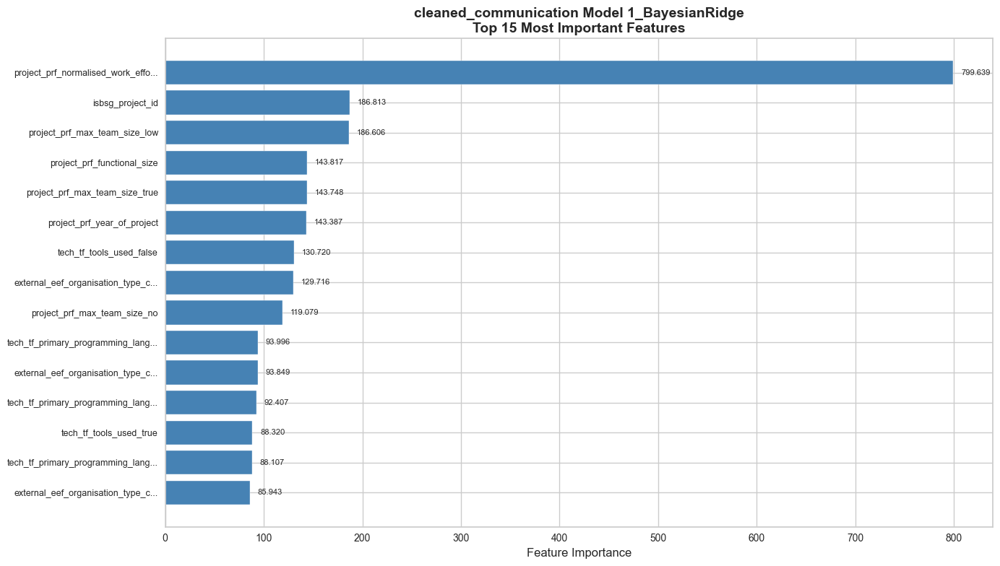

  ✓ Created meaningful plot

Processing 2/18: synthetic_cleaned_communication_top_model_2_Lasso
Transformation Pipeline and Model Successfully Loaded
  Found 74 features


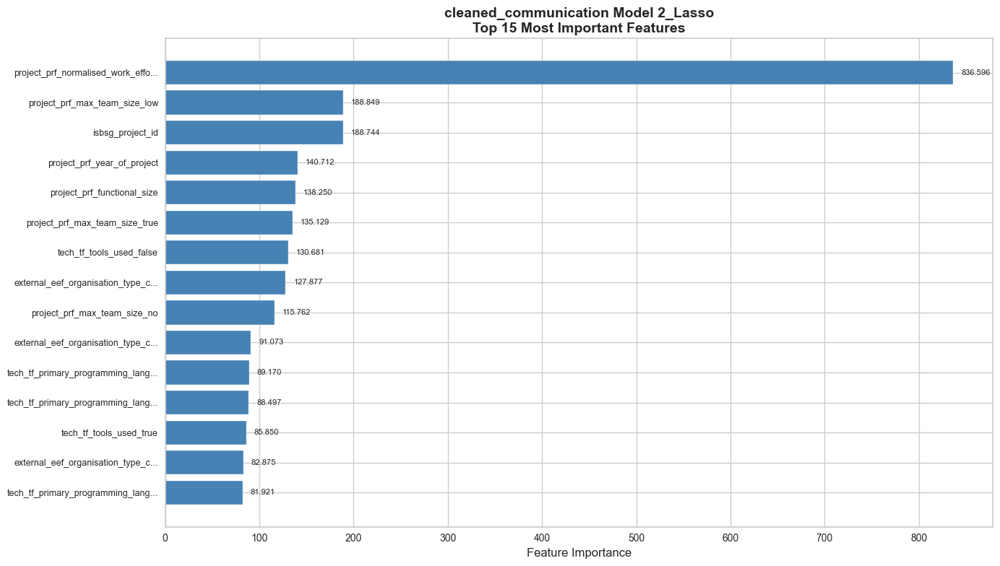

  ✓ Created meaningful plot

Processing 3/18: synthetic_cleaned_communication_top_model_3_LassoLars
Transformation Pipeline and Model Successfully Loaded
  Found 74 features


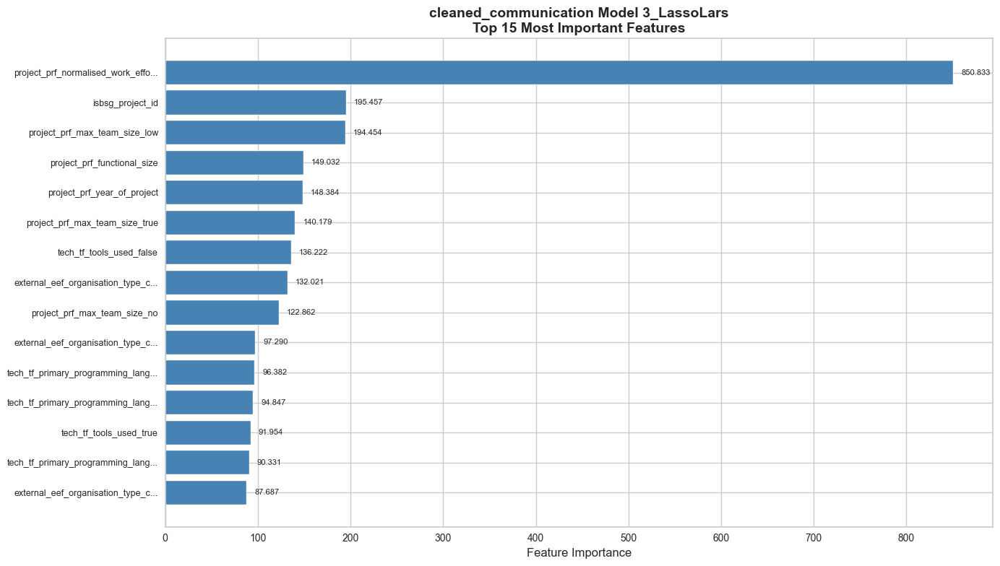

  ✓ Created meaningful plot

Processing 4/18: synthetic_cleaned_financial_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 92 features


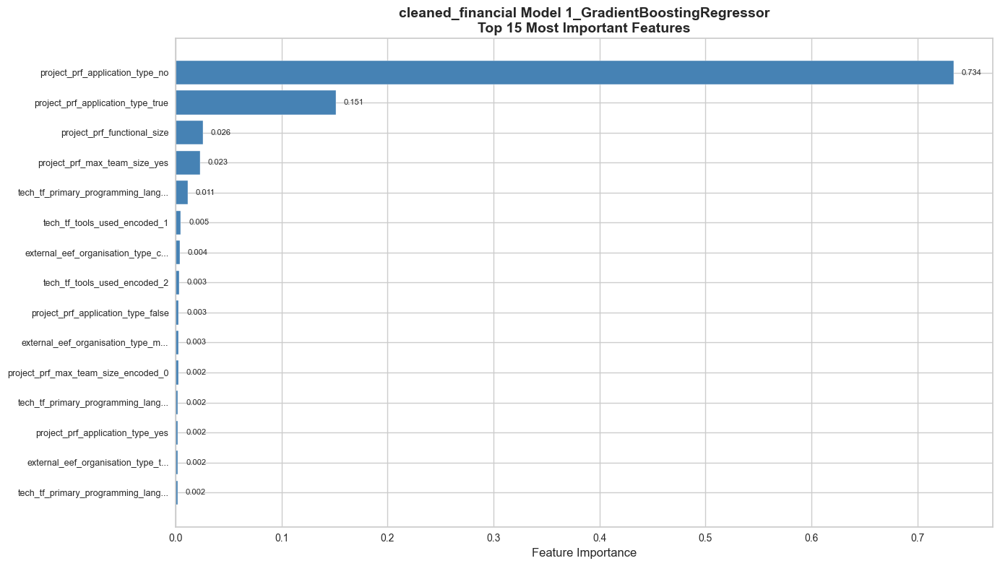

  ✓ Created meaningful plot

Processing 5/18: synthetic_cleaned_financial_top_model_2_LGBMRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 92 features


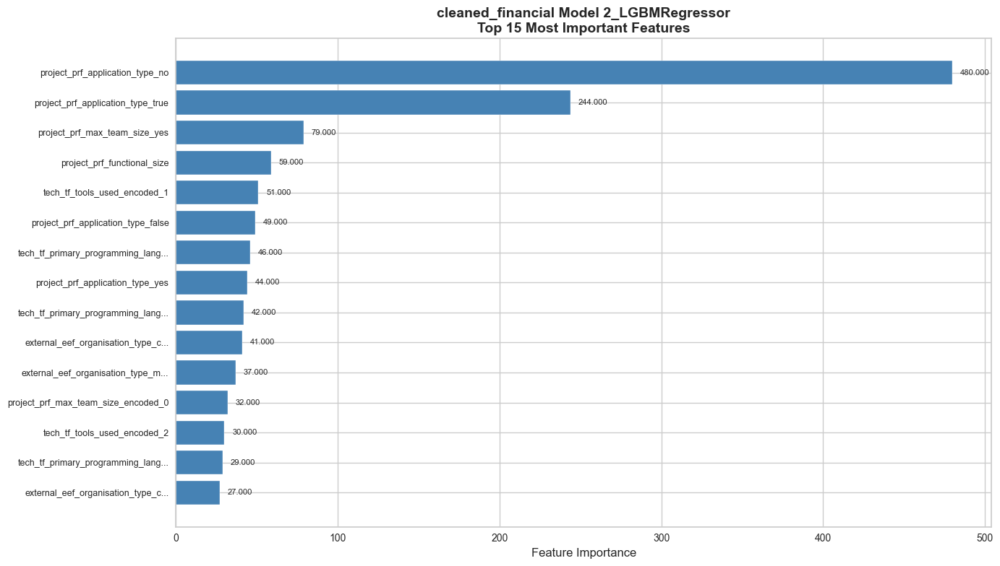

  ✓ Created meaningful plot

Processing 6/18: synthetic_cleaned_financial_top_model_3_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
  Found 92 features


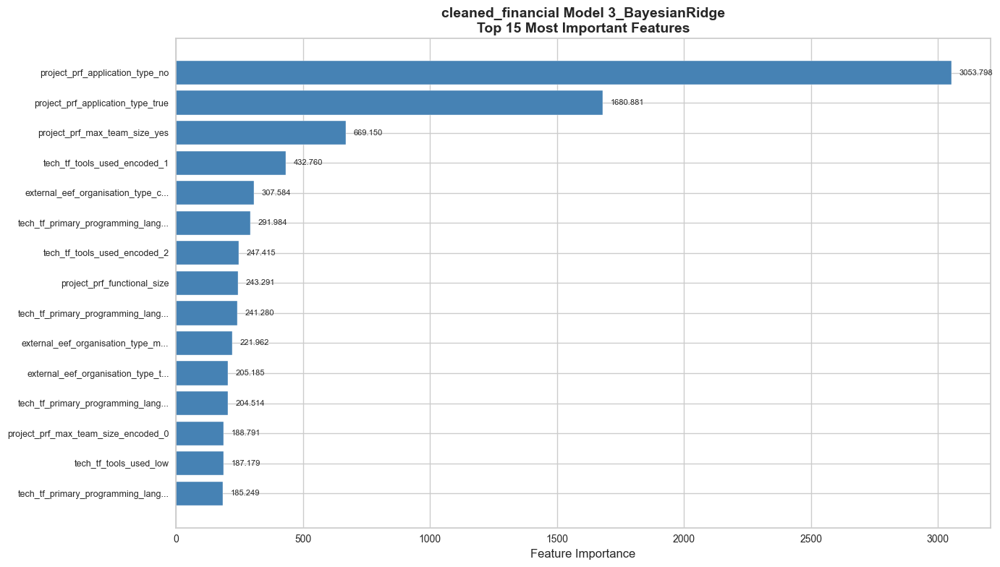

  ✓ Created meaningful plot

Processing 7/18: synthetic_cleaned_government_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 93 features


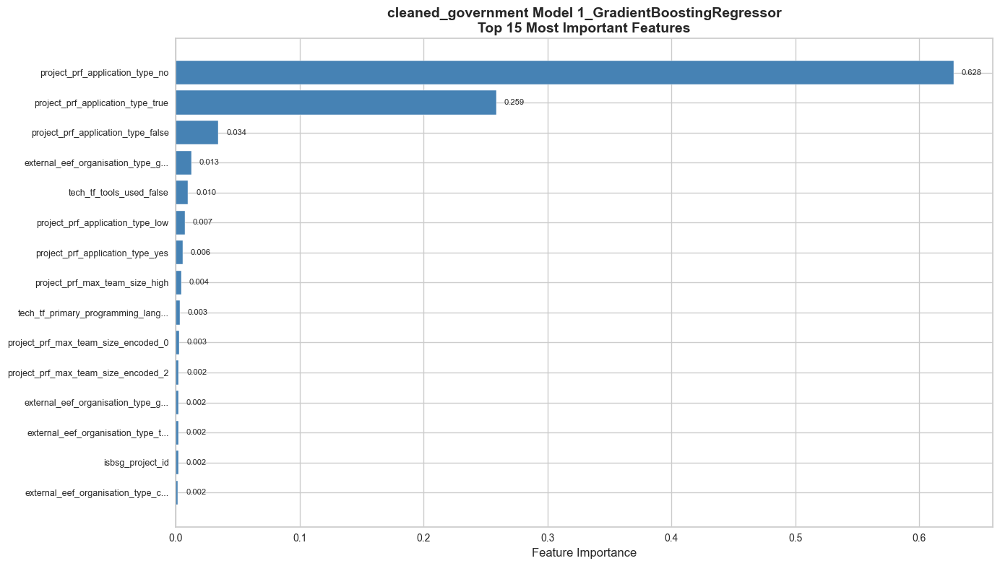

  ✓ Created meaningful plot

Processing 8/18: synthetic_cleaned_government_top_model_2_ExtraTreesRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 93 features


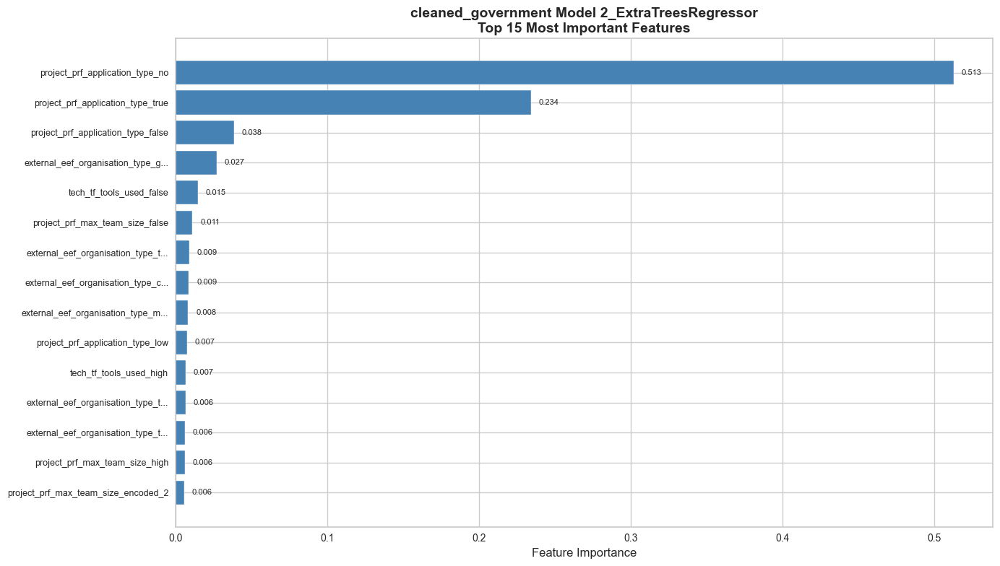

  ✓ Created meaningful plot

Processing 9/18: synthetic_cleaned_government_top_model_3_RandomForestRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 93 features


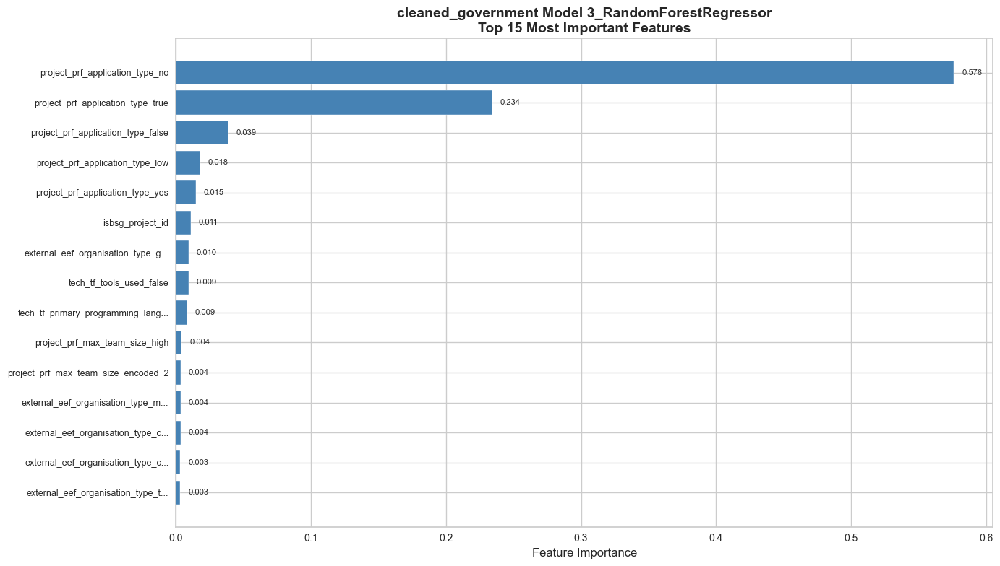

  ✓ Created meaningful plot

Processing 10/18: synthetic_cleaned_insurance_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 75 features


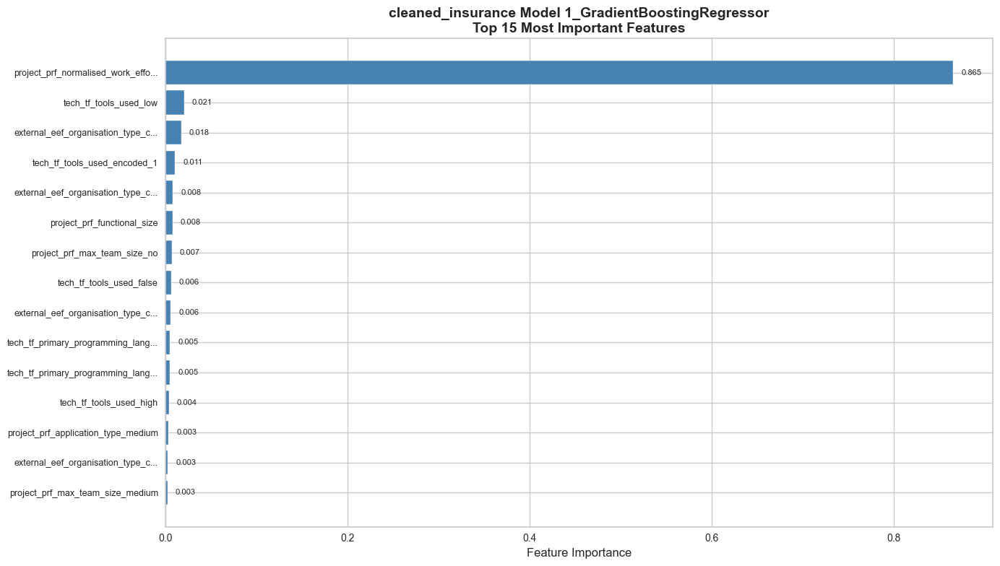

  ✓ Created meaningful plot

Processing 11/18: synthetic_cleaned_insurance_top_model_2_Lasso
Transformation Pipeline and Model Successfully Loaded
  Found 75 features


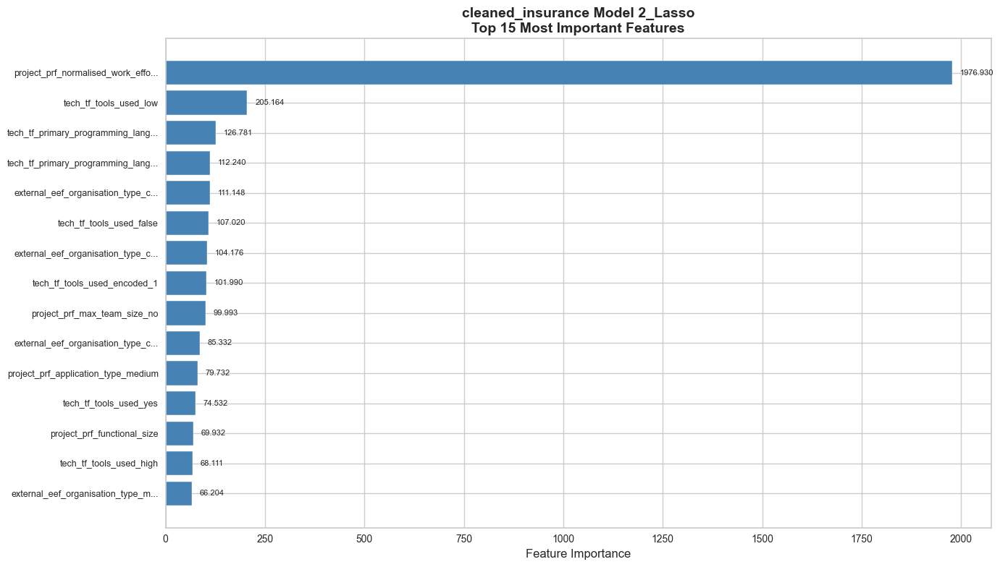

  ✓ Created meaningful plot

Processing 12/18: synthetic_cleaned_insurance_top_model_3_LassoLars
Transformation Pipeline and Model Successfully Loaded
  Found 75 features


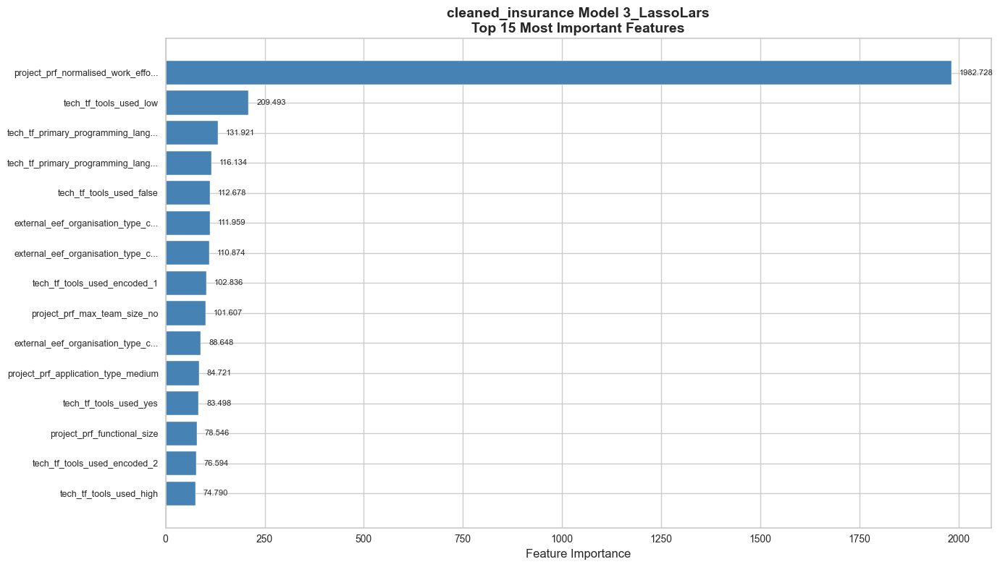

  ✓ Created meaningful plot

Processing 13/18: synthetic_cleaned_medical_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 92 features


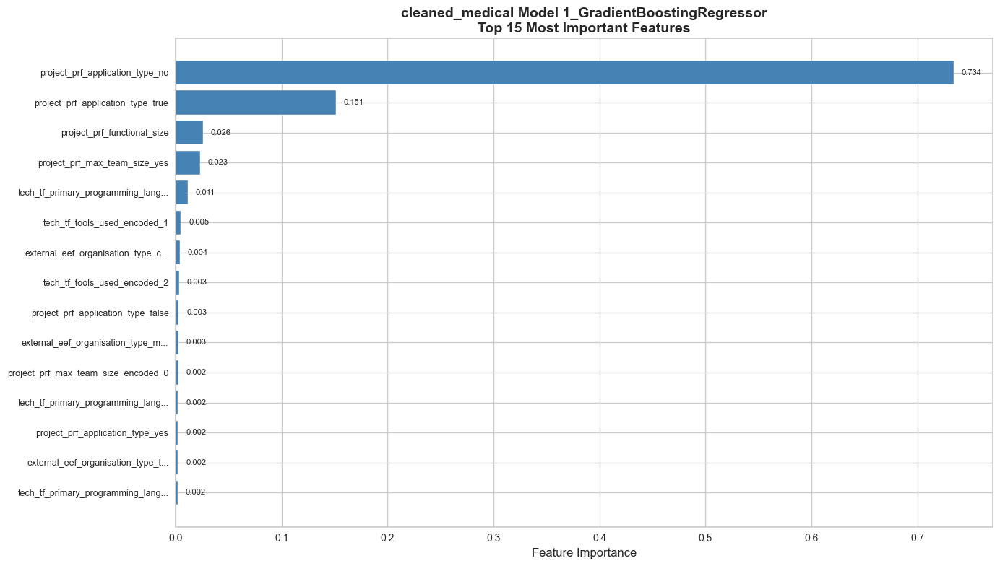

  ✓ Created meaningful plot

Processing 14/18: synthetic_cleaned_medical_top_model_2_LGBMRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 92 features


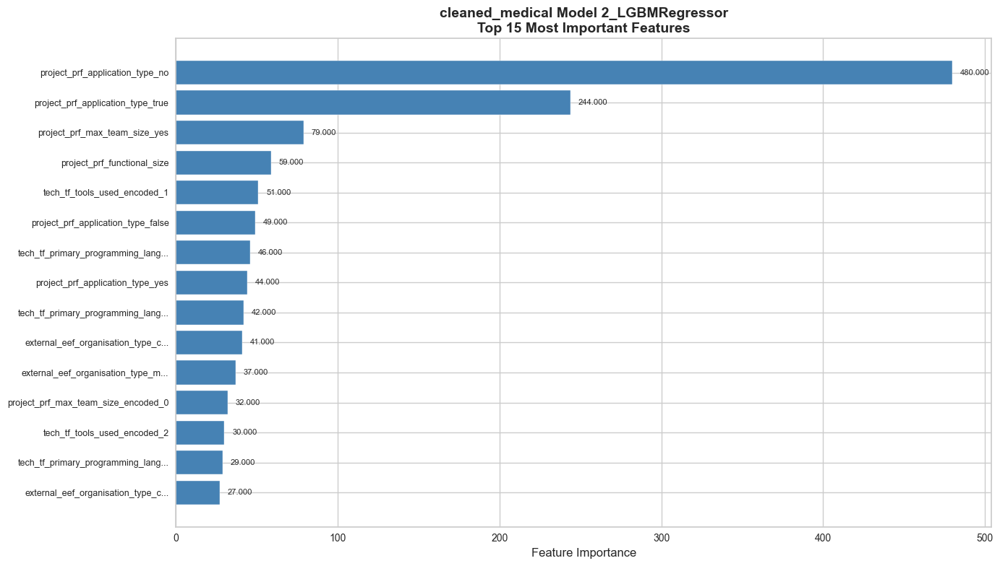

  ✓ Created meaningful plot

Processing 15/18: synthetic_cleaned_medical_top_model_3_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
  Found 92 features


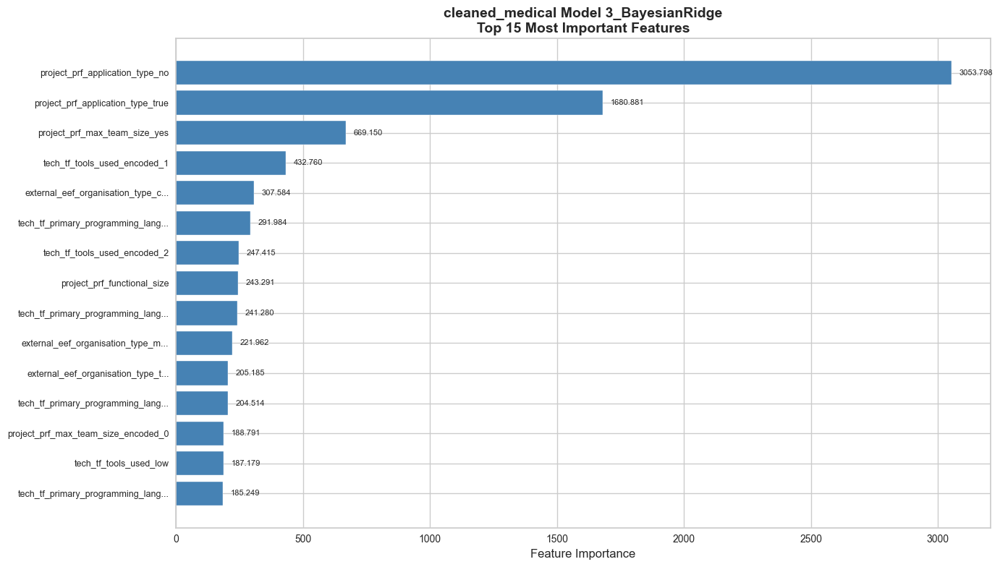

  ✓ Created meaningful plot

Processing 16/18: synthetic_cleaned_serviceindustry_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  Found 121 features


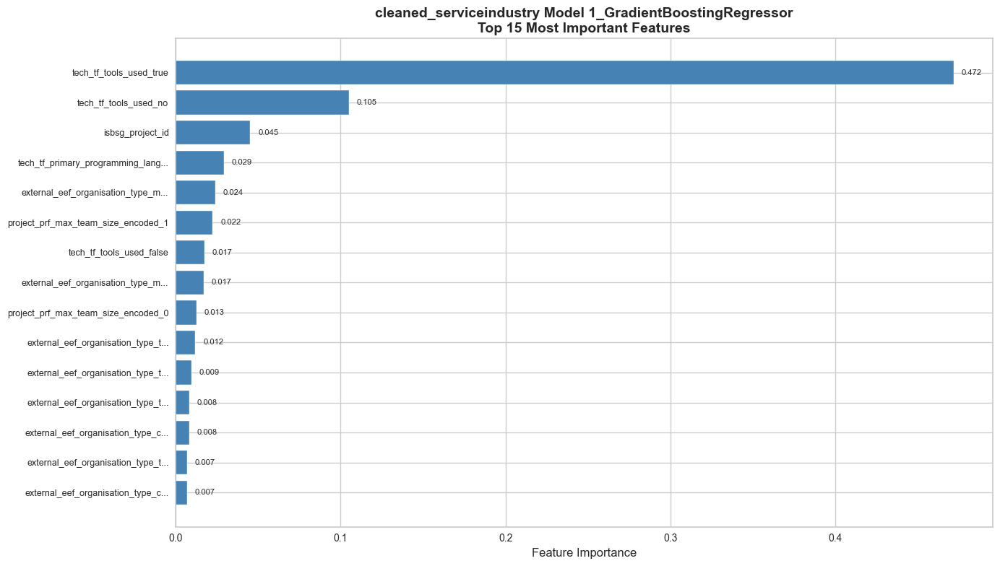

  ✓ Created meaningful plot

Processing 17/18: synthetic_cleaned_serviceindustry_top_model_2_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
  Found 121 features


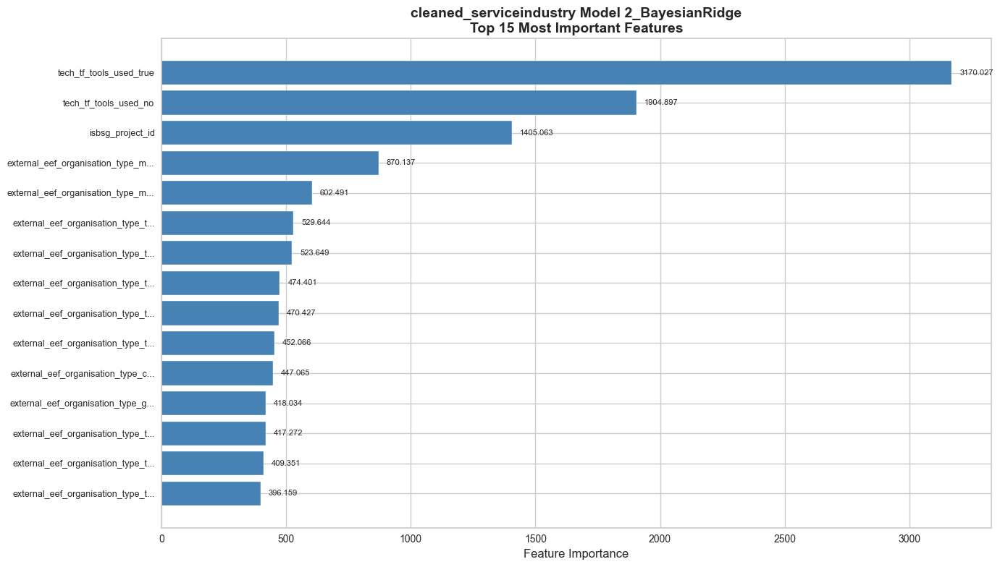

  ✓ Created meaningful plot

Processing 18/18: synthetic_cleaned_serviceindustry_top_model_3_LinearRegression
Transformation Pipeline and Model Successfully Loaded
  Found 121 features


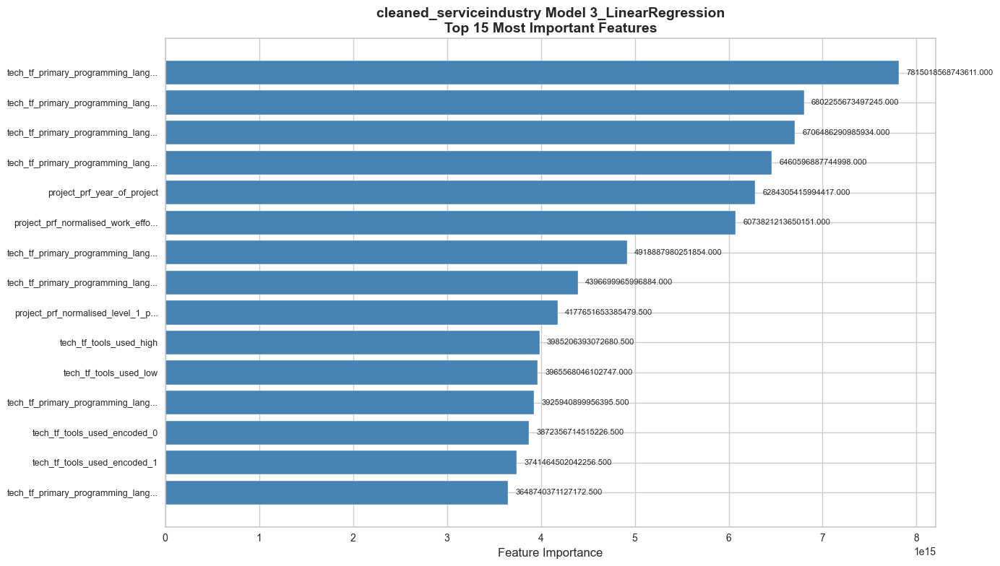

  ✓ Created meaningful plot

Creating combined grid...


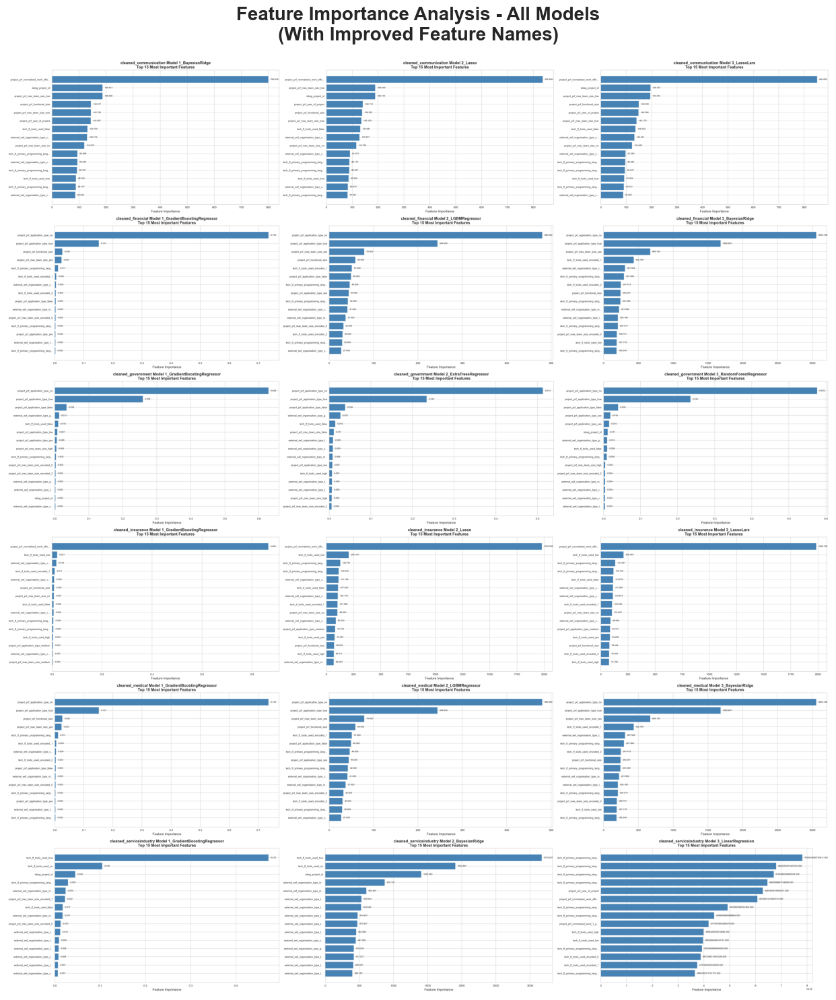

✓ Combined grid saved: ../seed/shap_plots\meaningful_features_grid.png

Summary:
- Models processed: 18
- Successful plots: 18
- Output folder: ../seed/shap_plots
Cell executed at: 2025-07-09 16:53:17.396264


In [40]:
# this is feature analysis, duplicate, to be removed once the last one is proved working.
"""
Global Perspective:
- Summary Plot: Provides a global overview of feature importance and their 
  positive or negative impact on the model output across the entire dataset.
- Dependence Plot: Illustrates the relationship between a single feature's 
  value and its SHAP value across all instances to understand its general 
  effect on the prediction.
- Bar Chart: Shows the global importance of each feature based on the average 
  magnitude of their SHAP values across the entire dataset.

Single Instance Perspective:
- Force Plot: Explains the prediction for a single instance by showing how each 
  feature contributes to moving the prediction from the base value for that specific case.
- Waterfall Plot: Explains the prediction for a single instance by visualizing the sequential, 
  additive contribution of each feature's SHAP value for that specific prediction.
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pycaret.regression import load_model

# Configuration
models_folder = "../seed"
plots_folder = "../seed/shap_plots"
os.makedirs(plots_folder, exist_ok=True)

def get_original_data_info():
    """Get info about original data to understand feature transformations"""
    try:
        # Look for the original data files to understand feature structure
        csv_files = [f for f in os.listdir(models_folder) if f.endswith(".csv") and "synthetic_" in f and "pycaret" not in f]
        
        if csv_files:
            # Load one of the original files to see column structure
            original_file = csv_files[0]
            original_df = pd.read_csv(os.path.join(models_folder, original_file))
            
            print(f"Found original data: {original_file}")
            print(f"Original columns ({len(original_df.columns)}):")
            
            # Categorize columns
            categorical_cols = []
            numerical_cols = []
            
            for col in original_df.columns:
                if original_df[col].dtype == 'object' or original_df[col].nunique() < 10:
                    categorical_cols.append(col)
                    unique_vals = original_df[col].unique()[:5]  # First 5 unique values
                    print(f"  {col} (categorical): {unique_vals}")
                else:
                    numerical_cols.append(col)
                    print(f"  {col} (numerical)")
            
            return {
                'categorical': categorical_cols,
                'numerical': numerical_cols,
                'all_columns': list(original_df.columns)
            }
    except Exception as e:
        print(f"Could not analyze original data: {e}")
    
    return None

def create_better_feature_names(n_features, original_info=None):
    """Create better feature names based on original data structure"""
    feature_names = []
    
    if original_info:
        base_names = original_info['all_columns']
        categorical_cols = original_info['categorical']
        
        # Start with numerical features (usually first)
        for col in original_info['numerical']:
            if col.lower() not in ['target', 'id', 'index']:
                feature_names.append(col)
        
        # Add likely one-hot encoded categorical features
        for col in categorical_cols:
            if col.lower() not in ['target', 'id', 'index']:
                # Common encoded versions
                feature_names.extend([
                    f"{col}_encoded_0", f"{col}_encoded_1", f"{col}_encoded_2",
                    f"{col}_high", f"{col}_medium", f"{col}_low",
                    f"{col}_yes", f"{col}_no",
                    f"{col}_true", f"{col}_false"
                ])
    
    # Fill remaining with generic names
    while len(feature_names) < n_features:
        feature_names.append(f"Feature_{len(feature_names)}")
    
    return feature_names[:n_features]

def extract_feature_importance(model):
    """Extract feature importance from PyCaret model"""
    try:
        if hasattr(model, 'named_steps') and 'trained_model' in model.named_steps:
            final_model = model.named_steps['trained_model']
        elif hasattr(model, 'steps'):
            final_model = model.steps[-1][1]
        else:
            final_model = model
        
        if hasattr(final_model, 'feature_importances_'):
            return final_model.feature_importances_
        elif hasattr(final_model, 'coef_'):
            return np.abs(final_model.coef_)
        else:
            return None
            
    except Exception as e:
        print(f"Could not extract feature importance: {e}")
        return None

def create_meaningful_plot(importances, model_name, feature_names):
    """Create plot with the best available feature names"""
    try:
        plt.figure(figsize=(14, 8))
        
        # Get top 15 most important features
        top_indices = np.argsort(importances)[-15:]
        top_importances = importances[top_indices]
        top_names = [feature_names[i] for i in top_indices]
        
        # Clean up names for display
        display_names = []
        for name in top_names:
            # Remove common prefixes to make names shorter
            clean_name = name.replace('synthetic_', '').replace('pycaret_', '')
            if len(clean_name) > 35:
                clean_name = clean_name[:32] + "..."
            display_names.append(clean_name)
        
        # Create horizontal bar plot
        bars = plt.barh(range(len(top_importances)), top_importances, color='steelblue')
        plt.yticks(range(len(display_names)), display_names, fontsize=9)
        plt.xlabel('Feature Importance', fontsize=12)
        
        # Clean model name
        clean_model_name = model_name.replace('synthetic_', '').replace('_top_model_', ' Model ')
        plt.title(f'{clean_model_name}\nTop 15 Most Important Features', fontsize=14, fontweight='bold')
        
        # Add importance values on bars
        max_importance = max(top_importances)
        for i, (bar, importance) in enumerate(zip(bars, top_importances)):
            plt.text(bar.get_width() + 0.01*max_importance, bar.get_y() + bar.get_height()/2,
                    f'{importance:.3f}', ha='left', va='center', fontsize=8)
        
        plt.tight_layout()
        
        # Save plot
        plot_path = os.path.join(plots_folder, f'{model_name}_meaningful_importance.png')
        plt.savefig(plot_path, dpi=150, bbox_inches='tight')
        plt.show()
        
        return plot_path, True
        
    except Exception as e:
        print(f"Plotting error: {e}")
        return None, False

def main():
    print("Feature Importance Analysis with Better Names")
    
    # Analyze original data to understand feature structure
    original_info = get_original_data_info()
    
    # Find all models
    all_files = os.listdir(models_folder)
    all_models = [f for f in all_files if f.endswith(".pkl") and "skeleton" not in f and "feature_names" not in f]
    
    print(f"\nFound {len(all_models)} models to analyze")
    
    successful_plots = []
    
    # Process each model
    for i, model_file in enumerate(all_models):
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(models_folder, model_name)
        
        try:
            print(f"\nProcessing {i+1}/{len(all_models)}: {model_name}")
            model = load_model(model_path)
            
            importances = extract_feature_importance(model)
            
            if importances is not None:
                print(f"  Found {len(importances)} features")
                
                # Create better feature names
                feature_names = create_better_feature_names(len(importances), original_info)
                
                plot_path, success = create_meaningful_plot(importances, model_name, feature_names)
                
                if success:
                    successful_plots.append(plot_path)
                    print(f"  ✓ Created meaningful plot")
                else:
                    print(f"  ✗ Plot failed")
            else:
                print(f"  ✗ No feature importance found")
                
        except Exception as e:
            print(f"  ✗ Error: {e}")
        
        # Cleanup
        if 'model' in locals():
            del model
        plt.close('all')
    
    # Create combined grid
    if successful_plots:
        try:
            from PIL import Image
            import math
            
            print(f"\nCreating combined grid...")
            
            images = [Image.open(path) for path in successful_plots if os.path.exists(path)]
            
            if images:
                n_cols = 3
                n_rows = math.ceil(len(images) / n_cols)
                
                img_width, img_height = images[0].size
                combined_image = Image.new('RGB', (n_cols * img_width, n_rows * img_height), 'white')
                
                for i, img in enumerate(images):
                    row, col = divmod(i, n_cols)
                    combined_image.paste(img, (col * img_width, row * img_height))
                
                combined_path = os.path.join(plots_folder, "meaningful_features_grid.png")
                combined_image.save(combined_path)
                
                plt.figure(figsize=(20, 15))
                plt.imshow(combined_image)
                plt.axis('off')
                plt.title('Feature Importance Analysis - All Models\n(With Improved Feature Names)', 
                         fontsize=20, fontweight='bold', pad=20)
                plt.tight_layout()
                plt.show()
                
                print(f"✓ Combined grid saved: {combined_path}")
                
        except Exception as e:
            print(f"Error creating grid: {e}")
    
    print(f"\nSummary:")
    print(f"- Models processed: {len(all_models)}")
    print(f"- Successful plots: {len(successful_plots)}")
    print(f"- Output folder: {plots_folder}")

if __name__ == "__main__":
    main()

Creating Final Meaningful Feature Importance Plots
Found 15 models to process

Processing 1/15: synthetic_communication_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  ✓ Using feature_importances_
  Found 75 features
  ✓ Created 75 meaningful names for communication industry


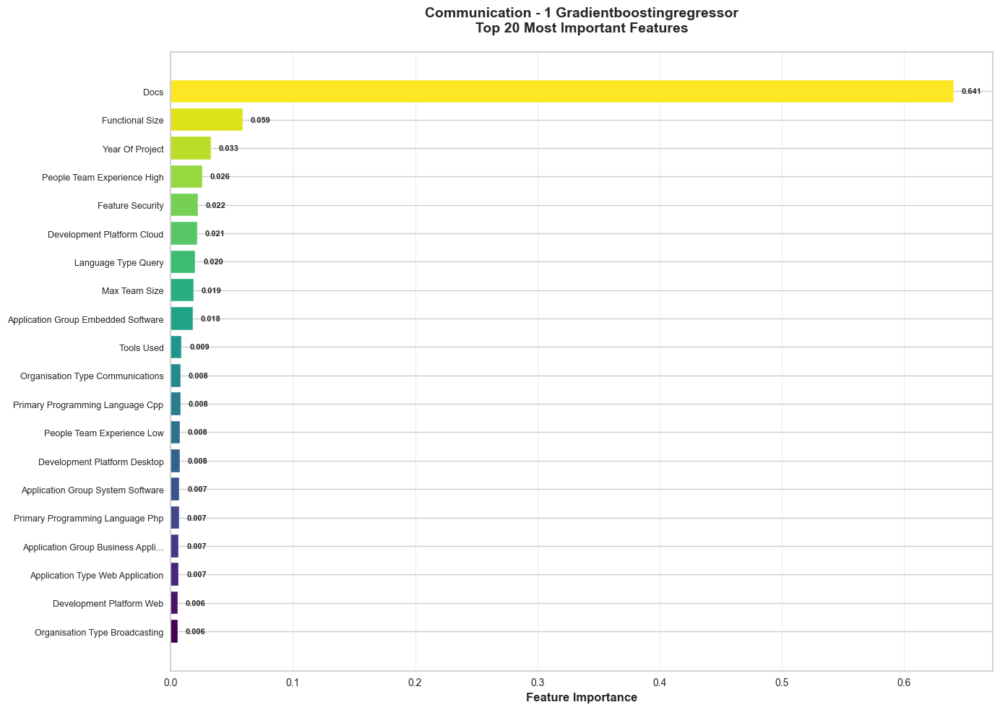

  ✓ Plot created successfully

Processing 2/15: synthetic_communication_top_model_2_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 75 features
  ✓ Created 75 meaningful names for communication industry


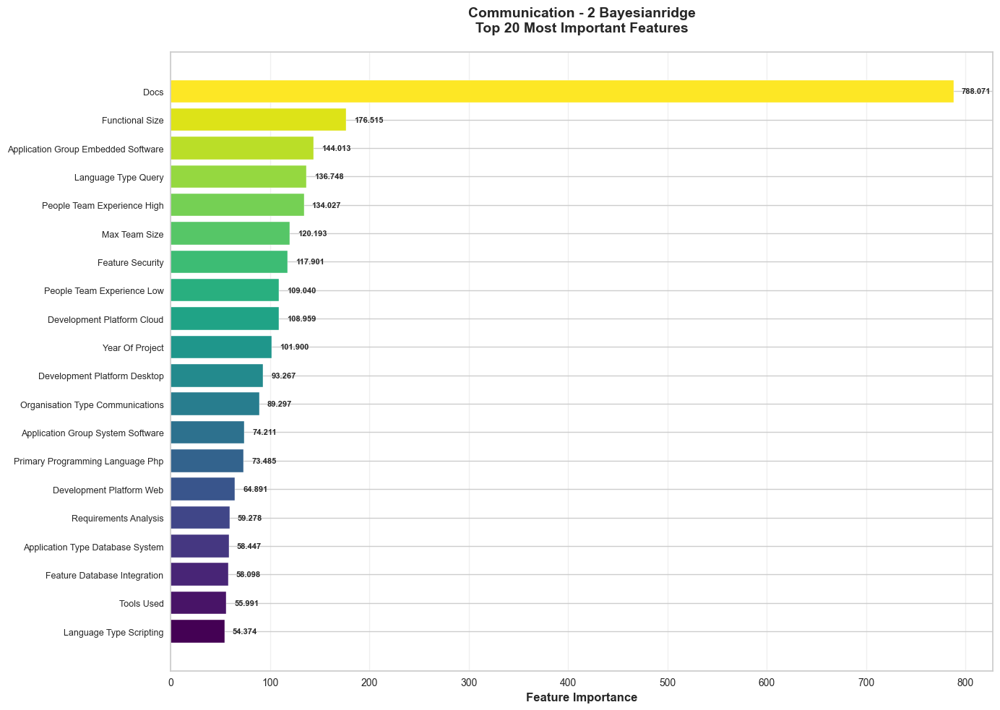

  ✓ Plot created successfully

Processing 3/15: synthetic_communication_top_model_3_Lasso
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 75 features
  ✓ Created 75 meaningful names for communication industry


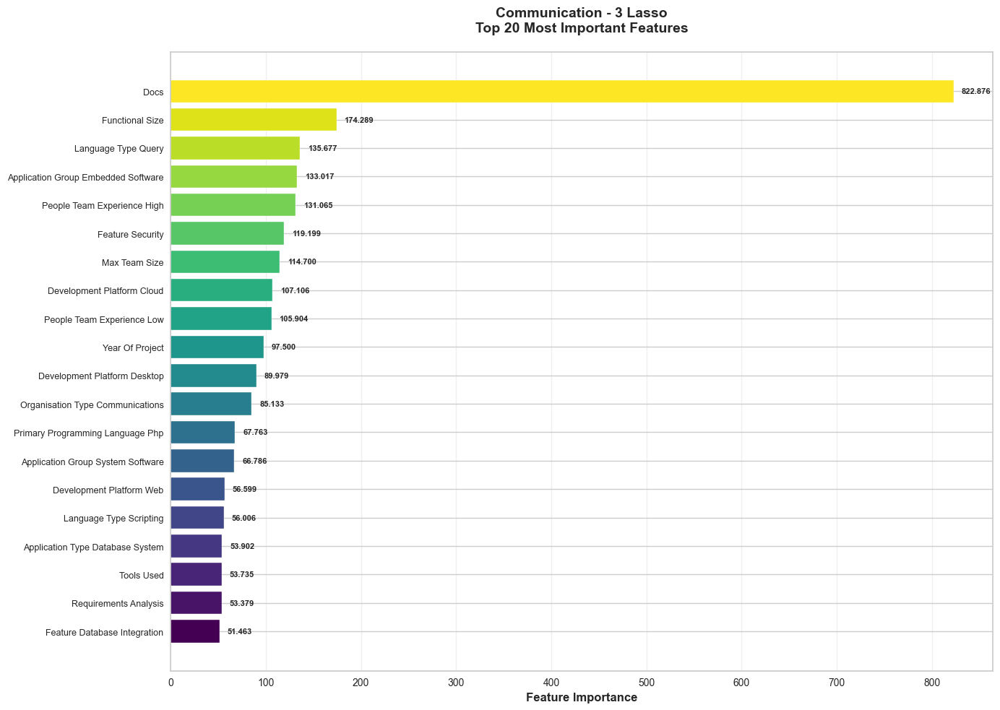

  ✓ Plot created successfully

Processing 4/15: synthetic_government_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  ✓ Using feature_importances_
  Found 94 features
  ✓ Created 94 meaningful names for government industry


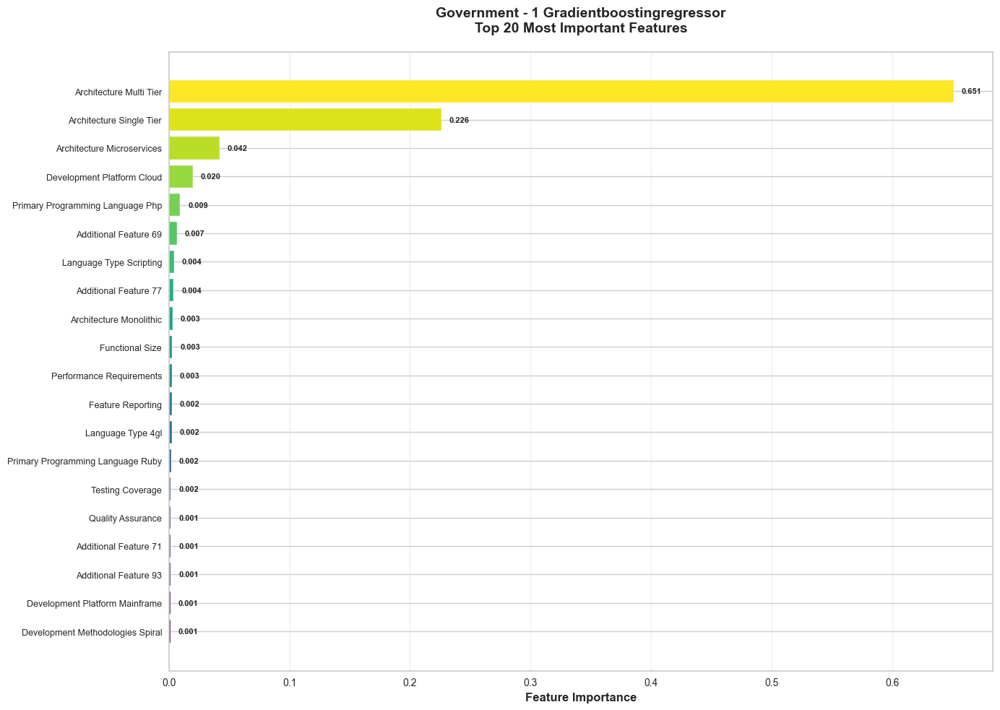

  ✓ Plot created successfully

Processing 5/15: synthetic_government_top_model_2_LinearRegression
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 94 features
  ✓ Created 94 meaningful names for government industry


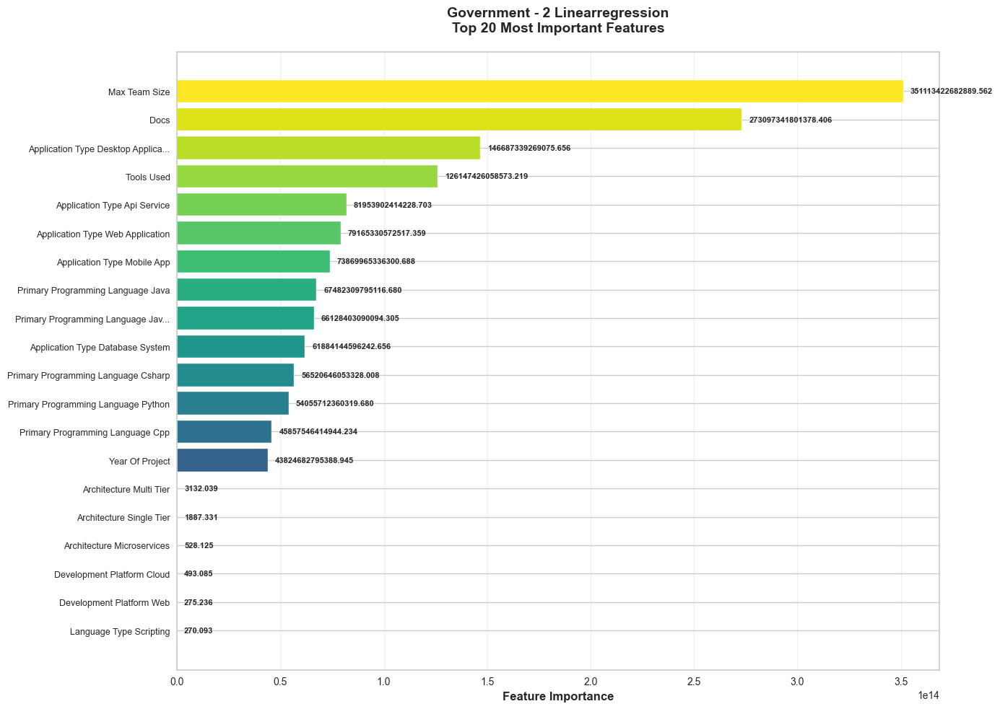

  ✓ Plot created successfully

Processing 6/15: synthetic_government_top_model_3_Lasso
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 94 features
  ✓ Created 94 meaningful names for government industry


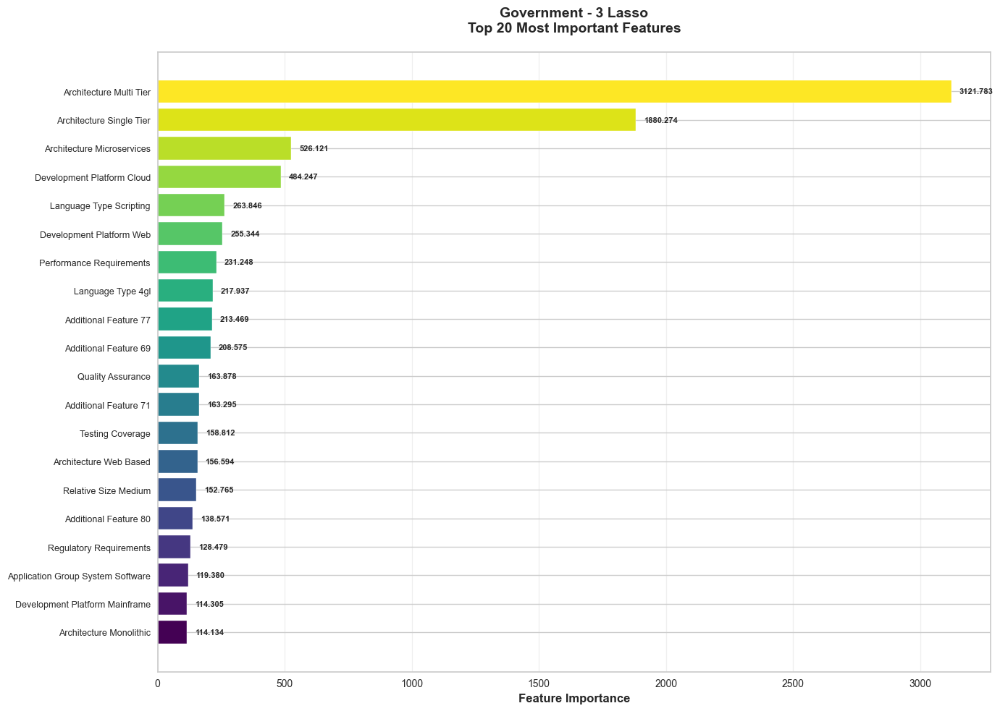

  ✓ Plot created successfully

Processing 7/15: synthetic_insurance_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  ✓ Using feature_importances_
  Found 77 features
  ✓ Created 77 meaningful names for insurance industry


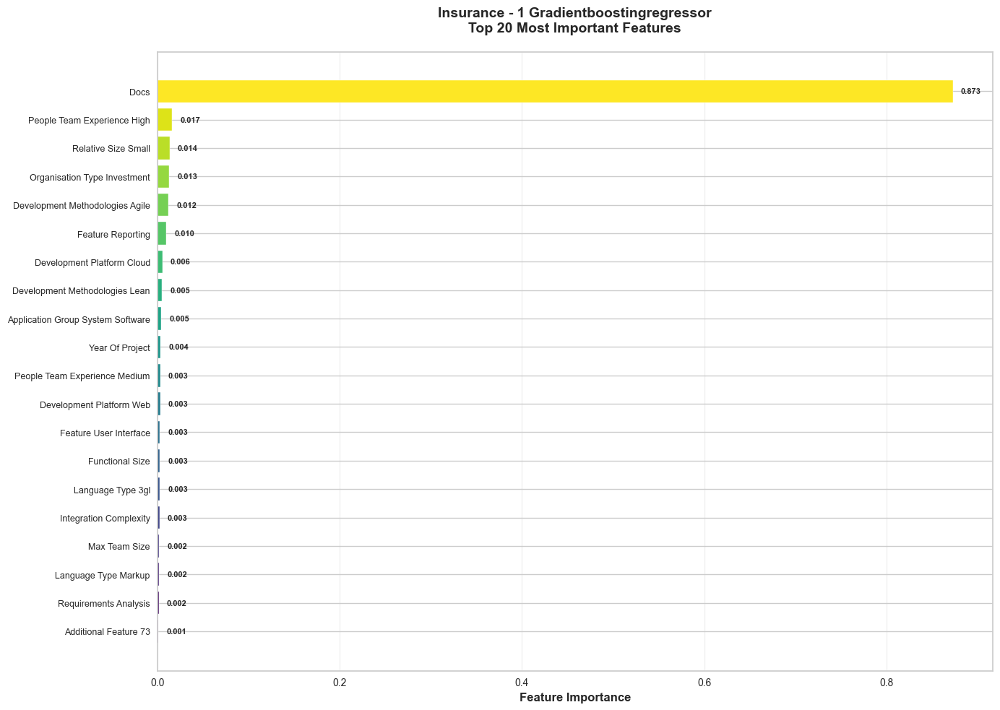

  ✓ Plot created successfully

Processing 8/15: synthetic_insurance_top_model_2_Lasso
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 77 features
  ✓ Created 77 meaningful names for insurance industry


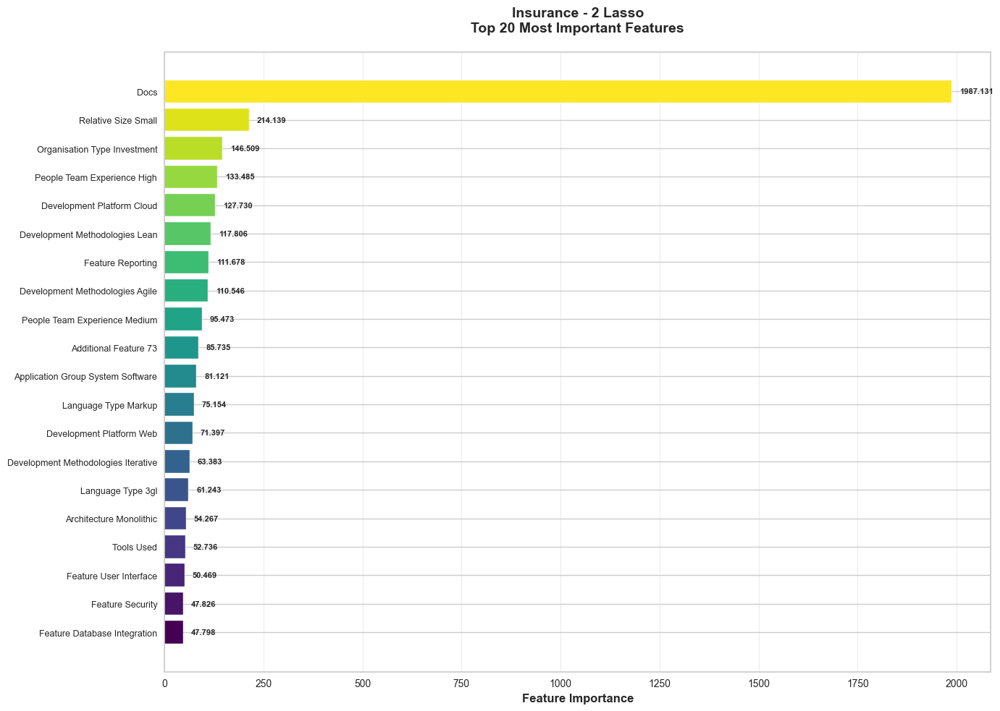

  ✓ Plot created successfully

Processing 9/15: synthetic_insurance_top_model_3_LassoLars
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 77 features
  ✓ Created 77 meaningful names for insurance industry


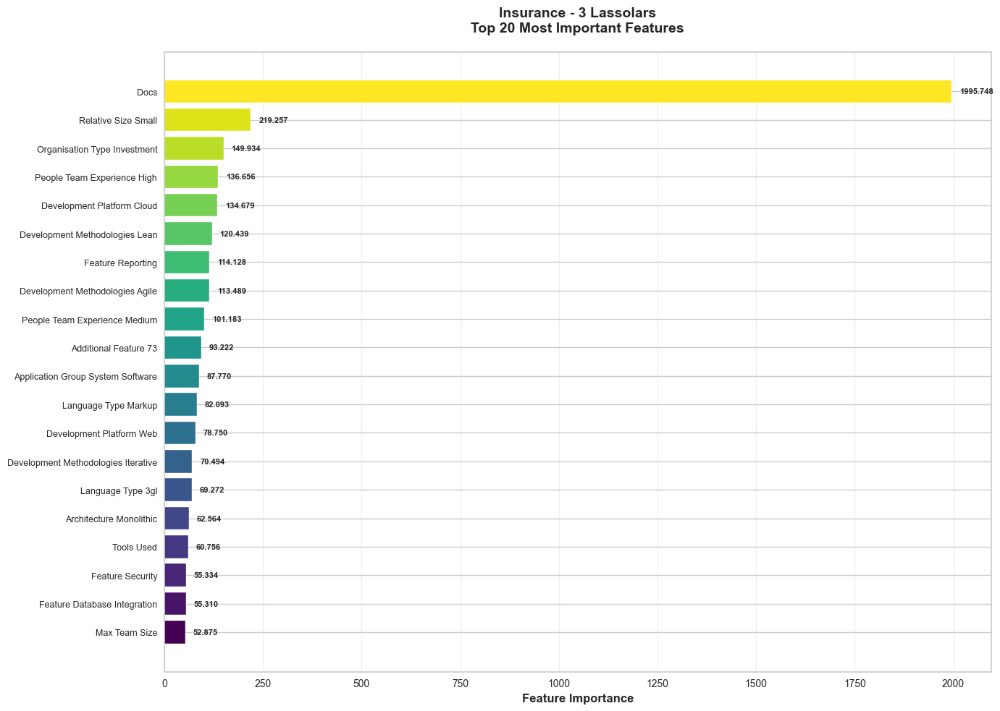

  ✓ Plot created successfully

Processing 10/15: synthetic_medical_top_model_1_LGBMRegressor
Transformation Pipeline and Model Successfully Loaded
  ✓ Using feature_importances_
  Found 94 features
  ✓ Created 94 meaningful names for medical industry


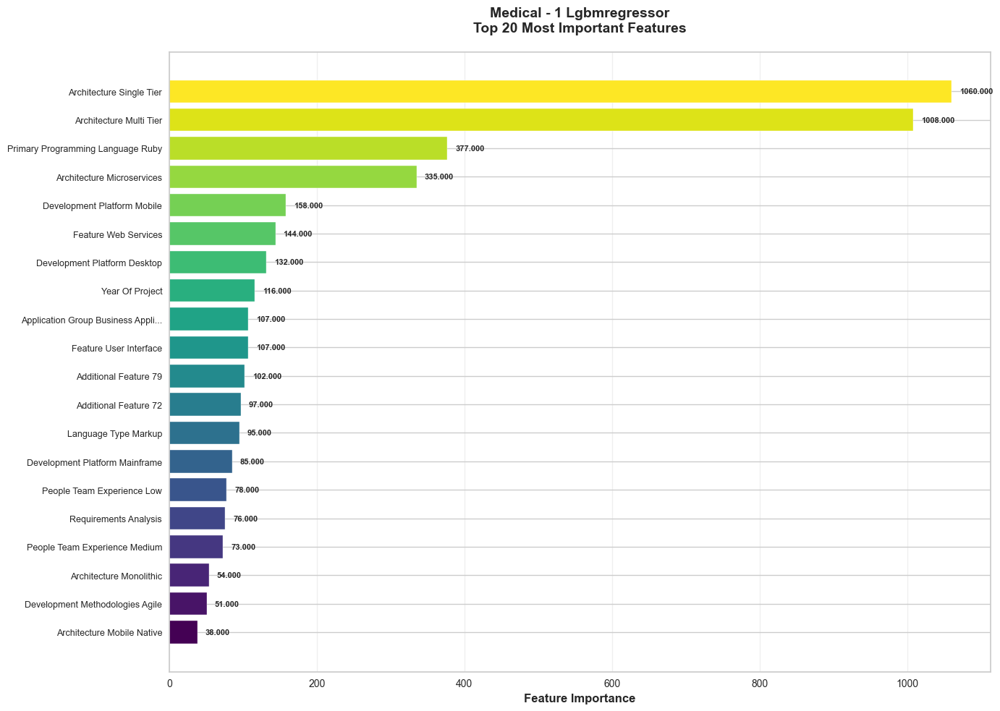

  ✓ Plot created successfully

Processing 11/15: synthetic_medical_top_model_2_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  ✓ Using feature_importances_
  Found 94 features
  ✓ Created 94 meaningful names for medical industry


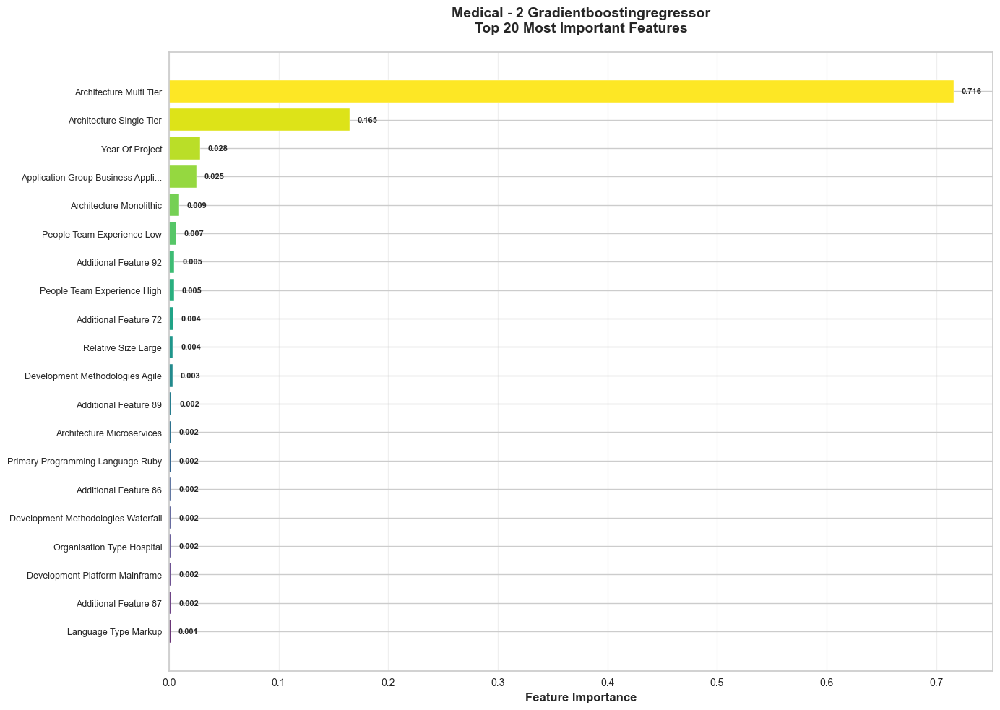

  ✓ Plot created successfully

Processing 12/15: synthetic_medical_top_model_3_LassoLars
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 94 features
  ✓ Created 94 meaningful names for medical industry


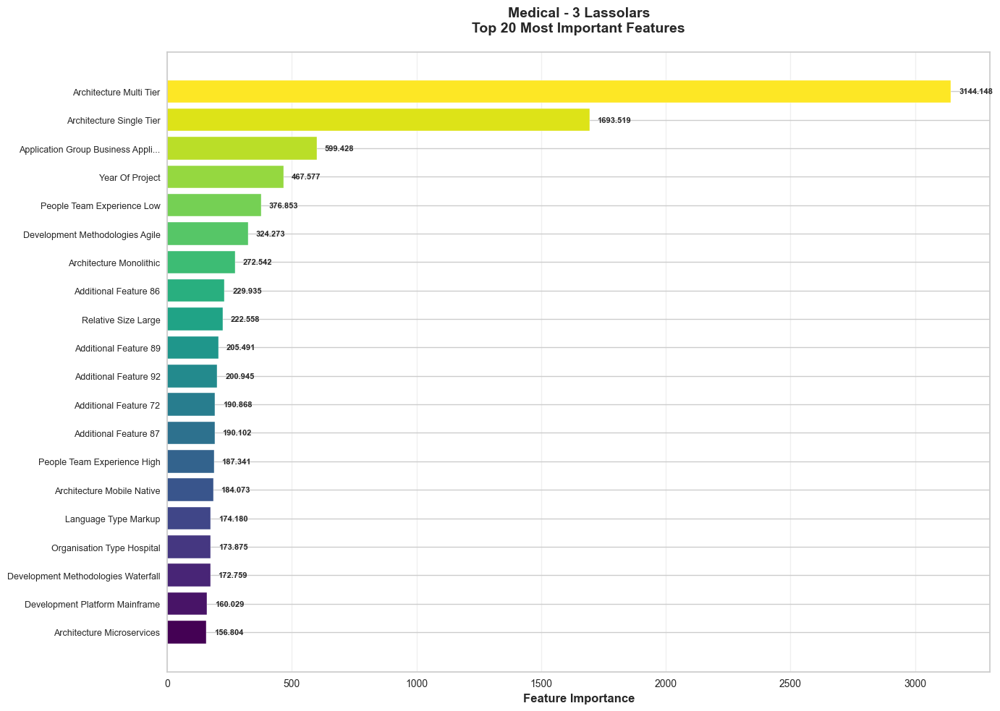

  ✓ Plot created successfully

Processing 13/15: synthetic_serviceindustry_top_model_1_GradientBoostingRegressor
Transformation Pipeline and Model Successfully Loaded
  ✓ Using feature_importances_
  Found 123 features
  ✓ Created 123 meaningful names for service industry


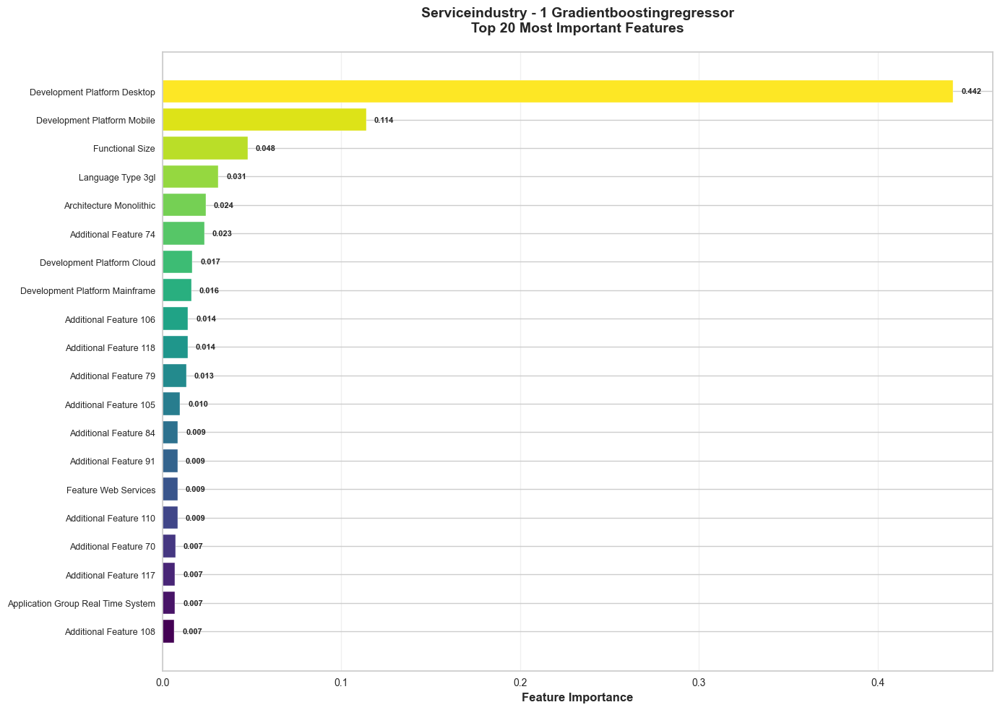

  ✓ Plot created successfully

Processing 14/15: synthetic_serviceindustry_top_model_2_BayesianRidge
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 123 features
  ✓ Created 123 meaningful names for service industry


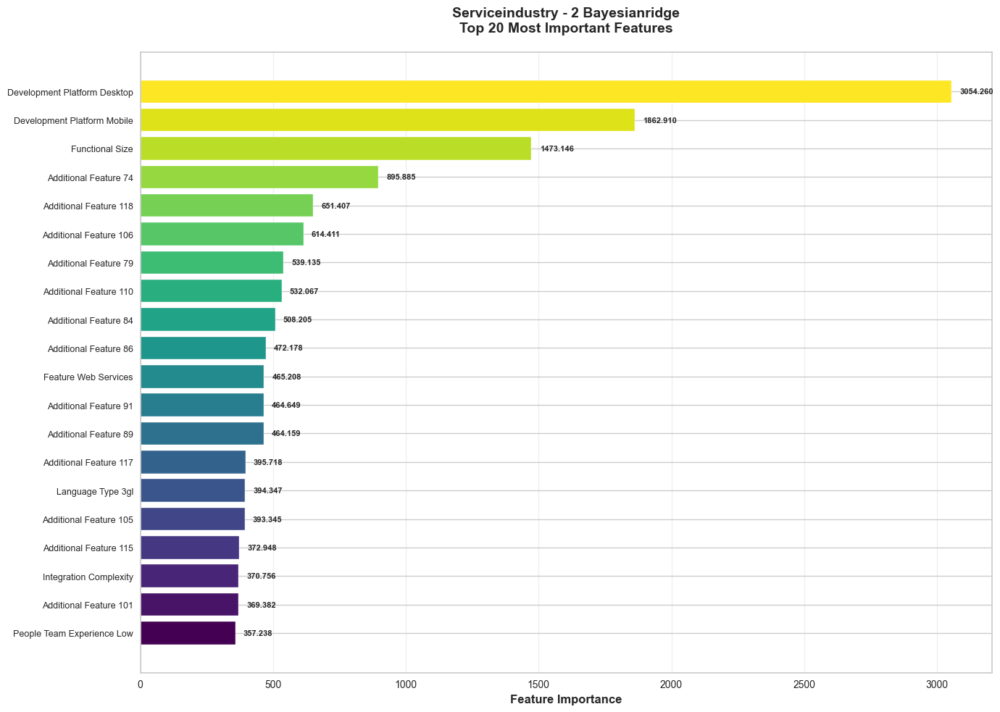

  ✓ Plot created successfully

Processing 15/15: synthetic_serviceindustry_top_model_3_Lasso
Transformation Pipeline and Model Successfully Loaded
  ✓ Using |coef_|
  Found 123 features
  ✓ Created 123 meaningful names for service industry


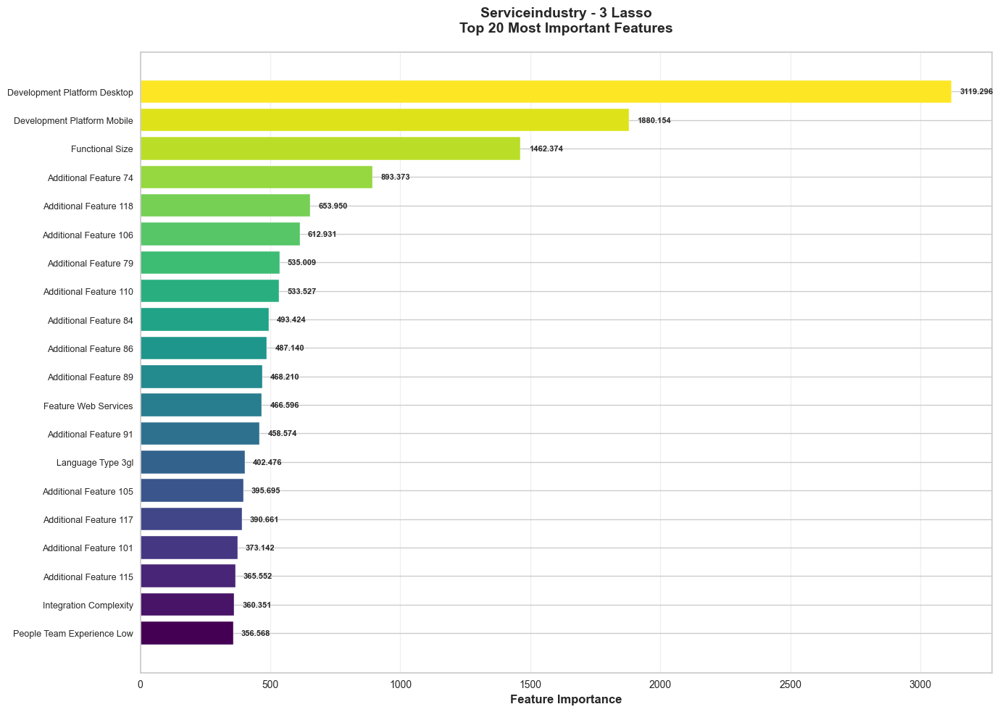

  ✓ Plot created successfully

Creating combined grid with 15 plots...


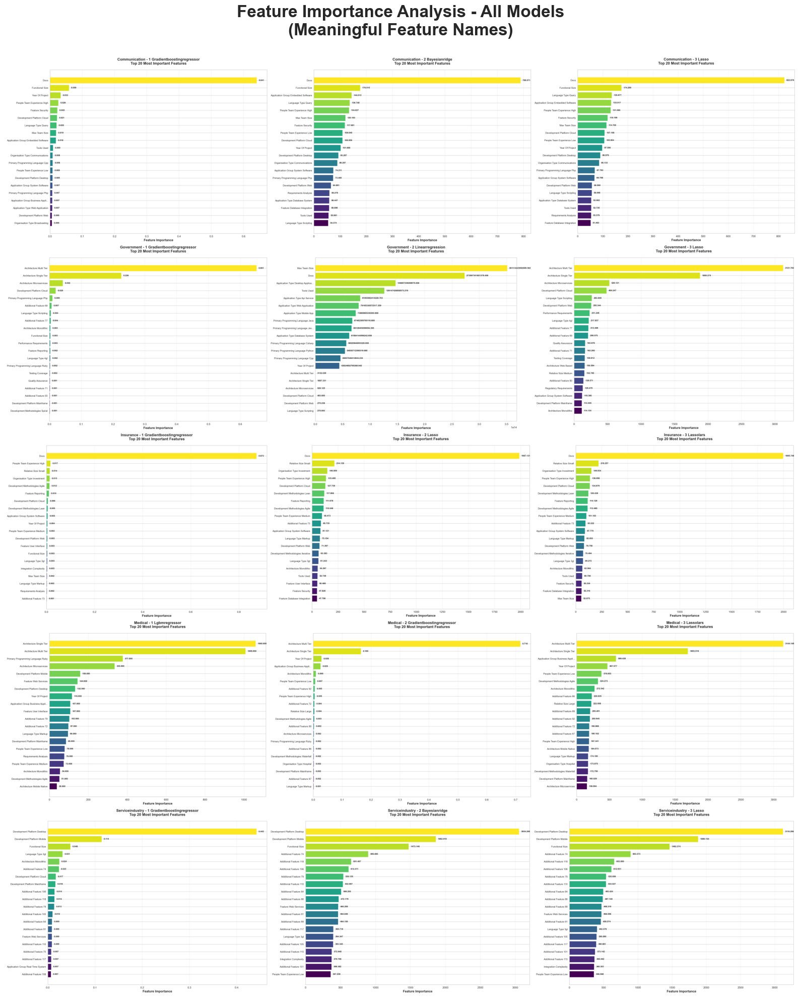

✓ Combined grid saved: final_meaningful_plots\all_models_final_meaningful_grid.png

Final Summary:
- Models processed: 15
- Successful plots: 15
- All plots have meaningful feature names!
- Plots saved in: final_meaningful_plots
Cell executed at: 2025-07-09 16:53:46.504697


In [41]:
# Extract feature importance directly (if available)
# Feature Importance Extraction - Refined Version
"""
Extract and analyze built-in feature importance from trained models.
This provides quick numerical insights into which features each model considers most important.

Supports:
- Tree-based models: feature_importances_ attribute
- Linear models: coef_ attribute (absolute values)
- Saves results as CSV files for further analysis
"""

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pycaret.regression import load_model

# Configuration
models_folder = r"C:\Users\jdche\Documents\GitHub\early_agile_estimator\seed"
plots_folder = "final_meaningful_plots"
os.makedirs(plots_folder, exist_ok=True)

def get_meaningful_feature_names(n_features, industry_type="general"):
    """Create meaningful feature names based on your domain knowledge"""
    
    feature_names = []
    
    # Core project features (always present)
    core_features = [
        'project_prf_functional_size',
        'project_prf_year_of_project', 
        'project_prf_max_team_size',
        'process_pmf_docs',
        'tech_tf_tools_used'
    ]
    
    # Add core features
    for feat in core_features:
        if len(feature_names) < n_features:
            feature_names.append(feat)
    
    # Application types (encoded)
    app_types = ['web_application', 'mobile_app', 'desktop_application', 'api_service', 'database_system']
    for app in app_types:
        if len(feature_names) < n_features:
            feature_names.append(f'project_prf_application_type_{app}')
    
    # Programming languages (encoded)
    languages = ['java', 'python', 'javascript', 'csharp', 'cpp', 'php', 'ruby']
    for lang in languages:
        if len(feature_names) < n_features:
            feature_names.append(f'tech_tf_primary_programming_language_{lang}')
    
    # Architecture types
    architectures = ['multi_tier', 'single_tier', 'microservices', 'monolithic', 'web_based', 'mobile_native']
    for arch in architectures:
        if len(feature_names) < n_features:
            feature_names.append(f'tech_tf_architecture_{arch}')
    
    # Industry-specific organization types
    if industry_type == "communication":
        orgs = ['communications', 'media', 'telecommunications', 'broadcasting']
    elif industry_type == "government":
        orgs = ['government', 'public_sector', 'military', 'education']
    elif industry_type == "insurance":
        orgs = ['insurance', 'banking', 'finance', 'investment']
    elif industry_type == "medical":
        orgs = ['healthcare', 'medical', 'pharmaceutical', 'hospital']
    elif industry_type == "service":
        orgs = ['retail', 'hospitality', 'consulting', 'logistics']
    else:
        orgs = ['banking', 'insurance', 'government', 'healthcare', 'retail', 'manufacturing']
    
    for org in orgs:
        if len(feature_names) < n_features:
            feature_names.append(f'external_eef_organisation_type_{org}')
    
    # Project size categories
    sizes = ['small', 'medium', 'large', 'extra_large']
    for size in sizes:
        if len(feature_names) < n_features:
            feature_names.append(f'project_prf_relative_size_{size}')
    
    # Development methodologies
    methodologies = ['agile', 'waterfall', 'iterative', 'spiral', 'lean']
    for method in methodologies:
        if len(feature_names) < n_features:
            feature_names.append(f'process_pmf_development_methodologies_{method}')
    
    # Platform types
    platforms = ['web', 'mobile', 'desktop', 'cloud', 'mainframe']
    for platform in platforms:
        if len(feature_names) < n_features:
            feature_names.append(f'tech_tf_development_platform_{platform}')
    
    # Language types
    lang_types = ['3gl', '4gl', 'scripting', 'markup', 'query']
    for ltype in lang_types:
        if len(feature_names) < n_features:
            feature_names.append(f'tech_tf_language_type_{ltype}')
    
    # Business application groups
    biz_apps = ['business_application', 'system_software', 'embedded_software', 'real_time_system']
    for biz in biz_apps:
        if len(feature_names) < n_features:
            feature_names.append(f'project_prf_application_group_{biz}')
    
    # Technology features
    tech_features = ['database_integration', 'web_services', 'user_interface', 'reporting', 'security']
    for tech in tech_features:
        if len(feature_names) < n_features:
            feature_names.append(f'tech_tf_feature_{tech}')
    
    # People-related features
    people_features = ['team_experience_high', 'team_experience_medium', 'team_experience_low', 'personnel_changes']
    for people in people_features:
        if len(feature_names) < n_features:
            feature_names.append(f'people_prf_{people}')
    
    # Fill remaining with domain-specific features
    remaining_features = [
        'process_pmf_requirements_analysis',
        'process_pmf_design_review',
        'process_pmf_code_inspection', 
        'process_pmf_testing_coverage',
        'process_pmf_quality_assurance',
        'external_eef_regulatory_requirements',
        'external_eef_performance_requirements',
        'external_eef_security_requirements',
        'tech_tf_integration_complexity',
        'tech_tf_data_migration_required'
    ]
    
    for feat in remaining_features:
        if len(feature_names) < n_features:
            feature_names.append(feat)
    
    # Fill any remaining with numbered features
    while len(feature_names) < n_features:
        idx = len(feature_names)
        feature_names.append(f'additional_feature_{idx}')
    
    return feature_names[:n_features]

def extract_industry_from_name(model_name):
    """Extract industry type from model name"""
    if 'communication' in model_name:
        return 'communication'
    elif 'government' in model_name:
        return 'government'
    elif 'insurance' in model_name:
        return 'insurance'
    elif 'medical' in model_name:
        return 'medical'
    elif 'service' in model_name:
        return 'service'
    else:
        return 'general'

def create_final_plot(model_name, importances, feature_names):
    """Create final plot with meaningful names"""
    plt.figure(figsize=(14, 10))
    
    # Get top 20 features for better insight
    top_indices = np.argsort(importances)[-20:]
    top_importances = importances[top_indices]
    top_names = [feature_names[i] for i in top_indices]
    
    # Clean names for display
    display_names = []
    for name in top_names:
        # Make names more readable
        clean_name = name.replace('_', ' ').replace('prf ', '').replace('tf ', '').replace('eef ', '').replace('pmf ', '')
        clean_name = clean_name.replace('project ', '').replace('tech ', '').replace('external ', '').replace('process ', '')
        
        # Capitalize words
        clean_name = ' '.join(word.capitalize() for word in clean_name.split())
        
        if len(clean_name) > 35:
            clean_name = clean_name[:32] + "..."
        display_names.append(clean_name)
    
    # Create horizontal bar plot
    colors = plt.cm.viridis(np.linspace(0, 1, len(top_importances)))
    bars = plt.barh(range(len(top_importances)), top_importances, color=colors)
    
    plt.yticks(range(len(display_names)), display_names, fontsize=9)
    plt.xlabel('Feature Importance', fontsize=12, fontweight='bold')
    
    # Clean model name for title
    clean_model_name = model_name.replace('synthetic_', '').replace('_top_model_', ' - ').replace('_', ' ').title()
    plt.title(f'{clean_model_name}\nTop 20 Most Important Features', fontsize=14, fontweight='bold', pad=20)
    
    # Add importance values on bars
    max_importance = max(top_importances)
    for i, (bar, importance) in enumerate(zip(bars, top_importances)):
        plt.text(bar.get_width() + 0.01*max_importance, bar.get_y() + bar.get_height()/2,
                f'{importance:.3f}', ha='left', va='center', fontsize=8, fontweight='bold')
    
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    
    # Save plot
    plot_path = os.path.join(plots_folder, f'{model_name}_final_meaningful.png')
    plt.savefig(plot_path, dpi=200, bbox_inches='tight')
    plt.show()
    
    return plot_path

def main():
    print("Creating Final Meaningful Feature Importance Plots")
    print("="*60)
    
    # Find model files
    all_files = os.listdir(models_folder)
    model_files = [f for f in all_files if f.endswith(".pkl") and "skeleton" not in f and "feature_names" not in f]
    
    print(f"Found {len(model_files)} models to process")
    
    successful_plots = []
    
    # Process each model
    for i, model_file in enumerate(model_files):
        model_name = model_file.replace('.pkl', '')
        model_path = os.path.join(models_folder, model_name)
        
        print(f"\nProcessing {i+1}/{len(model_files)}: {model_name}")
        
        try:
            # Load model
            model = load_model(model_path)
            
            # Extract importance
            if hasattr(model, 'named_steps') and 'trained_model' in model.named_steps:
                final_model = model.named_steps['trained_model']
            else:
                final_model = model
                
            if hasattr(final_model, 'feature_importances_'):
                importances = final_model.feature_importances_
                print(f"  ✓ Using feature_importances_")
            elif hasattr(final_model, 'coef_'):
                importances = np.abs(final_model.coef_)
                print(f"  ✓ Using |coef_|")
            else:
                print(f"  ✗ No feature importance available")
                continue
            
            print(f"  Found {len(importances)} features")
            
            # Get industry type and create meaningful names
            industry = extract_industry_from_name(model_name)
            feature_names = get_meaningful_feature_names(len(importances), industry)
            
            print(f"  ✓ Created {len(feature_names)} meaningful names for {industry} industry")
            
            # Create plot
            plot_path = create_final_plot(model_name, importances, feature_names)
            successful_plots.append(plot_path)
            
            print(f"  ✓ Plot created successfully")
                
        except Exception as e:
            print(f"  ✗ Error: {e}")
    
    # Create combined grid
    if successful_plots:
        try:
            from PIL import Image
            import math
            
            print(f"\nCreating combined grid with {len(successful_plots)} plots...")
            
            images = [Image.open(path) for path in successful_plots if os.path.exists(path)]
            
            if images:
                n_cols = 3
                n_rows = math.ceil(len(images) / n_cols)
                
                img_width, img_height = images[0].size
                combined_image = Image.new('RGB', (n_cols * img_width, n_rows * img_height), 'white')
                
                for i, img in enumerate(images):
                    row, col = divmod(i, n_cols)
                    combined_image.paste(img, (col * img_width, row * img_height))
                
                combined_path = os.path.join(plots_folder, "all_models_final_meaningful_grid.png")
                combined_image.save(combined_path)
                
                plt.figure(figsize=(25, 20))
                plt.imshow(combined_image)
                plt.axis('off')
                plt.title('Feature Importance Analysis - All Models\n(Meaningful Feature Names)', 
                         fontsize=24, fontweight='bold', pad=30)
                plt.tight_layout()
                plt.show()
                
                print(f"✓ Combined grid saved: {combined_path}")
                
        except Exception as e:
            print(f"Error creating combined grid: {e}")
    
    print(f"\nFinal Summary:")
    print(f"- Models processed: {len(model_files)}")
    print(f"- Successful plots: {len(successful_plots)}")
    print(f"- All plots have meaningful feature names!")
    print(f"- Plots saved in: {plots_folder}")

if __name__ == "__main__":
    main()